In [1]:
%%capture
%run '/Users/katbutler/MetabolicCost/metCostMod-Result.ipynb'

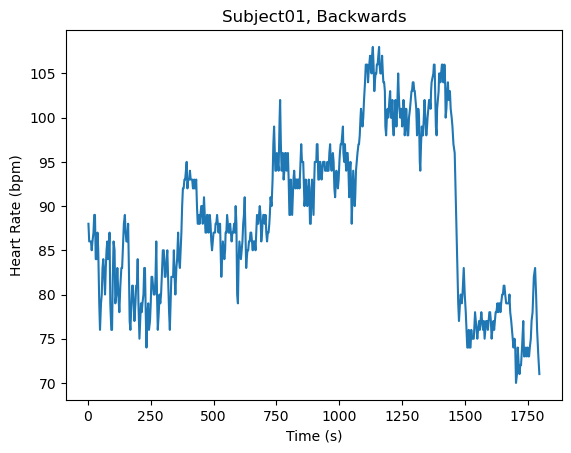

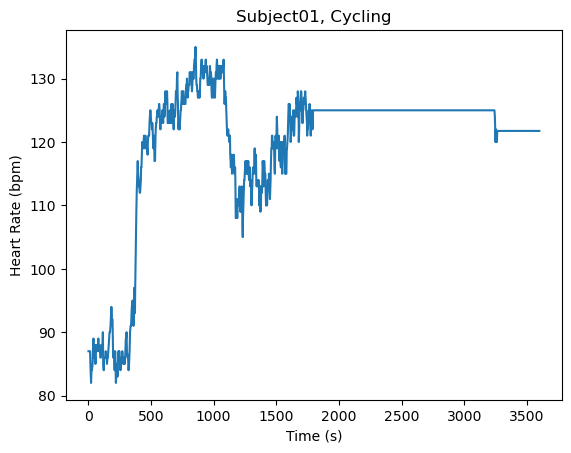

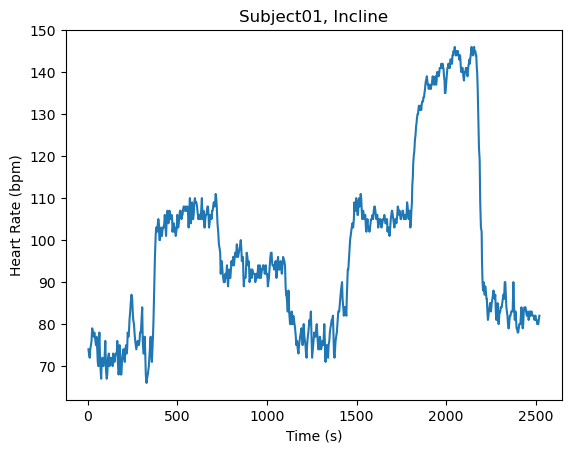

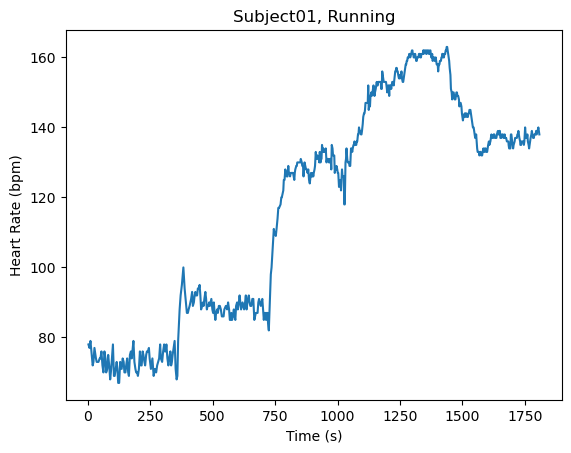

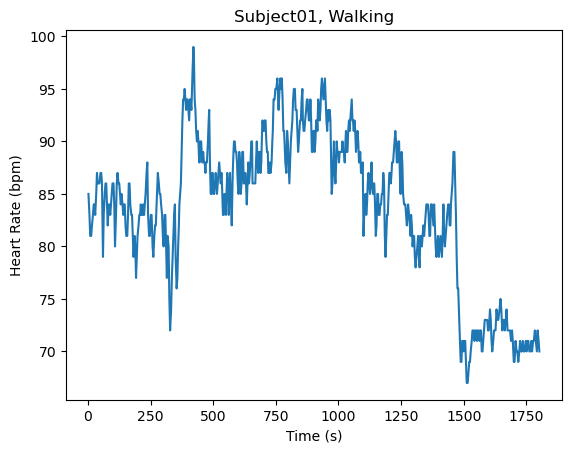

...

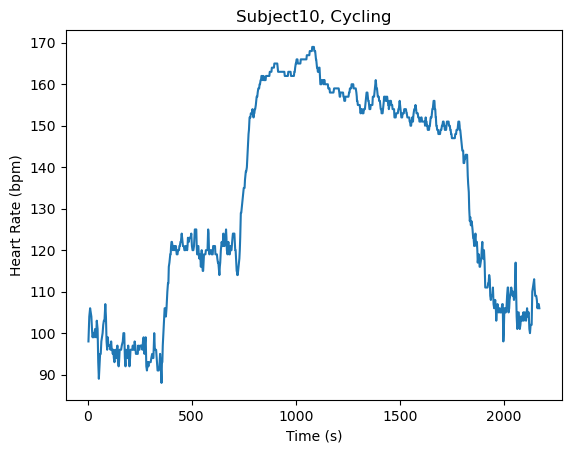

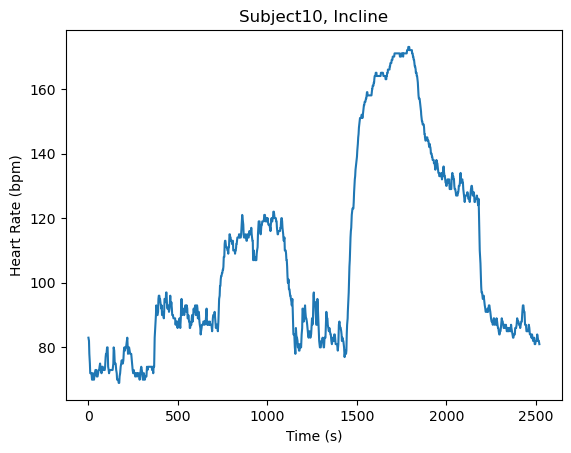

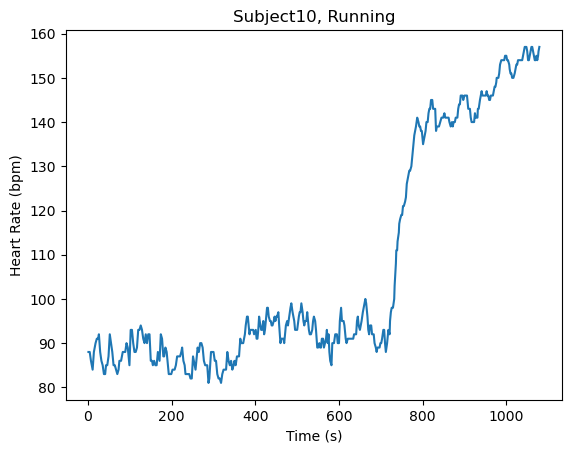

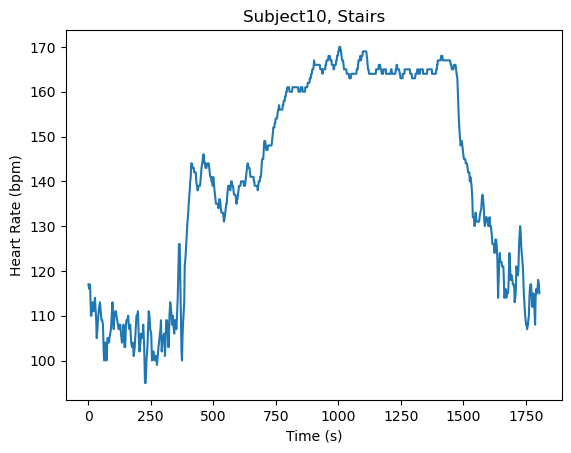

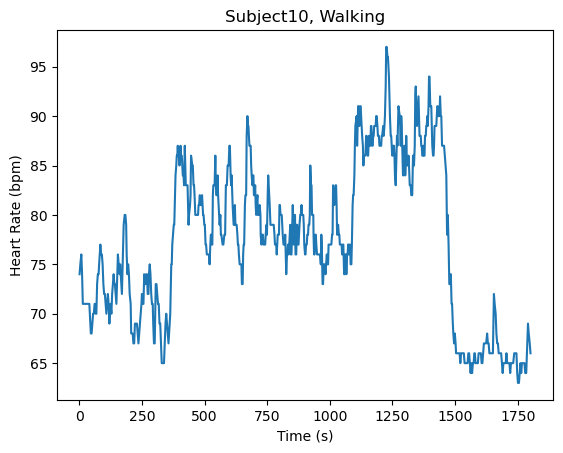

In [26]:
for subject in (result.keys()):
    hr = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, 8]
    plt.plot(result[subject[0]][subject[1]]['Metabolics_System']['Data'][:,time],hr)
    plt.title(subject[0]+ ', '+subject[1])
    plt.xlabel("Time (s)")
    plt.ylabel("Heart Rate (bpm)")
    plt.show()

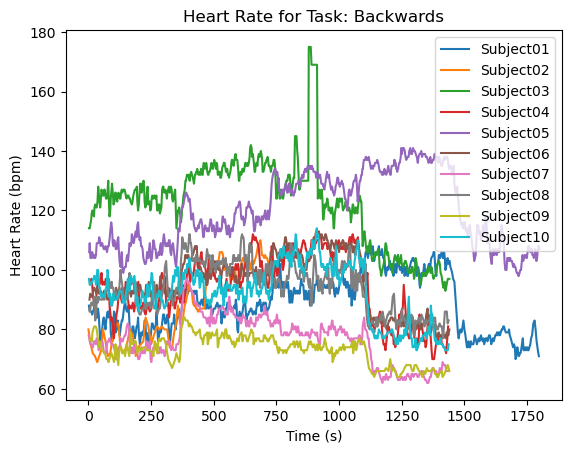

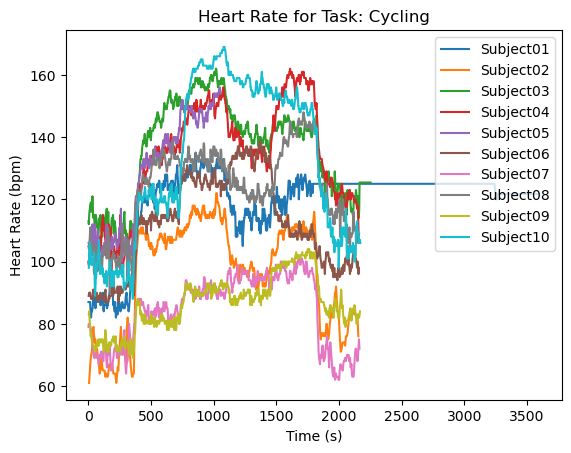

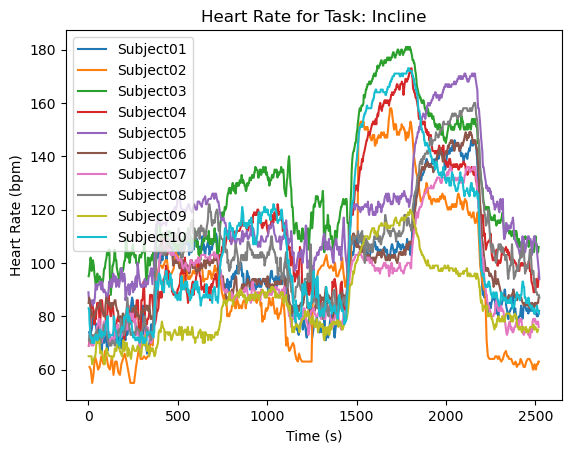

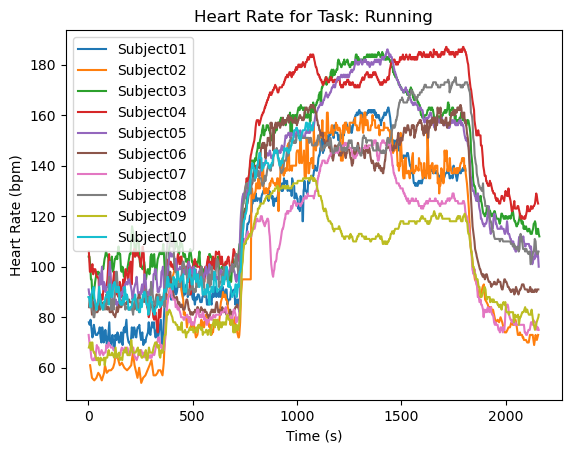

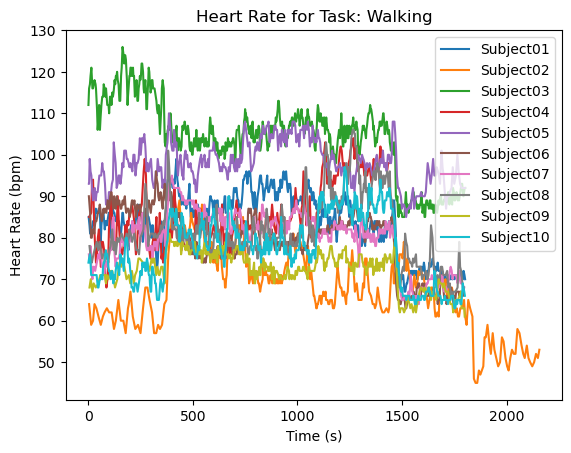

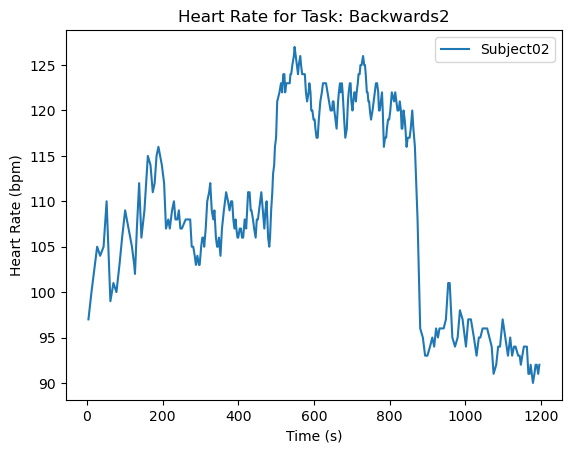

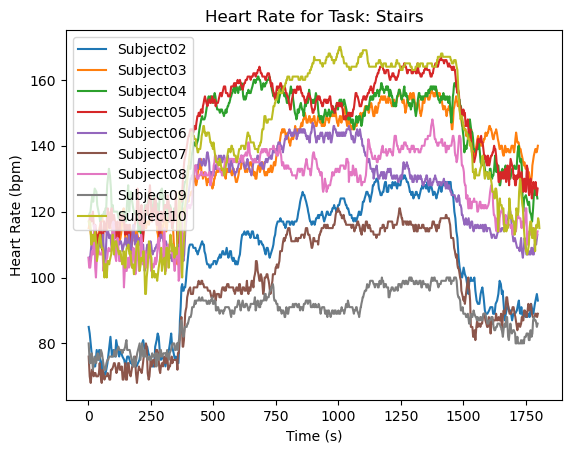

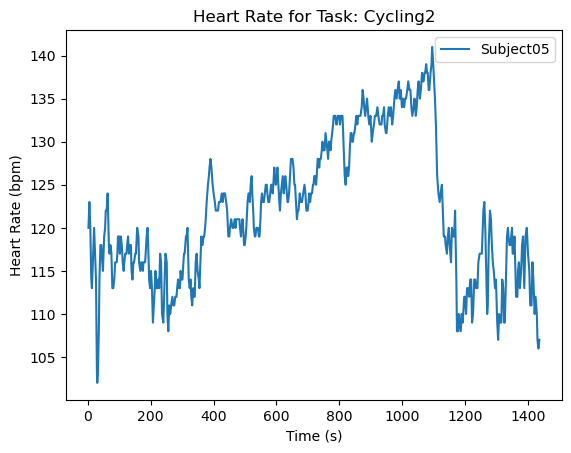

In [27]:
taskData = {}

for subject in result.keys():
    task = subject[1]
    if task not in taskData:
        taskData[task] = []
    
    hr = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, 8]
    time = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, 0]  
    taskData[task].append((subject[0], time, hr))

for task, data in taskData.items():
    plt.figure()
    for subjectName, time, hr in data:
        plt.plot(time, hr, label=subjectName)  
    plt.title(f"Heart Rate for Task: {task}")
    plt.xlabel("Time (s)")
    plt.ylabel("Heart Rate (bpm)")
    plt.legend()  
    plt.show()


In [2]:
indShiftDict = {}

for activity in result.keys():  
    if activity[1] in ['Backwards2', 'Cycling2'] or activity[1] in indShiftDict:
        continue

    ind = result['Subject03'][activity[1]]['Metabolics_System']['Data'][:, code]
    indShift = np.where((ind[:-1] - ind[1:]) != 0)[0]

    indShiftDict[activity[1]] = indShift

# Convert to DataFrame with each activity as a column
indDF = pd.DataFrame(dict([(key, pd.Series(value)) for key, value in indShiftDict.items()]))
indDF = indDF.fillna(0)
print(indDF)


   Backwards  Cycling  Incline  Running  Walking  Stairs
0      129.0    119.0      117    104.0    110.0   129.0
1      276.0    255.0      261    231.0    250.0   283.0
2      419.0    413.0      412    390.0    399.0   455.0
3        0.0    564.0      535    604.0    542.0   640.0
4        0.0    724.0      702    795.0      0.0     0.0
5        0.0      0.0      849      0.0      0.0     0.0


In [10]:
analyzed = set()
dfCount = 1
for subject in result.keys():
    indShiftDict = {}
    if subject[0] in analyzed:
        continue
    analyzed.add(subject[0])
    for activity in result.keys():
    
        if activity[1] in indShiftDict:
            continue
            
        if activity[1] not in result[subject[0]]:
            continue

        ind = result[subject[0]][activity[1]]['APDM_Accel']['Data'][:, code]
        indShift = np.where((ind[:-1] - ind[1:]) != 0)[0]
        
        
        indShiftDict[activity[1]] = indShift / 128

    # Convert to DataFrame for the subject
    indDFKe = pd.DataFrame(dict([(key, pd.Series(value)) for key, value in indShiftDict.items()]))
    indDFKe = indDFKe.fillna(0)
    
    if dfCount <= 10:
        if dfCount < 10:
            exec(f"Subject0{dfCount} = indDFKe")
            dfCount += 1
        else:
            exec(f"Subject{dfCount} = indDFKe")
            dfCount += 1
    
print(Subject01)

     Backwards      Cycling      Incline      Running      Walking
0   360.000000   360.000000   360.000000   360.000000   360.000000
1   720.015625   720.015625   720.015625   720.015625   720.015625
2  1080.031250  1080.031250  1080.031250  1080.031250  1080.031250
3  1440.046875  1440.046875  1440.046875  1440.046875  1440.046875
4     0.000000  1800.062500  1800.062500     0.000000     0.000000
5     0.000000     0.000000  2160.070312     0.000000     0.000000


In [4]:
analyzed = set()
dfCount = 1
for subject in result.keys():
    indShiftDict = {}
    if subject[0] in analyzed:
        continue
    analyzed.add(subject[0])
    for activity in result.keys():
        if activity[1] in ['Backwards2', 'Cycling2'] or activity[1] in indShiftDict:
            continue
            
        if activity[1] not in result[subject[0]]:
            continue

        ind = result[subject[0]][activity[1]]['APDM_Accel']['Data'][:, code]
        indShift = np.where((ind[:-1] - ind[1:]) != 0)[0]
        
        
        indShiftDict[activity[1]] = indShift

    # Convert to DataFrame for the subject
    indDFKe = pd.DataFrame(dict([(key, pd.Series(value)) for key, value in indShiftDict.items()]))
    indDFKe = indDF.fillna(0)
    
    if dfCount <= 10:
        if dfCount < 10:
            exec(f"KeSubject0{dfCount} = indDFKe")
            dfCount += 1
        else:
            exec(f"KeSubject{dfCount} = indDFKe")
            dfCount += 1
    
print(KeSubject04)


   Backwards  Cycling  Incline  Running  Walking  Stairs
0      129.0    119.0      117    104.0    110.0   129.0
1      276.0    255.0      261    231.0    250.0   283.0
2      419.0    413.0      412    390.0    399.0   455.0
3        0.0    564.0      535    604.0    542.0   640.0
4        0.0    724.0      702    795.0      0.0     0.0
5        0.0      0.0      849      0.0      0.0     0.0


Subject01 Backwards
-----------


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


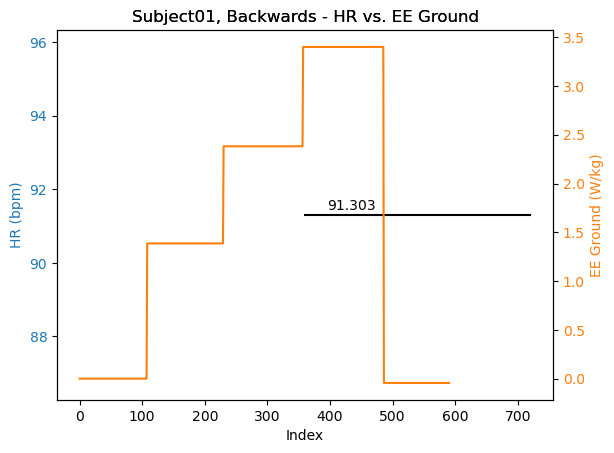

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Subject01 Cycling
-----------


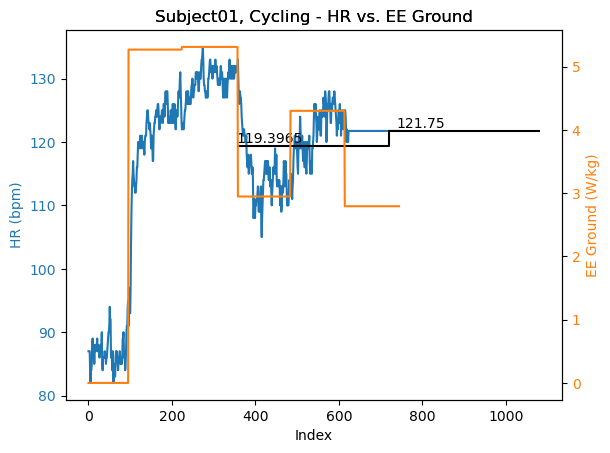

Subject01 Incline
-----------


IndexError: index 2160 is out of bounds for axis 0 with size 806

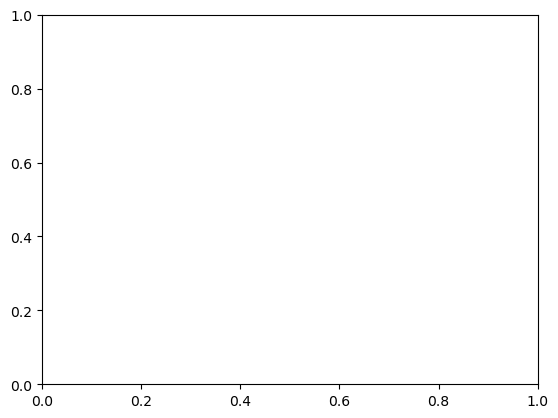

In [31]:
# analyzed = set()
subjectName = []

for subject in (result.keys()):

    hrPoints = []
    eePoints = []
    activity = []
    
    indDF = globals()[subject[0]].astype(int)
    
    # check if subject was already analyzed
    # if subject[0] in analyzed:
    #     continue
    
    if subject[1] in ['Backwards2', 'Cycling2']:
        continue

    print(subject[0] + " " + subject[1] + "\n" + "-----------")
    
    name = subject[0] + subject[1]
    # analyzed.add(subject[0])
    
    hr = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, 8]
    hr_df = pd.DataFrame(hr, columns=['HR'])
    hr_df = hr_df.fillna(0)
    # print(hr_df)
    
    hr1_df = hr_df.iloc[int(indDF[subject[1]][0]):int(indDF[subject[1]][1])]
    # print(hr1_df)
    hr1_mean = round(hr1_df.mean().values[0],4)
    # print(f"KE1: {KE1ar_mean}")

    hr2_df = hr_df.iloc[int(indDF[subject[1]][1]):int(indDF[subject[1]][2])]
    # print(hr2_df)
    hr2_mean = round(hr2_df.mean().values[0],4)
    # print(f"KE2: {KE2ar_mean}")

    hr3_df = hr_df.iloc[int(indDF[subject[1]][2]):int(indDF[subject[1]][3])]
    # print(hr3_df)
    # print(hr3_df)
    hr3_mean = round(hr3_df.mean().values[0],4)
    # print(f"hr3: {hr3_mean}")

    hr4_df = hr_df.iloc[int(indDF[subject[1]][3]):int(indDF[subject[1]][4])]
    hr4_mean = round(hr4_df.mean().values[0],4)
    # print(f"KE3: {KE3ar_mean}")
    
    hr5_df = hr_df.iloc[int(indDF[subject[1]][4]):int(indDF[subject[1]][5])]
    hr5_mean = round(hr5_df.mean().values[0],4)
    # print(f"KE3: {KE3ar_mean}")

    # timeCoords = result['Subject01']['Walking']['Metabolics_System']['Data'][indShift, 0]

    timeF = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:,0]

    zeros = {
        'Switch': [indDF[subject[1]][0],indDF[subject[1]][1],indDF[subject[1]][2],indDF[subject[1]][3],indDF[subject[1]][4],indDF[subject[1]][5]]
    }


    zeros_df = pd.DataFrame(zeros)
    time_slice = timeF[int(indDF[subject[1]][0]):int(indDF[subject[1]][4])]
    hr_slice = hr[0:int(indDF[subject[1]][4])]

    hrPoints.append(hr1_mean)
    subjectName.append(subject[0])
    activity.append(subject[1])
    hrPoints.append(hr2_mean)
    activity.append(subject[1])
    # print(hr2_mean)
    subjectName.append(subject[0])
    hrPoints.append(hr3_mean)
    hrPoints.append(hr4_mean)
    # print(hr4_mean)
    activity.append(subject[1])
    subjectName.append(subject[0])
    hrPoints.append(hr5_mean)
    subjectName.append(subject[0])
    activity.append(subject[1])

    x = [indDF[subject[1]][0],indDF[subject[1]][1],indDF[subject[1]][2],indDF[subject[1]][3],indDF[subject[1]][4]]
    y = [hr1_mean,hr2_mean,hr3_mean,hr4_mean,hr5_mean]

    fig, ax1 = plt.subplots() 

    VO2 = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:,vo2]
    VCO2 = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:,vco2]

    EE = (16.58*VO2 + 4.15*VCO2)/mass[0]
    EE_ground = np.zeros(np.size(EE))

    ind = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:,code]
    ind = ind[0:-1] - ind[1:]
    bool_ind = ind != 0.

    indShift = np.where(bool_ind)[0] # last index for each phase
    indShift = np.concatenate((indShift, [len(ind)]))

    hr_slice_start = result[subject[0]][subject[1]]['Metabolics_System']['Data'][int(indDF[subject[1]][0]), 0]
    hr_slice_end = result[subject[0]][subject[1]]['Metabolics_System']['Data'][int(indDF[subject[1]][5]), 0]
    
    T_first_phase = result[subject[0]][subject[1]]['Metabolics_System']['Data'][indShift[0], 0]
    timeM3_first = T_first_phase - (3 * 60)
    bool_time_first = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, 0] < timeM3_first
    threeMin_first = indShift[0] - np.max(np.where(bool_time_first)[0])

    EE_avg_first = np.mean(EE[indShift[0] - threeMin_first:indShift[0]])
 
    for i in range(len(indShift)):
        T = result[subject[0]][subject[1]]['Metabolics_System']['Data'][indShift[i], 0]
        timeM3 = T - (3 * 60)
        bool_time = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, 0] < timeM3
        threeMin = indShift[i] - np.max(np.where(bool_time)[0])

        if i == 0:
            EE_ground[0:indShift[i]] = np.mean(EE[indShift[i] - threeMin : indShift[i]]) - EE_avg_first
            eePoints.append(round(np.mean(EE[indShift[i] - threeMin : indShift[i]] - EE_avg_first), 4))
        elif i == len(indShift) - 1:
            EE_ground[indShift[i - 1] :] = np.mean(EE[-threeMin:]) - EE_avg_first
            eePoints.append(round(np.mean(EE[-threeMin:] - EE_avg_first), 4))
        else:
            EE_ground[indShift[i - 1] : indShift[i] + 1] = np.mean(EE[indShift[i] - threeMin : indShift[i]])- EE_avg_first
            eePoints.append(round(np.mean(EE[indShift[i] - threeMin : indShift[i]]- EE_avg_first), 4))
    
    eePoints = eePoints[1:6]
    hrPoints = hrPoints[0:5]

    plt.figure(1)

    plt.title(subject[0] + ", " + subject[1] + " - HR vs. EE Ground")

    color = 'tab:blue'
    ax1.set_xlabel('Index') 
    ax1.set_ylabel('HR (bpm)', color = color)
    ax1.plot( hr_slice, color= color)
    ax1.tick_params(axis ='y', labelcolor = color)

    # plt.scatter(timeF[zeros_df['Switch']], [0]*len(zeros_df['Switch']), color='black', marker='o')
    plt.step(x, y, where='post',color='black')
    for i in range(len(x) - 1):
        plt.text(x[i] + 75, y[i] + 0.05, f'{y[i]}', ha='center', va='bottom')
    
    ax2 = ax1.twinx() 

    color = 'tab:orange'
    ax2.set_ylabel('EE Ground (W/kg)', color = color) 
    ax2.plot(EE_ground, '-', label='EE_ground', color= color)
    ax2.tick_params(axis ='y', labelcolor = color) 


    title = subject[0] + ", " + subject[1] + " - HR vs. EE Ground"
    plt.xlabel('time (s)')
    plt.title(title)
    plt.show()


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Subject01 Backwards
-----------
[1.8091, 3.1952, 4.1909, 5.2096, 1.7653]
[91.303, nan, nan, nan, nan]
       HR      EE
0  91.303  3.1952
1     NaN  4.1909
2     NaN  5.2096
3     NaN  1.7653
4     NaN  0.0000
       HR      EE  Index    Subject   Activity
0  91.303  3.1952    360  Subject01  Backwards


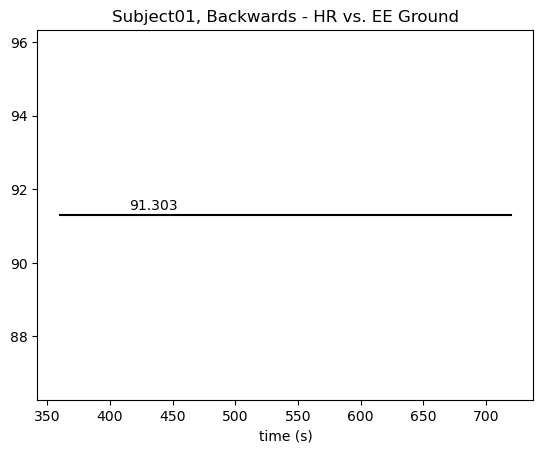

Subject01 Cycling
-----------
[1.3936, 6.6628, 6.7054, 4.3408, 5.695, 4.1868]
[119.3965, 121.75, nan, nan, nan]
         HR      EE
0  119.3965  6.6628
1  121.7500  6.7054
2       NaN  4.3408
3       NaN  5.6950
4       NaN  4.1868
         HR      EE  Index    Subject Activity
0  119.3965  6.6628    360  Subject01  Cycling
1  121.7500  6.7054    720  Subject01  Cycling


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


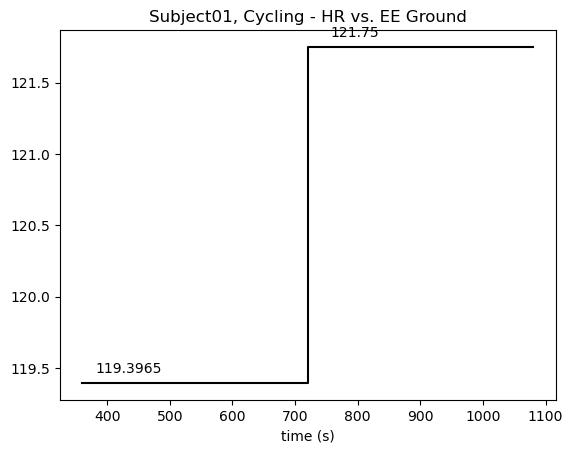

Subject01 Incline
-----------
[5.9697, 3.7258, 4.9841, 8.8961]
[112.1139, 82.7209, nan, nan]
         HR      EE
0  112.1139  5.9697
1   82.7209  3.7258
2       NaN  4.9841
3       NaN  8.8961
         HR      EE  Index    Subject Activity
0  112.1139  5.9697    360  Subject01  Incline
1   82.7209  3.7258    720  Subject01  Incline


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


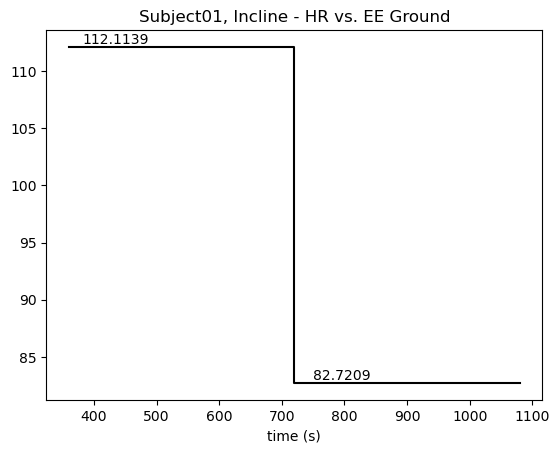

Subject01 Running
-----------
[1.3761, 3.5566, 8.7897, 10.863, 7.8944]
[147.8871, nan, nan, nan, nan]
         HR       EE
0  147.8871   3.5566
1       NaN   8.7897
2       NaN  10.8630
3       NaN   7.8944
4       NaN   0.0000
         HR      EE  Index    Subject Activity
0  147.8871  3.5566    360  Subject01  Running


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


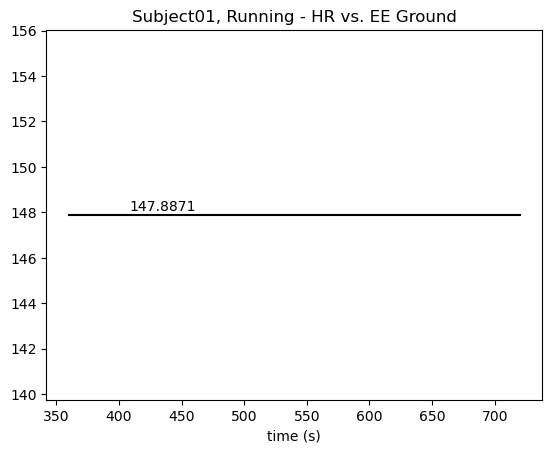

Subject01 Walking
-----------
[1.7996, 3.63, 4.046, 2.7626, 1.4245]
[78.0329, nan, nan, nan, nan]
        HR      EE
0  78.0329  3.6300
1      NaN  4.0460
2      NaN  2.7626
3      NaN  1.4245
4      NaN  0.0000
        HR    EE  Index    Subject Activity
0  78.0329  3.63    360  Subject01  Walking


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


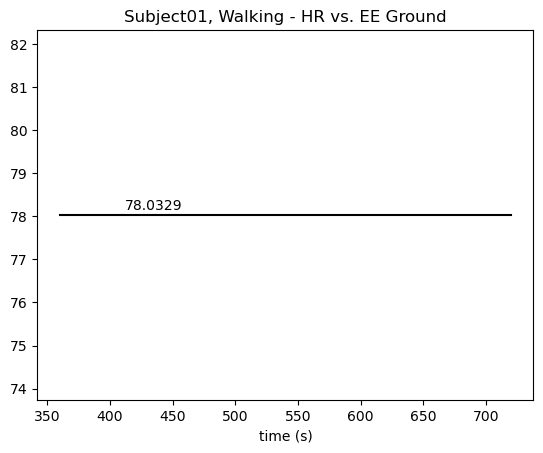

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Subject02 Backwards
-----------
[1.8976, 3.3625]
[nan, nan, nan, nan, nan]
Error in Subject02 Backwards
Subject02 Cycling
-----------
[1.7104, 7.6399, 8.0347, 5.2862, 6.5236, 1.9667]
[98.5799, nan, nan, nan, nan]
        HR      EE
0  98.5799  7.6399
1      NaN  8.0347
2      NaN  5.2862
3      NaN  6.5236
4      NaN  1.9667
        HR      EE  Index    Subject Activity
0  98.5799  7.6399    360  Subject02  Cycling


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


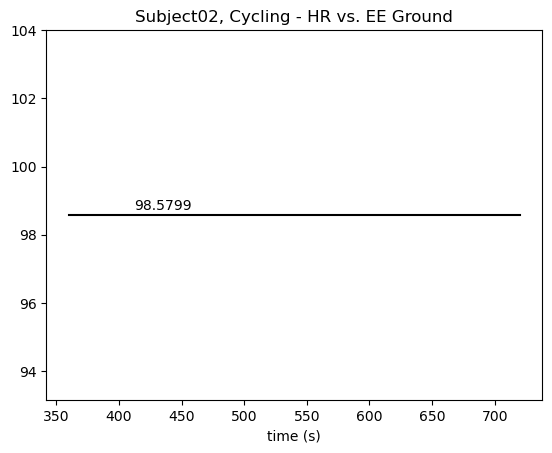

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Subject02 Incline
-----------
[7.261, 4.4787, 11.1656, 6.4281]
[104.2333, nan, nan, nan]
         HR       EE
0  104.2333   7.2610
1       NaN   4.4787
2       NaN  11.1656
3       NaN   6.4281
         HR     EE  Index    Subject Activity
0  104.2333  7.261    360  Subject02  Incline


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


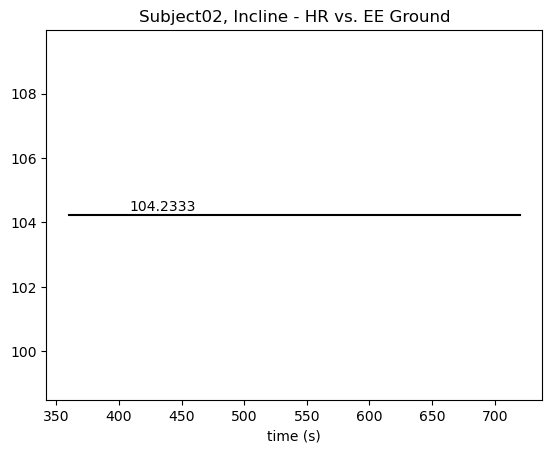

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Subject02 Running
-----------
[1.6727, 4.9483, 11.6463, 15.0143, 11.4007, 1.8973]
[133.3429, nan, nan, nan, nan]
         HR       EE
0  133.3429   4.9483
1       NaN  11.6463
2       NaN  15.0143
3       NaN  11.4007
4       NaN   1.8973
         HR      EE  Index    Subject Activity
0  133.3429  4.9483    360  Subject02  Running


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


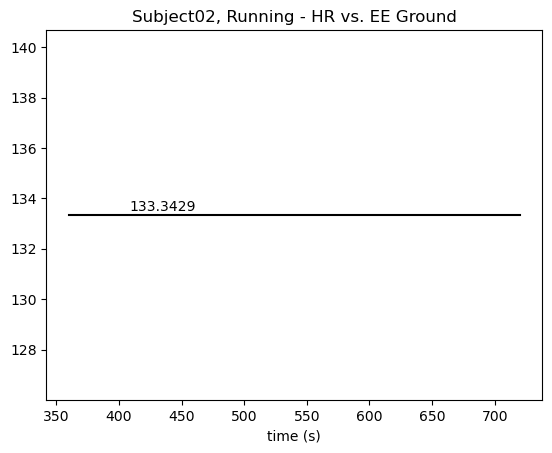

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Subject02 Stairs
-----------
[1.8908, 6.3132, 7.6949, 8.5085, 2.0692]
[106.3276, nan, nan, nan, nan]
         HR      EE
0  106.3276  6.3132
1       NaN  7.6949
2       NaN  8.5085
3       NaN  2.0692
4       NaN  0.0000
         HR      EE  Index    Subject Activity
0  106.3276  6.3132    360  Subject02   Stairs


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


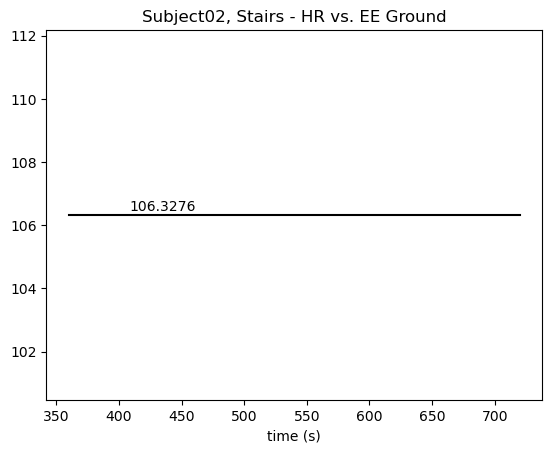

Subject02 Walking
-----------
[1.4591, 5.3628, 4.0042, 1.753, 3.0005, 1.4849]
[54.6111, nan, nan, nan, nan]
        HR      EE
0  54.6111  5.3628
1      NaN  4.0042
2      NaN  1.7530
3      NaN  3.0005
4      NaN  1.4849
        HR      EE  Index    Subject Activity
0  54.6111  5.3628    365  Subject02  Walking


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


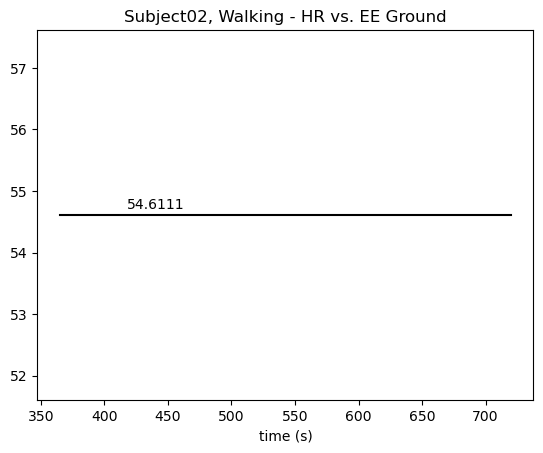

Subject03 Backwards
-----------
[2.1196, 5.0482, 4.0915, 2.2842]
[108.453, nan, nan, nan, nan]
Error in Subject03 Backwards
Subject03 Cycling
-----------
[2.2183, 8.8976, 8.6539, 6.2072, 7.1393, 2.5685]
[145.3056, 125.9606, nan, nan, nan]
         HR      EE
0  145.3056  8.8976
1  125.9606  8.6539
2       NaN  6.2072
3       NaN  7.1393
4       NaN  2.5685
         HR      EE  Index    Subject Activity
0  145.3056  8.8976    360  Subject03  Cycling
1  125.9606  8.6539    720  Subject03  Cycling


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


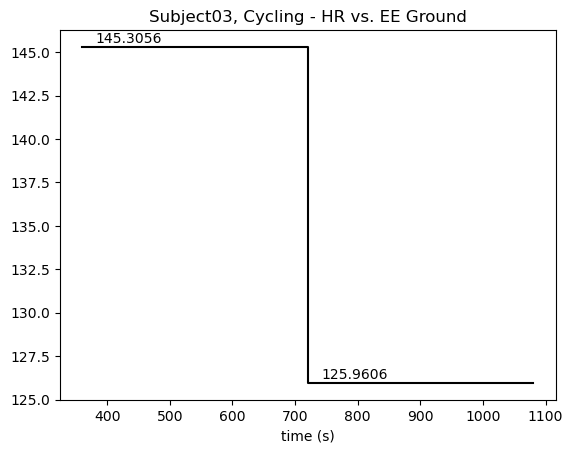

Subject03 Incline
-----------
[5.2451, 7.981, 12.0489, 7.7116]
[145.2556, 135.1383, nan, nan]
         HR       EE
0  145.2556   5.2451
1  135.1383   7.9810
2       NaN  12.0489
3       NaN   7.7116
         HR      EE  Index    Subject Activity
0  145.2556  5.2451    360  Subject03  Incline
1  135.1383  7.9810    720  Subject03  Incline


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


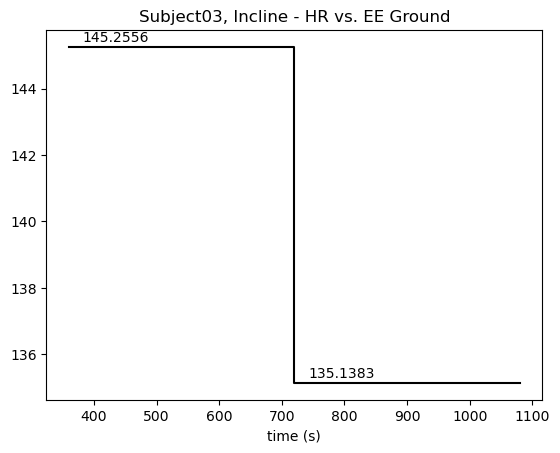

Subject03 Running
-----------
[1.7626, 4.9503, 12.7887, 14.3518, 11.1287, 2.2662]
[174.2222, 137.3252, nan, nan, nan]
         HR       EE
0  174.2222   4.9503
1  137.3252  12.7887
2       NaN  14.3518
3       NaN  11.1287
4       NaN   2.2662
         HR       EE  Index    Subject Activity
0  174.2222   4.9503    360  Subject03  Running
1  137.3252  12.7887    720  Subject03  Running


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


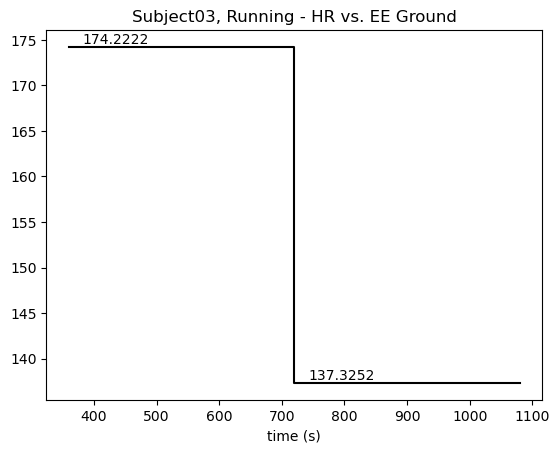

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Subject03 Stairs
-----------
[1.7912, 6.2487, 7.2626, 7.3864, 2.2126]
[137.4432, 147.9808, nan, nan, nan]
         HR      EE
0  137.4432  6.2487
1  147.9808  7.2626
2       NaN  7.3864
3       NaN  2.2126
4       NaN  0.0000
         HR      EE  Index    Subject Activity
0  137.4432  6.2487    112  Subject03   Stairs
1  147.9808  7.2626    473  Subject03   Stairs


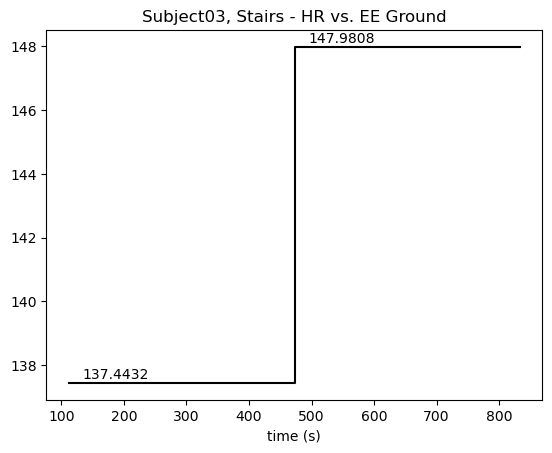

Subject03 Walking
-----------
[1.9784, 3.9545, 5.4013, 4.6608, 1.8583]
[99.862, nan, nan, nan, nan]
       HR      EE
0  99.862  3.9545
1     NaN  5.4013
2     NaN  4.6608
3     NaN  1.8583
4     NaN  0.0000
       HR      EE  Index    Subject Activity
0  99.862  3.9545    360  Subject03  Walking


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


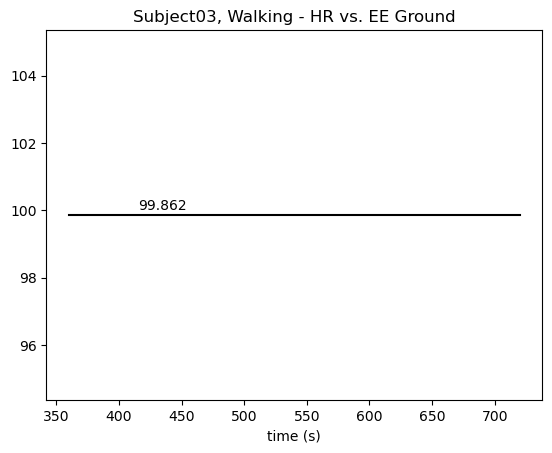

Subject04 Backwards
-----------
[1.9039, 3.1396, 4.0111, 1.8033]
[75.6923, nan, nan, nan, nan]
Error in Subject04 Backwards
Subject04 Cycling
-----------
[2.0521, 6.0083, 7.3796, 5.0692, 7.8313, 2.0782]
[143.8458, nan, nan, nan, nan]
         HR      EE
0  143.8458  6.0083
1       NaN  7.3796
2       NaN  5.0692
3       NaN  7.8313
4       NaN  2.0782
         HR      EE  Index    Subject Activity
0  143.8458  6.0083    360  Subject04  Cycling


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


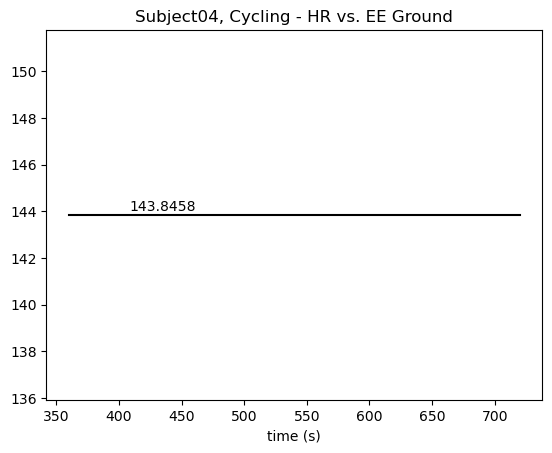

Subject04 Incline
-----------
[4.3149, 7.1399, 12.3153, 7.259]
[133.3624, nan, nan, nan]
         HR       EE
0  133.3624   4.3149
1       NaN   7.1399
2       NaN  12.3153
3       NaN   7.2590
         HR      EE  Index    Subject Activity
0  133.3624  4.3149    360  Subject04  Incline


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


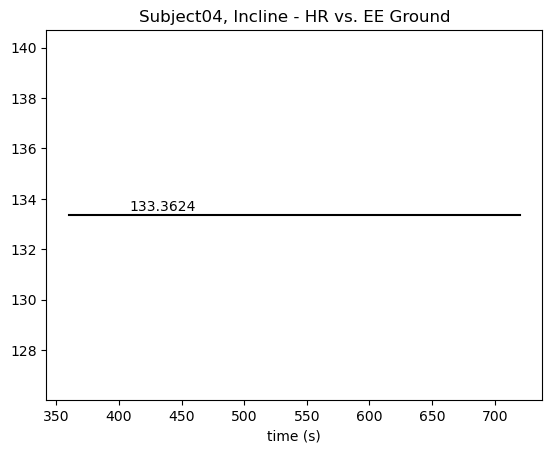

Subject04 Running
-----------
[2.095, 4.2467, 12.3916, 11.1075, 11.9372, 2.4944]
[171.5889, 122.9375, nan, nan, nan]
         HR       EE
0  171.5889   4.2467
1  122.9375  12.3916
2       NaN  11.1075
3       NaN  11.9372
4       NaN   2.4944
         HR       EE  Index    Subject Activity
0  171.5889   4.2467    360  Subject04  Running
1  122.9375  12.3916    720  Subject04  Running


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


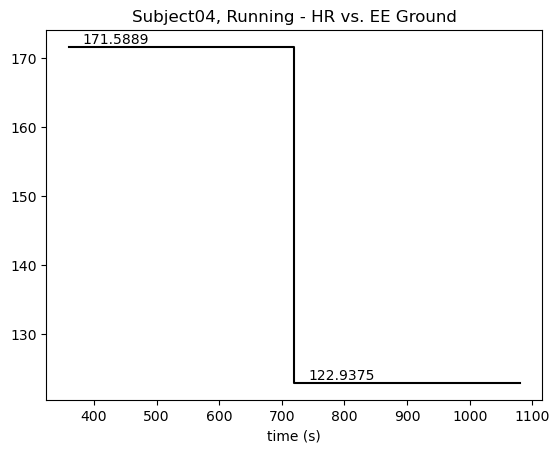

Subject04 Stairs
-----------
[2.0269, 7.9891, 6.6105, 7.4313, 2.3752]
[147.7238, nan, nan, nan, nan]
         HR      EE
0  147.7238  7.9891
1       NaN  6.6105
2       NaN  7.4313
3       NaN  2.3752
4       NaN  0.0000
         HR      EE  Index    Subject Activity
0  147.7238  7.9891    360  Subject04   Stairs


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


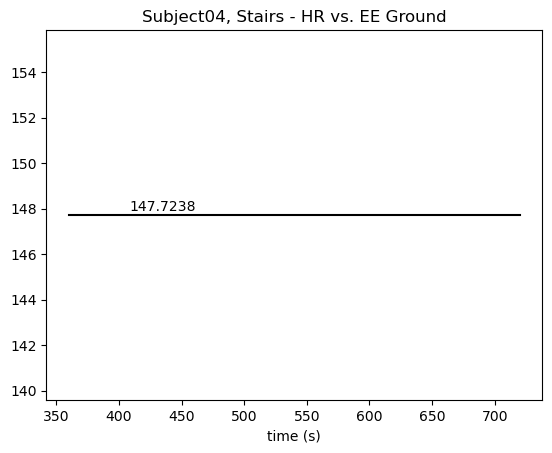

Subject04 Walking
-----------
[1.6656, 3.3314, 2.9984, 4.3313]
[nan, nan, nan, nan, nan]
Error in Subject04 Walking
Subject05 Backwards
-----------
[1.9497, 4.1817, 5.3357, 6.7529, 2.0794]
[123.4765, nan, nan, nan, nan]
         HR      EE
0  123.4765  4.1817
1       NaN  5.3357
2       NaN  6.7529
3       NaN  2.0794
4       NaN  0.0000
         HR      EE  Index    Subject   Activity
0  123.4765  4.1817    360  Subject05  Backwards


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


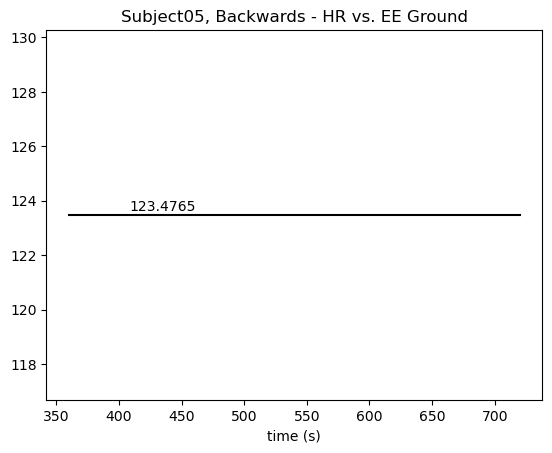

Subject05 Cycling
-----------
[2.182, 8.1211, 8.984]
[153.8333, nan, nan, nan, nan]
Error in Subject05 Cycling
Subject05 Incline
-----------
[7.3123, 4.4475, 6.8968, 12.5138]
[139.5167, 104.75, nan, nan]
         HR       EE
0  139.5167   7.3123
1  104.7500   4.4475
2       NaN   6.8968
3       NaN  12.5138
         HR      EE  Index    Subject Activity
0  139.5167  7.3123    360  Subject05  Incline
1  104.7500  4.4475    720  Subject05  Incline


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


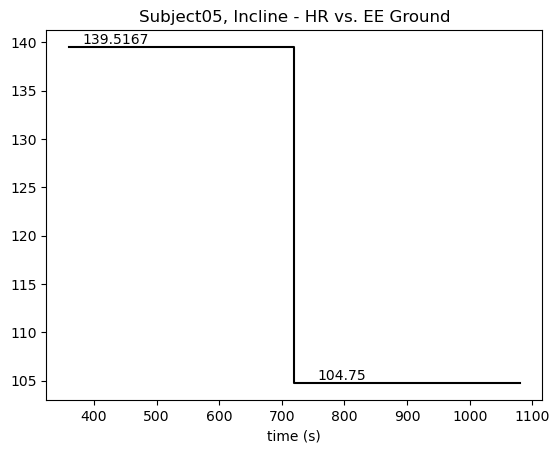

Subject05 Running
-----------
[1.8303, 4.7187, 11.907, 15.0156, 10.6768, 2.3785]
[161.4806, 109.2, nan, nan, nan]
         HR       EE
0  161.4806   4.7187
1  109.2000  11.9070
2       NaN  15.0156
3       NaN  10.6768
4       NaN   2.3785
         HR       EE  Index    Subject Activity
0  161.4806   4.7187    360  Subject05  Running
1  109.2000  11.9070    720  Subject05  Running


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


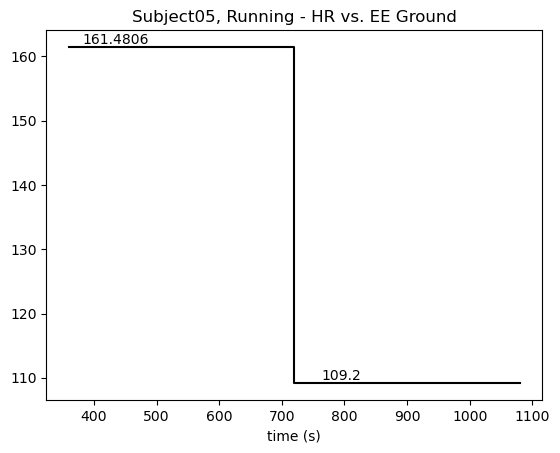

Subject05 Stairs
-----------
[2.0555, 9.7019, 7.5296, 9.2041, 2.2513]
[151.0101, nan, nan, nan, nan]
         HR      EE
0  151.0101  9.7019
1       NaN  7.5296
2       NaN  9.2041
3       NaN  2.2513
4       NaN  0.0000
         HR      EE  Index    Subject Activity
0  151.0101  9.7019    360  Subject05   Stairs


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


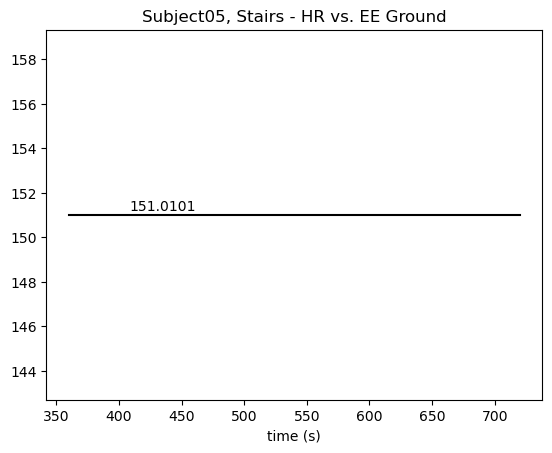

Subject05 Walking
-----------
[1.7194, 4.2698, 4.9502, 3.5529, 1.8605]
[93.5556, nan, nan, nan, nan]
        HR      EE
0  93.5556  4.2698
1      NaN  4.9502
2      NaN  3.5529
3      NaN  1.8605
4      NaN  0.0000
        HR      EE  Index    Subject Activity
0  93.5556  4.2698    360  Subject05  Walking


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


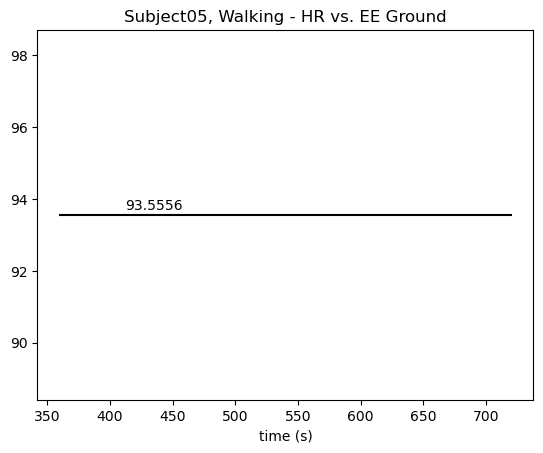

Subject06 Backwards
-----------
[1.8984, 3.789, 5.022, 2.0112]
[89.8252, nan, nan, nan, nan]
Error in Subject06 Backwards
Subject06 Cycling
-----------
[1.5551, 5.6758, 7.4605, 7.831, 4.796, 1.619]
[126.3139, 102.5944, nan, nan, nan]
         HR      EE
0  126.3139  5.6758
1  102.5944  7.4605
2       NaN  7.8310
3       NaN  4.7960
4       NaN  1.6190
         HR      EE  Index    Subject Activity
0  126.3139  5.6758    360  Subject06  Cycling
1  102.5944  7.4605    720  Subject06  Cycling


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


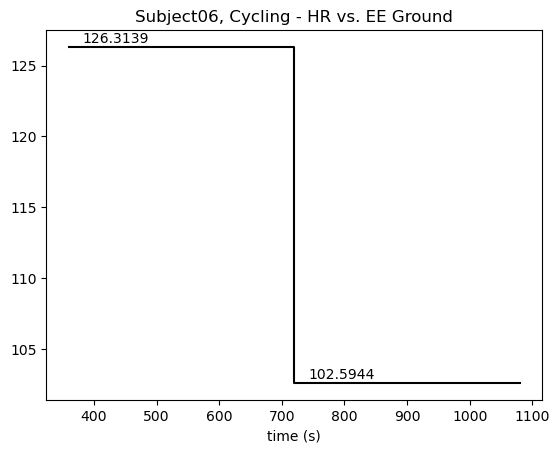

Subject06 Incline
-----------
[6.8758, 4.6155, 6.5666, 11.6073]
[106.8278, 115.2229, nan, nan]
         HR       EE
0  106.8278   6.8758
1  115.2229   4.6155
2       NaN   6.5666
3       NaN  11.6073
         HR      EE  Index    Subject Activity
0  106.8278  6.8758    360  Subject06  Incline
1  115.2229  4.6155    720  Subject06  Incline


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


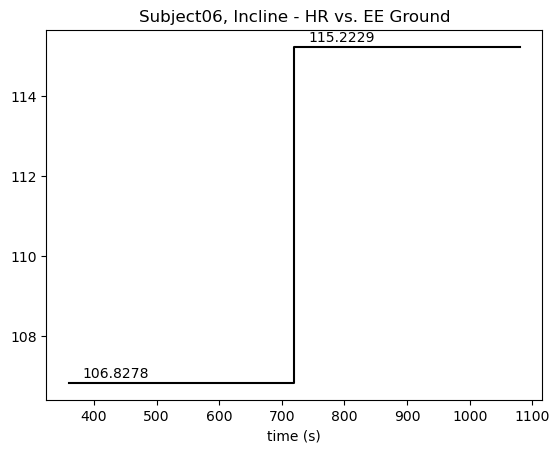

Subject06 Running
-----------
[1.5906, 3.9699, 13.2837, 10.1997, 11.6432, 2.0402]
[150.3444, 136.3106, nan, nan, nan]
         HR       EE
0  150.3444   3.9699
1  136.3106  13.2837
2       NaN  10.1997
3       NaN  11.6432
4       NaN   2.0402
         HR       EE  Index    Subject Activity
0  150.3444   3.9699    360  Subject06  Running
1  136.3106  13.2837    720  Subject06  Running


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


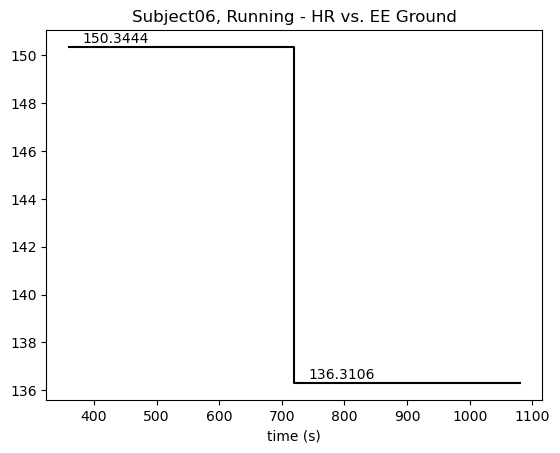

Subject06 Stairs
-----------
[1.8963, 7.3897, 8.2128, 6.4471, 1.9664]
[132.0944, 111.2195, nan, nan, nan]
         HR      EE
0  132.0944  7.3897
1  111.2195  8.2128
2       NaN  6.4471
3       NaN  1.9664
4       NaN  0.0000
         HR      EE  Index    Subject Activity
0  132.0944  7.3897    360  Subject06   Stairs
1  111.2195  8.2128    720  Subject06   Stairs


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


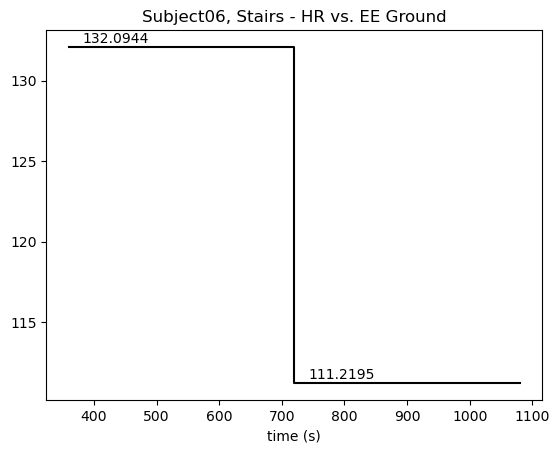

Subject06 Walking
-----------
[1.7615, 3.0115, 3.5619, 4.1238, 1.7959]
[76.9372, nan, nan, nan, nan]
        HR      EE
0  76.9372  3.0115
1      NaN  3.5619
2      NaN  4.1238
3      NaN  1.7959
4      NaN  0.0000
        HR      EE  Index    Subject Activity
0  76.9372  3.0115    360  Subject06  Walking


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


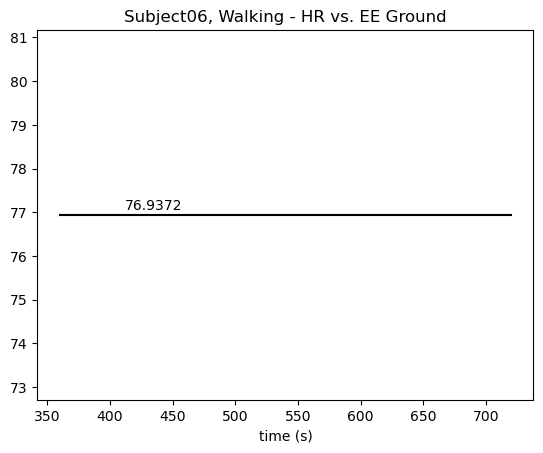

Subject07 Backwards
-----------
[2.4881, 5.0945, 4.1906, 2.1595]
[65.9674, nan, nan, nan, nan]
Error in Subject07 Backwards
Subject07 Cycling
-----------
[1.9537, 4.6177, 6.0555, 7.1042, 7.5429, 2.2144]
[87.2392, nan, nan, nan, nan]
        HR      EE
0  87.2392  4.6177
1      NaN  6.0555
2      NaN  7.1042
3      NaN  7.5429
4      NaN  2.2144
        HR      EE  Index    Subject Activity
0  87.2392  4.6177    360  Subject07  Cycling


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


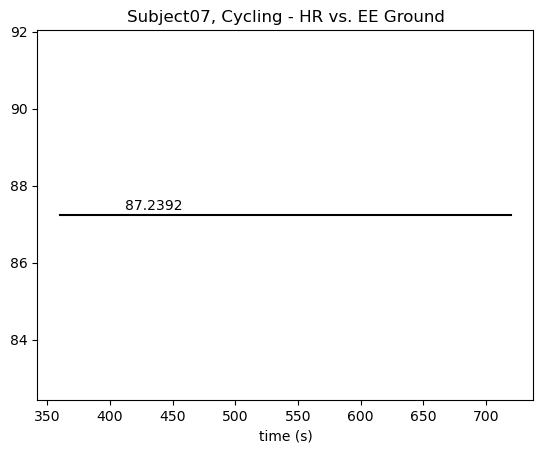

Subject07 Incline
-----------
[9.1247, 6.5603, 8.3926, 14.9008]
[103.375, 97.1736, nan, nan]
         HR       EE
0  103.3750   9.1247
1   97.1736   6.5603
2       NaN   8.3926
3       NaN  14.9008
         HR      EE  Index    Subject Activity
0  103.3750  9.1247    360  Subject07  Incline
1   97.1736  6.5603    720  Subject07  Incline


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


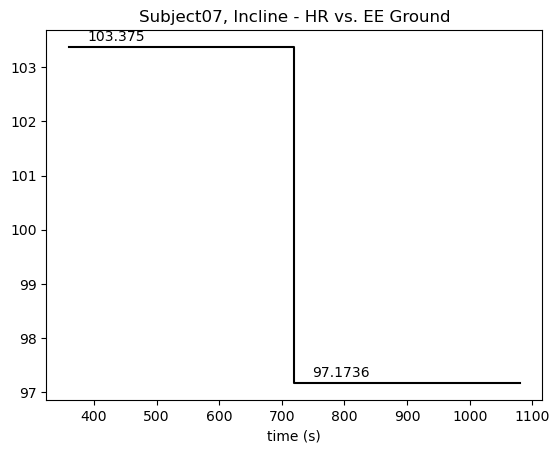

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Subject07 Running
-----------
[1.9536, 5.1145, 12.7643, 16.3884, 11.542, 2.4791]
[138.0139, 94.6214, nan, nan, nan]
         HR       EE
0  138.0139   5.1145
1   94.6214  12.7643
2       NaN  16.3884
3       NaN  11.5420
4       NaN   2.4791
         HR       EE  Index    Subject Activity
0  138.0139   5.1145    360  Subject07  Running
1   94.6214  12.7643    720  Subject07  Running


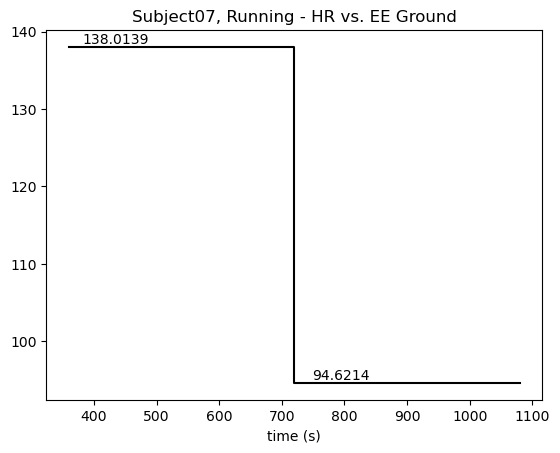

Subject07 Stairs
-----------
[2.2118, 7.9392, 10.4488, 9.6145, 2.5203]
[106.4777, nan, nan, nan, nan]
         HR       EE
0  106.4777   7.9392
1       NaN  10.4488
2       NaN   9.6145
3       NaN   2.5203
4       NaN   0.0000
         HR      EE  Index    Subject Activity
0  106.4777  7.9392    360  Subject07   Stairs


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


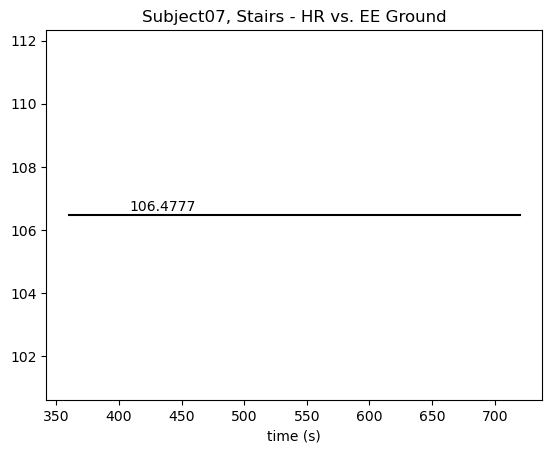

Subject07 Walking
-----------
[2.2816, 5.7577, 5.0277, 4.5312, 2.118]
[74.5031, nan, nan, nan, nan]
        HR      EE
0  74.5031  5.7577
1      NaN  5.0277
2      NaN  4.5312
3      NaN  2.1180
4      NaN  0.0000
        HR      EE  Index    Subject Activity
0  74.5031  5.7577    360  Subject07  Walking


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


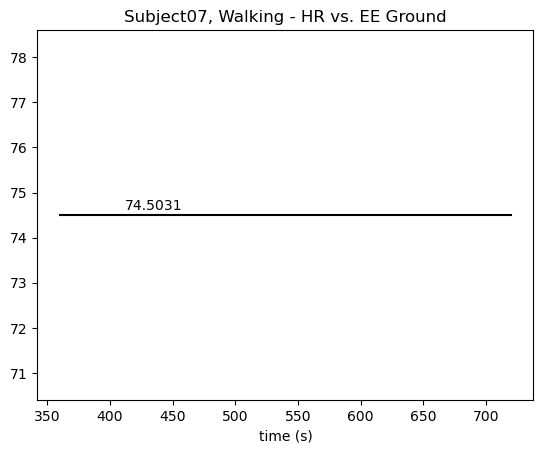

Subject08 Backwards
-----------
[1.2299, 3.4496, 2.8666, 1.4083]
[82.9012, nan, nan, nan, nan]
Error in Subject08 Backwards
Subject08 Cycling
-----------
[1.3902, 6.9196, 5.9109, 4.5505, 7.0039, 1.7207]
[132.0417, 115.2393, nan, nan, nan]
         HR      EE
0  132.0417  6.9196
1  115.2393  5.9109
2       NaN  4.5505
3       NaN  7.0039
4       NaN  1.7207
         HR      EE  Index    Subject Activity
0  132.0417  6.9196    360  Subject08  Cycling
1  115.2393  5.9109    720  Subject08  Cycling


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


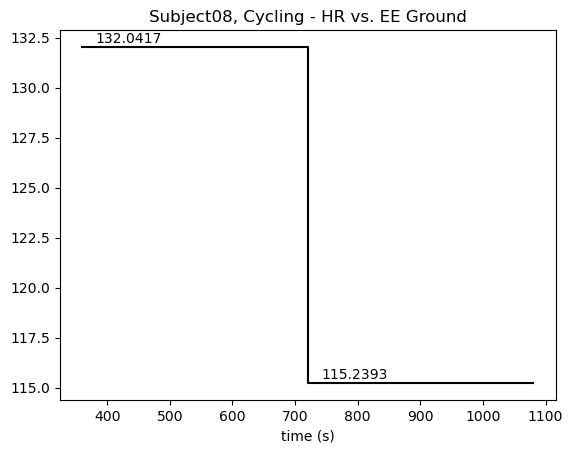

Subject08 Incline
-----------
[6.5522, 4.2456, 5.8967, 10.865]
[115.5, 116.3684, nan, nan]
         HR       EE
0  115.5000   6.5522
1  116.3684   4.2456
2       NaN   5.8967
3       NaN  10.8650
         HR      EE  Index    Subject Activity
0  115.5000  6.5522    360  Subject08  Incline
1  116.3684  4.2456    720  Subject08  Incline


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


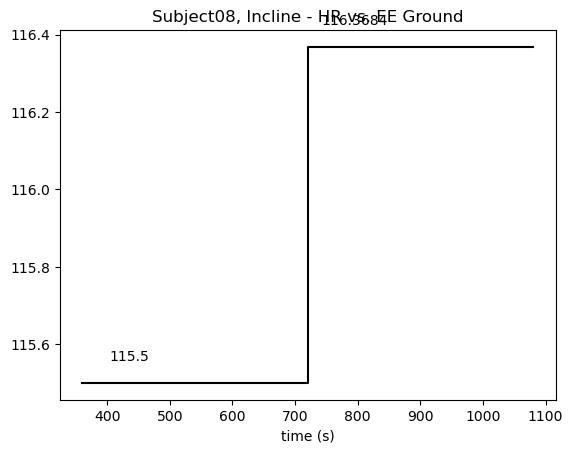

Subject08 Running
-----------
[1.2045, 3.9283, 9.528, 8.4336, 11.7238, 1.9723]
[158.4194, 111.6824, nan, nan, nan]
         HR       EE
0  158.4194   3.9283
1  111.6824   9.5280
2       NaN   8.4336
3       NaN  11.7238
4       NaN   1.9723
         HR      EE  Index    Subject Activity
0  158.4194  3.9283    360  Subject08  Running
1  111.6824  9.5280    720  Subject08  Running


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


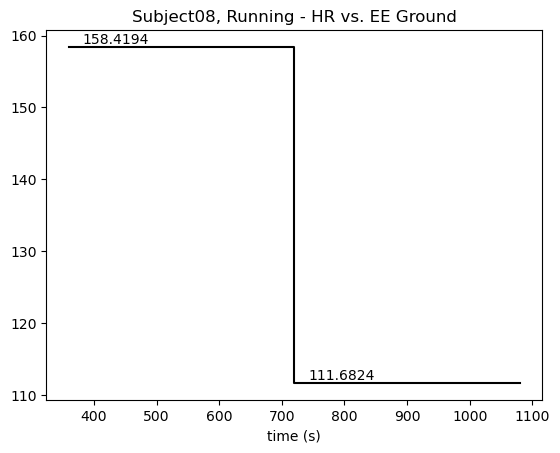

Subject08 Stairs
-----------
[1.3672, 6.2519, 4.9341, 6.0131, 1.5823]
[132.25, 113.8182, nan, nan, nan]
         HR      EE
0  132.2500  6.2519
1  113.8182  4.9341
2       NaN  6.0131
3       NaN  1.5823
4       NaN  0.0000
         HR      EE  Index    Subject Activity
0  132.2500  6.2519    360  Subject08   Stairs
1  113.8182  4.9341    720  Subject08   Stairs


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


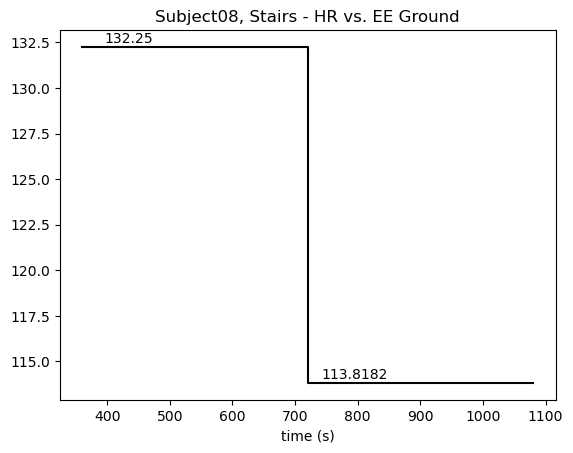

Subject08 Walking
-----------
[1.1652, 3.2363, 2.8149, 4.0479, 1.2772]
[84.7429, nan, nan, nan, nan]
        HR      EE
0  84.7429  3.2363
1      NaN  2.8149
2      NaN  4.0479
3      NaN  1.2772
4      NaN  0.0000
        HR      EE  Index    Subject Activity
0  84.7429  3.2363    360  Subject08  Walking


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


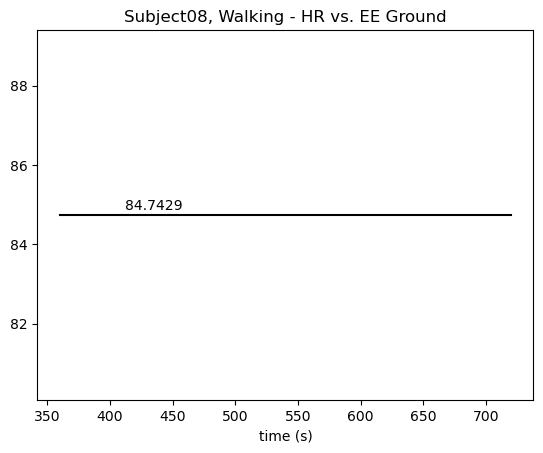

Subject09 Backwards
-----------
[1.2629, 3.8243, 2.9447, 1.2302]
[nan, nan, nan, nan, nan]
Error in Subject09 Backwards
Subject09 Cycling
-----------
[1.4158, 4.5201, 6.9216, 5.9186, 8.011, 1.8419]
[92.9565, nan, nan, nan, nan]
        HR      EE
0  92.9565  4.5201
1      NaN  6.9216
2      NaN  5.9186
3      NaN  8.0110
4      NaN  1.8419
        HR      EE  Index    Subject Activity
0  92.9565  4.5201    360  Subject09  Cycling


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


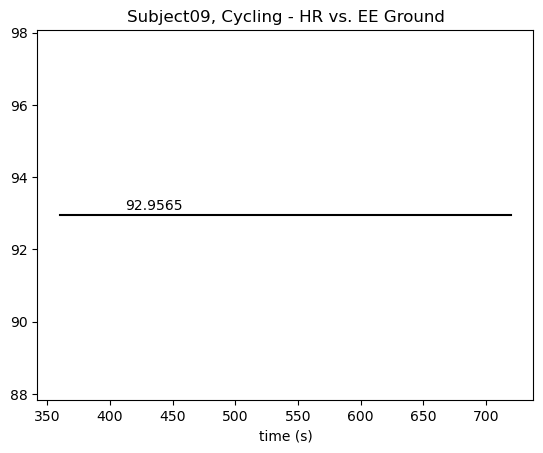

Subject09 Incline
-----------
[4.2514, 7.0758, 11.7969, 6.951]
[96.8758, nan, nan, nan]
        HR       EE
0  96.8758   4.2514
1      NaN   7.0758
2      NaN  11.7969
3      NaN   6.9510
        HR      EE  Index    Subject Activity
0  96.8758  4.2514    360  Subject09  Incline


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


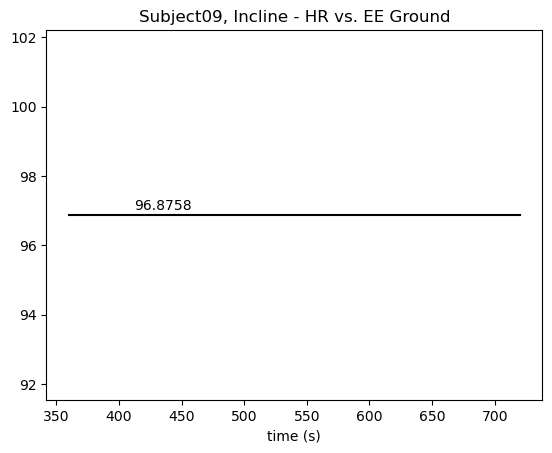

Subject09 Running
-----------
[1.5058, 4.7883, 14.4472, 10.0442, 11.4501, 1.6918]
[117.2167, 92.5351, nan, nan, nan]
         HR       EE
0  117.2167   4.7883
1   92.5351  14.4472
2       NaN  10.0442
3       NaN  11.4501
4       NaN   1.6918
         HR       EE  Index    Subject Activity
0  117.2167   4.7883    360  Subject09  Running
1   92.5351  14.4472    720  Subject09  Running


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


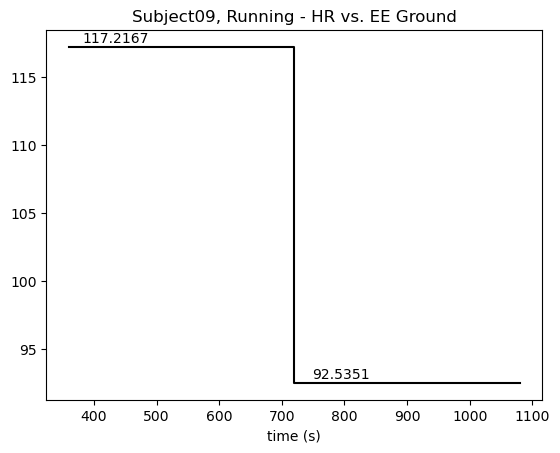

Subject09 Stairs
-----------
[1.8946, 7.2504, 6.5073, 7.9268, 1.9004]
[92.9156, nan, nan, nan, nan]
        HR      EE
0  92.9156  7.2504
1      NaN  6.5073
2      NaN  7.9268
3      NaN  1.9004
4      NaN  0.0000
        HR      EE  Index    Subject Activity
0  92.9156  7.2504    360  Subject09   Stairs


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


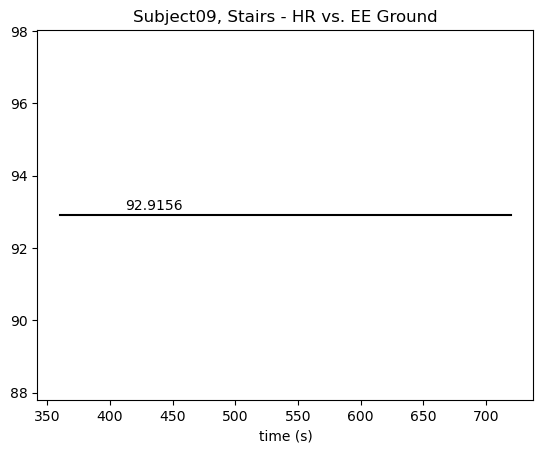

Subject09 Walking
-----------
[1.3811, 4.7709, 3.2371, 3.84, 1.1405]
[66.0606, nan, nan, nan, nan]
        HR      EE
0  66.0606  4.7709
1      NaN  3.2371
2      NaN  3.8400
3      NaN  1.1405
4      NaN  0.0000
        HR      EE  Index    Subject Activity
0  66.0606  4.7709    360  Subject09  Walking


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


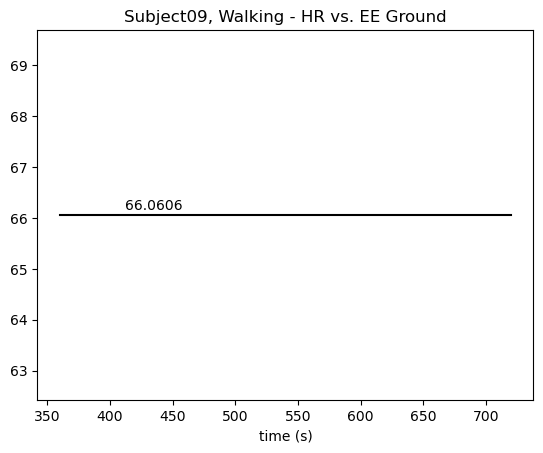

Subject10 Backwards
-----------
[1.8378, 3.2615, 3.7771, 1.4255]
[90.7778, nan, nan, nan, nan]
Error in Subject10 Backwards
Subject10 Cycling
-----------
[1.3515, 4.0536, 6.8619, 6.4584, 5.501, 1.5482]
[158.4556, 127.4935, nan, nan, nan]
         HR      EE
0  158.4556  4.0536
1  127.4935  6.8619
2       NaN  6.4584
3       NaN  5.5010
4       NaN  1.5482
         HR      EE  Index    Subject Activity
0  158.4556  4.0536    360  Subject10  Cycling
1  127.4935  6.8619    720  Subject10  Cycling


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


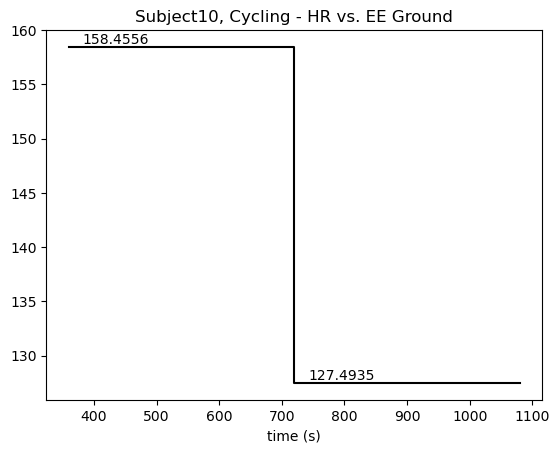

Subject10 Incline
-----------
[3.8785, 6.1761, 10.6468, 5.8683]
[114.3972, 133.0472, nan, nan]
         HR       EE
0  114.3972   3.8785
1  133.0472   6.1761
2       NaN  10.6468
3       NaN   5.8683
         HR      EE  Index    Subject Activity
0  114.3972  3.8785    360  Subject10  Incline
1  133.0472  6.1761    720  Subject10  Incline


posx and posy should be finite values
posx and posy should be finite values


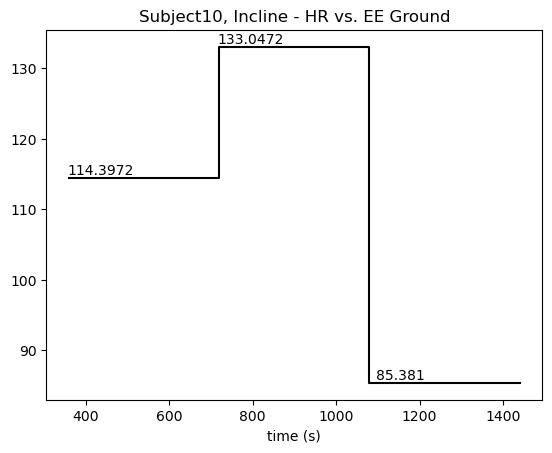

Subject10 Running
-----------
[1.4792, 4.0079, 7.9986]
[150.0909, nan, nan, nan, nan]
Error in Subject10 Running
Subject10 Stairs
-----------
[1.4768, 5.304, 6.9709, 6.4951, 1.7093]
[164.5611, 124.3761, nan, nan, nan]
         HR      EE
0  164.5611  5.3040
1  124.3761  6.9709
2       NaN  6.4951
3       NaN  1.7093
4       NaN  0.0000
         HR      EE  Index    Subject Activity
0  164.5611  5.3040    360  Subject10   Stairs
1  124.3761  6.9709    720  Subject10   Stairs


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


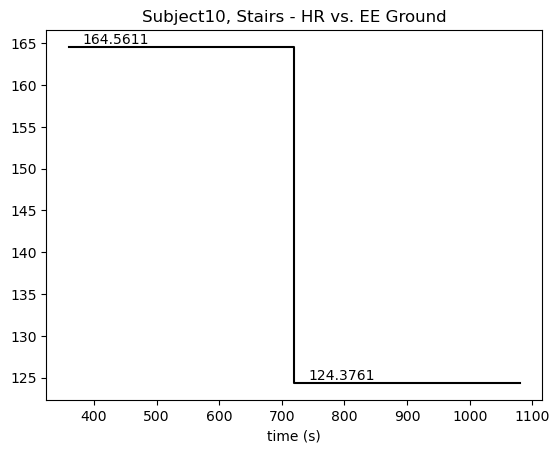

Subject10 Walking
-----------
[1.4775, 3.6034, 3.1835, 4.154, 1.377]
[78.9062, nan, nan, nan, nan]
        HR      EE
0  78.9062  3.6034
1      NaN  3.1835
2      NaN  4.1540
3      NaN  1.3770
4      NaN  0.0000
        HR      EE  Index    Subject Activity
0  78.9062  3.6034    360  Subject10  Walking


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


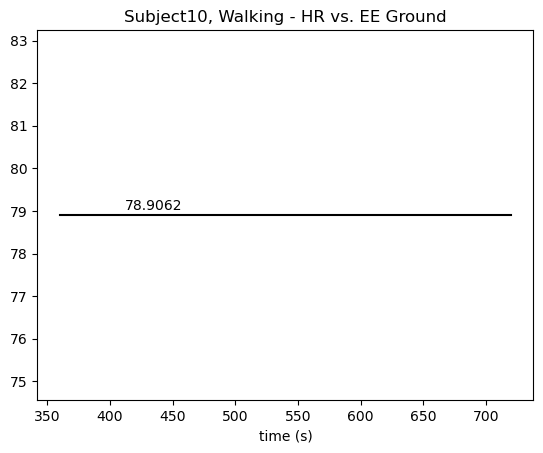

In [32]:
# 6 min averages
df_list = []
for subject in result.keys():
    hrPoints = []
    eePoints = []
    activity = []
    subjectTot = []

    indDF = globals()[subject[0]].astype(int)

    # Skip irrelevant activities
    if subject[1] in ['Backwards2', 'Cycling2']:
        continue

    print(subject[0] + " " + subject[1] + "\n" + "-----------")

    hr = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, 8]
    hr_df = pd.DataFrame(hr, columns=['HR']).fillna(0)

    # Determine the number of intervals dynamically
    num_intervals = len(indDF[subject[1]]) - 1

    # Calculate HR means for each interval
    hr_means = [
        round(hr_df.iloc[int(indDF[subject[1]][i]):int(indDF[subject[1]][i + 1])].mean().values[0], 4)
        for i in range(num_intervals)
    ]

    # Filter steps based on activity
    if subject[1] == 'Incline':
        # Exclude the 3rd interval (index 2) for `Incline`
        # print(hr_means)
        hrPoints = [hr_means[i] for i in range(num_intervals) if i != 2]
    else:
        # Use all intervals for non-incline activities
        hrPoints = hr_means

    # Time indices for plotting
    x = [indDF[subject[1]][i] for i in range(num_intervals)]
    y = hr_means

    # Calculate EE ground values
    VO2 = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, vo2]
    VCO2 = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, vco2]
    EE = (16.58 * VO2 + 4.15 * VCO2) / mass[0]
    EE_ground = np.zeros(np.size(EE))

    ind = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, code]
    ind = ind[:-1] - ind[1:]
    bool_ind = ind != 0.0
    indShift = np.where(bool_ind)[0]  # Last index for each phase
    indShift = np.concatenate((indShift, [len(ind)]))

    for i in range(len(indShift)):
        T = result[subject[0]][subject[1]]['Metabolics_System']['Data'][indShift[i], 0]
        timeM3 = T - (3 * 60)
        bool_time = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, 0] < timeM3
        threeMin = indShift[i] - np.max(np.where(bool_time)[0])

        if i == 0:
            EE_ground[0:indShift[i]] = np.mean(EE[indShift[i] - threeMin : indShift[i]])
            eePoints.append(round(np.mean(EE[indShift[i] - threeMin : indShift[i]]), 4))
        elif i == len(indShift) - 1:
            EE_ground[indShift[i - 1] :] = np.mean(EE[-threeMin:])
            eePoints.append(round(np.mean(EE[-threeMin:]), 4))
        else:
            EE_ground[indShift[i - 1] : indShift[i] + 1] = np.mean(EE[indShift[i] - threeMin : indShift[i]])
            eePoints.append(round(np.mean(EE[indShift[i] - threeMin : indShift[i]]), 4))
    # print(eePoints)
    if subject[1] == 'Incline':
        del eePoints[3]
        eePoints = eePoints[1:-1]
    print(eePoints)
    print(hrPoints)
    if subject[1] != 'Incline':
        eePoints.append(0)
        eePoints = eePoints[1:6]
    if len(eePoints) is not len(hrPoints):
        print("Error in " + subject[0] + " " + subject[1])
        continue
    
    hr_eeDF = pd.DataFrame({'HR': hrPoints, 'EE': eePoints})
    print(hr_eeDF)
    hr_eeDF = hr_eeDF.dropna()
    indPoints = indDF[subject[1]][0:len(hr_eeDF)]
    hr_eeDF['Index'] = indPoints
    for i in range(len(hr_eeDF)):
        activity.append(subject[1])
        subjectTot.append(subject[0])
    hr_eeDF['Subject'] = subjectTot
    hr_eeDF['Activity'] = activity
    print(hr_eeDF)
    df_list.append(hr_eeDF)

    plt.figure(1)

    plt.title(subject[0] + ", " + subject[1] + " - HR vs. EE Ground")

    color = 'tab:blue'
    ax1.set_xlabel('Index') 
    ax1.set_ylabel('HR (bpm)', color = color)
    ax1.plot(hr_eeDF['HR'], color= color)
    ax1.tick_params(axis ='y', labelcolor = color)

    # plt.scatter(timeF[zeros_df['Switch']], [0]*len(zeros_df['Switch']), color='black', marker='o')
    plt.step(x, y, where='post',color='black')
    for i in range(len(x) - 1):
        plt.text(x[i] + 75, y[i] + 0.05, f'{y[i]}', ha='center', va='bottom')
    
    ax2 = ax1.twinx() 

    color = 'tab:orange'
    ax2.set_ylabel('EE Ground (W/kg)', color = color) 
    ax2.plot(hr_eeDF['Index'],hr_eeDF['EE'], color= color)
    ax2.tick_params(axis ='y', labelcolor = color) 


    title = subject[0] + ", " + subject[1] + " - HR vs. EE Ground"
    plt.xlabel('time (s)')
    plt.title(title)
    plt.show()

In [33]:
final_df = pd.concat(df_list, ignore_index=True)
print(final_df)

          HR       EE  Index    Subject   Activity
0    91.3030   3.1952    360  Subject01  Backwards
1   119.3965   6.6628    360  Subject01    Cycling
2   121.7500   6.7054    720  Subject01    Cycling
3   112.1139   5.9697    360  Subject01    Incline
4    82.7209   3.7258    720  Subject01    Incline
5   147.8871   3.5566    360  Subject01    Running
6    78.0329   3.6300    360  Subject01    Walking
7    98.5799   7.6399    360  Subject02    Cycling
8   104.2333   7.2610    360  Subject02    Incline
9   133.3429   4.9483    360  Subject02    Running
10  106.3276   6.3132    360  Subject02     Stairs
11   54.6111   5.3628    365  Subject02    Walking
12  145.3056   8.8976    360  Subject03    Cycling
13  125.9606   8.6539    720  Subject03    Cycling
14  145.2556   5.2451    360  Subject03    Incline
15  135.1383   7.9810    720  Subject03    Incline
16  174.2222   4.9503    360  Subject03    Running
17  137.3252  12.7887    720  Subject03    Running
18  137.4432   6.2487    112  S

R for Subject01: 0.3852280357496367
R for Subject02: 0.002021201194857154
R for Subject03: 0.04100354923300669
R for Subject04: 0.636070035543609
R for Subject05: 0.1243492154513961
R for Subject06: 0.3185710281727426
R for Subject07: 0.07914982786944144
R for Subject08: 0.04463563312226345
R for Subject09: 0.022790054679460093
R for Subject10: 0.2535843655961176


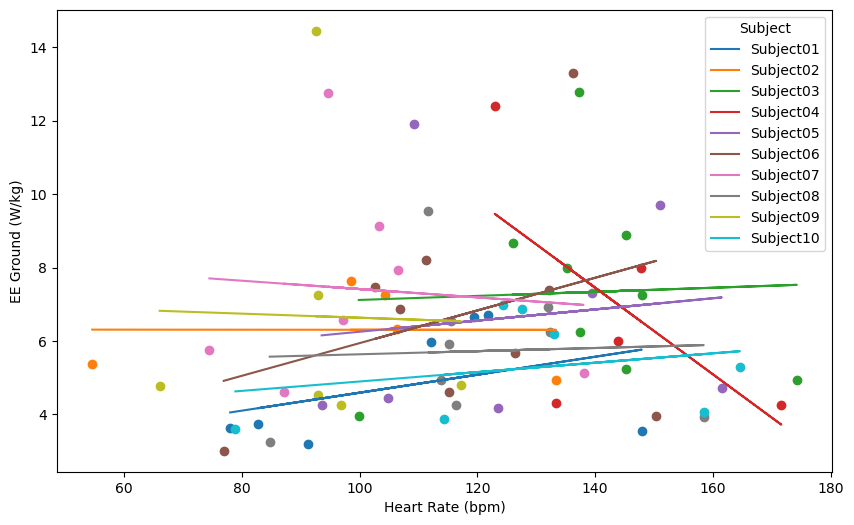

In [34]:
# Create a list of unique subjects
import math
from sklearn.metrics import r2_score

subjects = final_df['Subject'].unique()
final_df = final_df[final_df['EE'] != 0]

# Create the plot
plt.figure(figsize=(10, 6))

# Plot each subject with a line of best fit
for subject in subjects:
    # Filter the data for each subject
    subject_data = final_df[final_df['Subject'] == subject]
    
    # Scatter plot for HR vs EE
    plt.scatter(subject_data['HR'], subject_data['EE'])
    
    # Fit a line (best fit) for the data points
    m, b = np.polyfit(subject_data['HR'], subject_data['EE'], 1)
    y_pred = m * subject_data['HR'] + b
    plt.plot(subject_data['HR'], y_pred, label=subject)
    
    r2 = r2_score(subject_data['EE'], y_pred)
    r = math.sqrt(r2)
    print(f"R for {subject}: {r}")


# Add titles and labels
plt.xlabel('Heart Rate (bpm)')
plt.ylabel('EE Ground (W/kg)')

# Show the legend
plt.legend(title='Subject')

# Show the plot
plt.show()


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Subject01 Backwards
-----------
[0.0, 1.3861, 2.3818, 3.4005, -0.0438]
[76.2745, nan, nan, nan, nan]
        HR      EE
0  76.2745  1.3861
1      NaN  2.3818
2      NaN  3.4005
3      NaN -0.0438
4      NaN  0.0000
        HR      EE  Index    Subject   Activity
0  76.2745  1.3861    360  Subject01  Backwards


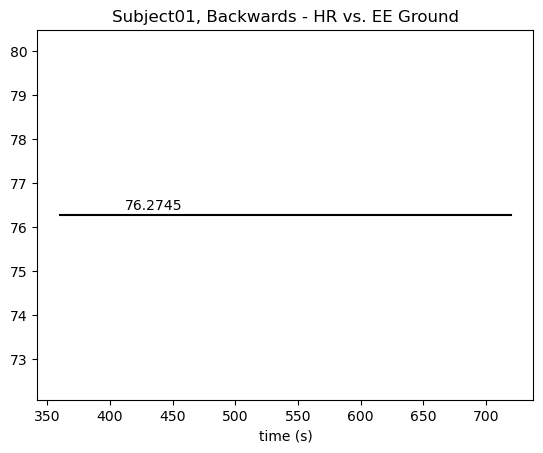

Subject01 Cycling
-----------
[0.0, 5.2693, 5.3118, 2.9473, 4.3014, 2.7933]
[122.8931, nan, nan, nan, nan]
         HR      EE
0  122.8931  5.2693
1       NaN  5.3118
2       NaN  2.9473
3       NaN  4.3014
4       NaN  2.7933
         HR      EE  Index    Subject Activity
0  122.8931  5.2693    360  Subject01  Cycling


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


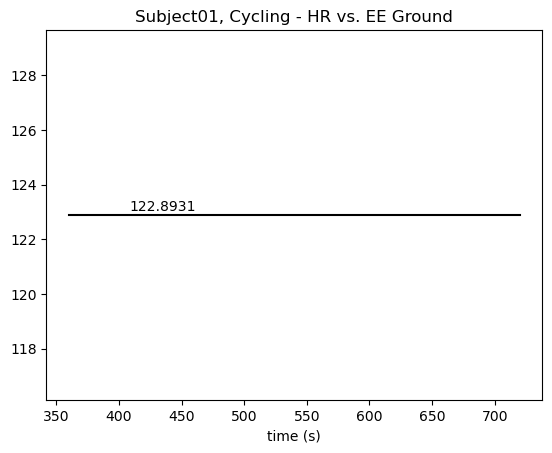

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Subject01 Incline
-----------
[4.3915, 2.1477, 3.406, 7.3179]
[130.4667, nan, nan, nan]
         HR      EE
0  130.4667  4.3915
1       NaN  2.1477
2       NaN  3.4060
3       NaN  7.3179
         HR      EE  Index    Subject Activity
0  130.4667  4.3915    360  Subject01  Incline


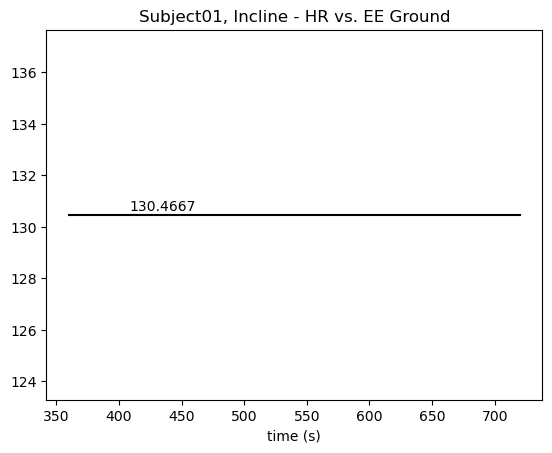

Subject01 Running
-----------
[-0.0, 2.1805, 7.4136, 9.487, 6.5183]
[137.1385, nan, nan, nan, nan]
         HR      EE
0  137.1385  2.1805
1       NaN  7.4136
2       NaN  9.4870
3       NaN  6.5183
4       NaN  0.0000
         HR      EE  Index    Subject Activity
0  137.1385  2.1805    360  Subject01  Running


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


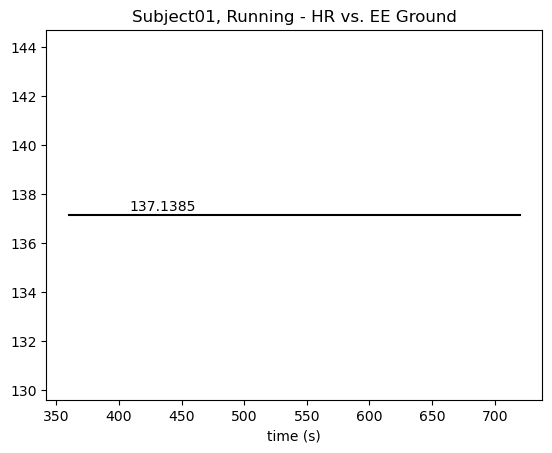

Subject01 Walking
-----------
[0.0, 1.8304, 2.2464, 0.9629, -0.3751]
[70.5455, nan, nan, nan, nan]
        HR      EE
0  70.5455  1.8304
1      NaN  2.2464
2      NaN  0.9629
3      NaN -0.3751
4      NaN  0.0000
        HR      EE  Index    Subject Activity
0  70.5455  1.8304    360  Subject01  Walking


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


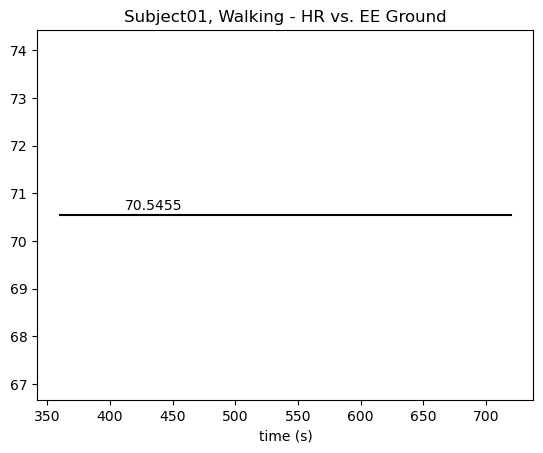

Subject02 Cycling
-----------
[0.0, 5.9295, 6.3243, 3.5758, 4.8132, 0.2563]
[nan, nan, nan, nan, nan]
   HR      EE
0 NaN  5.9295
1 NaN  6.3243
2 NaN  3.5758
3 NaN  4.8132
4 NaN  0.2563
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


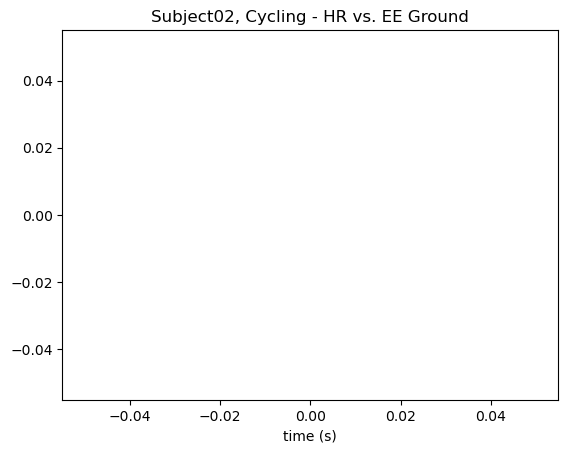

Subject02 Incline
-----------
[5.7172, 2.9349, 9.6217, 4.8842]
[nan, nan, nan, nan]
   HR      EE
0 NaN  5.7172
1 NaN  2.9349
2 NaN  9.6217
3 NaN  4.8842
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


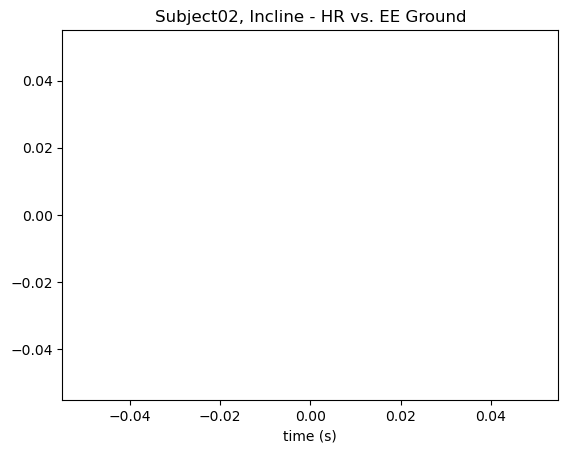

Subject02 Running
-----------
[0.0, 3.2756, 9.9736, 13.3416, 9.7279, 0.2245]
[111.7197, nan, nan, nan, nan]
         HR       EE
0  111.7197   3.2756
1       NaN   9.9736
2       NaN  13.3416
3       NaN   9.7279
4       NaN   0.2245
         HR      EE  Index    Subject Activity
0  111.7197  3.2756    360  Subject02  Running


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


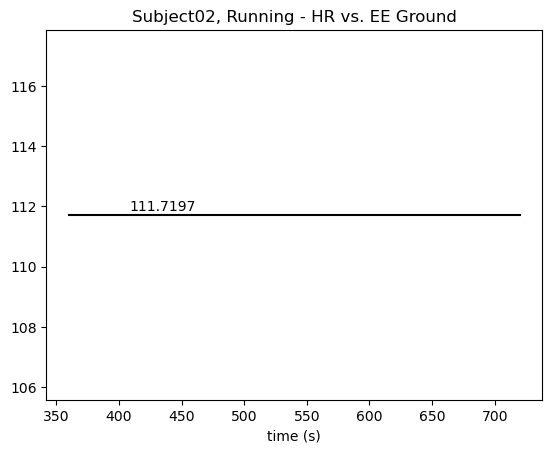

Subject02 Stairs
-----------
[-0.0, 4.4224, 5.8041, 6.6176, 0.1784]
[nan, nan, nan, nan, nan]
   HR      EE
0 NaN  4.4224
1 NaN  5.8041
2 NaN  6.6176
3 NaN  0.1784
4 NaN  0.0000
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


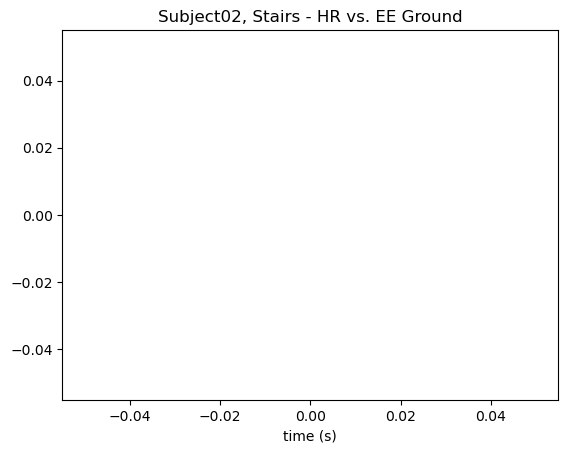

Subject02 Walking
-----------
[0.0, 3.9037, 2.5451, 0.2939, 1.5413, 0.0257]
[nan, nan, nan, nan, nan]
   HR      EE
0 NaN  3.9037
1 NaN  2.5451
2 NaN  0.2939
3 NaN  1.5413
4 NaN  0.0257
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


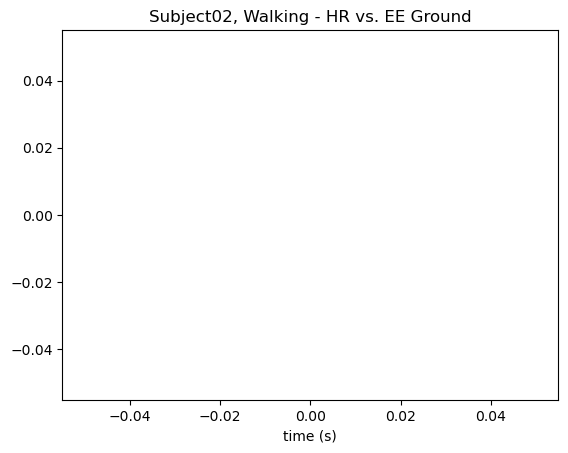

Subject03 Backwards
-----------
[-0.0, 2.9285, 1.9719, 0.1645]
[97.0, nan, nan, nan, nan]
ERROR
     HR      EE
0  97.0  2.9285
1   NaN  1.9719
2   NaN  0.1645
3   NaN  0.0000
4   NaN  0.0000
     HR      EE  Index    Subject   Activity
0  97.0  2.9285    360  Subject03  Backwards


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


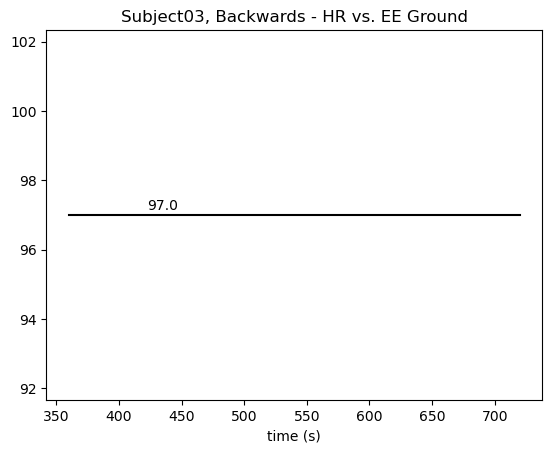

Subject03 Cycling
-----------
[-0.0, 6.6793, 6.4356, 3.9889, 4.921, 0.3502]
[142.3278, nan, nan, nan, nan]
         HR      EE
0  142.3278  6.6793
1       NaN  6.4356
2       NaN  3.9889
3       NaN  4.9210
4       NaN  0.3502
         HR      EE  Index    Subject Activity
0  142.3278  6.6793    360  Subject03  Cycling


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


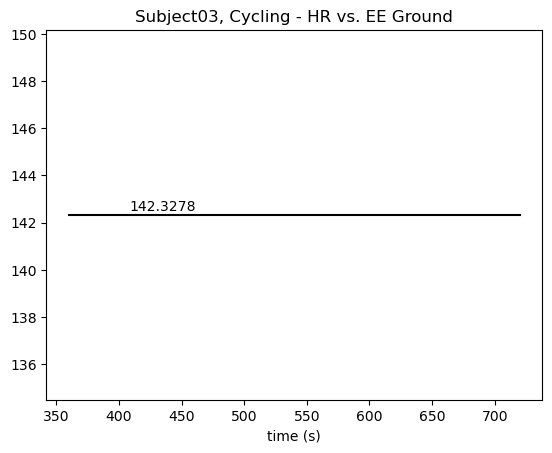

Subject03 Incline
-----------
[3.4757, 6.2116, 10.2795, 5.9422]
[168.0778, 109.6301, nan, nan]
         HR       EE
0  168.0778   3.4757
1  109.6301   6.2116
2       NaN  10.2795
3       NaN   5.9422
         HR      EE  Index    Subject Activity
0  168.0778  3.4757    360  Subject03  Incline
1  109.6301  6.2116    720  Subject03  Incline


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


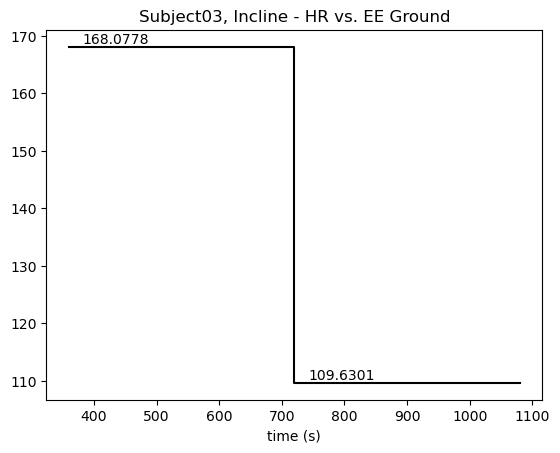

Subject03 Running
-----------
[-0.0, 3.1877, 11.0262, 12.5893, 9.3661, 0.5036]
[173.75, 114.6923, nan, nan, nan]
         HR       EE
0  173.7500   3.1877
1  114.6923  11.0262
2       NaN  12.5893
3       NaN   9.3661
4       NaN   0.5036
         HR       EE  Index    Subject Activity
0  173.7500   3.1877    360  Subject03  Running
1  114.6923  11.0262    720  Subject03  Running


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


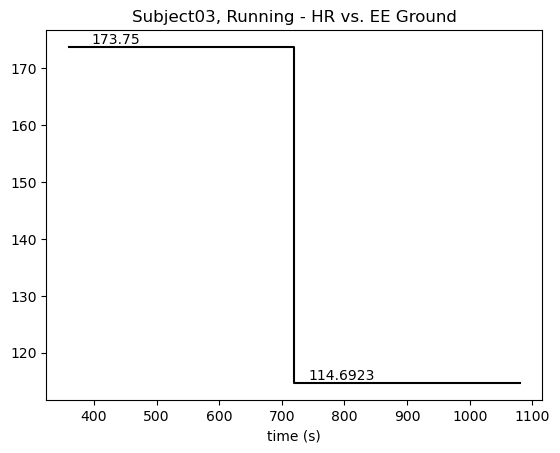

Subject03 Stairs
-----------
[-0.0, 4.4575, 5.4713, 5.5952, 0.4213]
[146.2928, 140.9173, nan, nan, nan]
         HR      EE
0  146.2928  4.4575
1  140.9173  5.4713
2       NaN  5.5952
3       NaN  0.4213
4       NaN  0.0000
         HR      EE  Index    Subject Activity
0  146.2928  4.4575    112  Subject03   Stairs
1  140.9173  5.4713    473  Subject03   Stairs


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


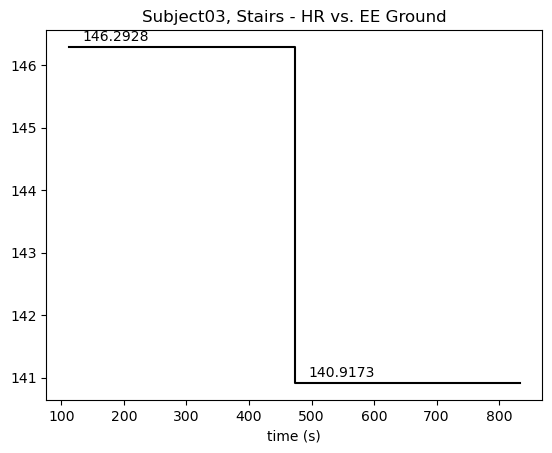

Subject03 Walking
-----------
[0.0, 1.9761, 3.4229, 2.6824, -0.1201]
[90.094, nan, nan, nan, nan]
       HR      EE
0  90.094  1.9761
1     NaN  3.4229
2     NaN  2.6824
3     NaN -0.1201
4     NaN  0.0000
       HR      EE  Index    Subject Activity
0  90.094  1.9761    360  Subject03  Walking


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


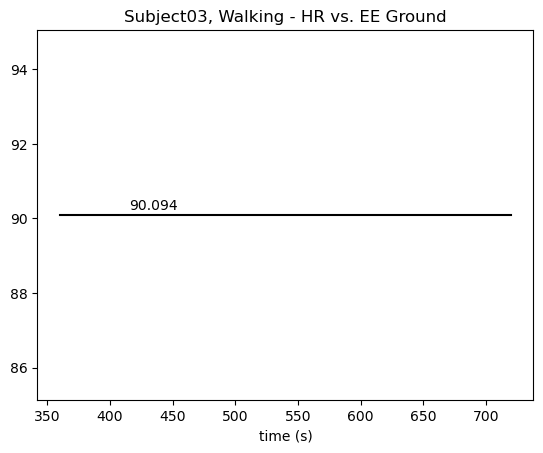

Subject04 Backwards
-----------
[0.0, 1.2357, 2.1072, -0.1007]
[nan, nan, nan, nan, nan]
ERROR
   HR      EE
0 NaN  1.2357
1 NaN  2.1072
2 NaN -0.1007
3 NaN  0.0000
4 NaN  0.0000
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


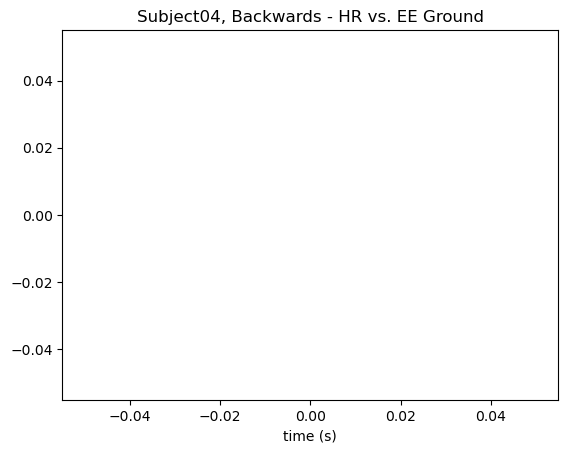

Subject04 Cycling
-----------
[-0.0, 3.9562, 5.3276, 3.0171, 5.7793, 0.0261]
[125.45, nan, nan, nan, nan]
       HR      EE
0  125.45  3.9562
1     NaN  5.3276
2     NaN  3.0171
3     NaN  5.7793
4     NaN  0.0261
       HR      EE  Index    Subject Activity
0  125.45  3.9562    360  Subject04  Cycling


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


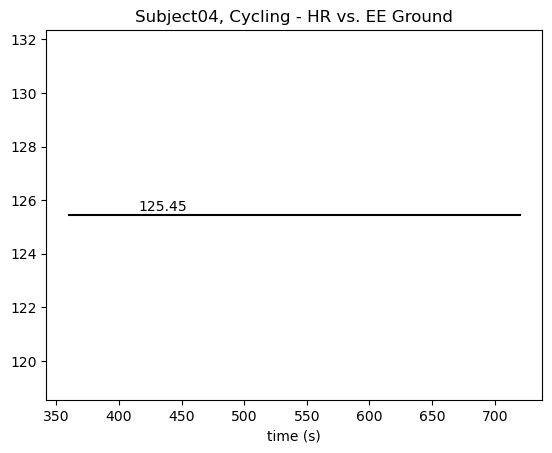

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Subject04 Incline
-----------
[2.5002, 5.3252, 10.5005, 5.4443]
[121.2443, nan, nan, nan]
         HR       EE
0  121.2443   2.5002
1       NaN   5.3252
2       NaN  10.5005
3       NaN   5.4443
         HR      EE  Index    Subject Activity
0  121.2443  2.5002    360  Subject04  Incline


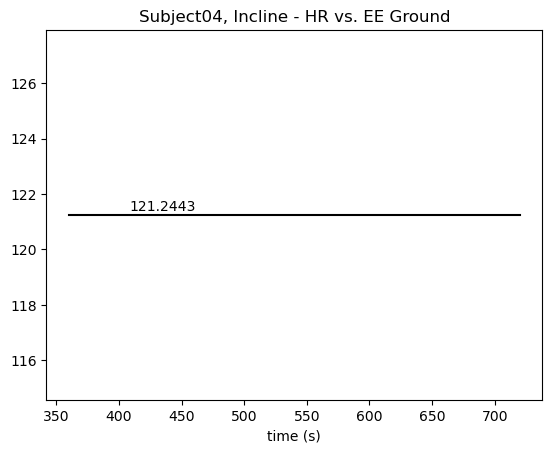

Subject04 Running
-----------
[-0.0, 2.1518, 10.2966, 9.0126, 9.8422, 0.3995]
[165.9, nan, nan, nan, nan]
      HR       EE
0  165.9   2.1518
1    NaN  10.2966
2    NaN   9.0126
3    NaN   9.8422
4    NaN   0.3995
      HR      EE  Index    Subject Activity
0  165.9  2.1518    360  Subject04  Running


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


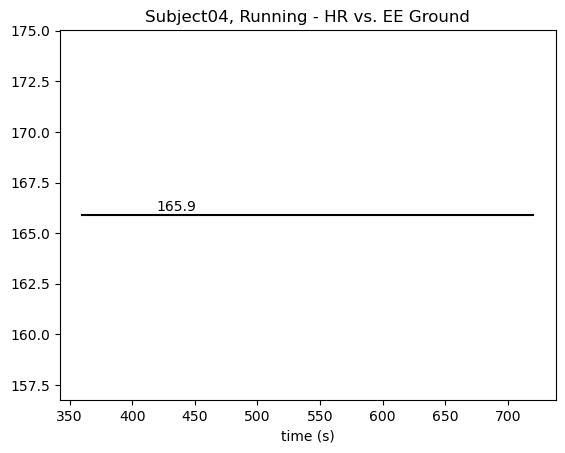

Subject04 Stairs
-----------
[0.0, 5.9622, 4.5836, 5.4044, 0.3483]
[135.8868, nan, nan, nan, nan]
         HR      EE
0  135.8868  5.9622
1       NaN  4.5836
2       NaN  5.4044
3       NaN  0.3483
4       NaN  0.0000
         HR      EE  Index    Subject Activity
0  135.8868  5.9622    360  Subject04   Stairs


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


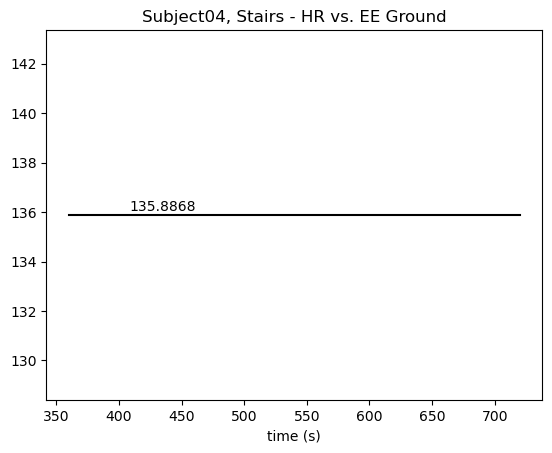

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Subject04 Walking
-----------
[0.0, 1.6658, 1.3328, 2.6658]
[nan, nan, nan, nan, nan]
ERROR
   HR      EE
0 NaN  1.6658
1 NaN  1.3328
2 NaN  2.6658
3 NaN  0.0000
4 NaN  0.0000
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


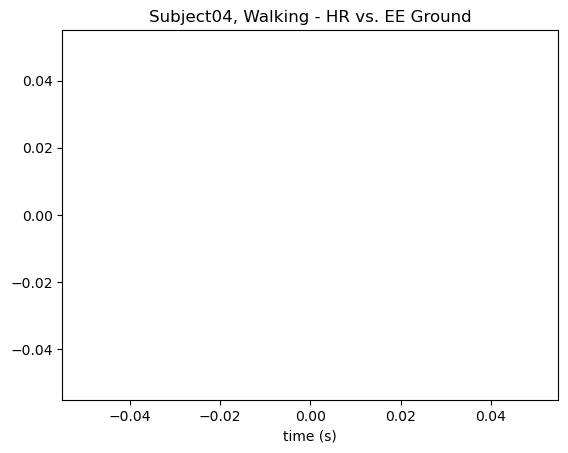

Subject05 Backwards
-----------
[0.0, 2.232, 3.386, 4.8032, 0.1297]
[112.9062, nan, nan, nan, nan]
         HR      EE
0  112.9062  2.2320
1       NaN  3.3860
2       NaN  4.8032
3       NaN  0.1297
4       NaN  0.0000
         HR     EE  Index    Subject   Activity
0  112.9062  2.232    360  Subject05  Backwards


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


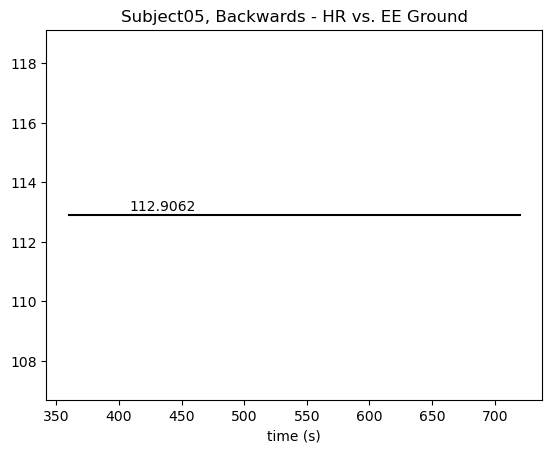

Subject05 Incline
-----------
[5.6088, 2.744, 5.1934, 10.8103]
[138.0556, nan, nan, nan]
         HR       EE
0  138.0556   5.6088
1       NaN   2.7440
2       NaN   5.1934
3       NaN  10.8103
         HR      EE  Index    Subject Activity
0  138.0556  5.6088    360  Subject05  Incline


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


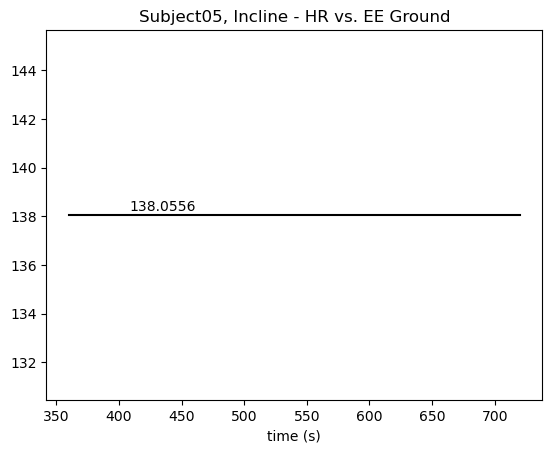

Subject05 Running
-----------
[0.0, 2.8884, 10.0767, 13.1853, 8.8465, 0.5482]
[145.8167, nan, nan, nan, nan]
         HR       EE
0  145.8167   2.8884
1       NaN  10.0767
2       NaN  13.1853
3       NaN   8.8465
4       NaN   0.5482
         HR      EE  Index    Subject Activity
0  145.8167  2.8884    360  Subject05  Running


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


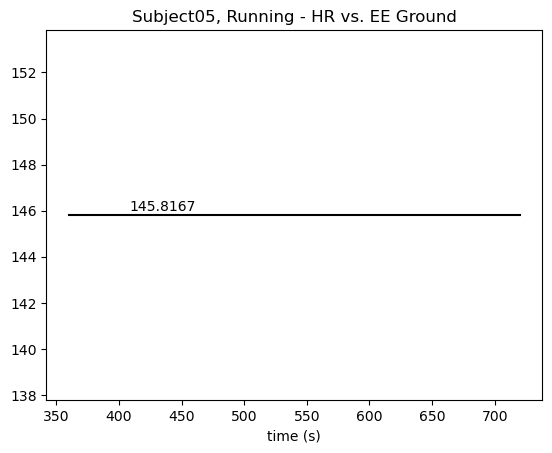

Subject05 Stairs
-----------
[-0.0, 7.6464, 5.4741, 7.1485, 0.1958]
[137.4872, nan, nan, nan, nan]
         HR      EE
0  137.4872  7.6464
1       NaN  5.4741
2       NaN  7.1485
3       NaN  0.1958
4       NaN  0.0000
         HR      EE  Index    Subject Activity
0  137.4872  7.6464    360  Subject05   Stairs


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


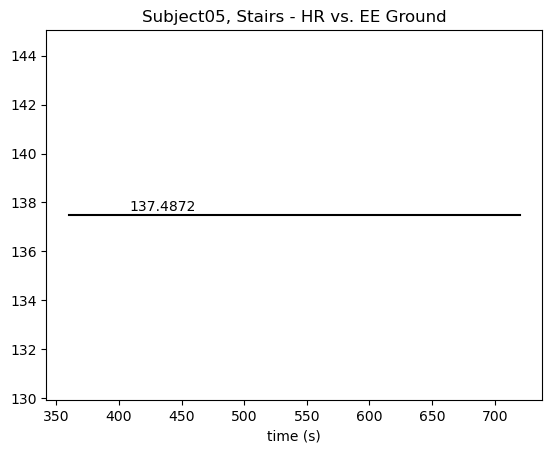

Subject05 Walking
-----------
[-0.0, 2.5504, 3.2308, 1.8335, 0.1411]
[nan, nan, nan, nan, nan]
   HR      EE
0 NaN  2.5504
1 NaN  3.2308
2 NaN  1.8335
3 NaN  0.1411
4 NaN  0.0000
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


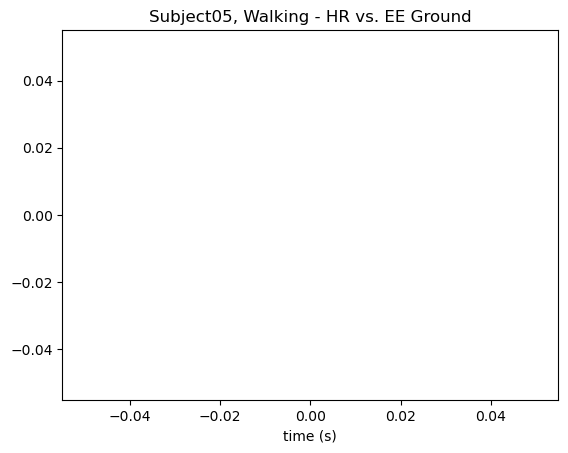

Subject06 Backwards
-----------
[-0.0, 1.8906, 3.1236, 0.1128]
[nan, nan, nan, nan, nan]
ERROR
   HR      EE
0 NaN  1.8906
1 NaN  3.1236
2 NaN  0.1128
3 NaN  0.0000
4 NaN  0.0000
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


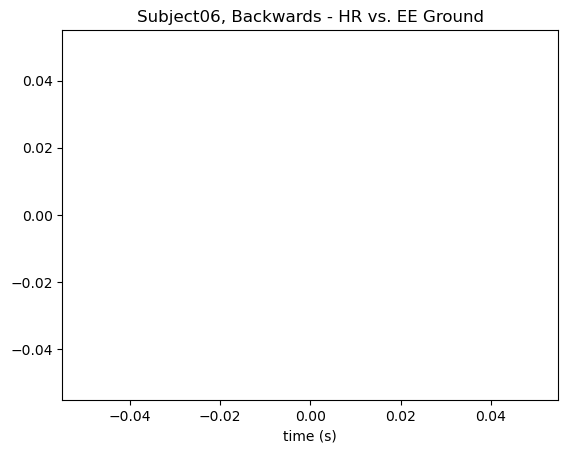

Subject06 Cycling
-----------
[0.0, 4.1207, 5.9055, 6.2759, 3.2409, 0.0639]
[122.95, nan, nan, nan, nan]
       HR      EE
0  122.95  4.1207
1     NaN  5.9055
2     NaN  6.2759
3     NaN  3.2409
4     NaN  0.0639
       HR      EE  Index    Subject Activity
0  122.95  4.1207    360  Subject06  Cycling


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


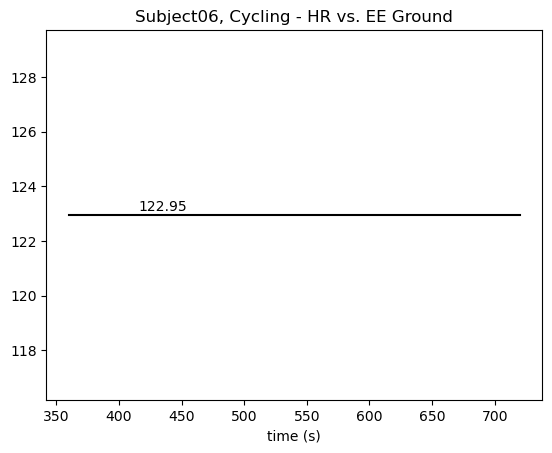

Subject06 Incline
-----------
[5.0706, 2.8103, 4.7614, 9.8021]
[121.2556, nan, nan, nan]
         HR      EE
0  121.2556  5.0706
1       NaN  2.8103
2       NaN  4.7614
3       NaN  9.8021
         HR      EE  Index    Subject Activity
0  121.2556  5.0706    360  Subject06  Incline


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


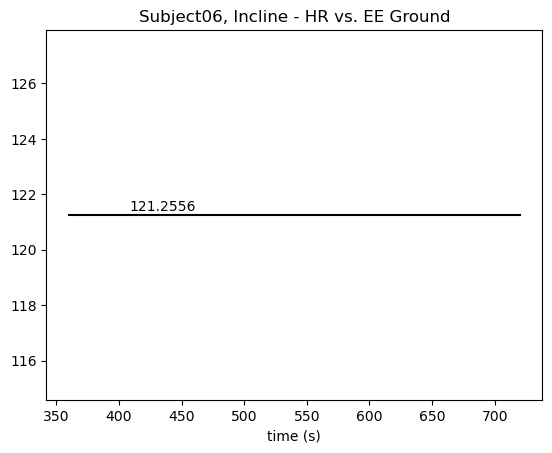

Subject06 Running
-----------
[0.0, 2.3792, 11.693, 8.6091, 10.0526, 0.4496]
[145.9389, 102.3097, nan, nan, nan]
         HR       EE
0  145.9389   2.3792
1  102.3097  11.6930
2       NaN   8.6091
3       NaN  10.0526
4       NaN   0.4496
         HR       EE  Index    Subject Activity
0  145.9389   2.3792    360  Subject06  Running
1  102.3097  11.6930    720  Subject06  Running


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


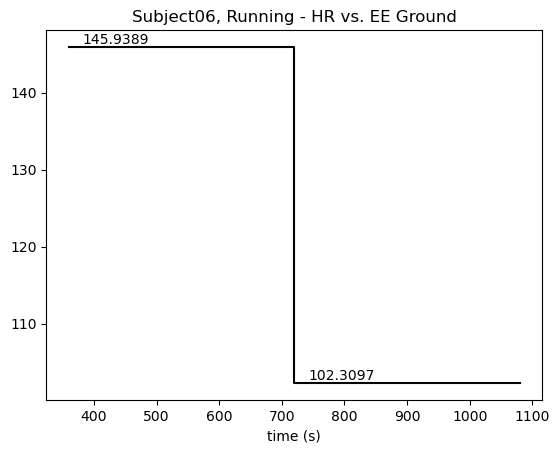

Subject06 Stairs
-----------
[-0.0, 5.4934, 6.3165, 4.5508, 0.0701]
[124.4444, nan, nan, nan, nan]
         HR      EE
0  124.4444  5.4934
1       NaN  6.3165
2       NaN  4.5508
3       NaN  0.0701
4       NaN  0.0000
         HR      EE  Index    Subject Activity
0  124.4444  5.4934    360  Subject06   Stairs


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


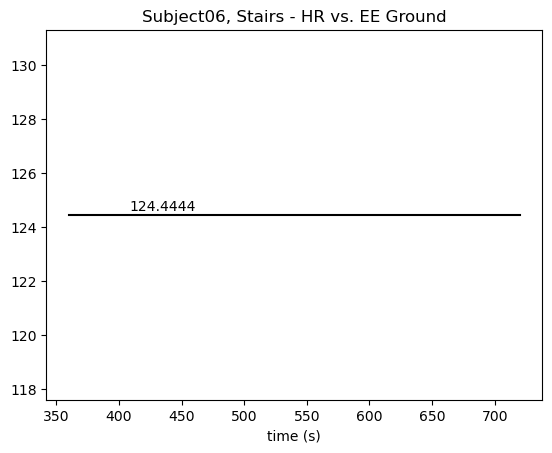

Subject06 Walking
-----------
[-0.0, 1.25, 1.8004, 2.3623, 0.0344]
[66.4884, nan, nan, nan, nan]
        HR      EE
0  66.4884  1.2500
1      NaN  1.8004
2      NaN  2.3623
3      NaN  0.0344
4      NaN  0.0000
        HR    EE  Index    Subject Activity
0  66.4884  1.25    360  Subject06  Walking


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


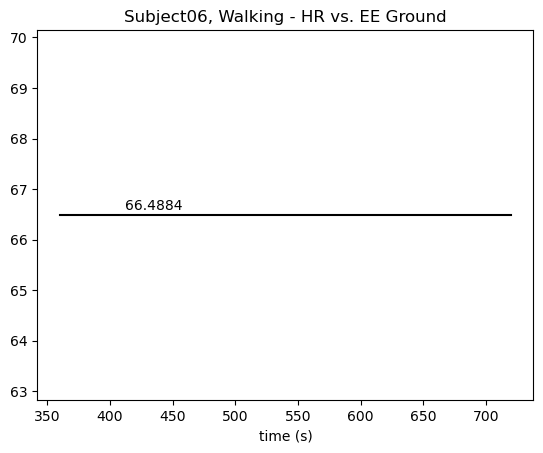

Subject07 Backwards
-----------
[-0.0, 2.6064, 1.7025, -0.3286]
[nan, nan, nan, nan, nan]
ERROR
   HR      EE
0 NaN  2.6064
1 NaN  1.7025
2 NaN -0.3286
3 NaN  0.0000
4 NaN  0.0000
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


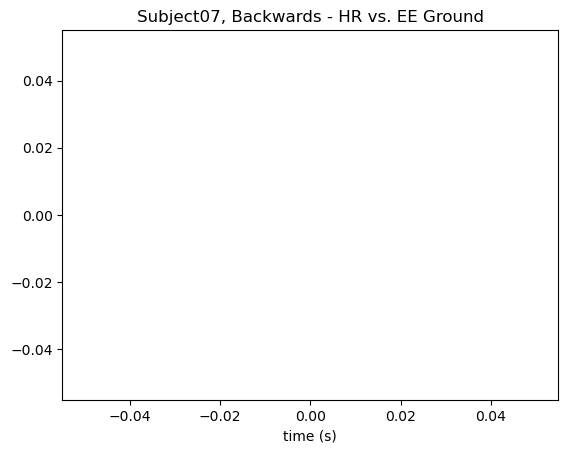

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Subject07 Cycling
-----------
[0.0, 2.6641, 4.1018, 5.1505, 5.5892, 0.2608]
[74.1736, nan, nan, nan, nan]
        HR      EE
0  74.1736  2.6641
1      NaN  4.1018
2      NaN  5.1505
3      NaN  5.5892
4      NaN  0.2608
        HR      EE  Index    Subject Activity
0  74.1736  2.6641    360  Subject07  Cycling


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


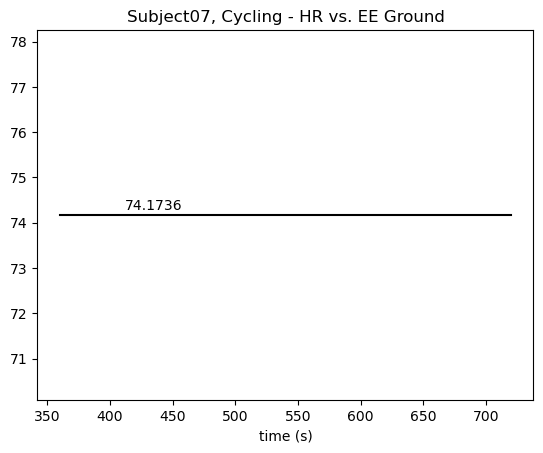

Subject07 Incline
-----------
[6.2833, 3.7189, 5.5512, 12.0594]
[118.4556, nan, nan, nan]
         HR       EE
0  118.4556   6.2833
1       NaN   3.7189
2       NaN   5.5512
3       NaN  12.0594
         HR      EE  Index    Subject Activity
0  118.4556  6.2833    360  Subject07  Incline


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


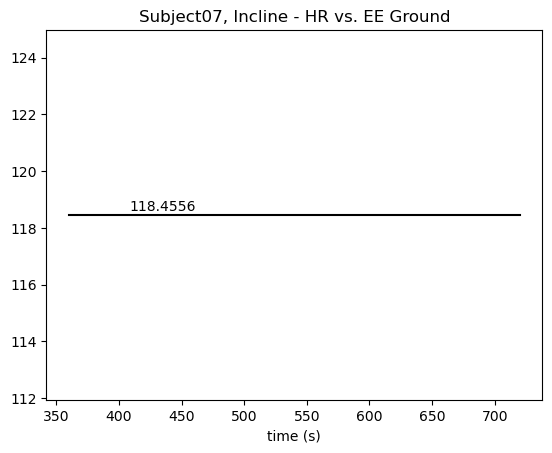

Subject07 Running
-----------
[0.0, 3.1609, 10.8107, 14.4348, 9.5884, 0.5255]
[132.2556, nan, nan, nan, nan]
         HR       EE
0  132.2556   3.1609
1       NaN  10.8107
2       NaN  14.4348
3       NaN   9.5884
4       NaN   0.5255
         HR      EE  Index    Subject Activity
0  132.2556  3.1609    360  Subject07  Running


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


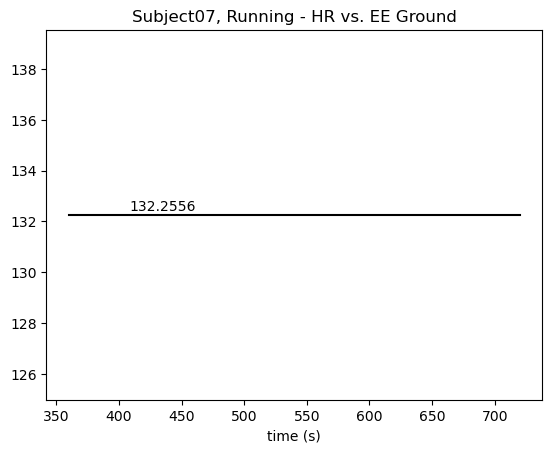

Subject07 Stairs
-----------
[0.0, 5.7274, 8.237, 7.4027, 0.3085]
[91.3604, nan, nan, nan, nan]
        HR      EE
0  91.3604  5.7274
1      NaN  8.2370
2      NaN  7.4027
3      NaN  0.3085
4      NaN  0.0000
        HR      EE  Index    Subject Activity
0  91.3604  5.7274    360  Subject07   Stairs


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


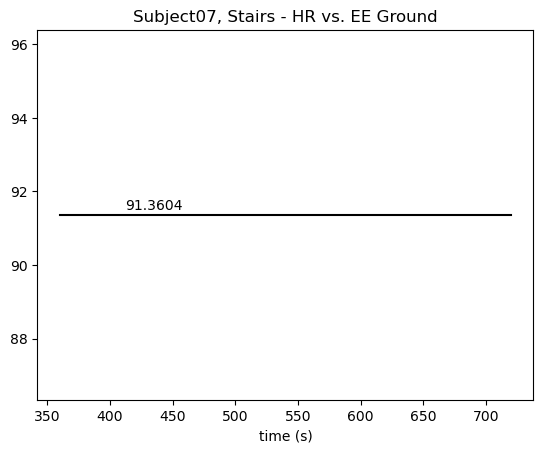

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Subject07 Walking
-----------
[-0.0, 3.476, 2.746, 2.2496, -0.1637]
[nan, nan, nan, nan, nan]
   HR      EE
0 NaN  3.4760
1 NaN  2.7460
2 NaN  2.2496
3 NaN -0.1637
4 NaN  0.0000
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


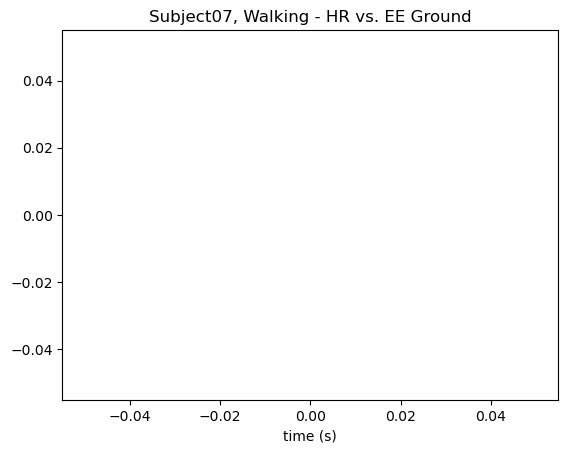

Subject08 Backwards
-----------
[-0.0, 2.2197, 1.6366, 0.1784]
[nan, nan, nan, nan, nan]
ERROR
   HR      EE
0 NaN  2.2197
1 NaN  1.6366
2 NaN  0.1784
3 NaN  0.0000
4 NaN  0.0000
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


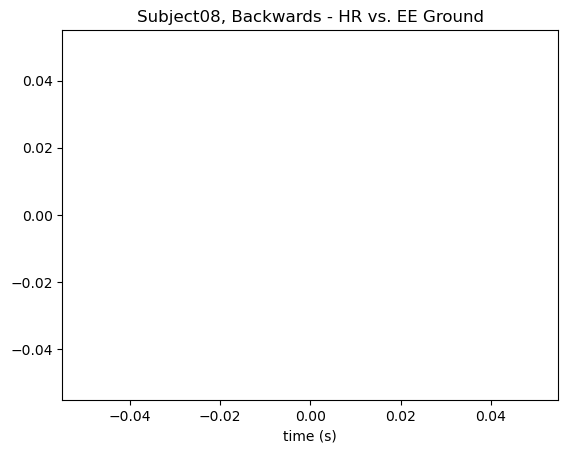

Subject08 Cycling
-----------
[0.0, 5.5294, 4.5208, 3.1603, 5.6137, 0.3305]
[138.4333, nan, nan, nan, nan]
         HR      EE
0  138.4333  5.5294
1       NaN  4.5208
2       NaN  3.1603
3       NaN  5.6137
4       NaN  0.3305
         HR      EE  Index    Subject Activity
0  138.4333  5.5294    360  Subject08  Cycling


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


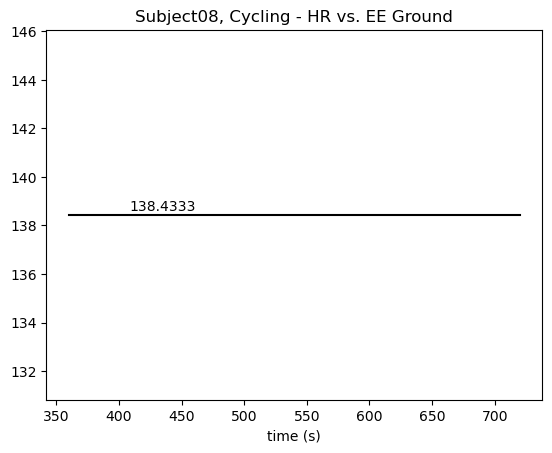

Subject08 Incline
-----------
[5.2712, 2.9647, 4.6158, 9.5841]
[134.5389, nan, nan, nan]
         HR      EE
0  134.5389  5.2712
1       NaN  2.9647
2       NaN  4.6158
3       NaN  9.5841
         HR      EE  Index    Subject Activity
0  134.5389  5.2712    360  Subject08  Incline


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


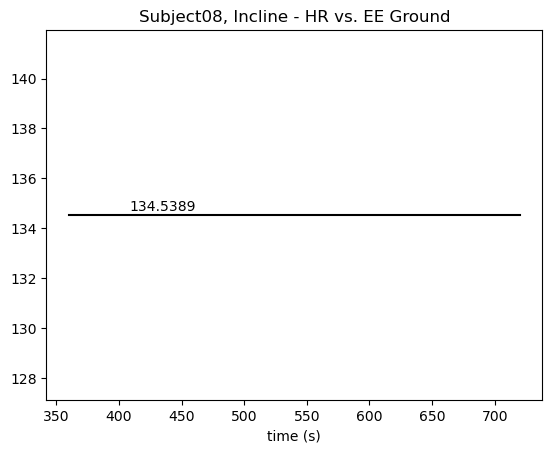

Subject08 Running
-----------
[-0.0, 2.7238, 8.3235, 7.2291, 10.5193, 0.7678]
[167.6111, nan, nan, nan, nan]
         HR       EE
0  167.6111   2.7238
1       NaN   8.3235
2       NaN   7.2291
3       NaN  10.5193
4       NaN   0.7678
         HR      EE  Index    Subject Activity
0  167.6111  2.7238    360  Subject08  Running


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


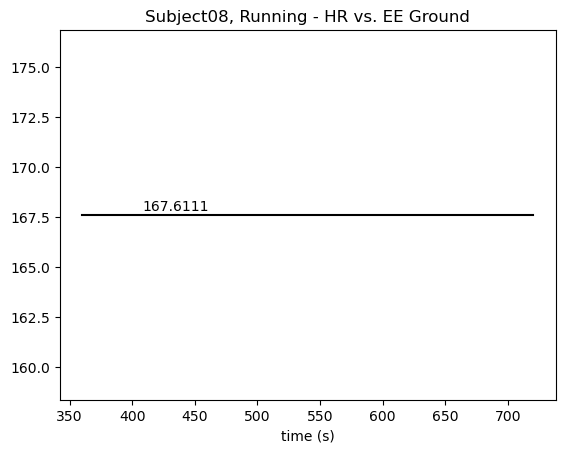

Subject08 Stairs
-----------
[0.0, 4.8847, 3.5668, 4.6459, 0.2151]
[129.0667, nan, nan, nan, nan]
         HR      EE
0  129.0667  4.8847
1       NaN  3.5668
2       NaN  4.6459
3       NaN  0.2151
4       NaN  0.0000
         HR      EE  Index    Subject Activity
0  129.0667  4.8847    360  Subject08   Stairs


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


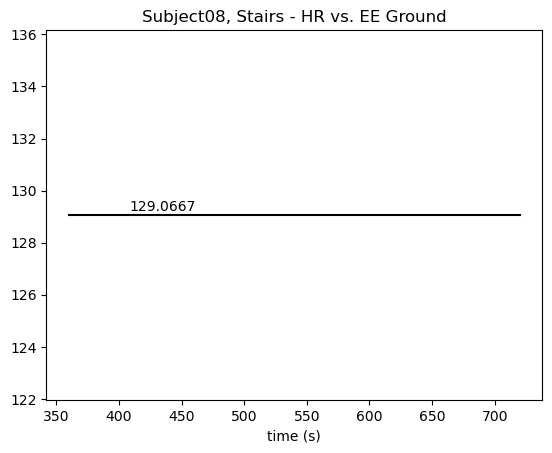

Subject08 Walking
-----------
[0.0, 2.071, 1.6497, 2.8827, 0.112]
[nan, nan, nan, nan, nan]
   HR      EE
0 NaN  2.0710
1 NaN  1.6497
2 NaN  2.8827
3 NaN  0.1120
4 NaN  0.0000
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


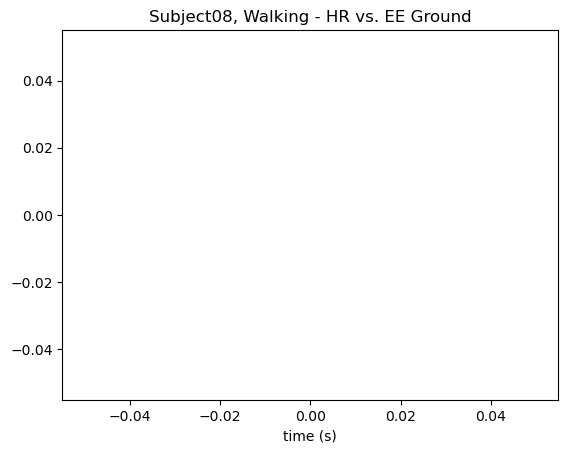

Subject09 Backwards
-----------
[-0.0, 2.5614, 1.6818, -0.0327]
[nan, nan, nan, nan, nan]
ERROR
   HR      EE
0 NaN  2.5614
1 NaN  1.6818
2 NaN -0.0327
3 NaN  0.0000
4 NaN  0.0000
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


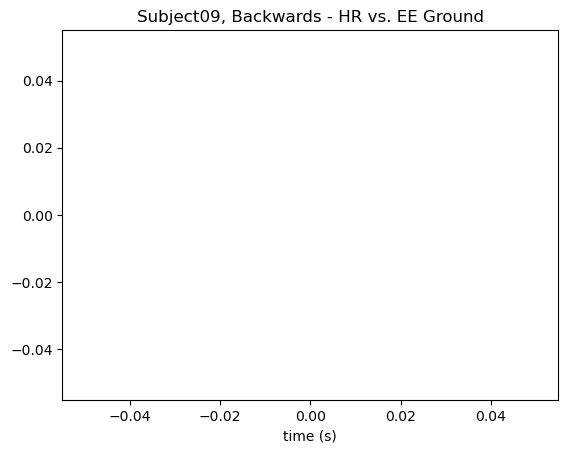

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Subject09 Cycling
-----------
[-0.0, 3.1042, 5.5057, 4.5028, 6.5951, 0.4261]
[87.9328, nan, nan, nan, nan]
        HR      EE
0  87.9328  3.1042
1      NaN  5.5057
2      NaN  4.5028
3      NaN  6.5951
4      NaN  0.4261
        HR      EE  Index    Subject Activity
0  87.9328  3.1042    360  Subject09  Cycling


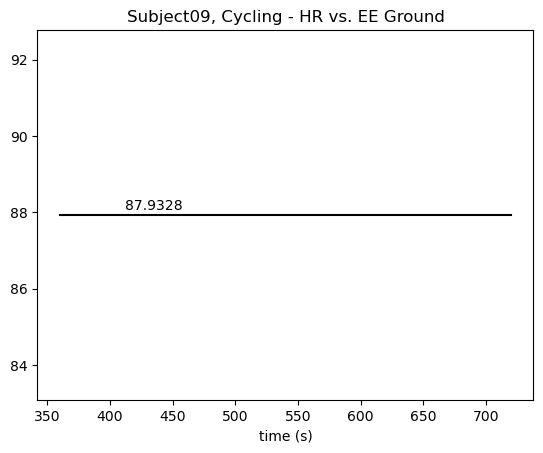

Subject09 Incline
-----------
[2.8285, 5.6529, 10.374, 5.5281]
[82.3559, nan, nan, nan]
        HR       EE
0  82.3559   2.8285
1      NaN   5.6529
2      NaN  10.3740
3      NaN   5.5281
        HR      EE  Index    Subject Activity
0  82.3559  2.8285    360  Subject09  Incline


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


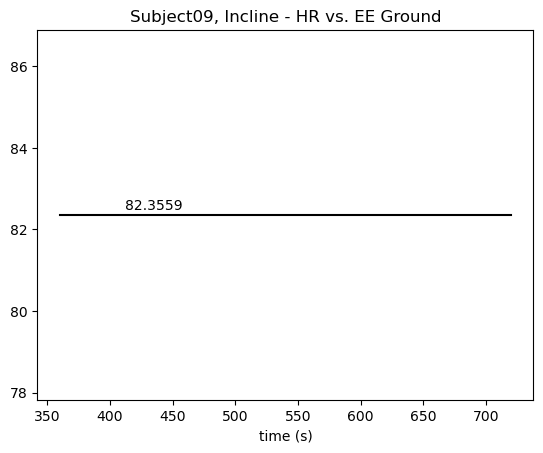

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Subject09 Running
-----------
[-0.0, 3.2825, 12.9414, 8.5384, 9.9443, 0.186]
[117.7, nan, nan, nan, nan]
      HR       EE
0  117.7   3.2825
1    NaN  12.9414
2    NaN   8.5384
3    NaN   9.9443
4    NaN   0.1860
      HR      EE  Index    Subject Activity
0  117.7  3.2825    360  Subject09  Running


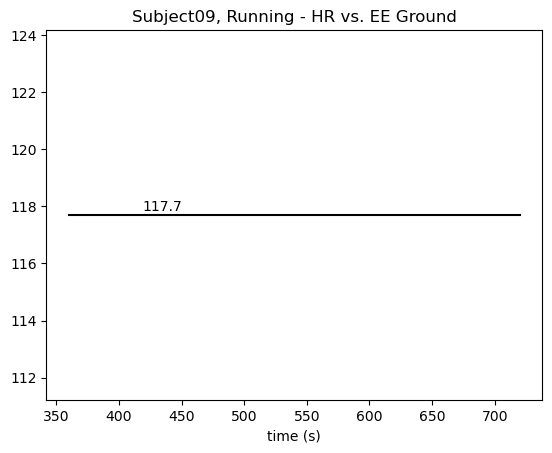

Subject09 Stairs
-----------
[-0.0, 5.3558, 4.6127, 6.0322, 0.0058]
[83.2889, nan, nan, nan, nan]
        HR      EE
0  83.2889  5.3558
1      NaN  4.6127
2      NaN  6.0322
3      NaN  0.0058
4      NaN  0.0000
        HR      EE  Index    Subject Activity
0  83.2889  5.3558    360  Subject09   Stairs


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


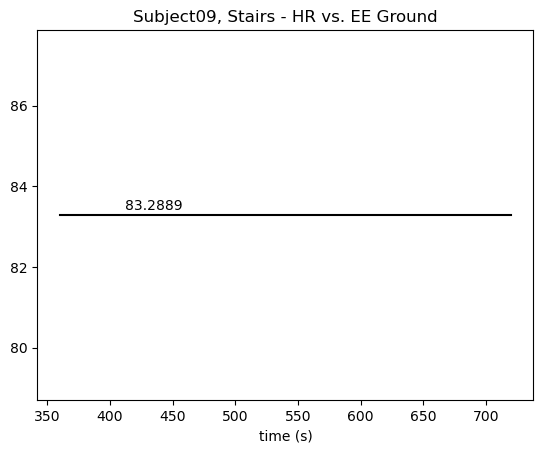

Subject09 Walking
-----------
[-0.0, 3.3898, 1.856, 2.4588, -0.2406]
[nan, nan, nan, nan, nan]
   HR      EE
0 NaN  3.3898
1 NaN  1.8560
2 NaN  2.4588
3 NaN -0.2406
4 NaN  0.0000
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


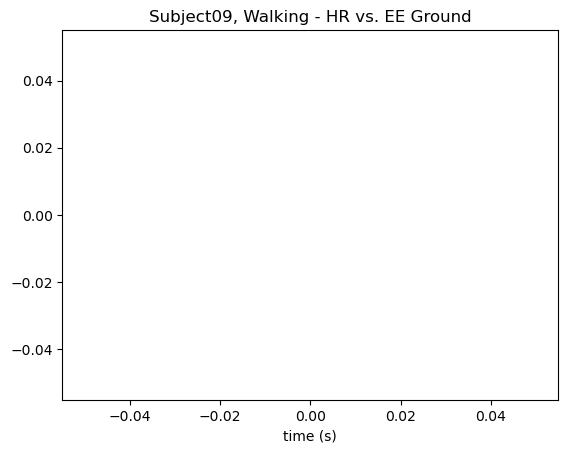

Subject10 Backwards
-----------
[-0.0, 1.4237, 1.9392, -0.4124]
[77.254, nan, nan, nan, nan]
ERROR
       HR      EE
0  77.254  1.4237
1     NaN  1.9392
2     NaN -0.4124
3     NaN  0.0000
4     NaN  0.0000
       HR      EE  Index    Subject   Activity
0  77.254  1.4237    360  Subject10  Backwards


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


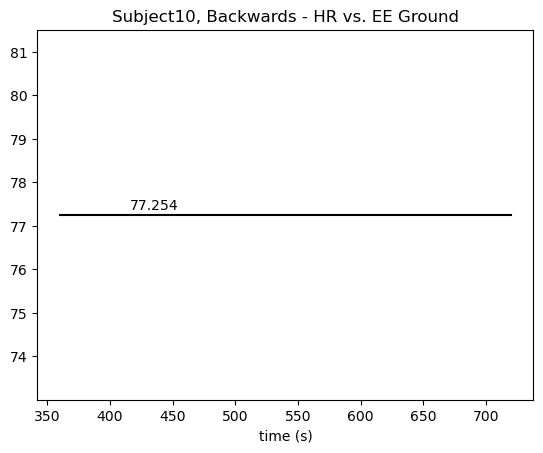

Subject10 Cycling
-----------
[-0.0, 2.7021, 5.5104, 5.1069, 4.1495, 0.1967]
[154.6333, 106.3922, nan, nan, nan]
         HR      EE
0  154.6333  2.7021
1  106.3922  5.5104
2       NaN  5.1069
3       NaN  4.1495
4       NaN  0.1967
         HR      EE  Index    Subject Activity
0  154.6333  2.7021    360  Subject10  Cycling
1  106.3922  5.5104    720  Subject10  Cycling


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


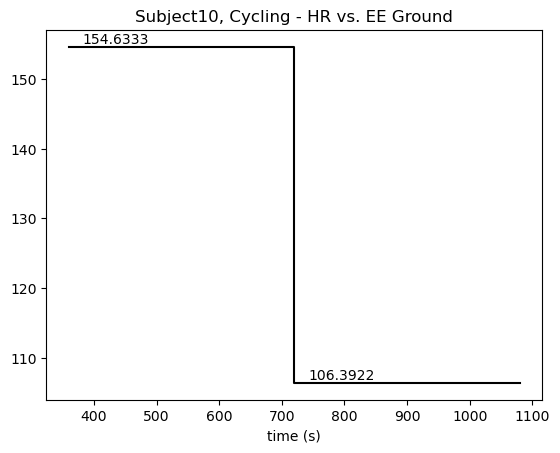

Subject10 Incline
-----------
[2.4382, 4.7357, 9.2065, 4.428]
[121.8889, 109.5111, nan, nan]
         HR      EE
0  121.8889  2.4382
1  109.5111  4.7357
2       NaN  9.2065
3       NaN  4.4280
         HR      EE  Index    Subject Activity
0  121.8889  2.4382    360  Subject10  Incline
1  109.5111  4.7357    720  Subject10  Incline


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


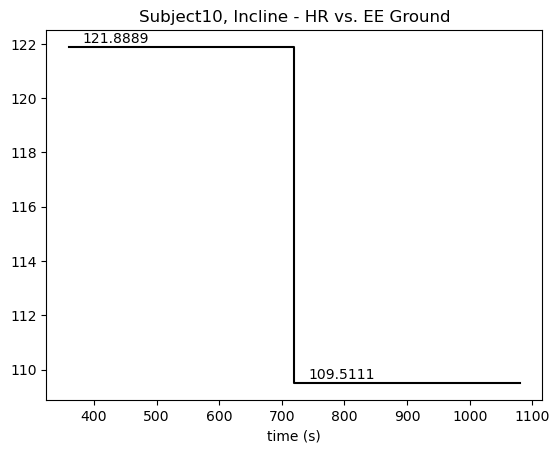

Subject10 Running
-----------
[0.0, 2.5287, 6.5194]
[nan, nan, nan, nan, nan]
ERROR
   HR      EE
0 NaN  2.5287
1 NaN  6.5194
2 NaN  0.0000
3 NaN  0.0000
4 NaN  0.0000
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


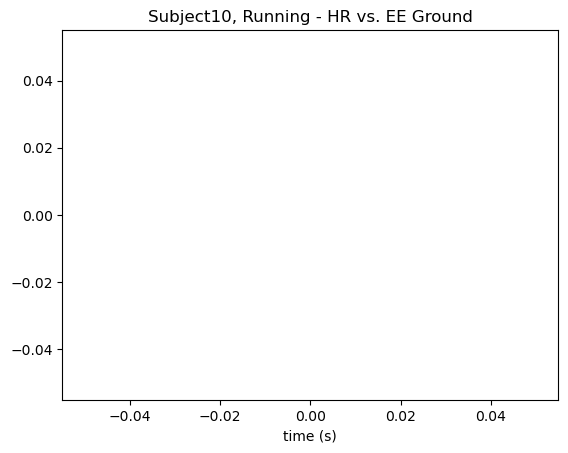

Subject10 Stairs
-----------
[0.0, 3.8273, 5.4942, 5.0184, 0.2326]
[163.85, nan, nan, nan, nan]
       HR      EE
0  163.85  3.8273
1     NaN  5.4942
2     NaN  5.0184
3     NaN  0.2326
4     NaN  0.0000
       HR      EE  Index    Subject Activity
0  163.85  3.8273    360  Subject10   Stairs


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


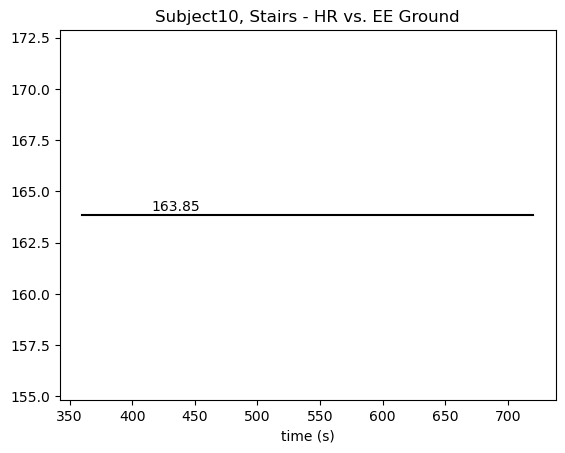

Subject10 Walking
-----------
[0.0, 2.1259, 1.706, 2.6765, -0.1005]
[73.5342, nan, nan, nan, nan]
        HR      EE
0  73.5342  2.1259
1      NaN  1.7060
2      NaN  2.6765
3      NaN -0.1005
4      NaN  0.0000
        HR      EE  Index    Subject Activity
0  73.5342  2.1259    360  Subject10  Walking


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


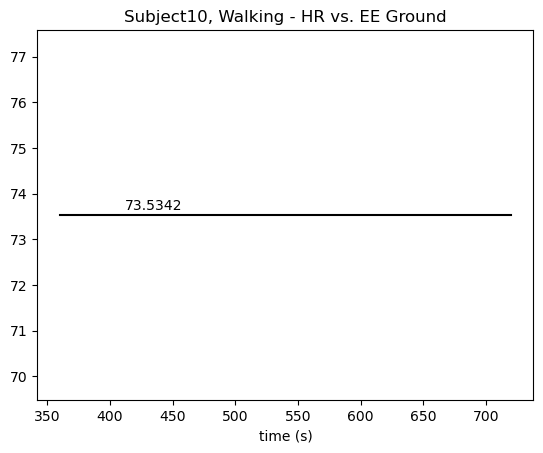

In [35]:
# 3 min averages
df_list = []
for subject in result.keys():
    hrPoints = []
    eePoints = []
    activity = []
    subjectTot = []

    indDF = globals()[subject[0]].astype(int)

    # Skip irrelevant activities
    if subject[1] in ['Backwards'] and subject[0] == 'Subject02':
        continue
    if subject[1] in ['Cycling'] and subject[0] == 'Subject05':
        continue
    if subject[1] in ['Backwards2', 'Cycling2']:
        continue

    print(subject[0] + " " + subject[1] + "\n" + "-----------")

    hr = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, 8]
    hr_df = pd.DataFrame(hr, columns=['HR']).fillna(0)

    # Determine the number of intervals dynamically
    num_intervals = len(indDF[subject[1]]) - 1

    # Calculate HR means for each interval
    hr_means = [
        round(hr_df.iloc[int((indDF[subject[1]][i]+indDF[subject[1]][i+1])/2):int(indDF[subject[1]][i + 1])].mean().values[0], 4)
        for i in range(num_intervals)
    ]

    # Filter steps based on activity
    if subject[1] == 'Incline':
        # Exclude the 3rd interval (index 2) for `Incline`
        # print(hr_means)
        hrPoints = [hr_means[i] for i in range(num_intervals) if i != 2]
    else:
        # Use all intervals for non-incline activities
        hrPoints = hr_means

    # Time indices for plotting
    x = [indDF[subject[1]][i] for i in range(num_intervals)]
    y = hr_means

    # Calculate EE ground values
    VO2 = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, vo2]
    VCO2 = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, vco2]
    EE = (16.58 * VO2 + 4.15 * VCO2) / mass[0]
    EE_ground = np.zeros(np.size(EE))

    ind = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, code]
    ind = ind[:-1] - ind[1:]
    bool_ind = ind != 0.0
    indShift = np.where(bool_ind)[0]  # Last index for each phase
    indShift = np.concatenate((indShift, [len(ind)]))

    T_first_phase = result[subject[0]][subject[1]]['Metabolics_System']['Data'][indShift[0], 0]
    timeM3_first = T_first_phase - (3 * 60)
    bool_time_first = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, 0] < timeM3_first
    threeMin_first = indShift[0] - np.max(np.where(bool_time_first)[0])

    EE_avg_first = np.mean(EE[indShift[0] - threeMin_first:indShift[0]])
 
    for i in range(len(indShift)):
        T = result[subject[0]][subject[1]]['Metabolics_System']['Data'][indShift[i], 0]
        timeM3 = T - (3 * 60)
        bool_time = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, 0] < timeM3
        threeMin = indShift[i] - np.max(np.where(bool_time)[0])

        if i == 0:
            EE_ground[0:indShift[i]] = np.mean(EE[indShift[i] - threeMin : indShift[i]]) - EE_avg_first
            eePoints.append(round(np.mean(EE[indShift[i] - threeMin : indShift[i]] - EE_avg_first), 4))
        elif i == len(indShift) - 1:
            EE_ground[indShift[i - 1] :] = np.mean(EE[-threeMin:]) - EE_avg_first
            eePoints.append(round(np.mean(EE[-threeMin:] - EE_avg_first), 4))
        else:
            EE_ground[indShift[i - 1] : indShift[i] + 1] = np.mean(EE[indShift[i] - threeMin : indShift[i]])- EE_avg_first
            eePoints.append(round(np.mean(EE[indShift[i] - threeMin : indShift[i]]- EE_avg_first), 4))
    
    # print(eePoints)
    if subject[1] == 'Incline':
        del eePoints[3]
        eePoints = eePoints[1:-1]
    print(eePoints)
    print(hrPoints)
    if subject[1] != 'Incline':
        eePoints.append(0)
        eePoints = eePoints[1:6]
    if len(eePoints) is not len(hrPoints):
        print('ERROR')
        if len(eePoints) > len(hrPoints):
            while len(hrPoints) != len(eePoints):
                hrPoints.append(0)
        if len(eePoints) < len(hrPoints):
            while len(hrPoints) != len(eePoints):
                eePoints.append(0)

    
    hr_eeDF = pd.DataFrame({'HR': hrPoints, 'EE': eePoints})
    print(hr_eeDF)
    hr_eeDF = hr_eeDF.dropna()
    indPoints = indDF[subject[1]][0:len(hr_eeDF)]
    hr_eeDF['Index'] = indPoints
    for i in range(len(hr_eeDF)):
        activity.append(subject[1])
        subjectTot.append(subject[0])
    hr_eeDF['Subject'] = subjectTot
    hr_eeDF['Activity'] = activity
    print(hr_eeDF)
    df_list.append(hr_eeDF)

    plt.figure(1)

    plt.title(subject[0] + ", " + subject[1] + " - HR vs. EE Ground")

    color = 'tab:blue'
    ax1.set_xlabel('Index') 
    ax1.set_ylabel('HR (bpm)', color = color)
    ax1.plot(hr_eeDF['HR'], color= color)
    ax1.tick_params(axis ='y', labelcolor = color)

    # plt.scatter(timeF[zeros_df['Switch']], [0]*len(zeros_df['Switch']), color='black', marker='o')
    plt.step(x, y, where='post',color='black')
    for i in range(len(x) - 1):
        plt.text(x[i] + 75, y[i] + 0.05, f'{y[i]}', ha='center', va='bottom')
    
    ax2 = ax1.twinx() 

    color = 'tab:orange'
    ax2.set_ylabel('EE Ground (W/kg)', color = color) 
    ax2.plot(hr_eeDF['Index'],hr_eeDF['EE'], color= color)
    ax2.tick_params(axis ='y', labelcolor = color) 


    title = subject[0] + ", " + subject[1] + " - HR vs. EE Ground"
    plt.xlabel('time (s)')
    plt.title(title)
    plt.show()

Subject01 Backwards
-----------
Standing Average HR: 80.50909090909092
[0.0, 1.3861, 2.3818, 3.4005, -0.0438]
[-4.2346, nan, nan, nan, nan]
       HR      EE
0 -4.2346  1.3861
1     NaN  2.3818
2     NaN  3.4005
3     NaN -0.0438
4     NaN  0.0000
       HR      EE  Index    Subject   Activity
0 -4.2346  1.3861    360  Subject01  Backwards


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


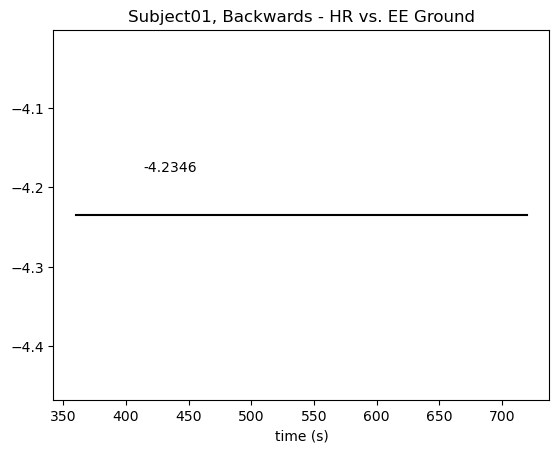

Subject01 Cycling
-----------
Standing Average HR: 86.93333333333334
[0.0, 5.2693, 5.3118, 2.9473, 4.3014, 2.7933]
[35.9597, nan, nan, nan, nan]
        HR      EE
0  35.9597  5.2693
1      NaN  5.3118
2      NaN  2.9473
3      NaN  4.3014
4      NaN  2.7933
        HR      EE  Index    Subject Activity
0  35.9597  5.2693    360  Subject01  Cycling


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


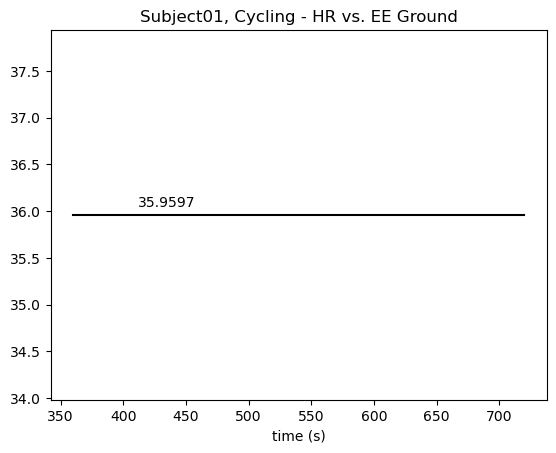

Subject01 Incline
-----------
Standing Average HR: 75.18867924528301
[4.3915, 2.1477, 3.406, 7.3179]
[55.278, nan, nan, nan]
       HR      EE
0  55.278  4.3915
1     NaN  2.1477
2     NaN  3.4060
3     NaN  7.3179
       HR      EE  Index    Subject Activity
0  55.278  4.3915    360  Subject01  Incline


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


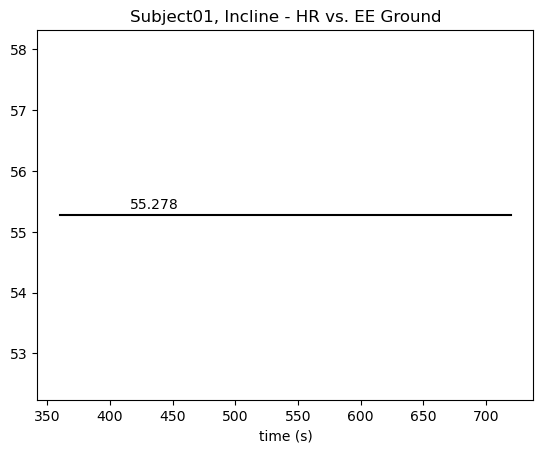

Subject01 Running
-----------
Standing Average HR: 73.61702127659575
[-0.0, 2.1805, 7.4136, 9.487, 6.5183]
[63.5214, nan, nan, nan, nan]
        HR      EE
0  63.5214  2.1805
1      NaN  7.4136
2      NaN  9.4870
3      NaN  6.5183
4      NaN  0.0000
        HR      EE  Index    Subject Activity
0  63.5214  2.1805    360  Subject01  Running


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


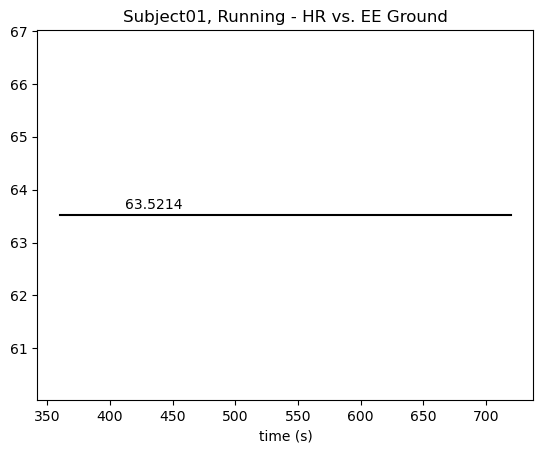

Subject01 Walking
-----------
Standing Average HR: 81.42592592592592
[0.0, 1.8304, 2.2464, 0.9629, -0.3751]
[-10.8805, nan, nan, nan, nan]
        HR      EE
0 -10.8805  1.8304
1      NaN  2.2464
2      NaN  0.9629
3      NaN -0.3751
4      NaN  0.0000
        HR      EE  Index    Subject Activity
0 -10.8805  1.8304    360  Subject01  Walking


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


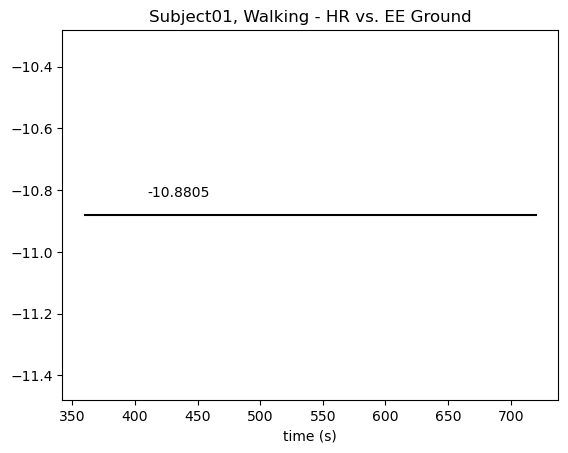

Subject02 Cycling
-----------
Standing Average HR: 68.67857142857143
[0.0, 5.9295, 6.3243, 3.5758, 4.8132, 0.2563]
[nan, nan, nan, nan, nan]
   HR      EE
0 NaN  5.9295
1 NaN  6.3243
2 NaN  3.5758
3 NaN  4.8132
4 NaN  0.2563
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


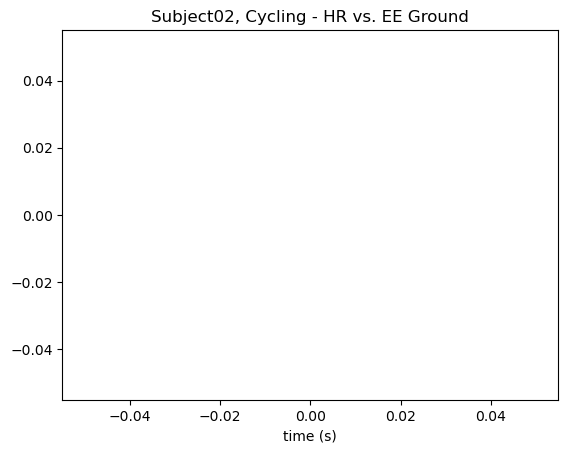

Subject02 Incline
-----------
Standing Average HR: 62.77777777777778
[5.7172, 2.9349, 9.6217, 4.8842]
[nan, nan, nan, nan]
   HR      EE
0 NaN  5.7172
1 NaN  2.9349
2 NaN  9.6217
3 NaN  4.8842
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


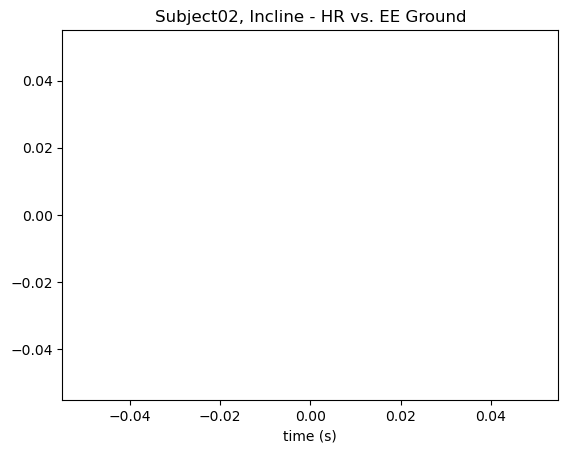

Subject02 Running
-----------
Standing Average HR: 58.94736842105263
[0.0, 3.2756, 9.9736, 13.3416, 9.7279, 0.2245]
[52.7723, nan, nan, nan, nan]
        HR       EE
0  52.7723   3.2756
1      NaN   9.9736
2      NaN  13.3416
3      NaN   9.7279
4      NaN   0.2245
        HR      EE  Index    Subject Activity
0  52.7723  3.2756    360  Subject02  Running


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


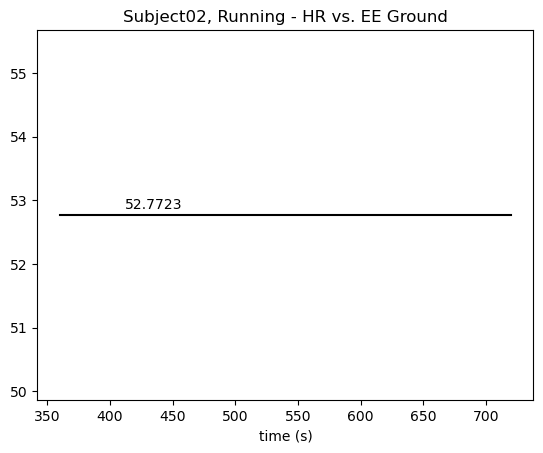

Subject02 Stairs
-----------
Standing Average HR: 76.86111111111111
[-0.0, 4.4224, 5.8041, 6.6176, 0.1784]
[nan, nan, nan, nan, nan]
   HR      EE
0 NaN  4.4224
1 NaN  5.8041
2 NaN  6.6176
3 NaN  0.1784
4 NaN  0.0000
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


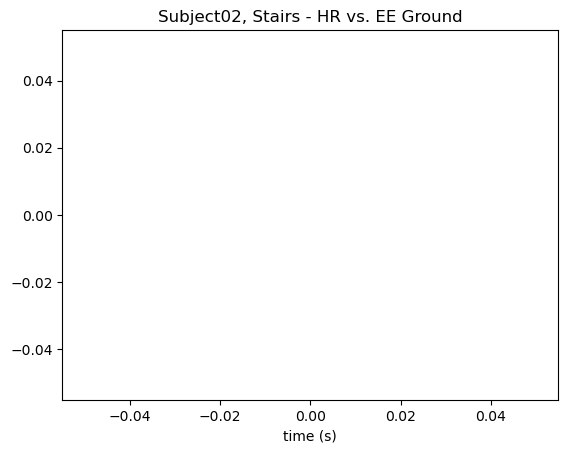

Subject02 Walking
-----------
Standing Average HR: 61.470588235294116
[0.0, 3.9037, 2.5451, 0.2939, 1.5413, 0.0257]
[nan, nan, nan, nan, nan]
   HR      EE
0 NaN  3.9037
1 NaN  2.5451
2 NaN  0.2939
3 NaN  1.5413
4 NaN  0.0257
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


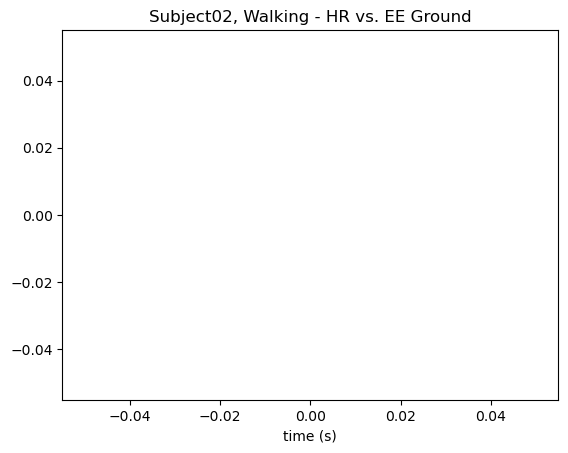

Subject03 Backwards
-----------
Standing Average HR: 124.515625
[-0.0, 2.9285, 1.9719, 0.1645]
[-27.5156, nan, nan, nan, nan]
ERROR
        HR      EE
0 -27.5156  2.9285
1      NaN  1.9719
2      NaN  0.1645
3      NaN  0.0000
4      NaN  0.0000
        HR      EE  Index    Subject   Activity
0 -27.5156  2.9285    360  Subject03  Backwards


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


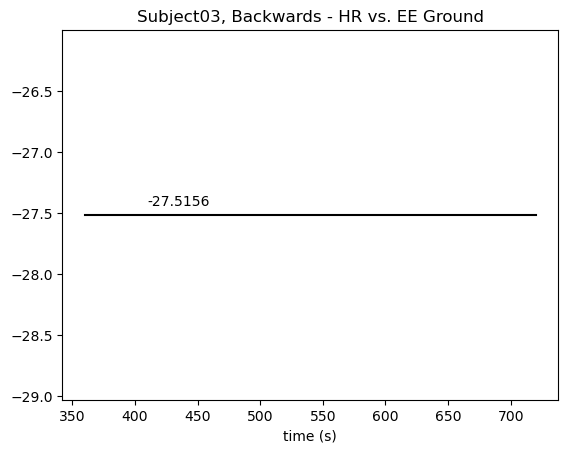

Subject03 Cycling
-----------
Standing Average HR: 109.43103448275862
[-0.0, 6.6793, 6.4356, 3.9889, 4.921, 0.3502]
[32.8967, nan, nan, nan, nan]
        HR      EE
0  32.8967  6.6793
1      NaN  6.4356
2      NaN  3.9889
3      NaN  4.9210
4      NaN  0.3502
        HR      EE  Index    Subject Activity
0  32.8967  6.6793    360  Subject03  Cycling


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


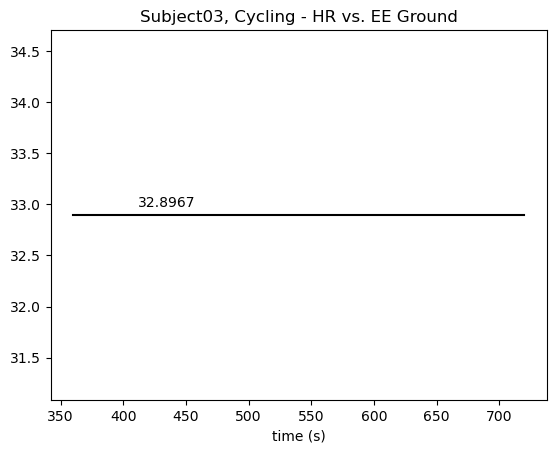

Subject03 Incline
-----------
Standing Average HR: 101.61016949152543
[3.4757, 6.2116, 10.2795, 5.9422]
[66.4676, 8.02, nan, nan]
        HR       EE
0  66.4676   3.4757
1   8.0200   6.2116
2      NaN  10.2795
3      NaN   5.9422
        HR      EE  Index    Subject Activity
0  66.4676  3.4757    360  Subject03  Incline
1   8.0200  6.2116    720  Subject03  Incline


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


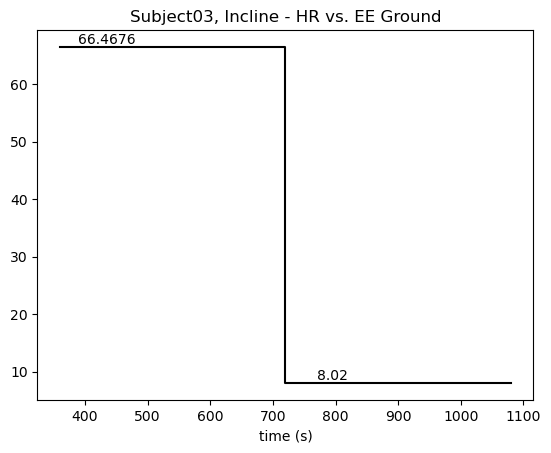

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Subject03 Running
-----------
Standing Average HR: 103.11320754716981
[-0.0, 3.1877, 11.0262, 12.5893, 9.3661, 0.5036]
[70.6368, 11.5791, nan, nan, nan]
        HR       EE
0  70.6368   3.1877
1  11.5791  11.0262
2      NaN  12.5893
3      NaN   9.3661
4      NaN   0.5036
        HR       EE  Index    Subject Activity
0  70.6368   3.1877    360  Subject03  Running
1  11.5791  11.0262    720  Subject03  Running


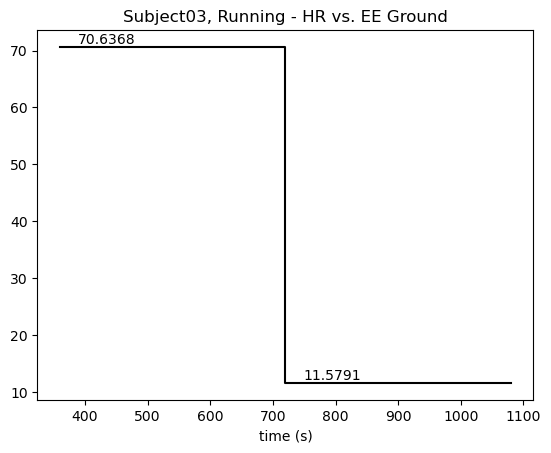

Subject03 Stairs
-----------
Standing Average HR: 114.63076923076923
[-0.0, 4.4575, 5.4713, 5.5952, 0.4213]
[31.662, 26.2865, nan, nan, nan]
        HR      EE
0  31.6620  4.4575
1  26.2865  5.4713
2      NaN  5.5952
3      NaN  0.4213
4      NaN  0.0000
        HR      EE  Index    Subject Activity
0  31.6620  4.4575    112  Subject03   Stairs
1  26.2865  5.4713    473  Subject03   Stairs


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


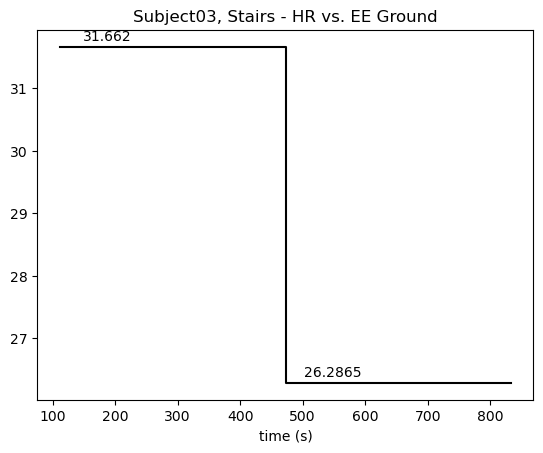

Subject03 Walking
-----------
Standing Average HR: 116.22033898305085
[0.0, 1.9761, 3.4229, 2.6824, -0.1201]
[-26.1263, nan, nan, nan, nan]
        HR      EE
0 -26.1263  1.9761
1      NaN  3.4229
2      NaN  2.6824
3      NaN -0.1201
4      NaN  0.0000
        HR      EE  Index    Subject Activity
0 -26.1263  1.9761    360  Subject03  Walking


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


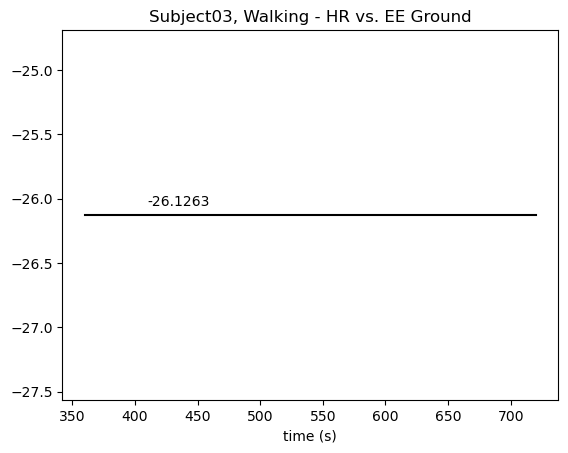

Subject04 Backwards
-----------
Standing Average HR: 90.09302325581395
[0.0, 1.2357, 2.1072, -0.1007]
[nan, nan, nan, nan, nan]
ERROR
   HR      EE
0 NaN  1.2357
1 NaN  2.1072
2 NaN -0.1007
3 NaN  0.0000
4 NaN  0.0000
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


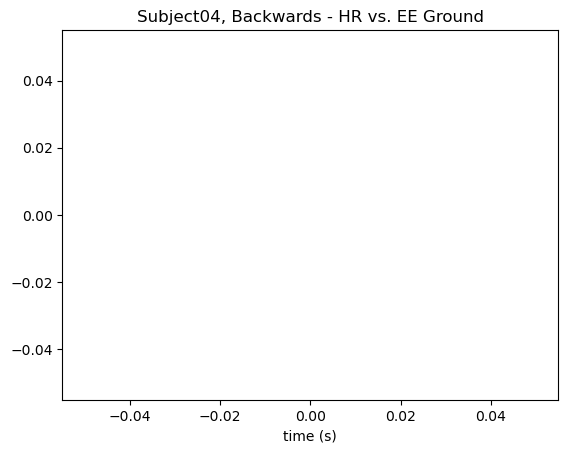

Subject04 Cycling
-----------
Standing Average HR: 104.41666666666667
[-0.0, 3.9562, 5.3276, 3.0171, 5.7793, 0.0261]
[21.0333, nan, nan, nan, nan]
        HR      EE
0  21.0333  3.9562
1      NaN  5.3276
2      NaN  3.0171
3      NaN  5.7793
4      NaN  0.0261
        HR      EE  Index    Subject Activity
0  21.0333  3.9562    360  Subject04  Cycling


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


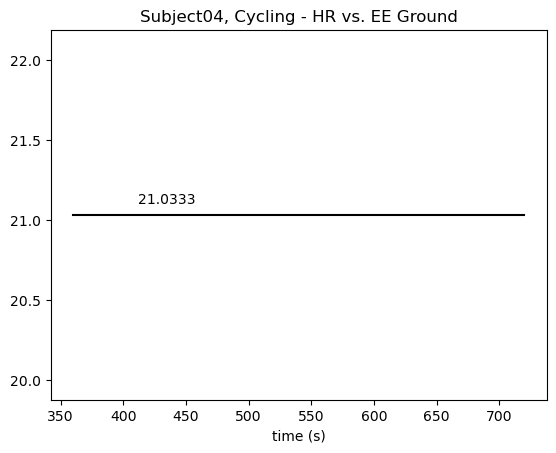

Subject04 Incline
-----------
Standing Average HR: 80.36363636363636
[2.5002, 5.3252, 10.5005, 5.4443]
[40.8807, nan, nan, nan]
        HR       EE
0  40.8807   2.5002
1      NaN   5.3252
2      NaN  10.5005
3      NaN   5.4443
        HR      EE  Index    Subject Activity
0  40.8807  2.5002    360  Subject04  Incline


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


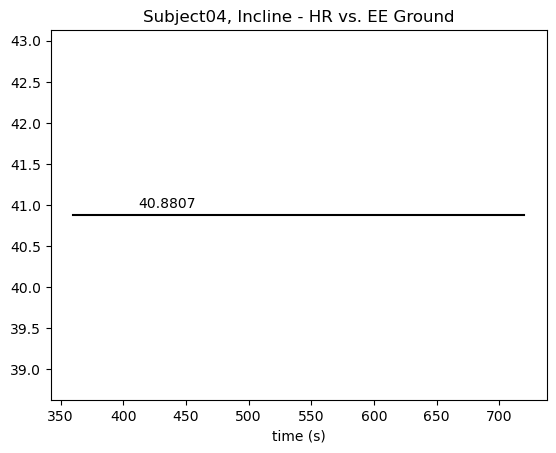

Subject04 Running
-----------
Standing Average HR: 92.02127659574468
[-0.0, 2.1518, 10.2966, 9.0126, 9.8422, 0.3995]
[73.8787, nan, nan, nan, nan]
        HR       EE
0  73.8787   2.1518
1      NaN  10.2966
2      NaN   9.0126
3      NaN   9.8422
4      NaN   0.3995
        HR      EE  Index    Subject Activity
0  73.8787  2.1518    360  Subject04  Running


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


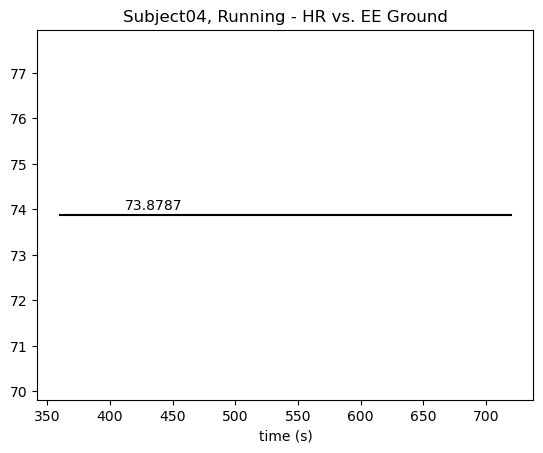

Subject04 Stairs
-----------
Standing Average HR: 120.33333333333333
[0.0, 5.9622, 4.5836, 5.4044, 0.3483]
[15.5535, nan, nan, nan, nan]
        HR      EE
0  15.5535  5.9622
1      NaN  4.5836
2      NaN  5.4044
3      NaN  0.3483
4      NaN  0.0000
        HR      EE  Index    Subject Activity
0  15.5535  5.9622    360  Subject04   Stairs


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


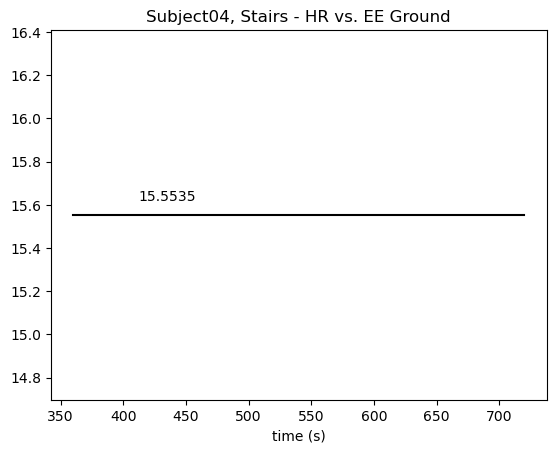

Subject04 Walking
-----------
Standing Average HR: 82.71428571428571
[0.0, 1.6658, 1.3328, 2.6658]
[nan, nan, nan, nan, nan]
ERROR
   HR      EE
0 NaN  1.6658
1 NaN  1.3328
2 NaN  2.6658
3 NaN  0.0000
4 NaN  0.0000
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


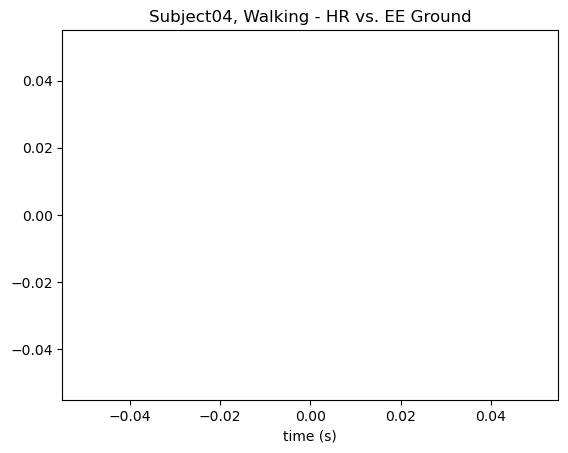

Subject05 Backwards
-----------
Standing Average HR: 107.45901639344262
[0.0, 2.232, 3.386, 4.8032, 0.1297]
[5.4472, nan, nan, nan, nan]
       HR      EE
0  5.4472  2.2320
1     NaN  3.3860
2     NaN  4.8032
3     NaN  0.1297
4     NaN  0.0000
       HR     EE  Index    Subject   Activity
0  5.4472  2.232    360  Subject05  Backwards


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


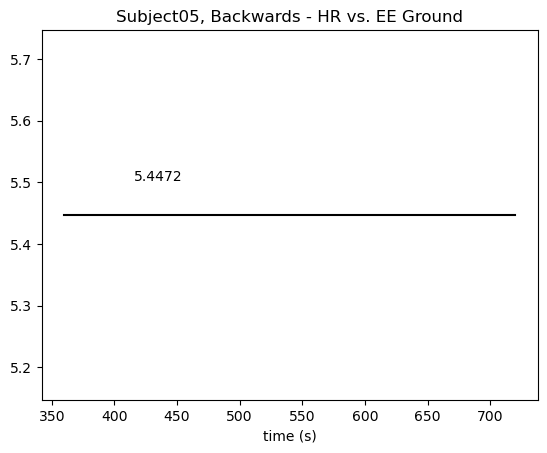

Subject05 Incline
-----------
Standing Average HR: 92.76190476190476
[5.6088, 2.744, 5.1934, 10.8103]
[45.2937, nan, nan, nan]
        HR       EE
0  45.2937   5.6088
1      NaN   2.7440
2      NaN   5.1934
3      NaN  10.8103
        HR      EE  Index    Subject Activity
0  45.2937  5.6088    360  Subject05  Incline


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


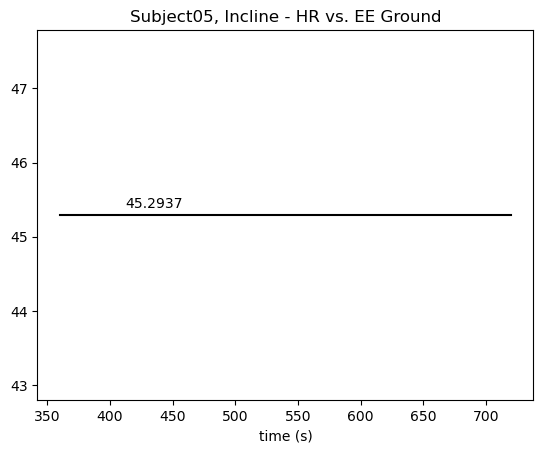

Subject05 Running
-----------
Standing Average HR: 92.41818181818182
[0.0, 2.8884, 10.0767, 13.1853, 8.8465, 0.5482]
[53.3985, nan, nan, nan, nan]
        HR       EE
0  53.3985   2.8884
1      NaN  10.0767
2      NaN  13.1853
3      NaN   8.8465
4      NaN   0.5482
        HR      EE  Index    Subject Activity
0  53.3985  2.8884    360  Subject05  Running


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


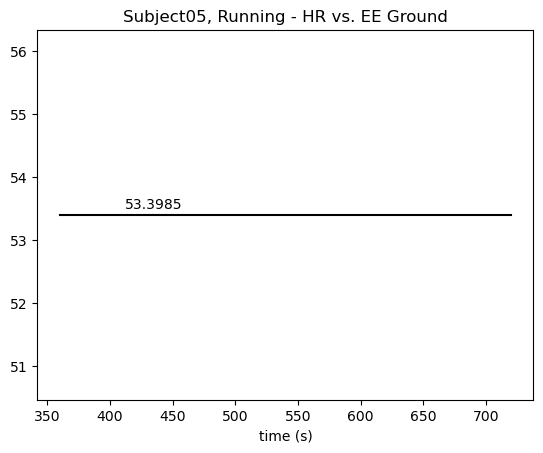

Subject05 Stairs
-----------
Standing Average HR: 119.12962962962963
[-0.0, 7.6464, 5.4741, 7.1485, 0.1958]
[18.3575, nan, nan, nan, nan]
        HR      EE
0  18.3575  7.6464
1      NaN  5.4741
2      NaN  7.1485
3      NaN  0.1958
4      NaN  0.0000
        HR      EE  Index    Subject Activity
0  18.3575  7.6464    360  Subject05   Stairs


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


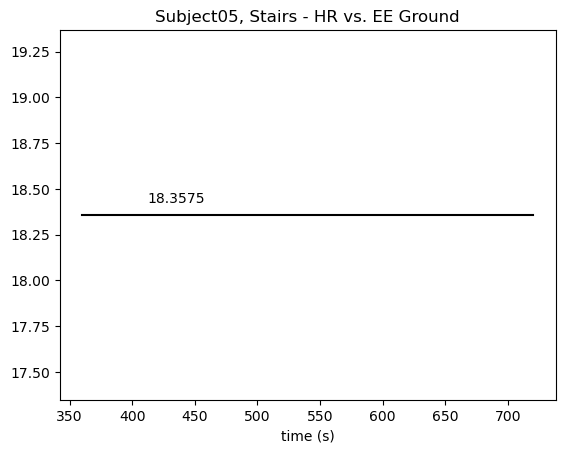

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Subject05 Walking
-----------
Standing Average HR: 98.0
[-0.0, 2.5504, 3.2308, 1.8335, 0.1411]
[nan, nan, nan, nan, nan]
   HR      EE
0 NaN  2.5504
1 NaN  3.2308
2 NaN  1.8335
3 NaN  0.1411
4 NaN  0.0000
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


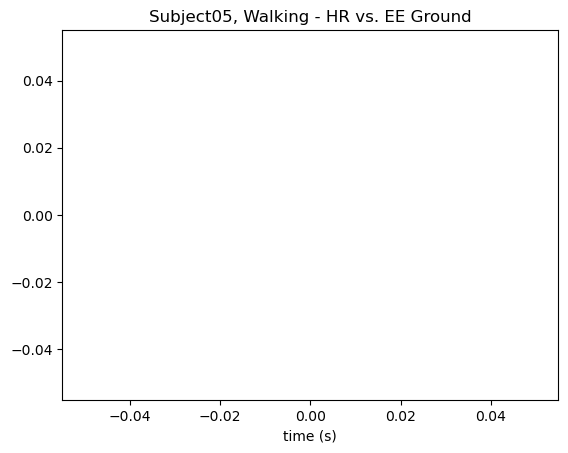

Subject06 Backwards
-----------
Standing Average HR: 93.13207547169812
[-0.0, 1.8906, 3.1236, 0.1128]
[nan, nan, nan, nan, nan]
ERROR
   HR      EE
0 NaN  1.8906
1 NaN  3.1236
2 NaN  0.1128
3 NaN  0.0000
4 NaN  0.0000
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


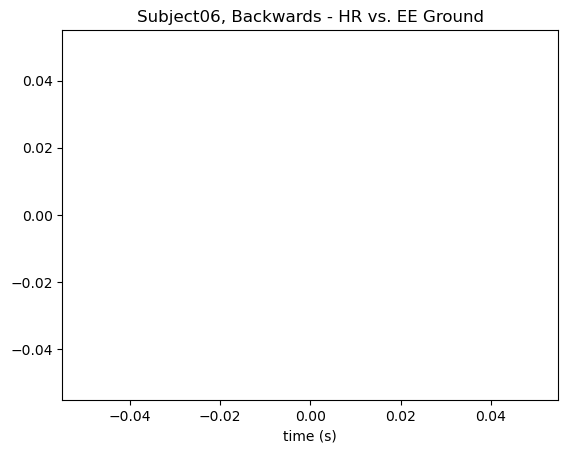

Subject06 Cycling
-----------
Standing Average HR: 91.26530612244898
[0.0, 4.1207, 5.9055, 6.2759, 3.2409, 0.0639]
[31.6847, nan, nan, nan, nan]
        HR      EE
0  31.6847  4.1207
1      NaN  5.9055
2      NaN  6.2759
3      NaN  3.2409
4      NaN  0.0639
        HR      EE  Index    Subject Activity
0  31.6847  4.1207    360  Subject06  Cycling


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


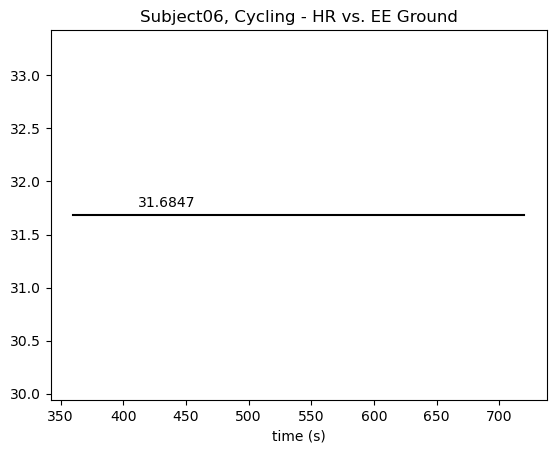

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Subject06 Incline
-----------
Standing Average HR: 81.17647058823529
[5.0706, 2.8103, 4.7614, 9.8021]
[40.0791, nan, nan, nan]
        HR      EE
0  40.0791  5.0706
1      NaN  2.8103
2      NaN  4.7614
3      NaN  9.8021
        HR      EE  Index    Subject Activity
0  40.0791  5.0706    360  Subject06  Incline


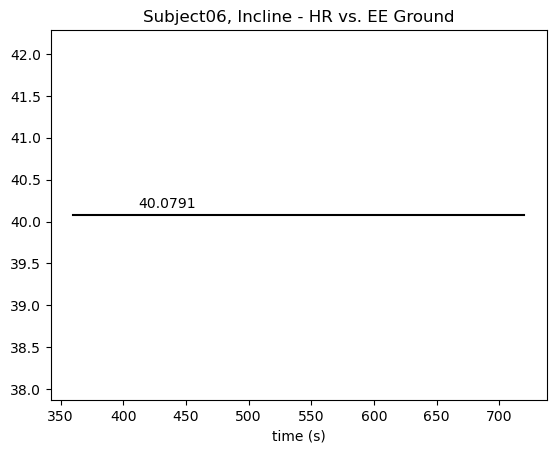

Subject06 Running
-----------
Standing Average HR: 86.1875


posx and posy should be finite values
posx and posy should be finite values


[0.0, 2.3792, 11.693, 8.6091, 10.0526, 0.4496]
[59.7514, 16.1222, nan, nan, nan]
        HR       EE
0  59.7514   2.3792
1  16.1222  11.6930
2      NaN   8.6091
3      NaN  10.0526
4      NaN   0.4496
        HR       EE  Index    Subject Activity
0  59.7514   2.3792    360  Subject06  Running
1  16.1222  11.6930    720  Subject06  Running


posx and posy should be finite values
posx and posy should be finite values


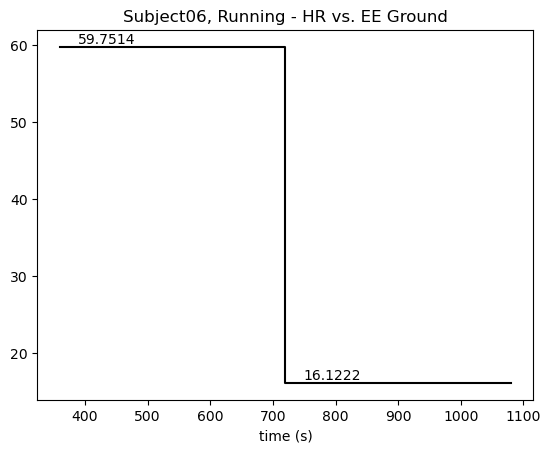

Subject06 Stairs
-----------
Standing Average HR: 109.03448275862068
[-0.0, 5.4934, 6.3165, 4.5508, 0.0701]
[15.41, nan, nan, nan, nan]
      HR      EE
0  15.41  5.4934
1    NaN  6.3165
2    NaN  4.5508
3    NaN  0.0701
4    NaN  0.0000
      HR      EE  Index    Subject Activity
0  15.41  5.4934    360  Subject06   Stairs


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


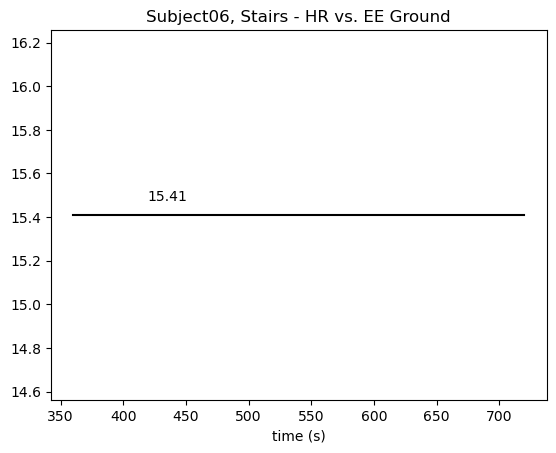

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Subject06 Walking
-----------
Standing Average HR: 87.7
[-0.0, 1.25, 1.8004, 2.3623, 0.0344]
[-21.2116, nan, nan, nan, nan]
        HR      EE
0 -21.2116  1.2500
1      NaN  1.8004
2      NaN  2.3623
3      NaN  0.0344
4      NaN  0.0000
        HR    EE  Index    Subject Activity
0 -21.2116  1.25    360  Subject06  Walking


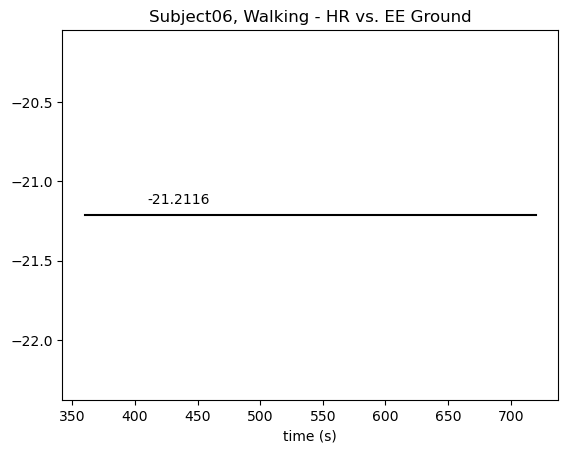

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Subject07 Backwards
-----------
Standing Average HR: 73.32692307692308
[-0.0, 2.6064, 1.7025, -0.3286]
[nan, nan, nan, nan, nan]
ERROR
   HR      EE
0 NaN  2.6064
1 NaN  1.7025
2 NaN -0.3286
3 NaN  0.0000
4 NaN  0.0000
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


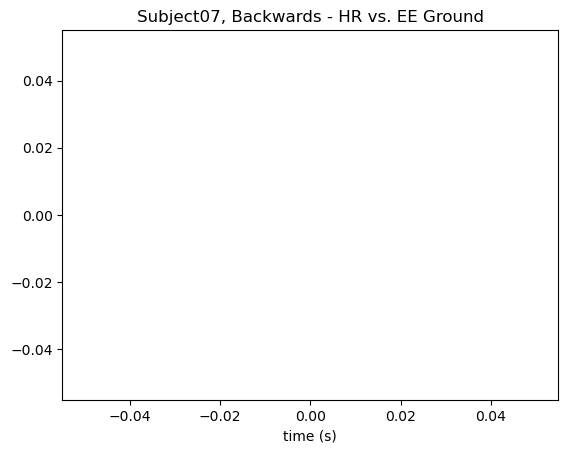

Subject07 Cycling
-----------
Standing Average HR: 70.9090909090909
[0.0, 2.6641, 4.1018, 5.1505, 5.5892, 0.2608]
[3.2645, nan, nan, nan, nan]
       HR      EE
0  3.2645  2.6641
1     NaN  4.1018
2     NaN  5.1505
3     NaN  5.5892
4     NaN  0.2608
       HR      EE  Index    Subject Activity
0  3.2645  2.6641    360  Subject07  Cycling


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


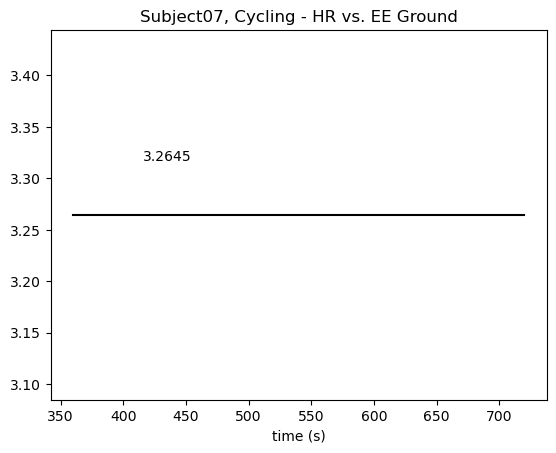

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Subject07 Incline
-----------
Standing Average HR: 74.6
[6.2833, 3.7189, 5.5512, 12.0594]
[43.8556, nan, nan, nan]
        HR       EE
0  43.8556   6.2833
1      NaN   3.7189
2      NaN   5.5512
3      NaN  12.0594
        HR      EE  Index    Subject Activity
0  43.8556  6.2833    360  Subject07  Incline


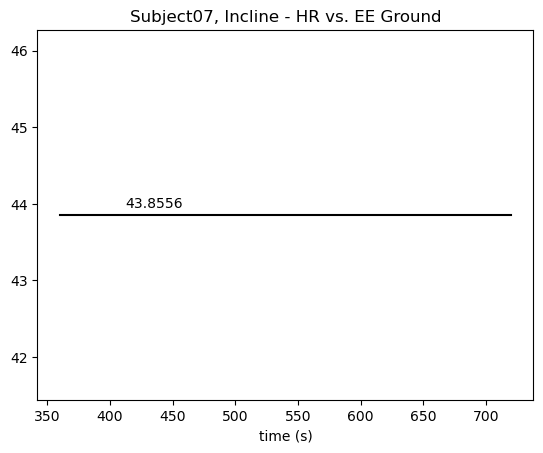

Subject07 Running
-----------
Standing Average HR: 66.2127659574468
[0.0, 3.1609, 10.8107, 14.4348, 9.5884, 0.5255]
[66.0428, nan, nan, nan, nan]
        HR       EE
0  66.0428   3.1609
1      NaN  10.8107
2      NaN  14.4348
3      NaN   9.5884
4      NaN   0.5255
        HR      EE  Index    Subject Activity
0  66.0428  3.1609    360  Subject07  Running


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


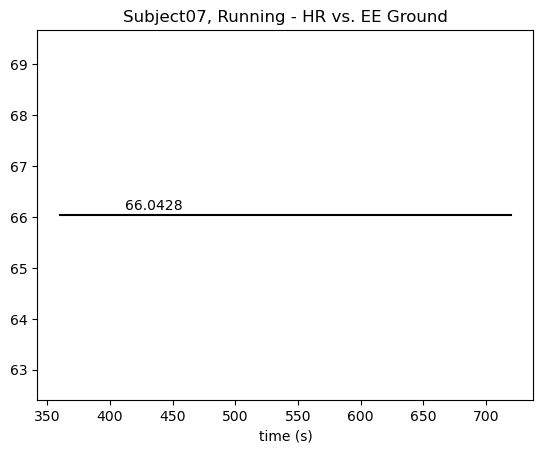

Subject07 Stairs
-----------
Standing Average HR: 74.02083333333333
[0.0, 5.7274, 8.237, 7.4027, 0.3085]
[17.3395, nan, nan, nan, nan]
        HR      EE
0  17.3395  5.7274
1      NaN  8.2370
2      NaN  7.4027
3      NaN  0.3085
4      NaN  0.0000
        HR      EE  Index    Subject Activity
0  17.3395  5.7274    360  Subject07   Stairs


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


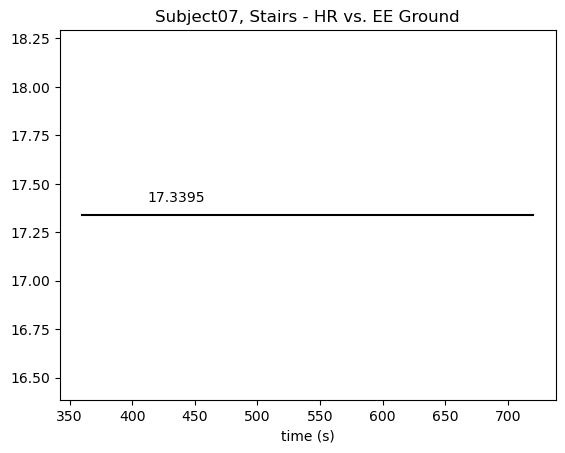

Subject07 Walking
-----------
Standing Average HR: 80.0
[-0.0, 3.476, 2.746, 2.2496, -0.1637]
[nan, nan, nan, nan, nan]
   HR      EE
0 NaN  3.4760
1 NaN  2.7460
2 NaN  2.2496
3 NaN -0.1637
4 NaN  0.0000
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


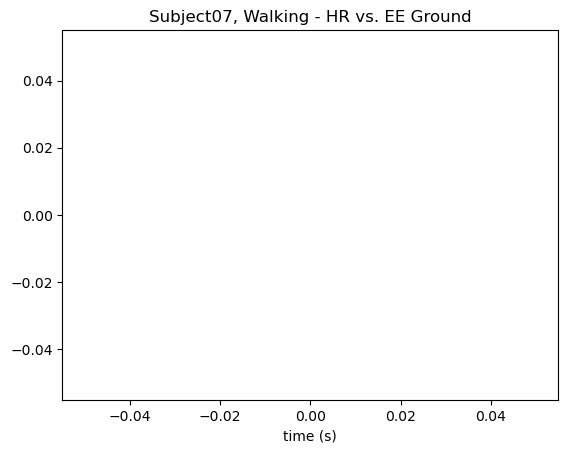

Subject08 Backwards
-----------
Standing Average HR: 90.79545454545455
[-0.0, 2.2197, 1.6366, 0.1784]
[nan, nan, nan, nan, nan]
ERROR
   HR      EE
0 NaN  2.2197
1 NaN  1.6366
2 NaN  0.1784
3 NaN  0.0000
4 NaN  0.0000
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


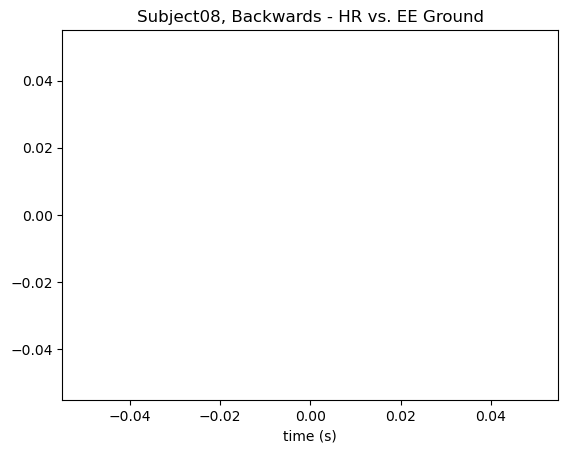

Subject08 Cycling
-----------
Standing Average HR: 101.30909090909091
[0.0, 5.5294, 4.5208, 3.1603, 5.6137, 0.3305]
[37.1242, nan, nan, nan, nan]
        HR      EE
0  37.1242  5.5294
1      NaN  4.5208
2      NaN  3.1603
3      NaN  5.6137
4      NaN  0.3305
        HR      EE  Index    Subject Activity
0  37.1242  5.5294    360  Subject08  Cycling


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


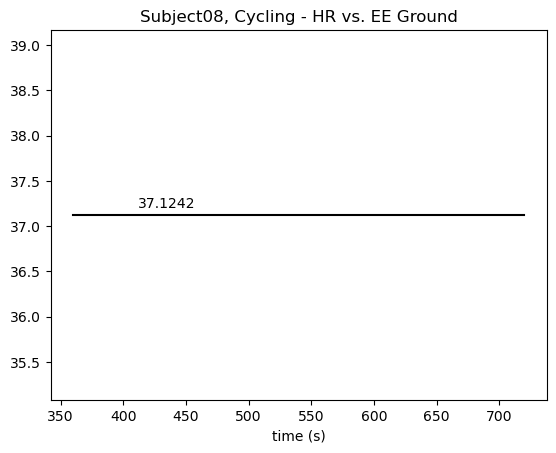

Subject08 Incline
-----------
Standing Average HR: 75.08695652173913
[5.2712, 2.9647, 4.6158, 9.5841]
[59.4519, nan, nan, nan]
        HR      EE
0  59.4519  5.2712
1      NaN  2.9647
2      NaN  4.6158
3      NaN  9.5841
        HR      EE  Index    Subject Activity
0  59.4519  5.2712    360  Subject08  Incline


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


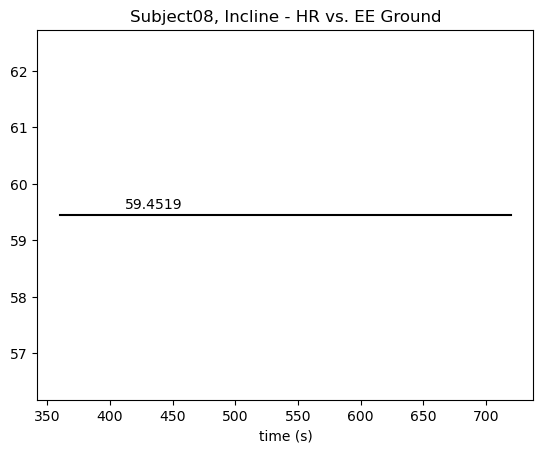

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Subject08 Running
-----------
Standing Average HR: 86.12820512820512
[-0.0, 2.7238, 8.3235, 7.2291, 10.5193, 0.7678]
[81.4829, nan, nan, nan, nan]
        HR       EE
0  81.4829   2.7238
1      NaN   8.3235
2      NaN   7.2291
3      NaN  10.5193
4      NaN   0.7678
        HR      EE  Index    Subject Activity
0  81.4829  2.7238    360  Subject08  Running


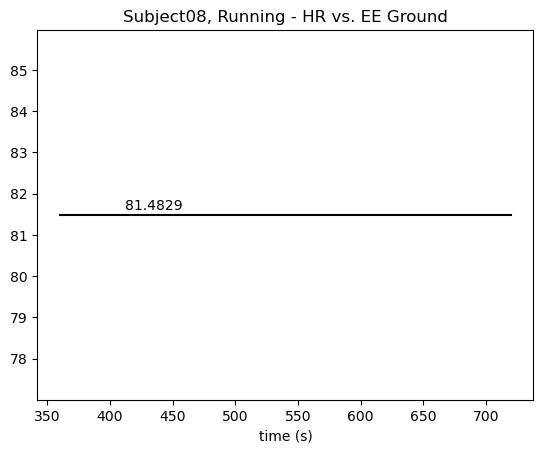

Subject08 Stairs
-----------
Standing Average HR: 106.64814814814815
[0.0, 4.8847, 3.5668, 4.6459, 0.2151]
[22.4185, nan, nan, nan, nan]
        HR      EE
0  22.4185  4.8847
1      NaN  3.5668
2      NaN  4.6459
3      NaN  0.2151
4      NaN  0.0000
        HR      EE  Index    Subject Activity
0  22.4185  4.8847    360  Subject08   Stairs


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


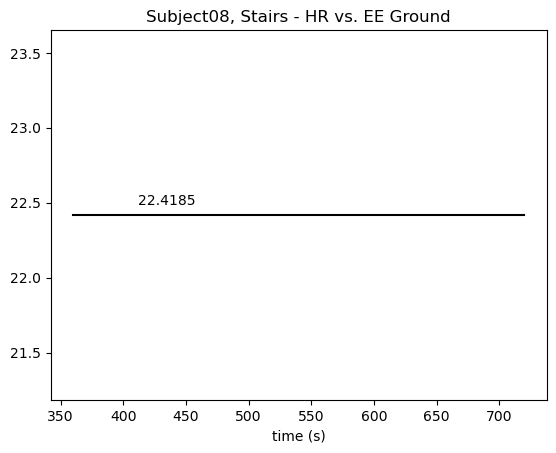

Subject08 Walking
-----------
Standing Average HR: 80.89285714285714
[0.0, 2.071, 1.6497, 2.8827, 0.112]
[nan, nan, nan, nan, nan]
   HR      EE
0 NaN  2.0710
1 NaN  1.6497
2 NaN  2.8827
3 NaN  0.1120
4 NaN  0.0000
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


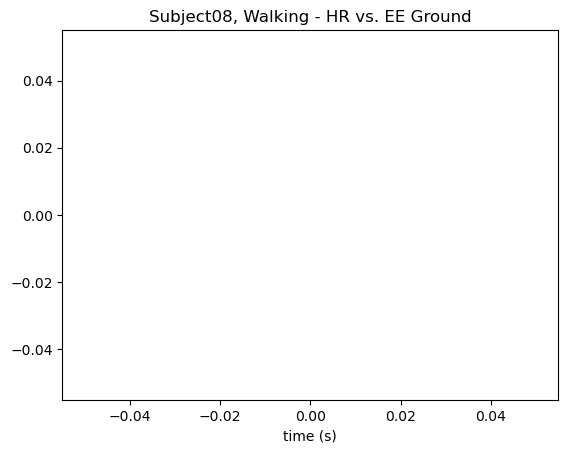

Subject09 Backwards
-----------
Standing Average HR: 73.52
[-0.0, 2.5614, 1.6818, -0.0327]
[nan, nan, nan, nan, nan]
ERROR
   HR      EE
0 NaN  2.5614
1 NaN  1.6818
2 NaN -0.0327
3 NaN  0.0000
4 NaN  0.0000
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


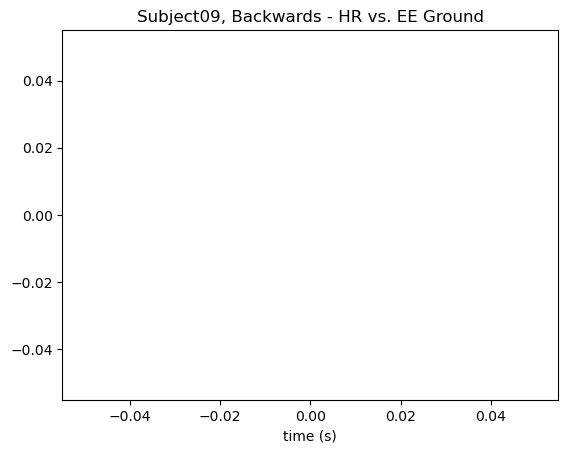

Subject09 Cycling
-----------
Standing Average HR: 73.21951219512195
[-0.0, 3.1042, 5.5057, 4.5028, 6.5951, 0.4261]
[14.7133, nan, nan, nan, nan]
        HR      EE
0  14.7133  3.1042
1      NaN  5.5057
2      NaN  4.5028
3      NaN  6.5951
4      NaN  0.4261
        HR      EE  Index    Subject Activity
0  14.7133  3.1042    360  Subject09  Cycling


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


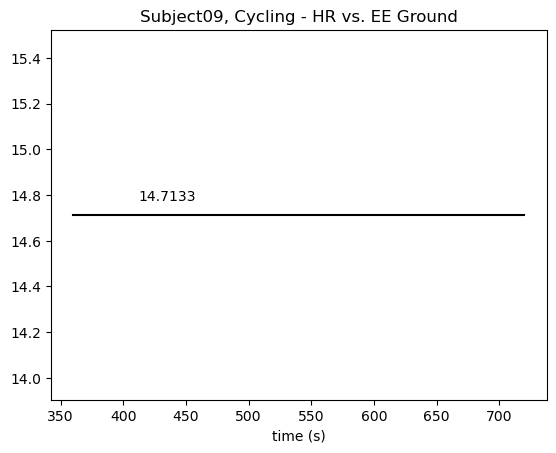

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Subject09 Incline
-----------
Standing Average HR: 67.96
[2.8285, 5.6529, 10.374, 5.5281]
[14.3959, nan, nan, nan]
        HR       EE
0  14.3959   2.8285
1      NaN   5.6529
2      NaN  10.3740
3      NaN   5.5281
        HR      EE  Index    Subject Activity
0  14.3959  2.8285    360  Subject09  Incline


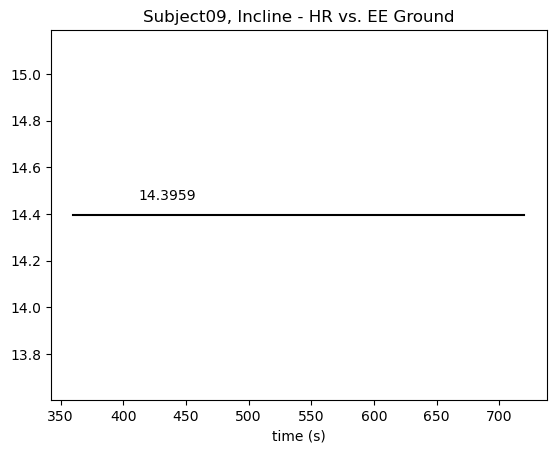

Subject09 Running
-----------
Standing Average HR: 66.44444444444444
[-0.0, 3.2825, 12.9414, 8.5384, 9.9443, 0.186]
[51.2556, nan, nan, nan, nan]
        HR       EE
0  51.2556   3.2825
1      NaN  12.9414
2      NaN   8.5384
3      NaN   9.9443
4      NaN   0.1860
        HR      EE  Index    Subject Activity
0  51.2556  3.2825    360  Subject09  Running


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


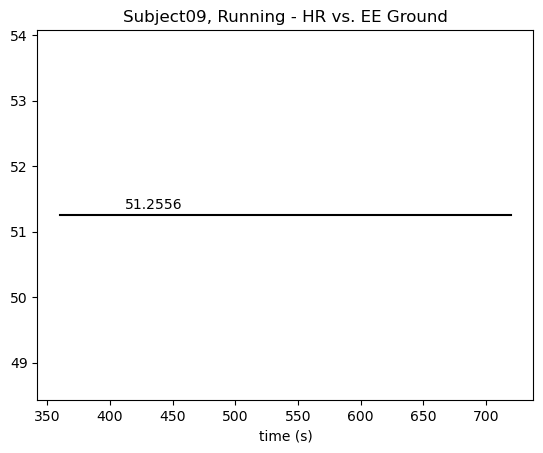

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Subject09 Stairs
-----------
Standing Average HR: 76.7872340425532
[-0.0, 5.3558, 4.6127, 6.0322, 0.0058]
[6.5017, nan, nan, nan, nan]
       HR      EE
0  6.5017  5.3558
1     NaN  4.6127
2     NaN  6.0322
3     NaN  0.0058
4     NaN  0.0000
       HR      EE  Index    Subject Activity
0  6.5017  5.3558    360  Subject09   Stairs


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


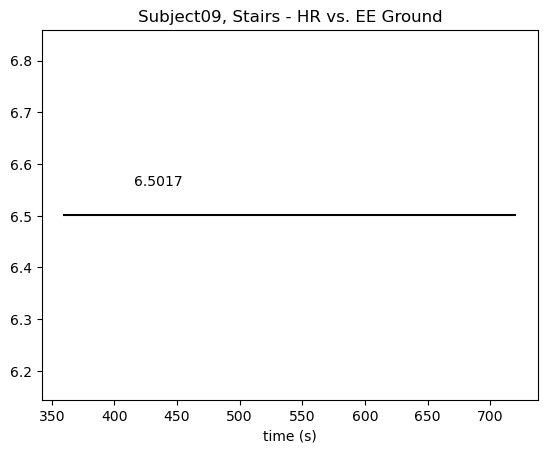

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Subject09 Walking
-----------
Standing Average HR: 72.4090909090909
[-0.0, 3.3898, 1.856, 2.4588, -0.2406]
[nan, nan, nan, nan, nan]
   HR      EE
0 NaN  3.3898
1 NaN  1.8560
2 NaN  2.4588
3 NaN -0.2406
4 NaN  0.0000
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


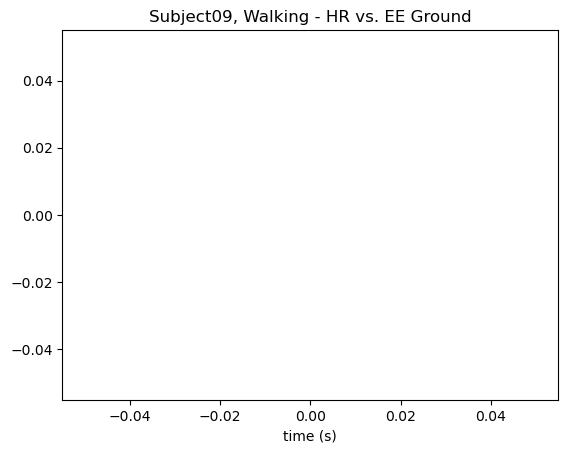

Subject10 Backwards
-----------
Standing Average HR: 92.0909090909091
[-0.0, 1.4237, 1.9392, -0.4124]
[-14.8369, nan, nan, nan, nan]
ERROR
        HR      EE
0 -14.8369  1.4237
1      NaN  1.9392
2      NaN -0.4124
3      NaN  0.0000
4      NaN  0.0000
        HR      EE  Index    Subject   Activity
0 -14.8369  1.4237    360  Subject10  Backwards


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


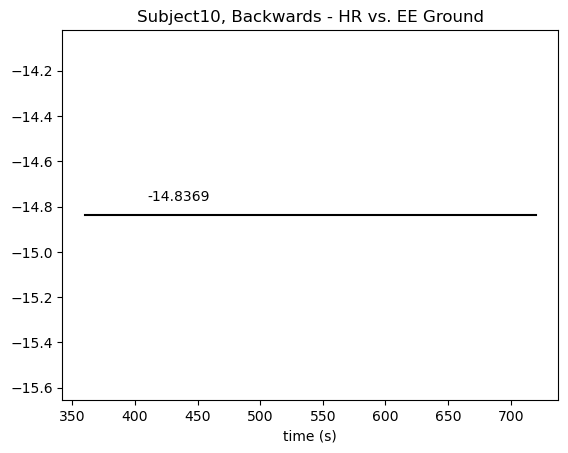

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Subject10 Cycling
-----------
Standing Average HR: 94.88135593220339
[-0.0, 2.7021, 5.5104, 5.1069, 4.1495, 0.1967]
[59.752, 11.5108, nan, nan, nan]
        HR      EE
0  59.7520  2.7021
1  11.5108  5.5104
2      NaN  5.1069
3      NaN  4.1495
4      NaN  0.1967
        HR      EE  Index    Subject Activity
0  59.7520  2.7021    360  Subject10  Cycling
1  11.5108  5.5104    720  Subject10  Cycling


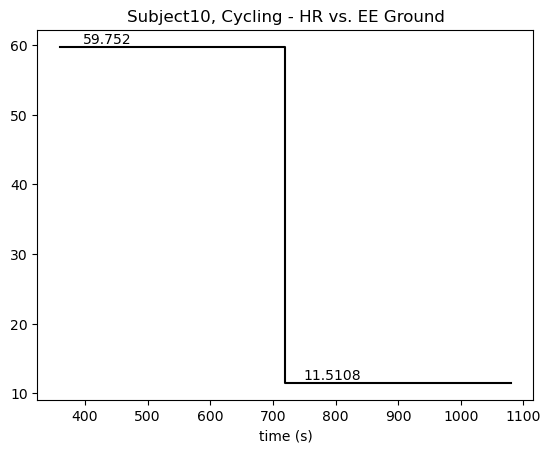

Subject10 Incline
-----------
Standing Average HR: 74.18032786885246
[2.4382, 4.7357, 9.2065, 4.428]
[47.7086, 35.3308, nan, nan]
        HR      EE
0  47.7086  2.4382
1  35.3308  4.7357
2      NaN  9.2065
3      NaN  4.4280
        HR      EE  Index    Subject Activity
0  47.7086  2.4382    360  Subject10  Incline
1  35.3308  4.7357    720  Subject10  Incline


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


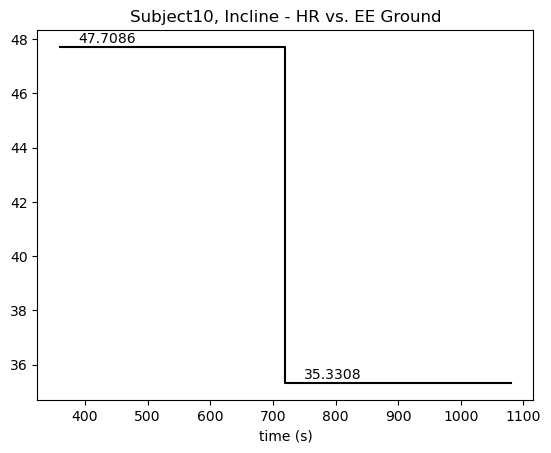

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Subject10 Running
-----------
Standing Average HR: 85.38095238095238
[0.0, 2.5287, 6.5194]
[nan, nan, nan, nan, nan]
ERROR
   HR      EE
0 NaN  2.5287
1 NaN  6.5194
2 NaN  0.0000
3 NaN  0.0000
4 NaN  0.0000
Empty DataFrame
Columns: [HR, EE, Index, Subject, Activity]
Index: []


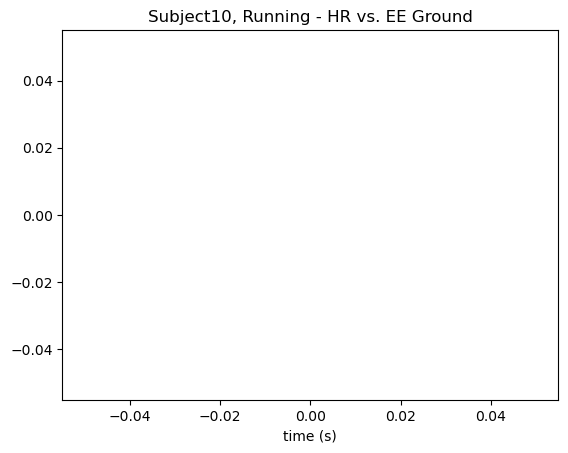

Subject10 Stairs
-----------
Standing Average HR: 105.45454545454545
[0.0, 3.8273, 5.4942, 5.0184, 0.2326]
[58.3955, nan, nan, nan, nan]
        HR      EE
0  58.3955  3.8273
1      NaN  5.4942
2      NaN  5.0184
3      NaN  0.2326
4      NaN  0.0000
        HR      EE  Index    Subject Activity
0  58.3955  3.8273    360  Subject10   Stairs


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


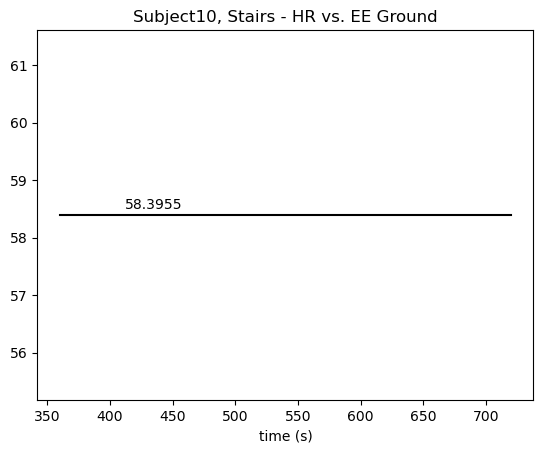

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Subject10 Walking
-----------
Standing Average HR: 70.63934426229508
[0.0, 2.1259, 1.706, 2.6765, -0.1005]
[2.8948, nan, nan, nan, nan]
       HR      EE
0  2.8948  2.1259
1     NaN  1.7060
2     NaN  2.6765
3     NaN -0.1005
4     NaN  0.0000
       HR      EE  Index    Subject Activity
0  2.8948  2.1259    360  Subject10  Walking


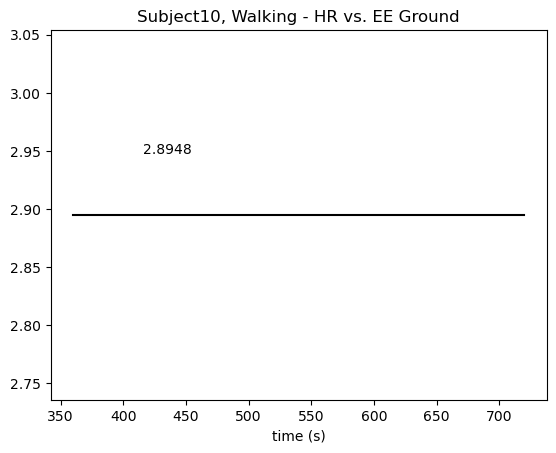

In [36]:
# 3 min averages
df_list = []
for subject in result.keys():
    hrPoints = []
    eePoints = []
    activity = []
    subjectTot = []

    indDF = globals()[subject[0]].astype(int)

    # Skip irrelevant activities
    if subject[1] in ['Backwards'] and subject[0] == 'Subject02':
        continue
    if subject[1] in ['Cycling'] and subject[0] == 'Subject05':
        continue
    if subject[1] in ['Backwards2', 'Cycling2']:
        continue

    print(subject[0] + " " + subject[1] + "\n" + "-----------")

    hr = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, 8]
    time_col = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, 0]
    hr_df = pd.DataFrame(hr, columns=['HR']).fillna(0)

    three_min = 3 * 60
    six_min = 6 * 60
    standing_mask = (time_col >= three_min) & (time_col < six_min)
    standing_avg_hr = hr_df['HR'][standing_mask].mean()
    print("Standing Average HR: " + str(standing_avg_hr))

    # Determine the number of intervals dynamically
    num_intervals = len(indDF[subject[1]]) - 1

    # Calculate HR means for each interval and subtract standing average
    hr_means = [
        round(
            hr_df.iloc[int((indDF[subject[1]][i] + indDF[subject[1]][i + 1]) / 2):int(indDF[subject[1]][i + 1])]
            .mean().values[0] - standing_avg_hr, 4
        )
        for i in range(num_intervals)
    ]

    # Filter steps based on activity
    if subject[1] == 'Incline':
        hrPoints = [hr_means[i] for i in range(num_intervals) if i != 2]
    else:
        hrPoints = hr_means

    # Time indices for plotting
    x = [indDF[subject[1]][i] for i in range(num_intervals)]
    y = hr_means

    # Calculate EE ground values
    VO2 = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, vo2]
    VCO2 = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, vco2]
    EE = (16.58 * VO2 + 4.15 * VCO2) / mass[0]
    EE_ground = np.zeros(np.size(EE))

    ind = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, code]
    ind = ind[:-1] - ind[1:]
    bool_ind = ind != 0.0
    indShift = np.where(bool_ind)[0]  # Last index for each phase
    indShift = np.concatenate((indShift, [len(ind)]))

    T_first_phase = result[subject[0]][subject[1]]['Metabolics_System']['Data'][indShift[0], 0]
    timeM3_first = T_first_phase - (3 * 60)
    bool_time_first = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, 0] < timeM3_first
    threeMin_first = indShift[0] - np.max(np.where(bool_time_first)[0])

    EE_avg_first = np.mean(EE[indShift[0] - threeMin_first:indShift[0]])

    for i in range(len(indShift)):
        T = result[subject[0]][subject[1]]['Metabolics_System']['Data'][indShift[i], 0]
        timeM3 = T - (3 * 60)
        bool_time = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, 0] < timeM3
        threeMin = indShift[i] - np.max(np.where(bool_time)[0])

        if i == 0:
            EE_ground[0:indShift[i]] = np.mean(EE[indShift[i] - threeMin: indShift[i]]) - EE_avg_first
            eePoints.append(round(np.mean(EE[indShift[i] - threeMin: indShift[i]] - EE_avg_first), 4))
        elif i == len(indShift) - 1:
            EE_ground[indShift[i - 1]:] = np.mean(EE[-threeMin:]) - EE_avg_first
            eePoints.append(round(np.mean(EE[-threeMin:] - EE_avg_first), 4))
        else:
            EE_ground[indShift[i - 1]: indShift[i] + 1] = np.mean(EE[indShift[i] - threeMin: indShift[i]]) - EE_avg_first
            eePoints.append(round(np.mean(EE[indShift[i] - threeMin: indShift[i]] - EE_avg_first), 4))

    if subject[1] == 'Incline':
        del eePoints[3]
        eePoints = eePoints[1:-1]
    print(eePoints)
    print(hrPoints)
    if subject[1] != 'Incline':
        eePoints.append(0)
        eePoints = eePoints[1:6]
    if len(eePoints) is not len(hrPoints):
        print('ERROR')
        if len(eePoints) > len(hrPoints):
            while len(hrPoints) != len(eePoints):
                hrPoints.append(0)
        if len(eePoints) < len(hrPoints):
            while len(hrPoints) != len(eePoints):
                eePoints.append(0)

    hr_eeDF = pd.DataFrame({'HR': hrPoints, 'EE': eePoints})
    print(hr_eeDF)
    hr_eeDF = hr_eeDF.dropna()
    indPoints = indDF[subject[1]][0:len(hr_eeDF)]
    hr_eeDF['Index'] = indPoints
    for i in range(len(hr_eeDF)):
        activity.append(subject[1])
        subjectTot.append(subject[0])
    hr_eeDF['Subject'] = subjectTot
    hr_eeDF['Activity'] = activity
    print(hr_eeDF)
    df_list.append(hr_eeDF)

    plt.figure(1)

    plt.title(subject[0] + ", " + subject[1] + " - HR vs. EE Ground")

    color = 'tab:blue'
    ax1.set_xlabel('Index')
    ax1.set_ylabel('HR (bpm)', color=color)
    ax1.plot(hr_eeDF['HR'], color=color)
    ax1.tick_params(axis='y', labelcolor=color)

    plt.step(x, y, where='post', color='black')
    for i in range(len(x) - 1):
        plt.text(x[i] + 75, y[i] + 0.05, f'{y[i]}', ha='center', va='bottom')

    ax2 = ax1.twinx()

    color = 'tab:orange'
    ax2.set_ylabel('EE Ground (W/kg)', color=color)
    ax2.plot(hr_eeDF['Index'], hr_eeDF['EE'], color=color)
    ax2.tick_params(axis='y', labelcolor=color)

    title = subject[0] + ", " + subject[1] + " - HR vs. EE Ground"
    plt.xlabel('time (s)')
    plt.title(title)
    plt.show()


In [37]:
df_list = []

for subject in result.keys():
    hrPoints = []
    eePoints = []
    activity = []
    subjectTot = []

    indDF = globals()[subject[0]].astype(int)

    # Skip irrelevant activities
    if subject[1] in ['Backwards'] and subject[0] == 'Subject02':
        continue
    if subject[1] in ['Cycling'] and subject[0] == 'Subject05':
        continue
    if subject[1] in ['Backwards2', 'Cycling2']:
        continue

    print(f"{subject[0]} {subject[1]}\n-----------")

    hr = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, 8]
    time_col = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, 0]
    hr_df = pd.DataFrame(hr, columns=['HR']).fillna(0)

    # Compute standing average HR from minute 3 to 6
    standing_mask = (time_col >= 3 * 60) & (time_col <= 6 * 60)
    standing_avg_hr = hr_df['HR'][standing_mask].mean()
    print("Standing Average HR:", standing_avg_hr)
    
    num_intervals = len(indDF[subject[1]]) - 1

    for i in range(len(indDF[subject[1]]) - 1):
        interval_start = int(indDF[subject[1]][i])
        time_start = result[subject[0]][subject[1]]['Metabolics_System']['Data'][interval_start, 0]
        interval_end = int(indDF[subject[1]][i + 1])
        time_end = result[subject[0]][subject[1]]['Metabolics_System']['Data'][interval_end, 0]
        data = result[subject[0]][subject[1]]['Metabolics_System']['Data']

        for minute in range(5):
            bin_start = int(time_start + minute * 60)
            start_idx = np.argmax(data[:, 0] == bin_start)

            bin_end = int(bin_start + 60)
            end_idx = np.argmax(data[:, 0] == bin_end)

            if bin_end < time_end:
                
                mean_val = round(np.mean(result[subject[0]][subject[1]]['Metabolics_System']['Data'][start_idx:end_idx, 8]) - standing_avg_hr, 4)
                hrPoints.append(mean_val)
            else:
                break
                
    hrPoints = [x for x in hrPoints if x == x]
    print(hrPoints)

    # EE calculation (unchanged from your version)
    VO2 = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, vo2]
    VCO2 = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, vco2]
    EE = (16.58 * VO2 + 4.15 * VCO2) / mass[0]
    EE_ground = np.zeros(np.size(EE))

    ind = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, code]
    ind = ind[:-1] - ind[1:]
    bool_ind = ind != 0.0
    indShift = np.where(bool_ind)[0]
    indShift = np.concatenate((indShift, [len(ind)]))

    T_first_phase = result[subject[0]][subject[1]]['Metabolics_System']['Data'][indShift[0], 0]
    timeM3_first = T_first_phase - (3 * 60)
    bool_time_first = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, 0] < timeM3_first
    threeMin_first = indShift[0] - np.max(np.where(bool_time_first)[0])

    EE_avg_first = np.mean(EE[indShift[0] - threeMin_first:indShift[0]])

    for i in range(len(indShift)):
        T = result[subject[0]][subject[1]]['Metabolics_System']['Data'][indShift[i], 0]
        timeM3 = T - (3 * 60)
        bool_time = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, 0] < timeM3
        threeMin = indShift[i] - np.max(np.where(bool_time)[0])

        if i == 0:
            EE_ground[0:indShift[i]] = np.mean(EE[indShift[i] - threeMin: indShift[i]]) - EE_avg_first
            eePoints.append(round(np.mean(EE[indShift[i] - threeMin: indShift[i]] - EE_avg_first), 4))
        elif i == len(indShift) - 1:
            EE_ground[indShift[i - 1]:] = np.mean(EE[-threeMin:]) - EE_avg_first
            eePoints.append(round(np.mean(EE[-threeMin:] - EE_avg_first), 4))
        else:
            EE_ground[indShift[i - 1]: indShift[i] + 1] = np.mean(EE[indShift[i] - threeMin: indShift[i]]) - EE_avg_first
            eePoints.append(round(np.mean(EE[indShift[i] - threeMin: indShift[i]] - EE_avg_first), 4))
    # eePoints = eePoints[1:-1]
    # Drop minute 6 if present 
    # print(len(eePoints), len(hrPoints))
    # if (len(eePoints) * 5) != len(hrPoints):
    #     print("Length mismatch in", subject[0], subject[1])
    #     while len(hrPoints) < len(eePoints) * 5:
    #         hrPoints.append(0)
    #     while len(hrPoints) > len(eePoints) * 5:
    #         hrPoints = hrPoints[:-1]

    hr_eeDF = pd.DataFrame({
        'HR': hrPoints,
        'EE': np.repeat(eePoints, 5)[:len(hrPoints)]
    })

    hr_eeDF['Index'] = list(range(len(hr_eeDF)))
    hr_eeDF['Subject'] = [subject[0]] * len(hr_eeDF)
    hr_eeDF['Activity'] = [subject[1]] * len(hr_eeDF)
    hr_eeDF['Time'] = [360 + 60 * i + 60 * ((i + 1) // 5) for i in range(len(hrPoints))]
    
#     if subject[1] == 'Incline':
#         hr_eeDF = hr_eeDF.drop(hr_eeDF.index[10:15]).reset_index(drop=True)
        
    print(hr_eeDF)
    df_list.append(hr_eeDF)
    
    x = hr_eeDF['Time'].to_list()
    y_hr = hr_eeDF['HR'].to_list()
    y_ee = hr_eeDF['EE'].to_list()

    fig, ax1 = plt.subplots()

    color = 'tab:blue'
    ax1.set_xlabel('Time (s)')
    ax1.set_ylabel('HR (bpm)', color=color)
    ax1.step(x, y_hr, where='post', color=color, label='HR (bpm)')
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()

    color = 'tab:orange'
    ax2.set_ylabel('EE Ground (W/kg)', color=color)
    ax2.step(x, y_ee, where='post', color=color, label='EE Ground')
    ax2.tick_params(axis='y', labelcolor=color)

    title = subject[0] + ", " + subject[1] + " - HR vs. EE Ground"
    plt.title(title)

    fig.tight_layout()
    plt.show()


Subject01 Backwards
-----------
Standing Average HR: 80.50909090909092


IndexError: index 720 is out of bounds for axis 0 with size 591

In [39]:
pd.set_option('display.max_rows', 2000)
final_df = pd.concat(df_list, ignore_index=True)
print(final_df)

ValueError: No objects to concatenate

R for Subject01: 0.3852280357496367
R for Subject02: 0.002021201194857154
R for Subject03: 0.04100354923300669
R for Subject04: 0.636070035543609
R for Subject05: 0.1243492154513961
R for Subject06: 0.3185710281727426
R for Subject07: 0.07914982786944144
R for Subject08: 0.04463563312226345
R for Subject09: 0.022790054679460093
R for Subject10: 0.2535843655961176


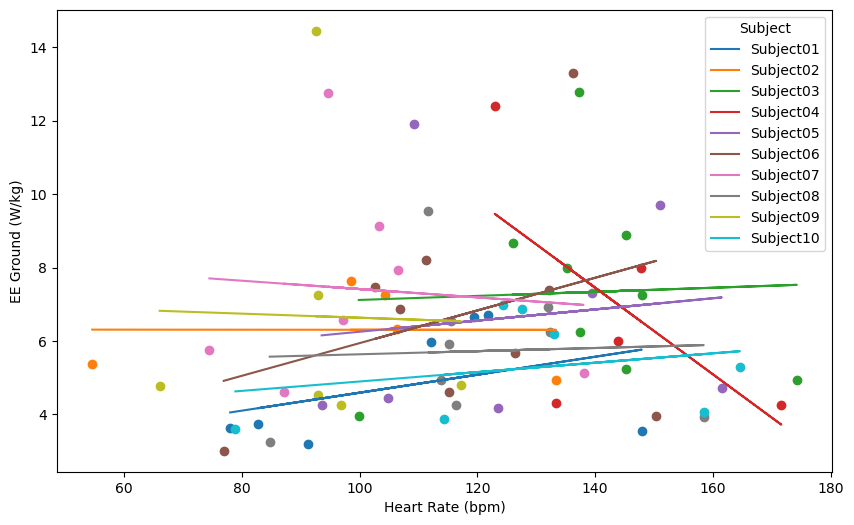

In [40]:
# Create a list of unique subjects
import math
from sklearn.metrics import r2_score

subjects = final_df['Subject'].unique()
final_df = final_df[final_df['EE'] != 0]

# Create the plot
plt.figure(figsize=(10, 6))

# Plot each subject with a line of best fit
for subject in subjects:
    # Filter the data for each subject
    subject_data = final_df[final_df['Subject'] == subject]
    
    # Scatter plot for HR vs EE
    plt.scatter(subject_data['HR'], subject_data['EE'])
    
    # Fit a line (best fit) for the data points
    m, b = np.polyfit(subject_data['HR'], subject_data['EE'], 1)
    y_pred = m * subject_data['HR'] + b
    plt.plot(subject_data['HR'], y_pred, label=subject)
    
    r2 = r2_score(subject_data['EE'], y_pred)
    r = math.sqrt(r2)
    print(f"R for {subject}: {r}")


# Add titles and labels
plt.xlabel('Heart Rate (bpm)')
plt.ylabel('EE Ground (W/kg)')

# Show the legend
plt.legend(title='Subject')

# Show the plot
plt.show()


In [41]:
# 3 min averages
df_list = []
for subject in result.keys():
    hrPoints = []
    activity = []
    subjectTot = []

    indDF = globals()[subject[0]].astype(int)

    # Skip irrelevant activities
    if subject[1] in ['Backwards2', 'Cycling2']:
        continue

    print(subject[0] + " " + subject[1] + "\n" + "-----------")

    hr = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, 8]
    hr_df = pd.DataFrame(hr, columns=['HR']).fillna(0)

    # Determine the number of intervals dynamically
    num_intervals = len(indDF[subject[1]]) - 1

    # Calculate HR means for each interval
    hr_variances = []
    for i in range(num_intervals):
        start_idx = int((indDF[subject[1]][i] + indDF[subject[1]][i + 1]) / 2)
        end_idx = int(indDF[subject[1]][i + 1])

        # Calculate variance for the interval
        interval_variance = round(hr_df.iloc[start_idx:end_idx]['HR'].var(), 4)
        hr_variances.append(interval_variance)

    if subject[1] == 'Incline':
        del(hr_variances[2])
    print(hr_variances)
    print("\n")
    

Subject01 Backwards
-----------
[11.0831, nan, nan, nan, nan]


Subject01 Cycling
-----------
[3.6062, nan, nan, nan, nan]


Subject01 Incline
-----------
[317.9486, nan, nan, nan]


Subject01 Running
-----------
[8.2908, nan, nan, nan, nan]


Subject01 Walking
-----------
[0.6932, nan, nan, nan, nan]


Subject02 Backwards
-----------
[nan, nan, nan, nan, nan]


Subject02 Cycling
-----------
[nan, nan, nan, nan, nan]


Subject02 Incline
-----------
[nan, nan, nan, nan]


Subject02 Running
-----------
[885.7453, nan, nan, nan, nan]


Subject02 Stairs
-----------
[nan, nan, nan, nan, nan]


Subject02 Walking
-----------
[nan, nan, nan, nan, nan]


Subject03 Backwards
-----------
[nan, nan, nan, nan, nan]


Subject03 Cycling
-----------
[6.2663, nan, nan, nan, nan]


Subject03 Incline
-----------
[258.9436, 11.2919, nan, nan]


Subject03 Running
-----------
[78.0433, 2.3015, nan, nan, nan]


Subject03 Stairs
-----------
[11.9082, 24.3946, nan, nan, nan]


Subject03 Walking
-----------
[23

Subject01 Backwards
-----------


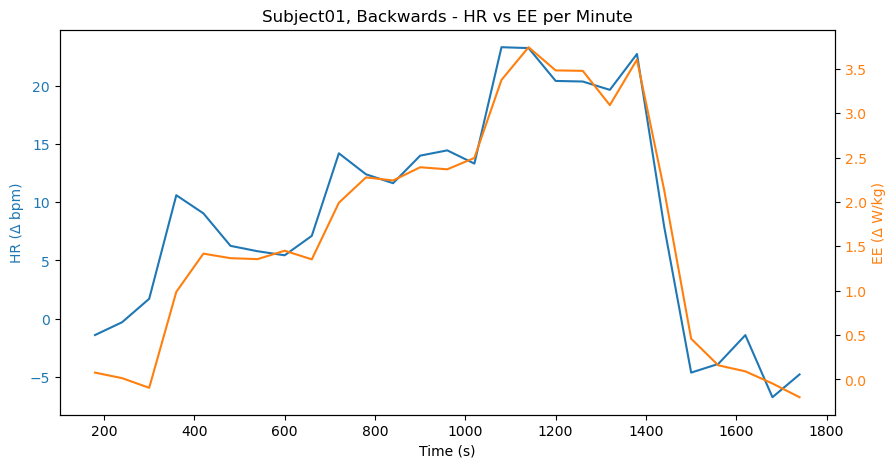

Subject01 Cycling
-----------


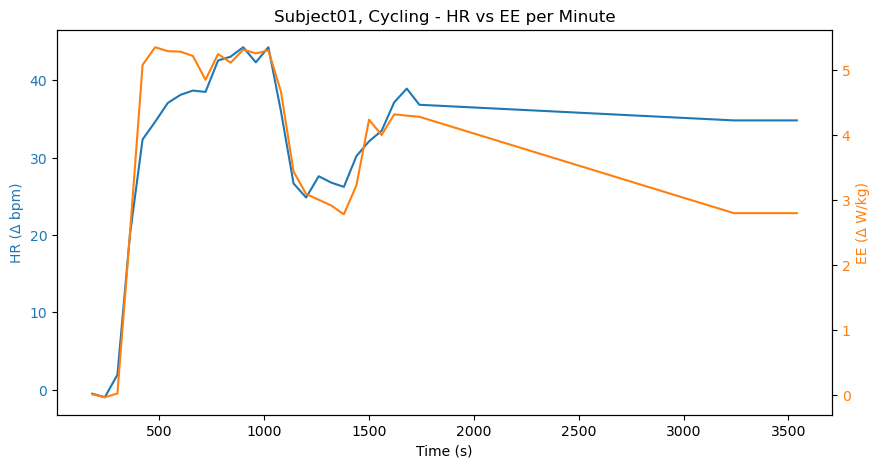

Subject01 Incline
-----------


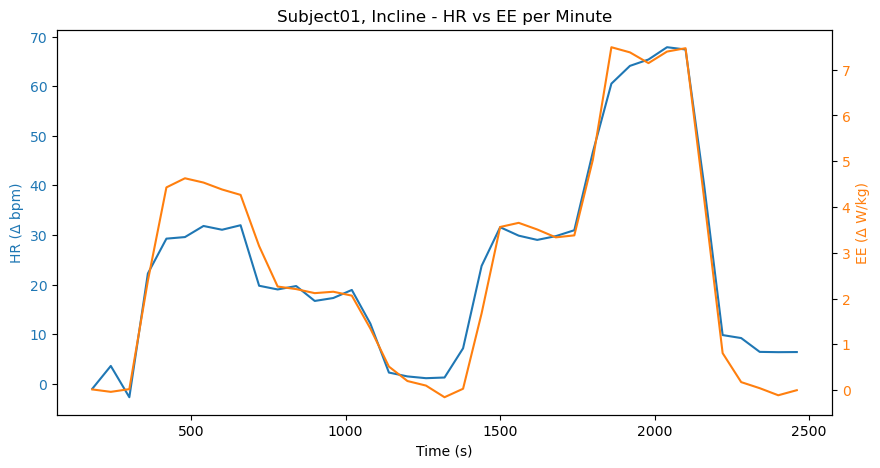

Subject01 Running
-----------


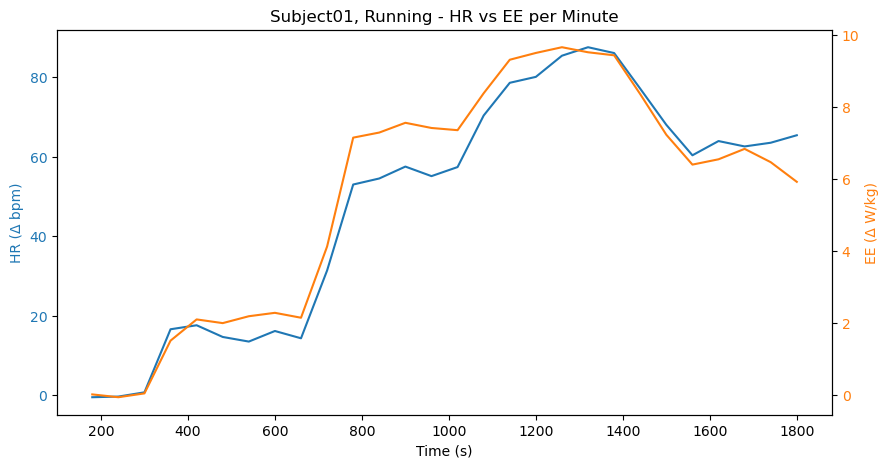

Subject01 Walking
-----------


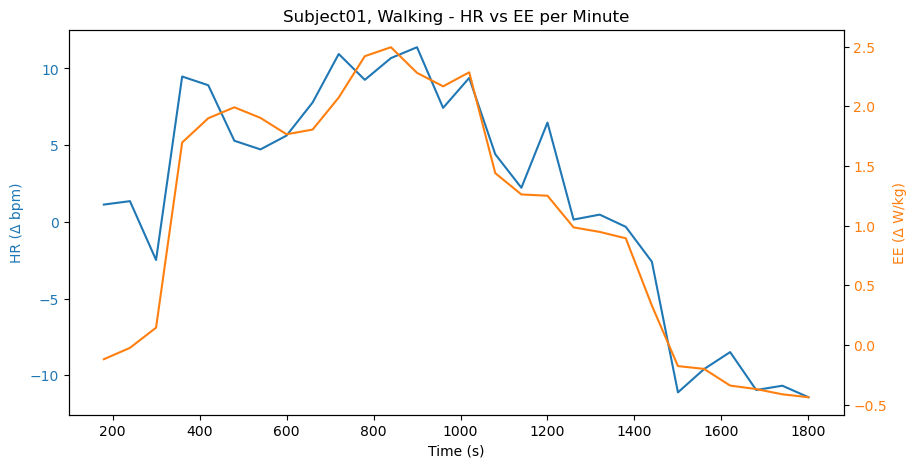

Subject02 Cycling
-----------


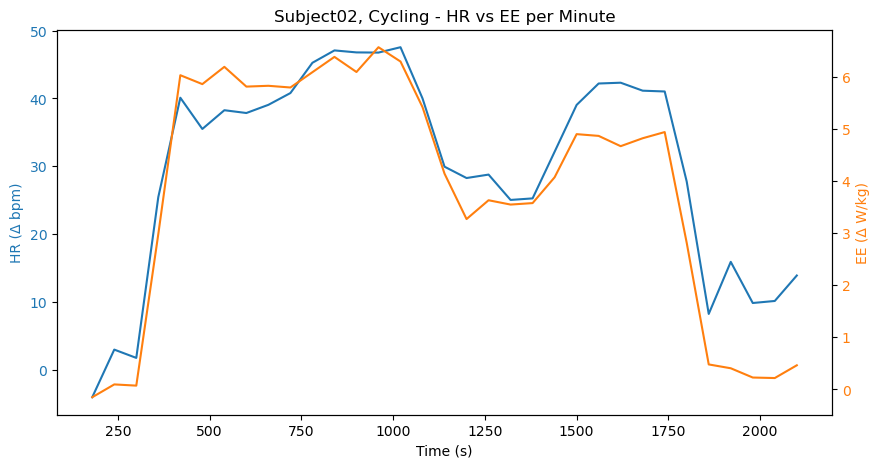

Subject02 Incline
-----------


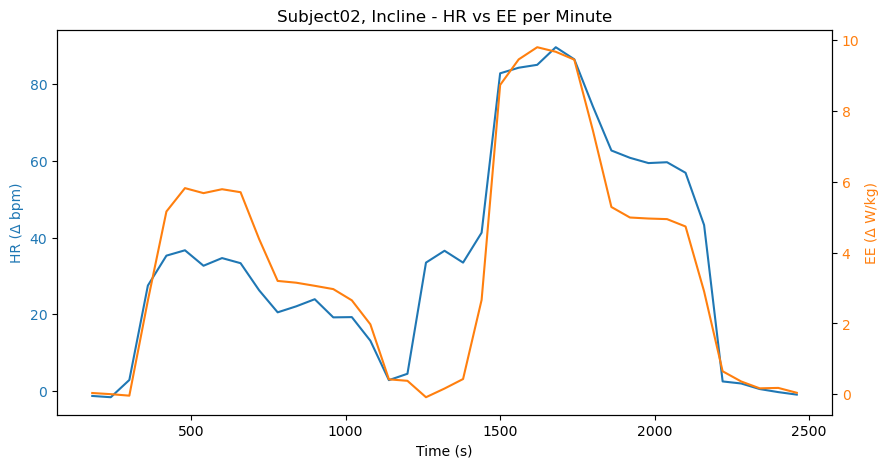

Subject02 Running
-----------


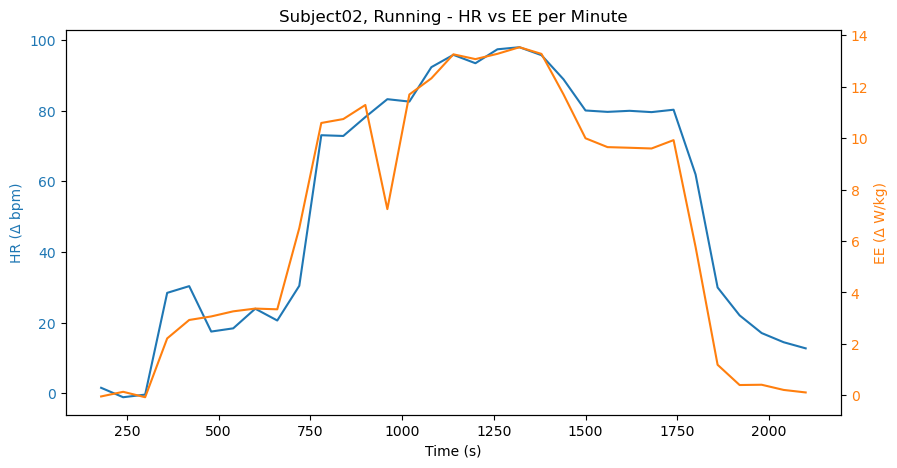

Subject02 Stairs
-----------


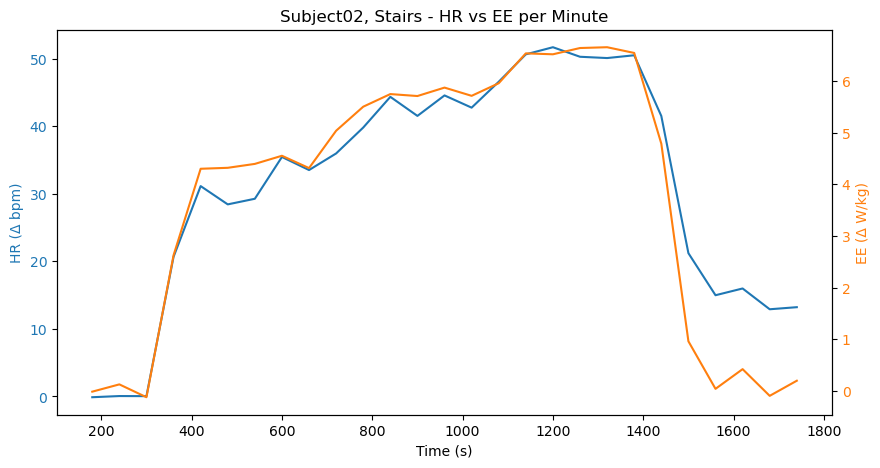

Subject02 Walking
-----------


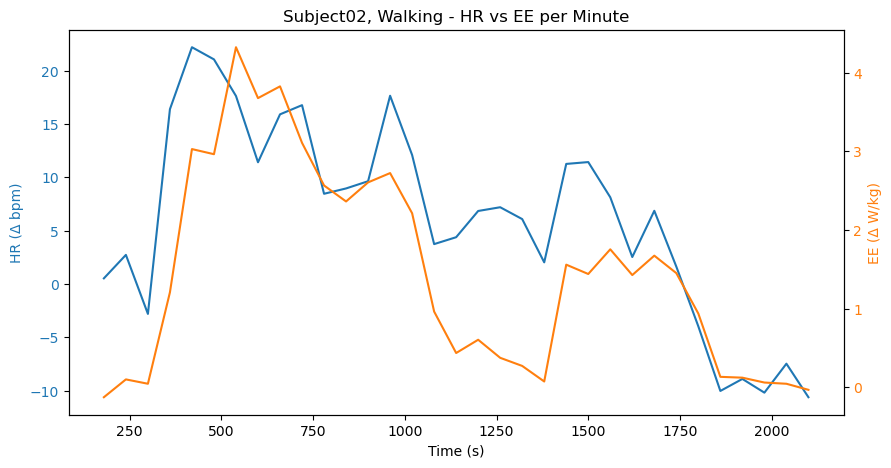

Subject03 Backwards
-----------


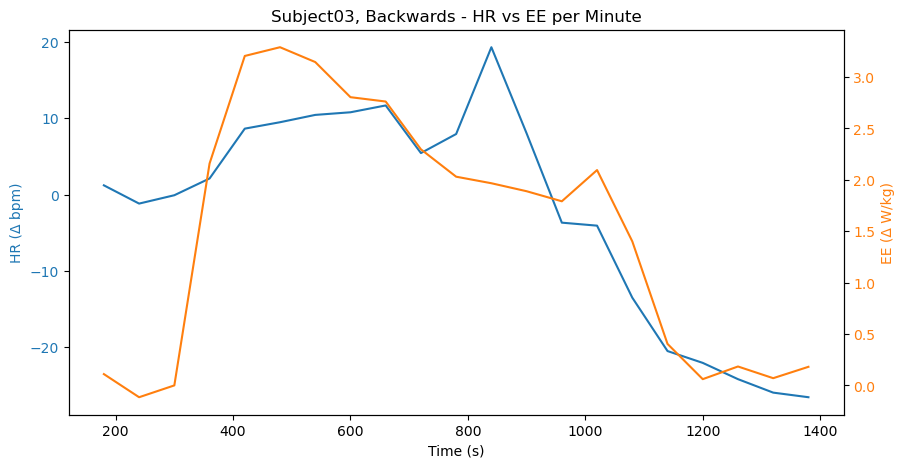

Subject03 Cycling
-----------


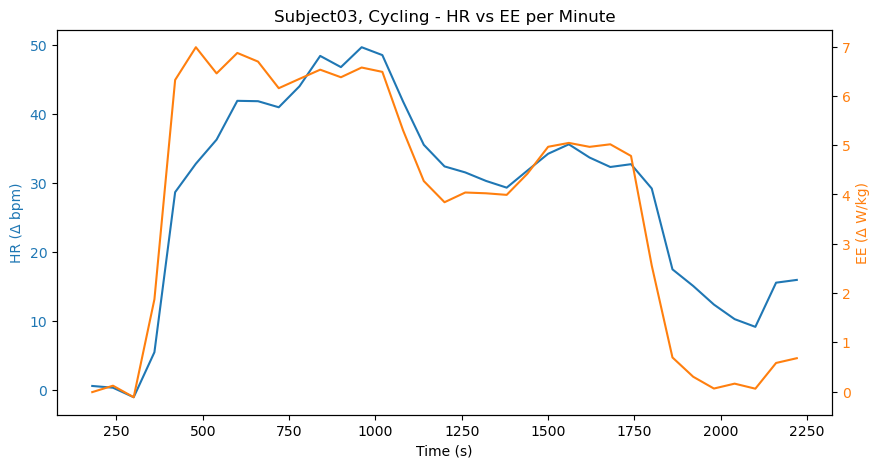

Subject03 Incline
-----------


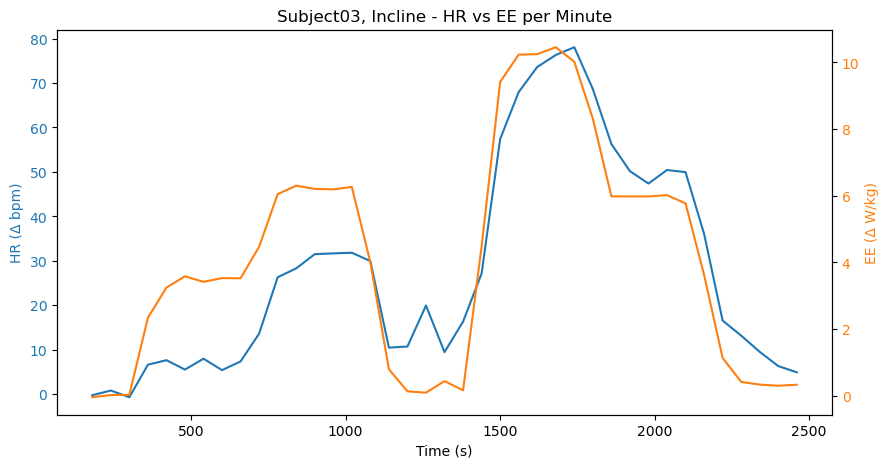

Subject03 Running
-----------


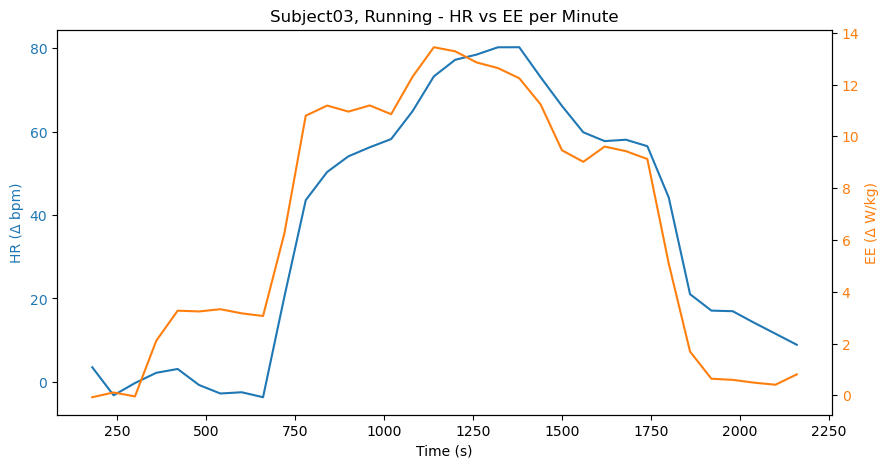

Subject03 Stairs
-----------


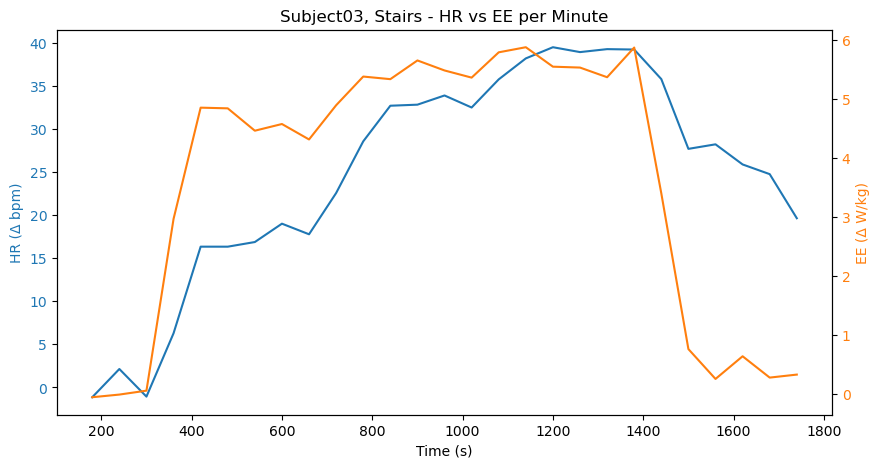

Subject03 Walking
-----------


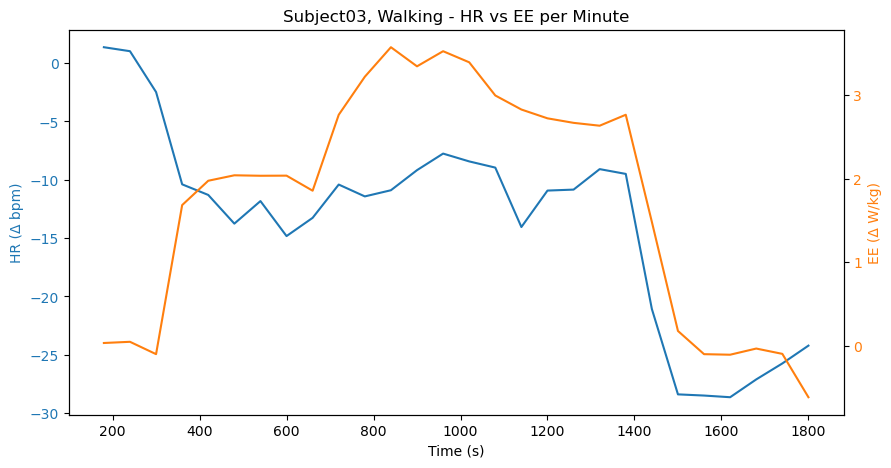

Subject04 Backwards
-----------


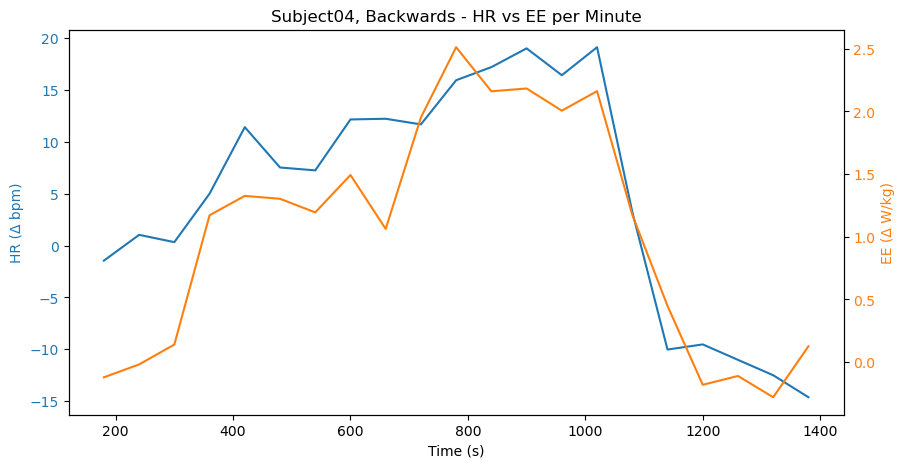

Subject04 Cycling
-----------


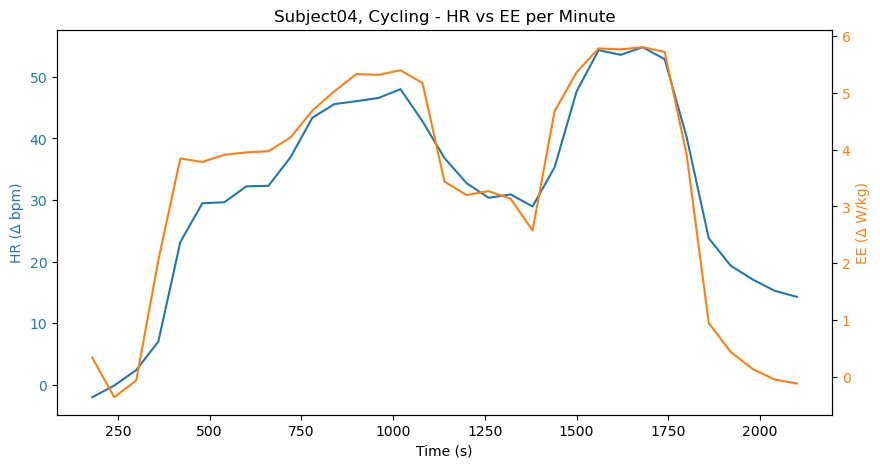

Subject04 Incline
-----------


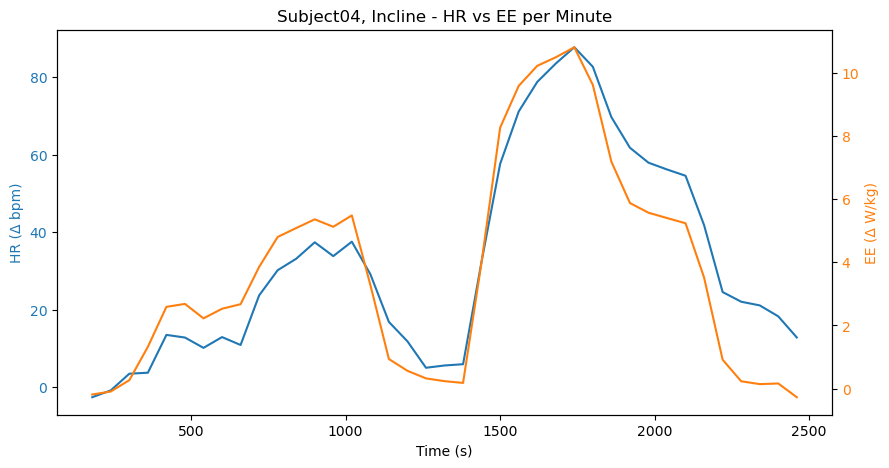

Subject04 Running
-----------


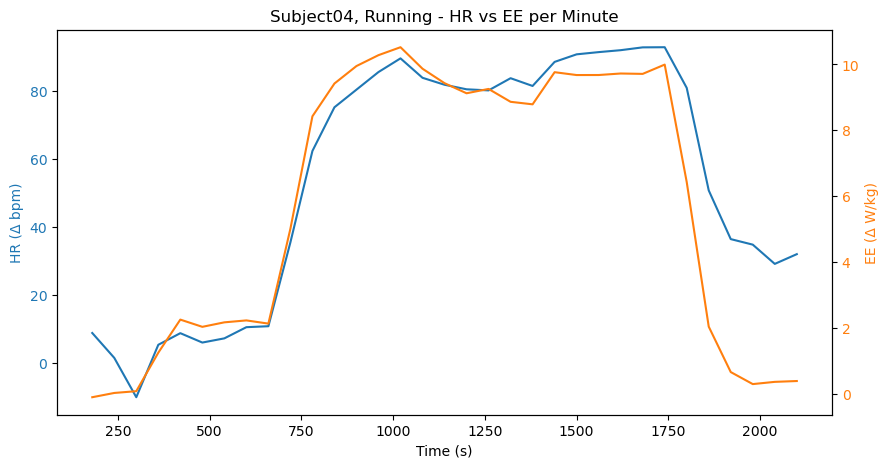

Subject04 Stairs
-----------


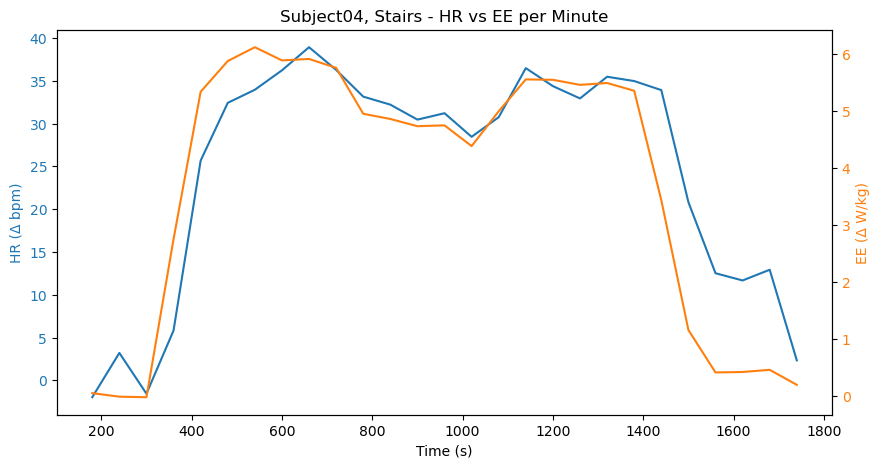

Subject04 Walking
-----------


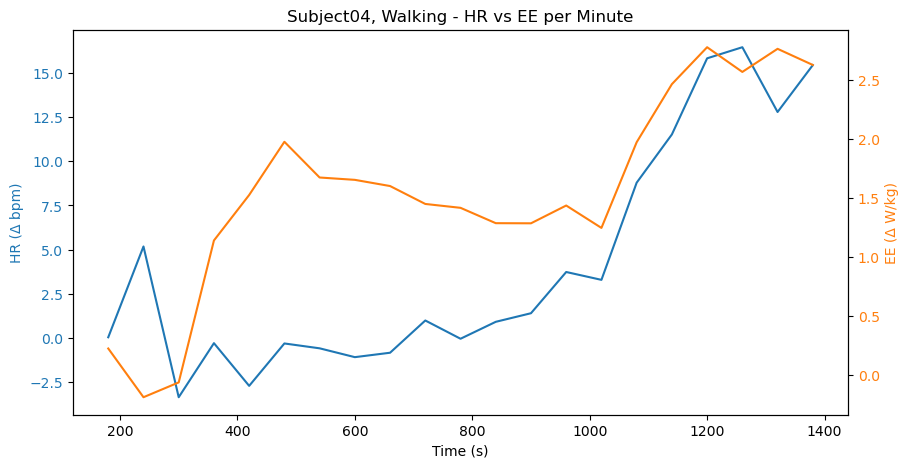

Subject05 Backwards
-----------


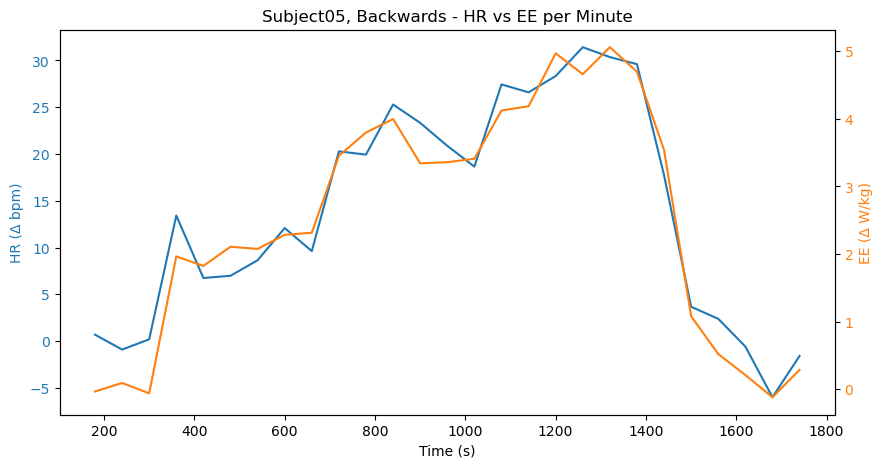

Subject05 Incline
-----------


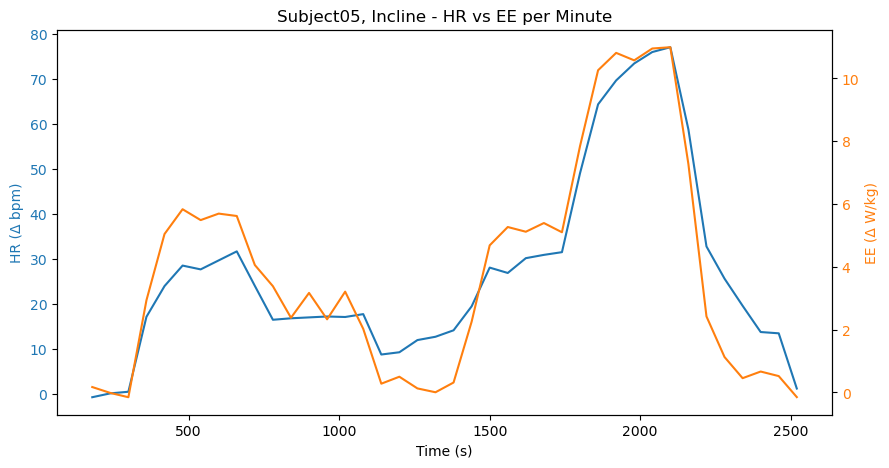

Subject05 Running
-----------


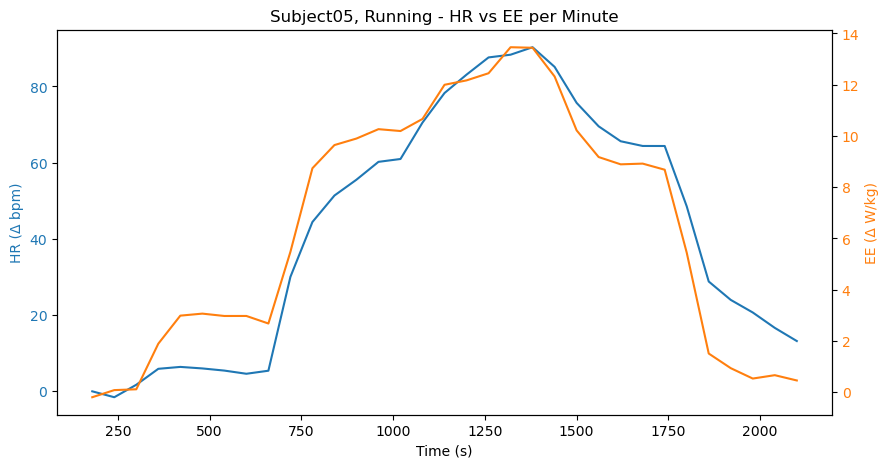

Subject05 Stairs
-----------


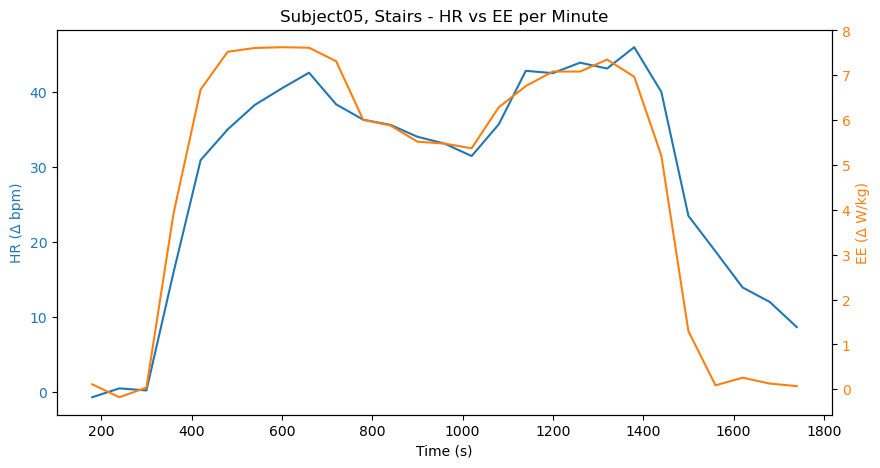

Subject05 Walking
-----------


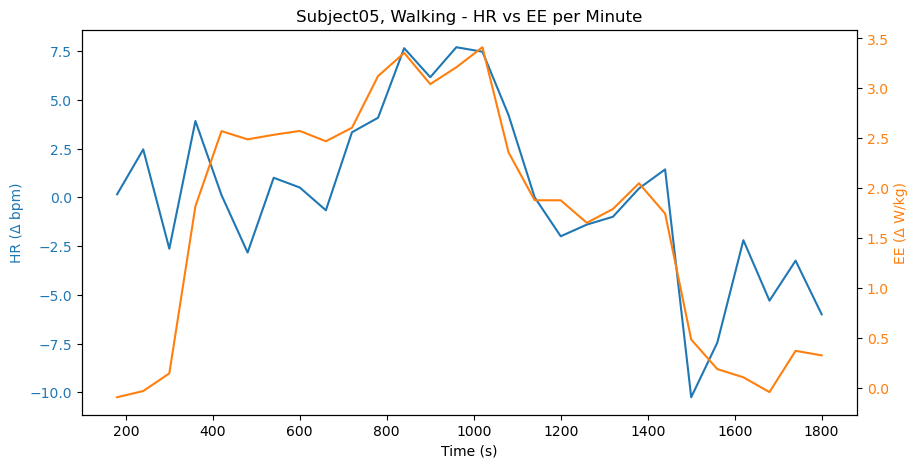

Subject06 Backwards
-----------


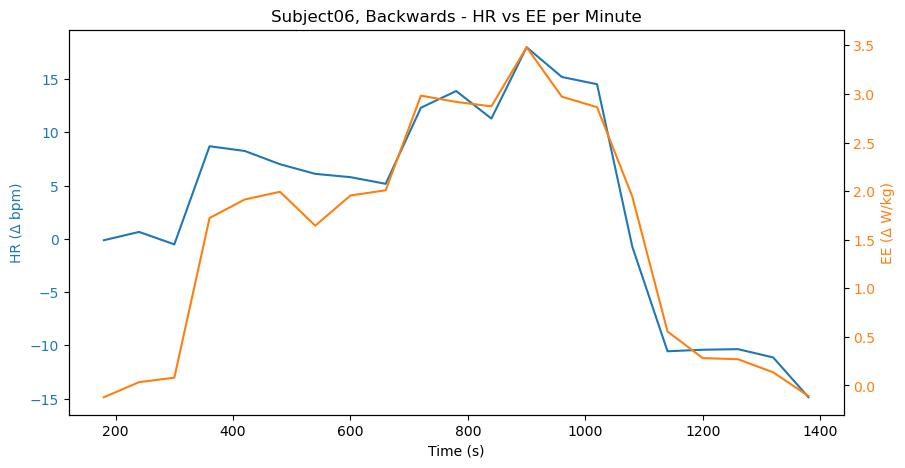

Subject06 Cycling
-----------


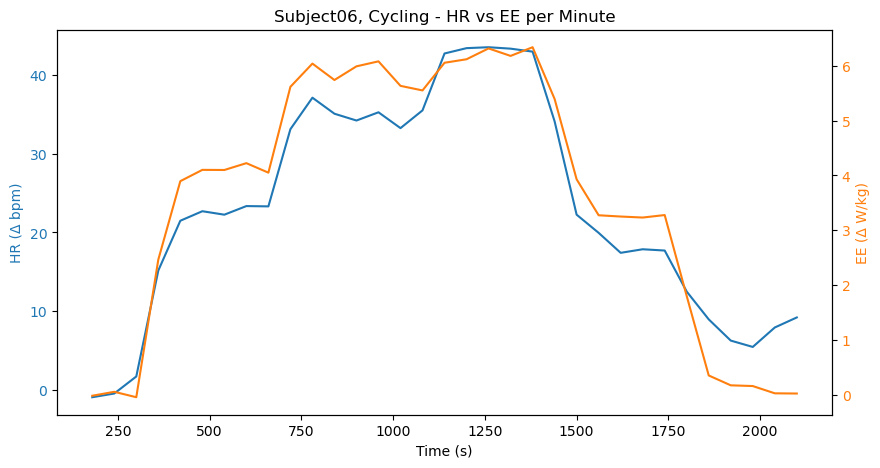

Subject06 Incline
-----------


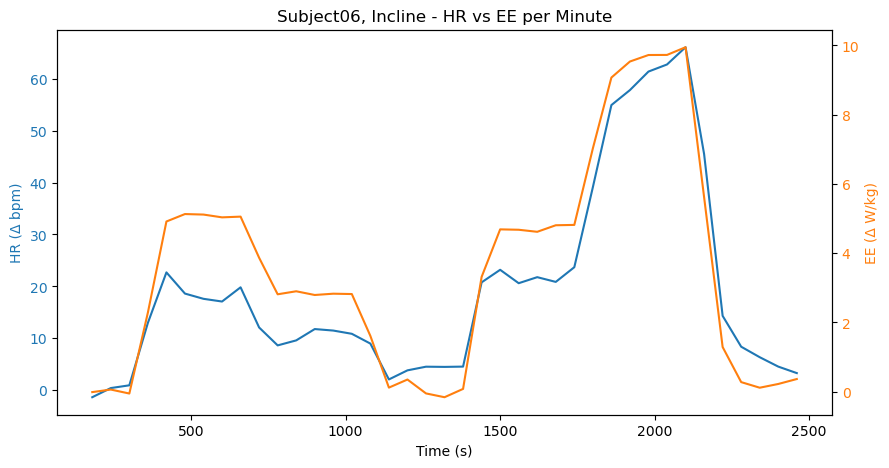

Subject06 Running
-----------


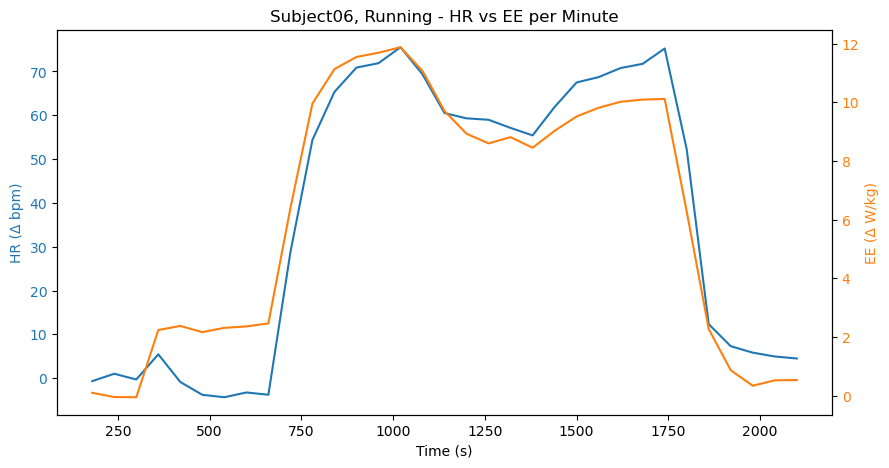

Subject06 Stairs
-----------


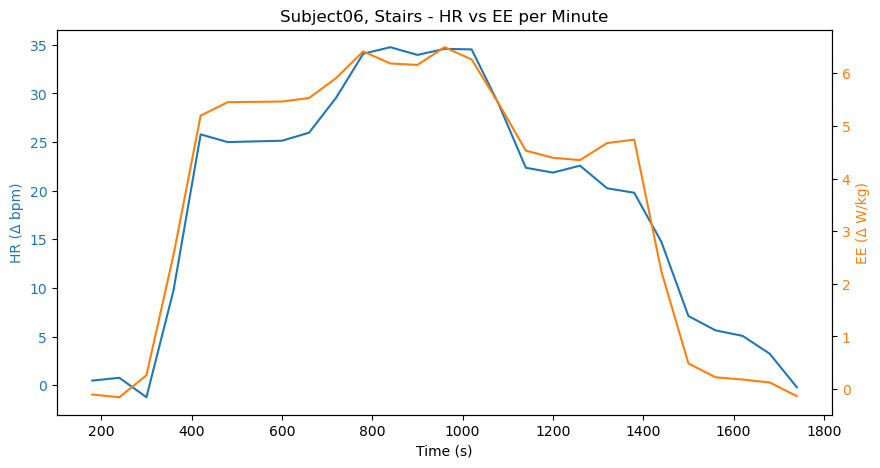

Subject06 Walking
-----------


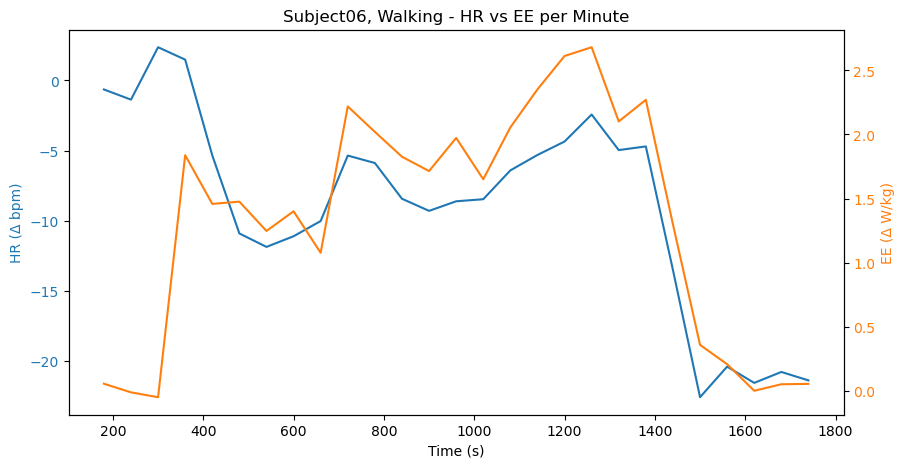

Subject07 Backwards
-----------


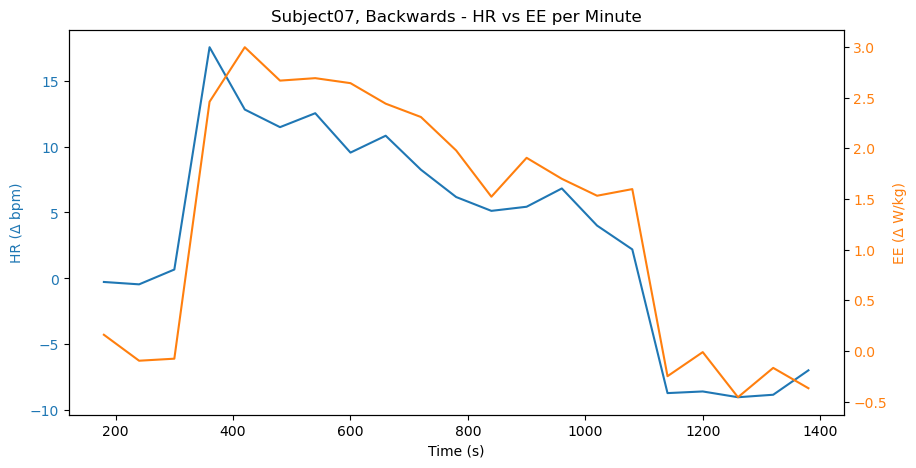

Subject07 Cycling
-----------


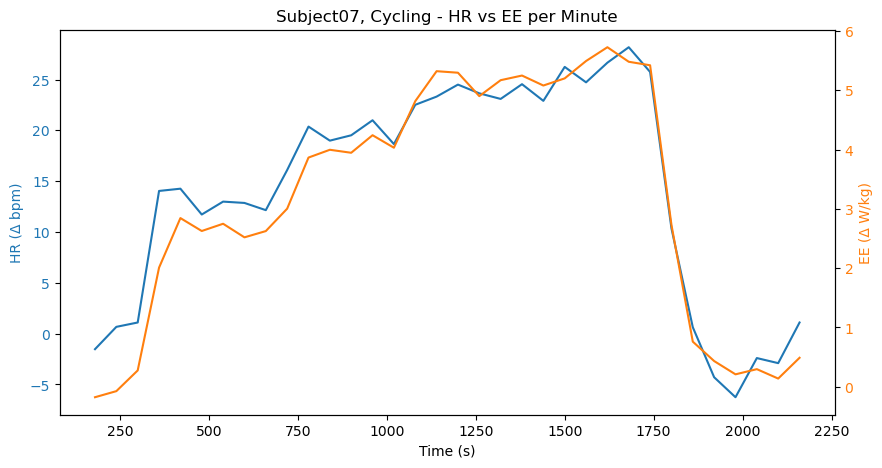

Subject07 Incline
-----------


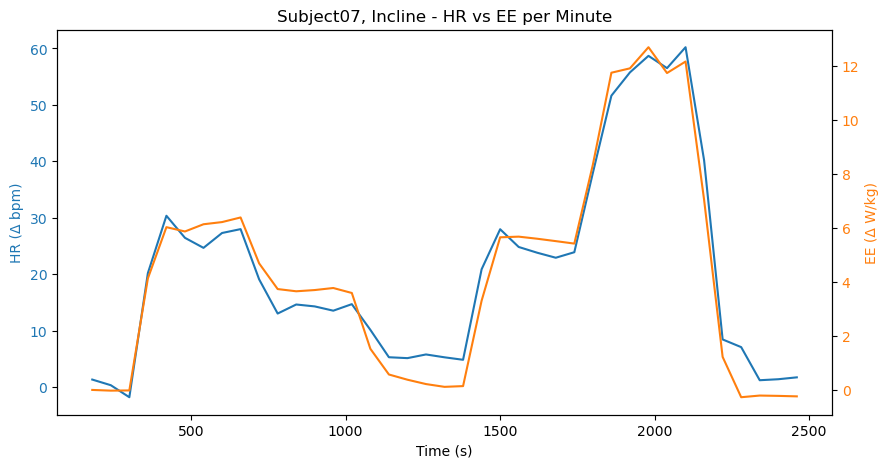

Subject07 Running
-----------


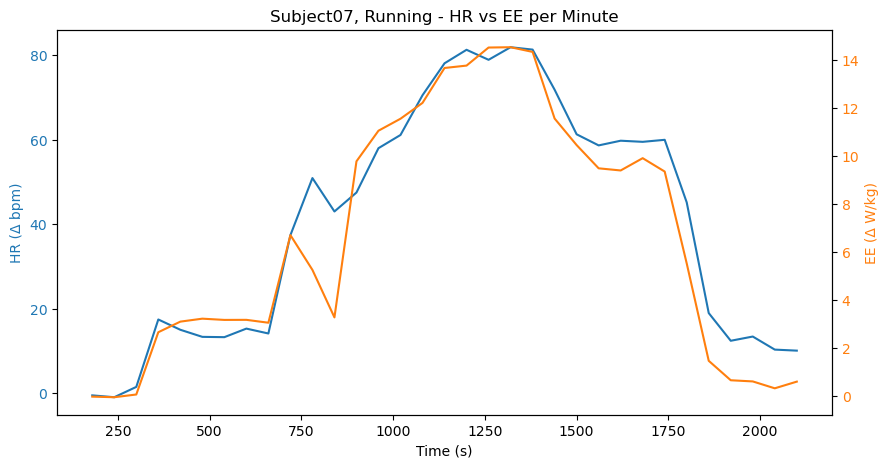

Subject07 Stairs
-----------


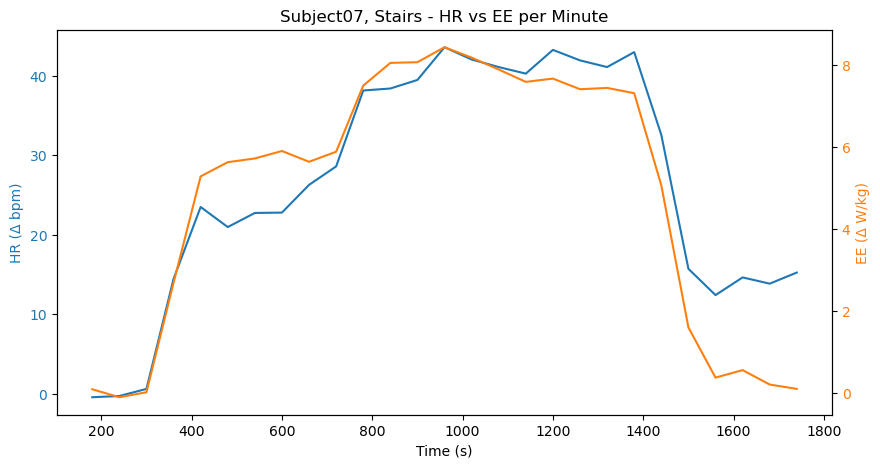

Subject07 Walking
-----------


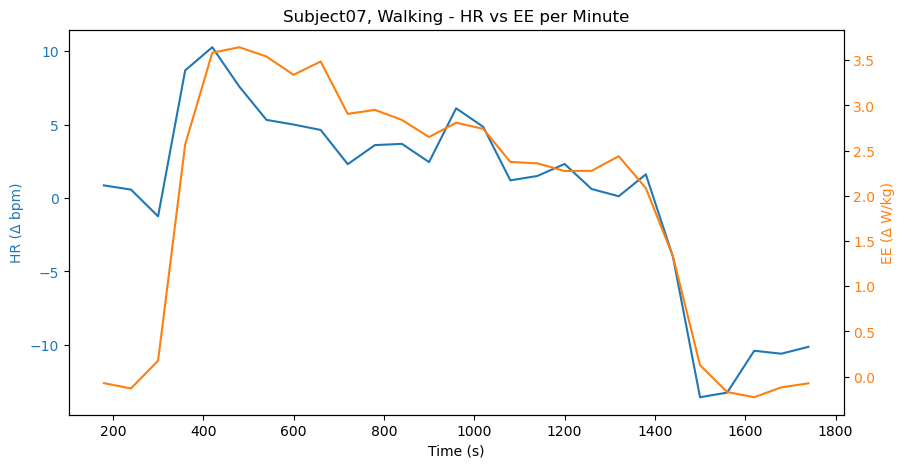

Subject08 Backwards
-----------


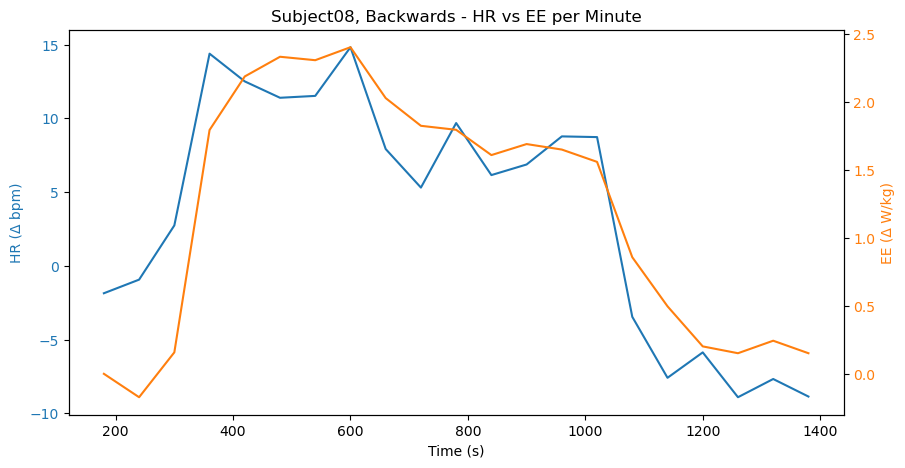

Subject08 Cycling
-----------


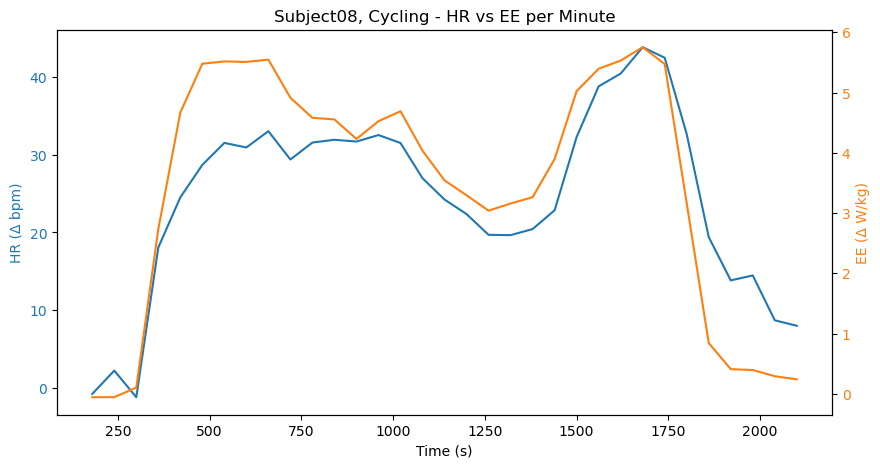

Subject08 Incline
-----------


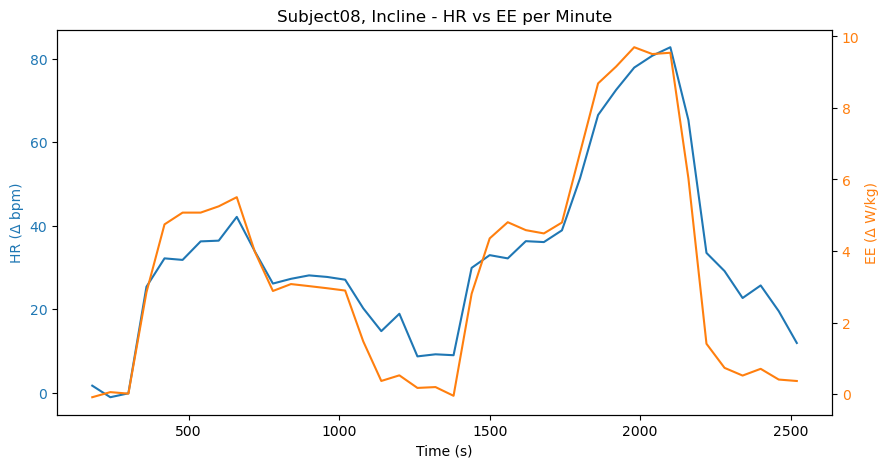

Subject08 Running
-----------


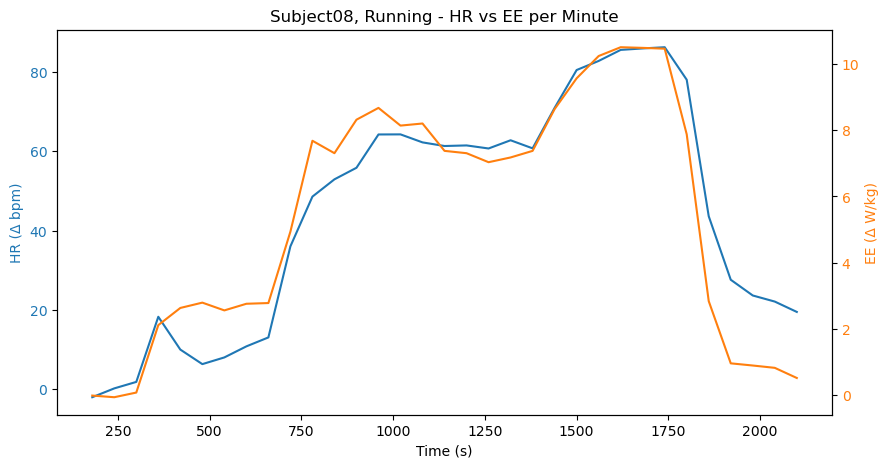

Subject08 Stairs
-----------


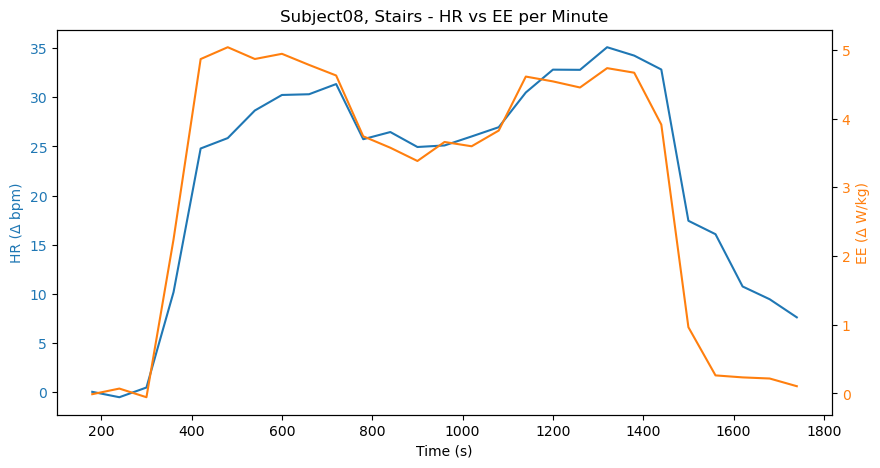

Subject08 Walking
-----------


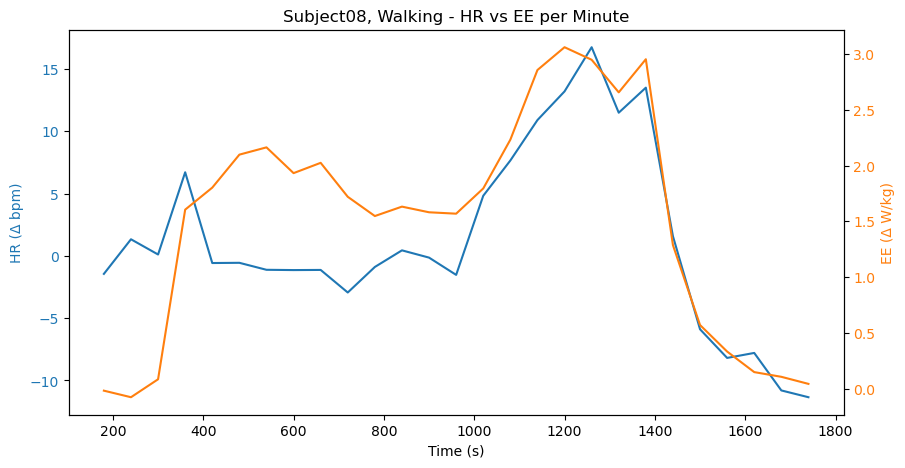

Subject09 Backwards
-----------


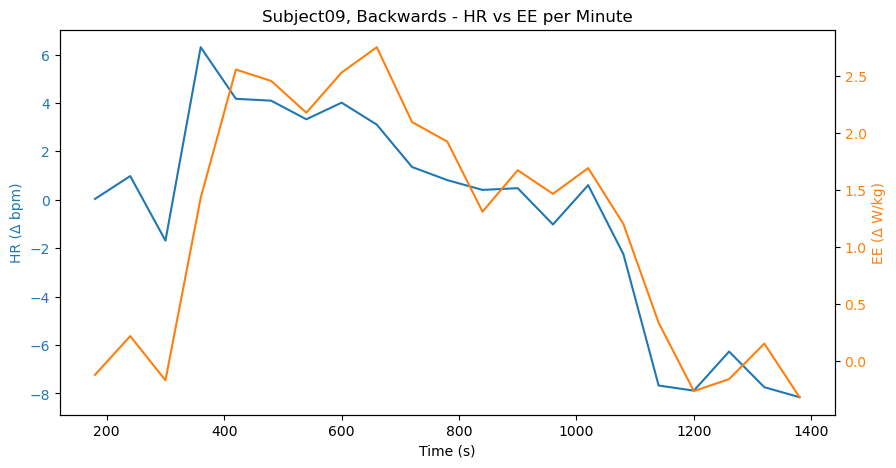

Subject09 Cycling
-----------


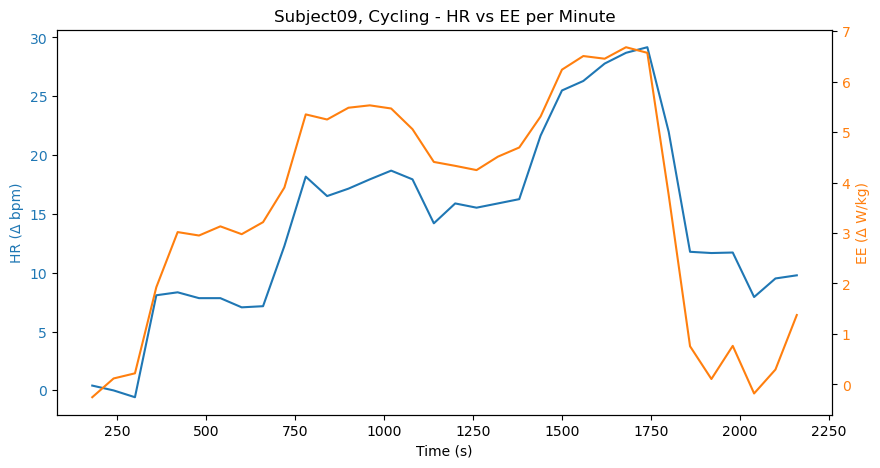

Subject09 Incline
-----------


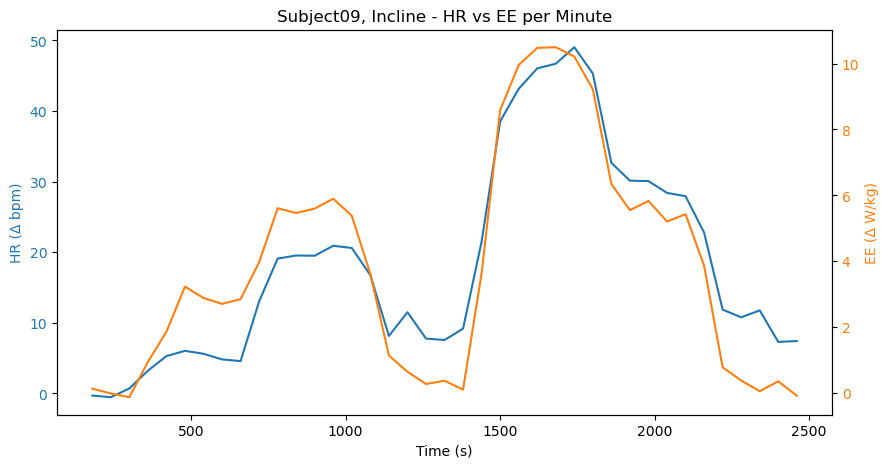

Subject09 Running
-----------


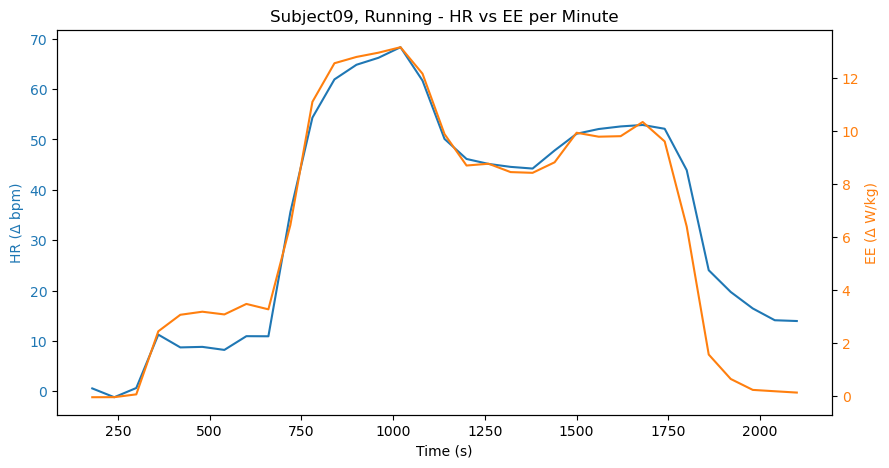

Subject09 Stairs
-----------


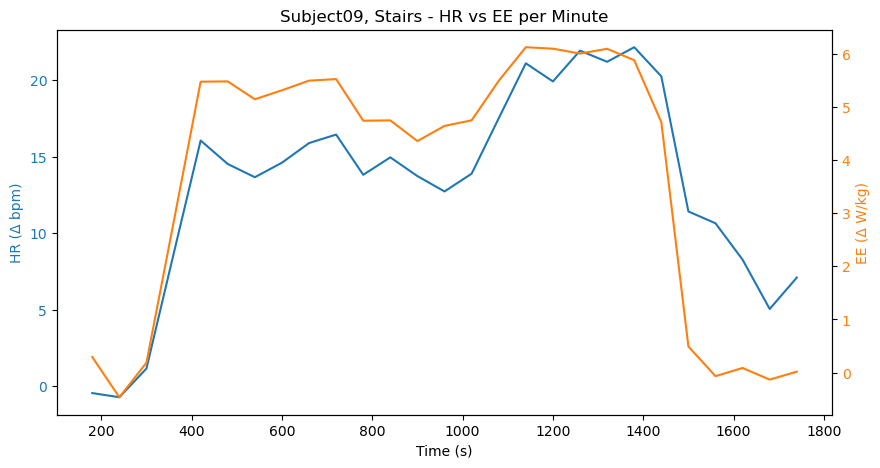

Subject09 Walking
-----------


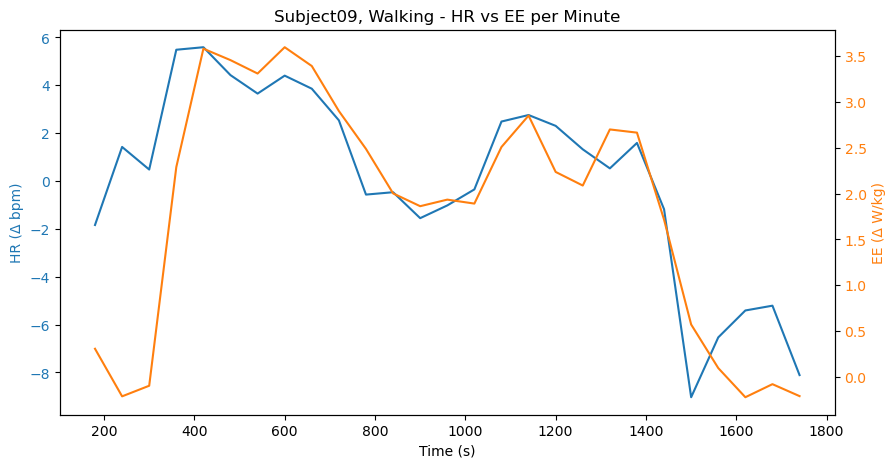

Subject10 Backwards
-----------


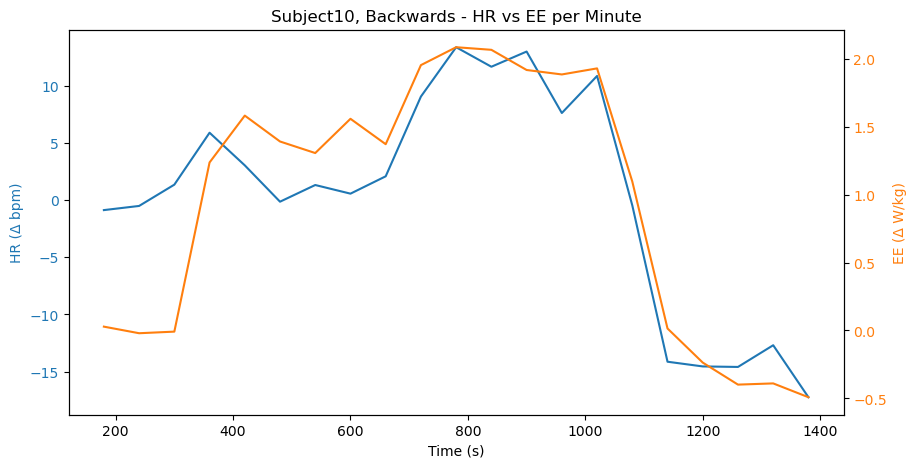

Subject10 Cycling
-----------


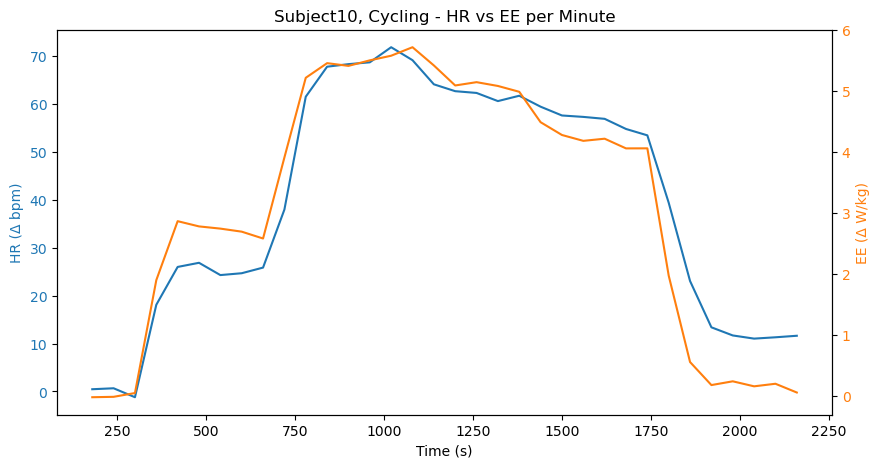

Subject10 Incline
-----------


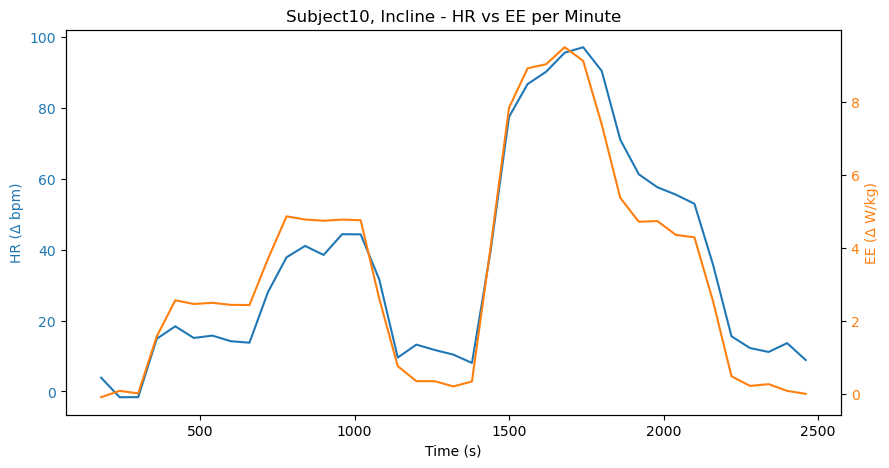

Subject10 Running
-----------


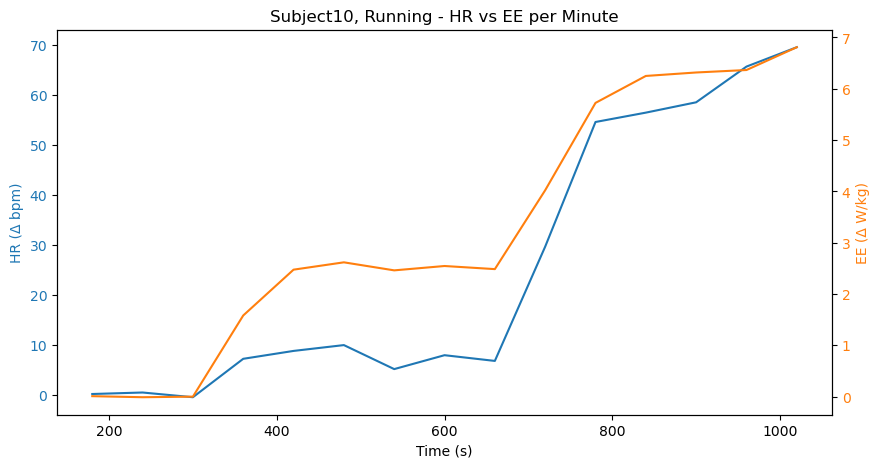

Subject10 Stairs
-----------


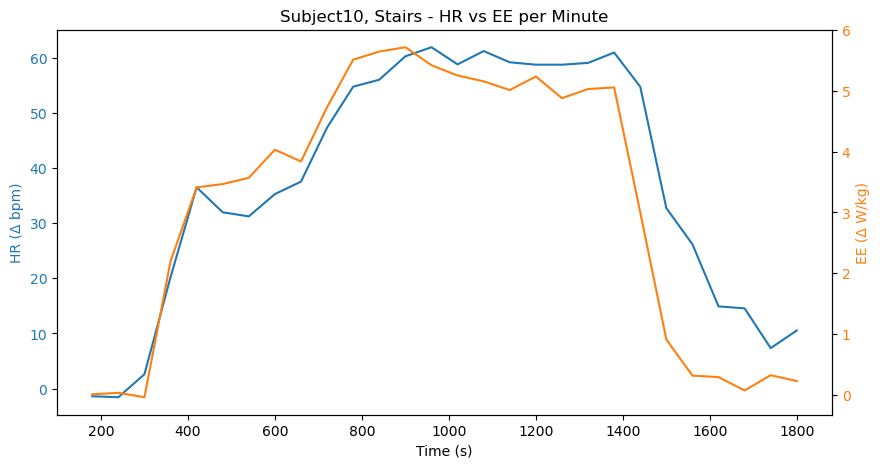

Subject10 Walking
-----------


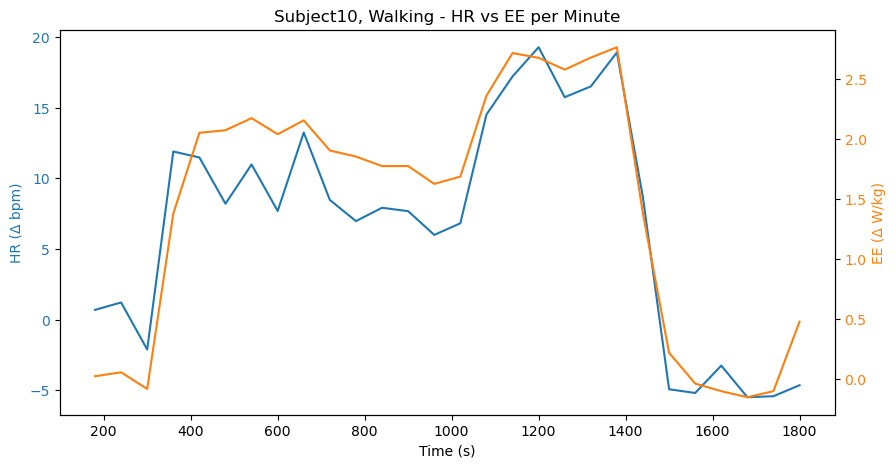

In [42]:
# 1 min averages

df_list = []
for subject in result.keys():
    hrPoints = []
    eePoints = []
    activity = []
    subjectTot = []

    indDF = globals()[subject[0]].astype(int)

    # Skip irrelevant activities
    if subject[1] in ['Backwards'] and subject[0] == 'Subject02':
        continue
    if subject[1] in ['Cycling'] and subject[0] == 'Subject05':
        continue
    if subject[1] in ['Backwards2', 'Cycling2']:
        continue

    print(subject[0] + " " + subject[1] + "\n" + "-----------")

    hr = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, 8]
    time_col = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, 0]

    VO2 = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, vo2]
    VCO2 = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, vco2]
    EE = (16.58 * VO2 + 4.15 * VCO2) / mass[0]

    # Compute baseline (3–6 min)
    baseline_mask = (time_col >= 180) & (time_col < 360)
    baseline_hr = np.mean(hr[baseline_mask])
    baseline_ee = np.mean(EE[baseline_mask])

    # Minute-by-minute averaging
    window_size = 60
    start_time = 180
    end_time = int(time_col[-1])
    minute_indices = []

    for t in range(start_time, end_time, window_size):
        mask = (time_col >= t) & (time_col < t + window_size)
        if np.sum(mask) == 0:
            continue
        avg_hr = np.mean(hr[mask]) - baseline_hr
        avg_ee = np.mean(EE[mask]) - baseline_ee

        hrPoints.append(round(avg_hr, 4))
        eePoints.append(round(avg_ee, 4))
        minute_indices.append(t)

    # Build DataFrame
    df = pd.DataFrame({
        'HR': hrPoints,
        'EE': eePoints,
        'Index': minute_indices,
        'Subject': [subject[0]] * len(hrPoints),
        'Activity': [subject[1]] * len(hrPoints)
    })
    df_list.append(df)

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.title(f"{subject[0]}, {subject[1]} - HR vs EE per Minute")
    plt.xlabel("Time (s)")

    ax1 = plt.gca()
    color = 'tab:blue'
    ax1.set_ylabel("HR (Δ bpm)", color=color)
    ax1.plot(minute_indices, hrPoints, color=color)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()
    color = 'tab:orange'
    ax2.set_ylabel("EE (Δ W/kg)", color=color)
    ax2.plot(minute_indices, eePoints, color=color)
    ax2.tick_params(axis='y', labelcolor=color)

    plt.show()


In [43]:
pd.set_option('display.max_rows', 2000)
final_df_r = pd.concat(df_list, ignore_index=True)
print(final_df_r)

           HR       EE  Index    Subject   Activity
0     -1.3980   0.0776    180  Subject01  Backwards
1     -0.2986   0.0151    240  Subject01  Backwards
2      1.7131  -0.0935    300  Subject01  Backwards
3     10.5962   0.9869    360  Subject01  Backwards
4      9.0409   1.4173    420  Subject01  Backwards
5      6.2528   1.3662    480  Subject01  Backwards
6      5.7909   1.3558    540  Subject01  Backwards
7      5.4433   1.4503    600  Subject01  Backwards
8      7.1100   1.3530    660  Subject01  Backwards
9     14.1909   1.9906    720  Subject01  Backwards
10    12.3909   2.2760    780  Subject01  Backwards
11    11.6273   2.2416    840  Subject01  Backwards
12    13.9909   2.3902    900  Subject01  Backwards
13    14.4433   2.3672    960  Subject01  Backwards
14    13.3091   2.4949   1020  Subject01  Backwards
15    23.2909   3.3732   1080  Subject01  Backwards
16    23.2182   3.7420   1140  Subject01  Backwards
17    20.4000   3.4810   1200  Subject01  Backwards
18    20.348

Subject01 Backwards
-----------
Standing Average HR: 80.50909090909092
HR Points: 15 values
Final dataframe shape: (15, 5)
        HR  Index    Subject   Activity  Time
0  10.5962      0  Subject01  Backwards   360
1   9.0409      1  Subject01  Backwards   420
2   6.2528      2  Subject01  Backwards   480
3   5.7909      3  Subject01  Backwards   540
4   5.4433      4  Subject01  Backwards   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


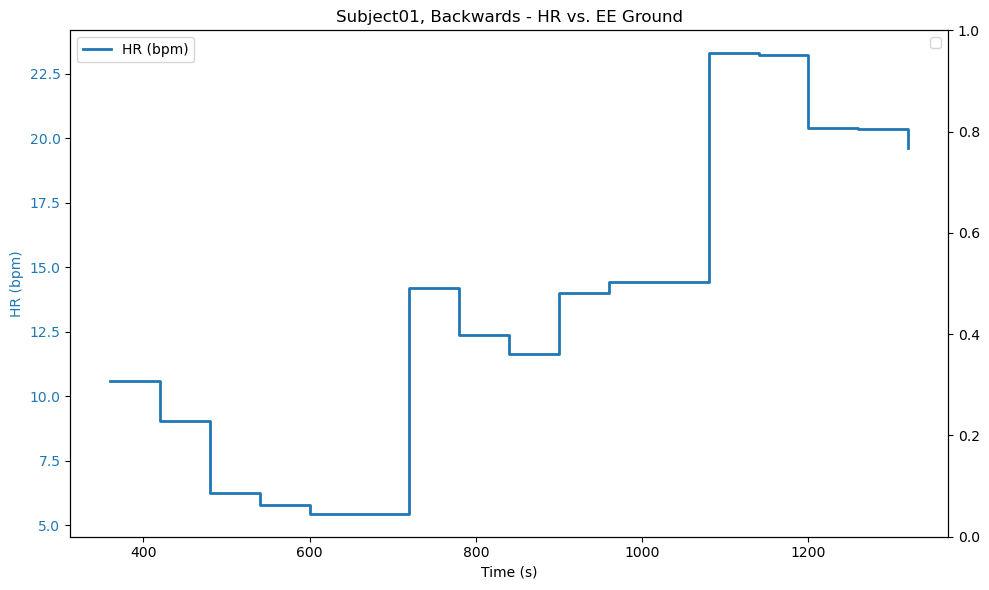

Subject01 Cycling
-----------
Standing Average HR: 87.02173913043478
HR Points: 20 values
Final dataframe shape: (20, 5)
        HR  Index    Subject Activity  Time
0  19.9783      0  Subject01  Cycling   360
1  32.2640      1  Subject01  Cycling   420
2  34.5497      2  Subject01  Cycling   480
3  36.9783      3  Subject01  Cycling   540
4  38.0259      4  Subject01  Cycling   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


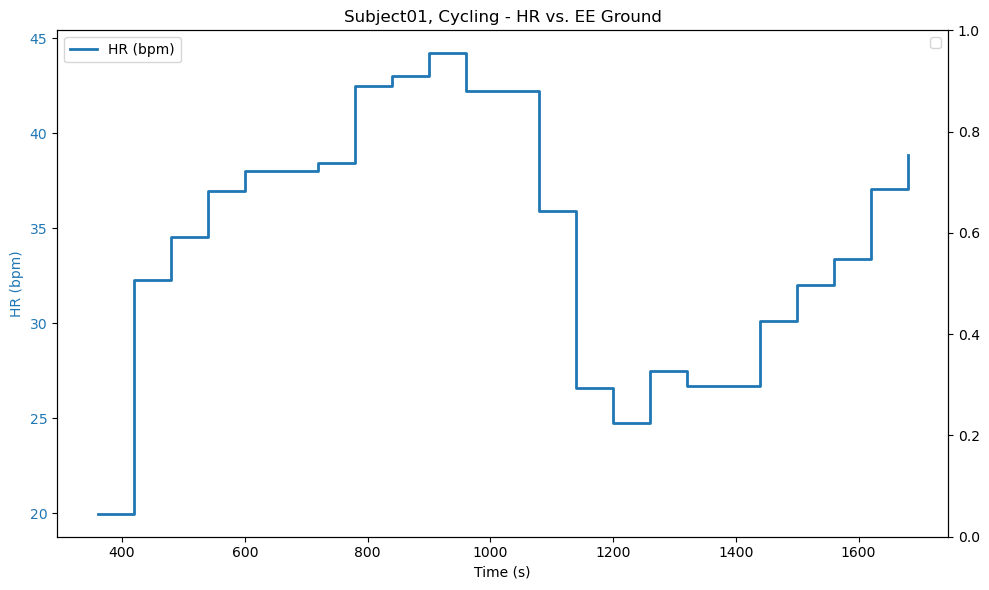

Subject01 Incline
-----------
Standing Average HR: 75.18867924528301
HR Points: 25 values
Final dataframe shape: (25, 5)
        HR  Index    Subject Activity  Time
0  22.2324      0  Subject01  Incline   360
1  29.2558      1  Subject01  Incline   420
2  29.5732      2  Subject01  Incline   480
3  31.8113      3  Subject01  Incline   540
4  31.0494      4  Subject01  Incline   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


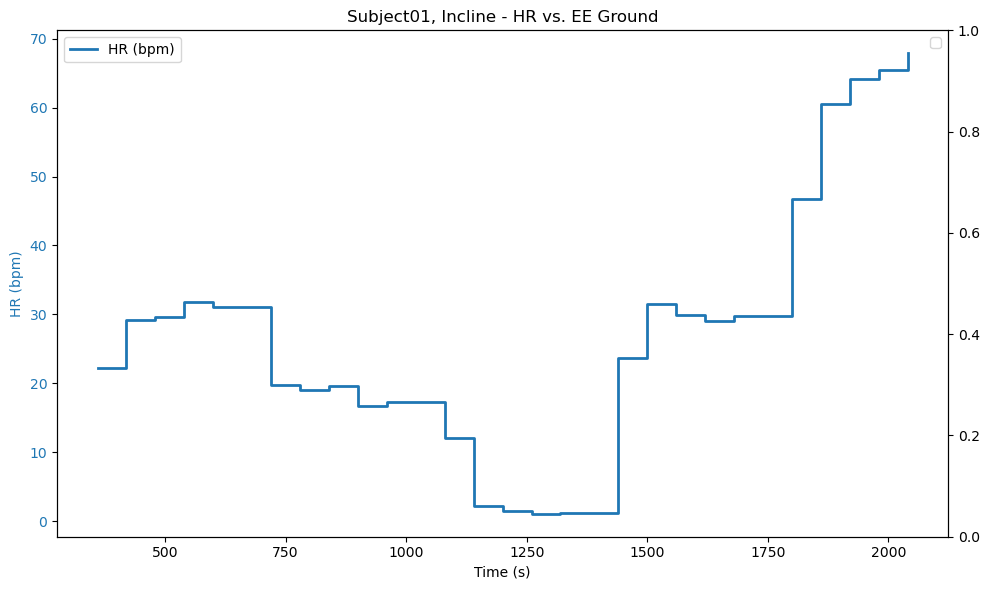

Subject01 Running
-----------
Standing Average HR: 73.61702127659575
HR Points: 15 values
Final dataframe shape: (15, 5)
        HR  Index    Subject Activity  Time
0  16.5973      0  Subject01  Running   360
1  17.6052      1  Subject01  Running   420
2  14.6608      2  Subject01  Running   480
3  13.5006      3  Subject01  Running   540
4  16.1608      4  Subject01  Running   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


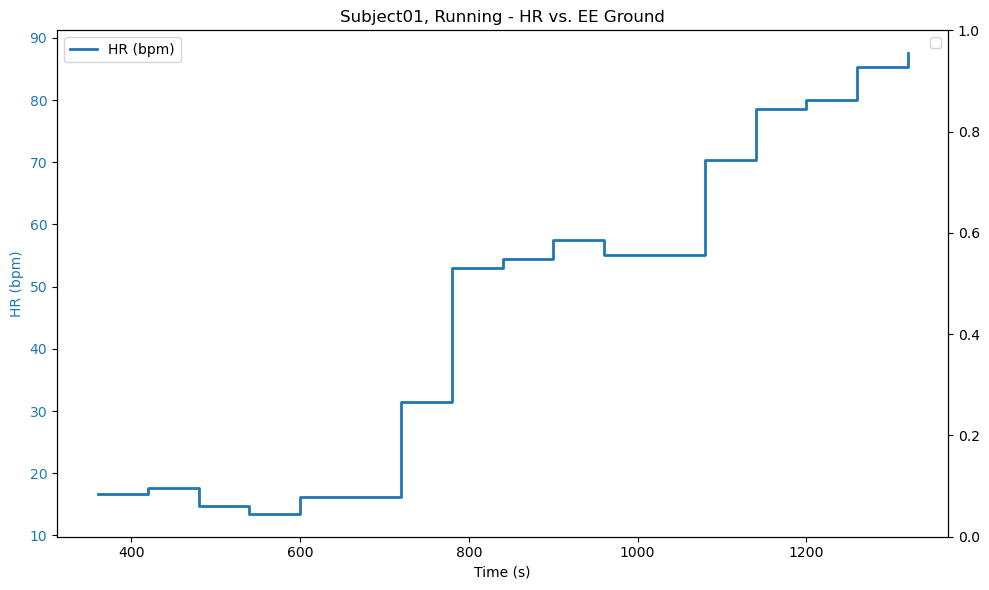

Subject01 Walking
-----------
Standing Average HR: 81.4
HR Points: 15 values
Final dataframe shape: (15, 5)
       HR  Index    Subject Activity  Time
0  9.5000      0  Subject01  Walking   360
1  8.9333      1  Subject01  Walking   420
2  5.3143      2  Subject01  Walking   480
3  4.7500      3  Subject01  Walking   540
4  5.6500      4  Subject01  Walking   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


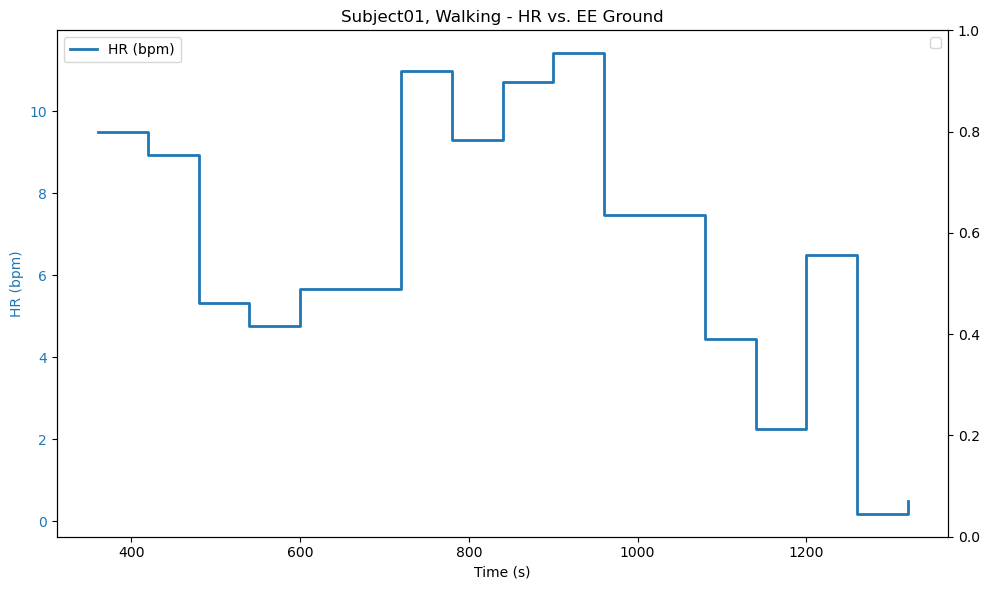

Subject02 Cycling
-----------
Standing Average HR: 68.67857142857143
HR Points: 20 values
Final dataframe shape: (20, 5)
        HR  Index    Subject Activity  Time
0  25.4548      0  Subject02  Cycling   360
1  40.1071      1  Subject02  Cycling   420
2  35.4979      2  Subject02  Cycling   480
3  38.2626      3  Subject02  Cycling   540
4  37.8508      4  Subject02  Cycling   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


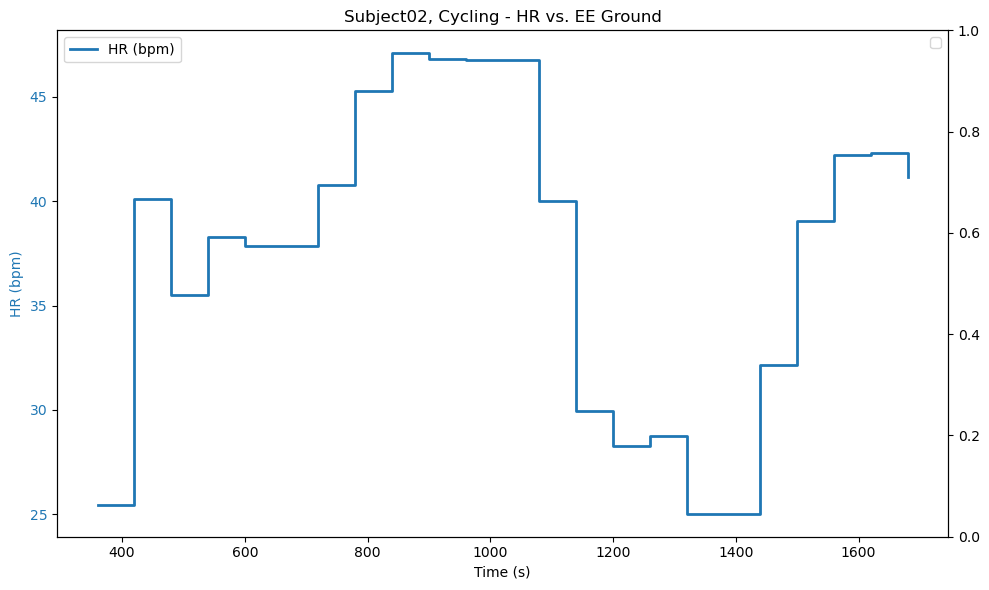

Subject02 Incline
-----------
Standing Average HR: 63.10526315789474
HR Points: 25 values
Final dataframe shape: (25, 5)
        HR  Index    Subject Activity  Time
0  27.1947      0  Subject02  Incline   360
1  34.9947      1  Subject02  Incline   420
2  36.3947      2  Subject02  Incline   480
3  32.3614      3  Subject02  Incline   540
4  34.3614      4  Subject02  Incline   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


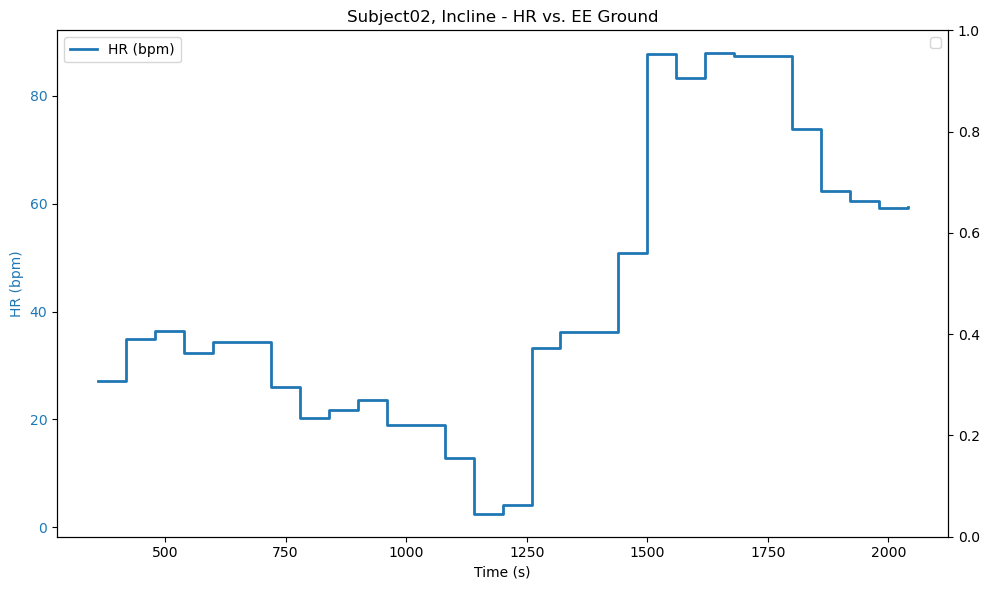

Subject02 Running
-----------
Standing Average HR: 58.94736842105263
HR Points: 20 values
Final dataframe shape: (20, 5)
        HR  Index    Subject Activity  Time
0  28.4276      0  Subject02  Running   360
1  30.3304      1  Subject02  Running   420
2  17.4737      2  Subject02  Running   480
3  18.3860      3  Subject02  Running   540
4  23.9415      4  Subject02  Running   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


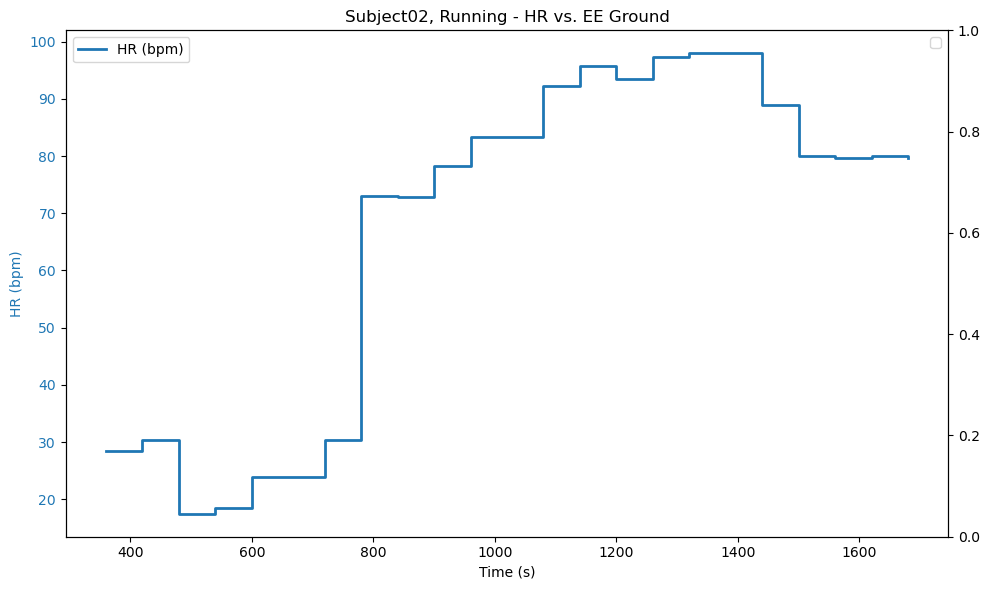

Subject02 Stairs
-----------
Standing Average HR: 76.78378378378379
HR Points: 15 values
Final dataframe shape: (15, 5)
        HR  Index    Subject Activity  Time
0  20.7456      0  Subject02   Stairs   360
1  31.2162      1  Subject02   Stairs   420
2  28.5103      2  Subject02   Stairs   480
3  29.3412      3  Subject02   Stairs   540
4  35.5287      4  Subject02   Stairs   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


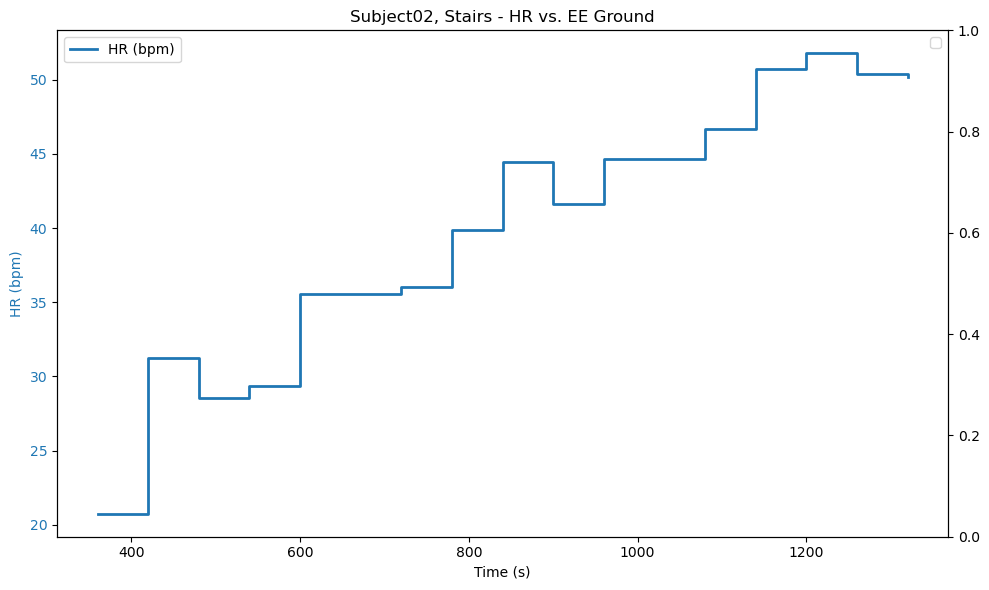

Subject02 Walking
-----------
Standing Average HR: 61.470588235294116
HR Points: 20 values
Final dataframe shape: (20, 5)
        HR  Index    Subject Activity  Time
0  19.6723      0  Subject02  Walking   360
1  21.5294      1  Subject02  Walking   420
2  21.5794      2  Subject02  Walking   480
3  16.6294      3  Subject02  Walking   540
4  11.2516      4  Subject02  Walking   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


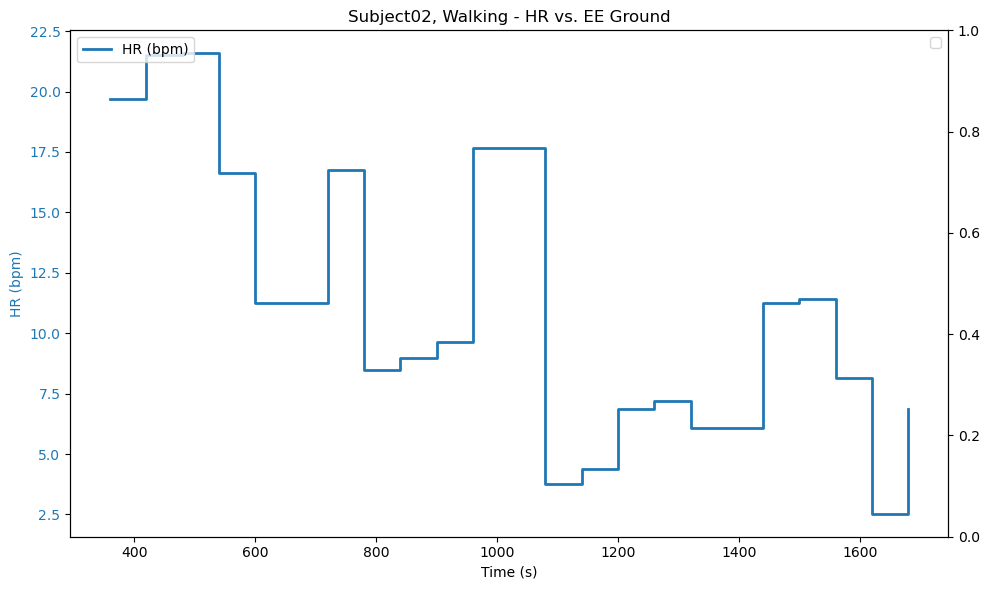

Subject03 Backwards
-----------
Standing Average HR: 124.44615384615385
HR Points: 10 values
Final dataframe shape: (10, 5)
        HR  Index    Subject   Activity  Time
0   2.1788      0  Subject03  Backwards   360
1   8.7138      1  Subject03  Backwards   420
2   9.5538      2  Subject03  Backwards   480
3  10.5138      3  Subject03  Backwards   540
4  10.8582      4  Subject03  Backwards   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


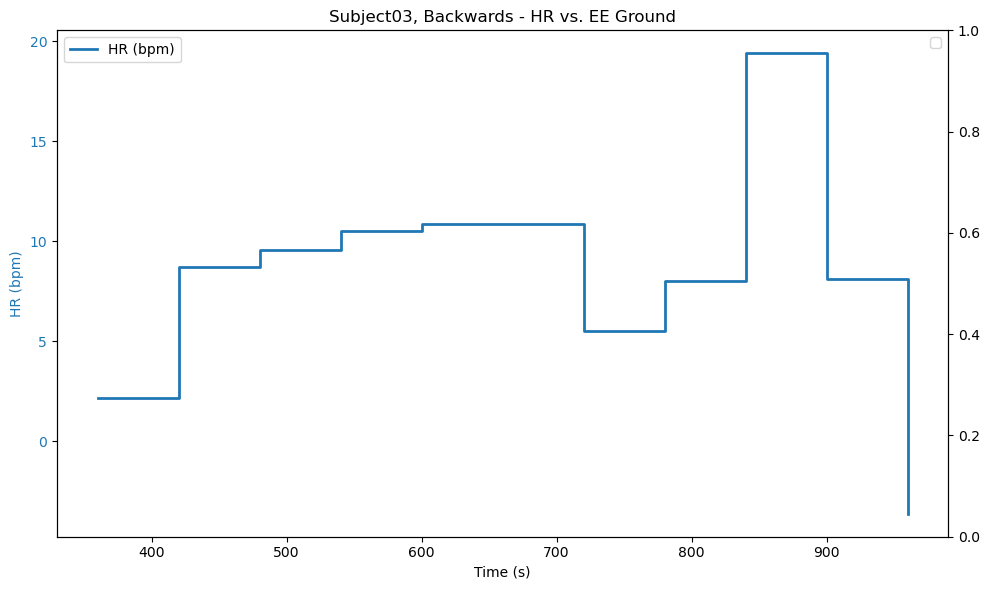

Subject03 Cycling
-----------
Standing Average HR: 109.43103448275862
HR Points: 20 values
Final dataframe shape: (20, 5)
        HR  Index    Subject Activity  Time
0   5.5134      0  Subject03  Cycling   360
1  28.7053      1  Subject03  Cycling   420
2  32.8298      2  Subject03  Cycling   480
3  36.3190      3  Subject03  Cycling   540
4  41.9440      4  Subject03  Cycling   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


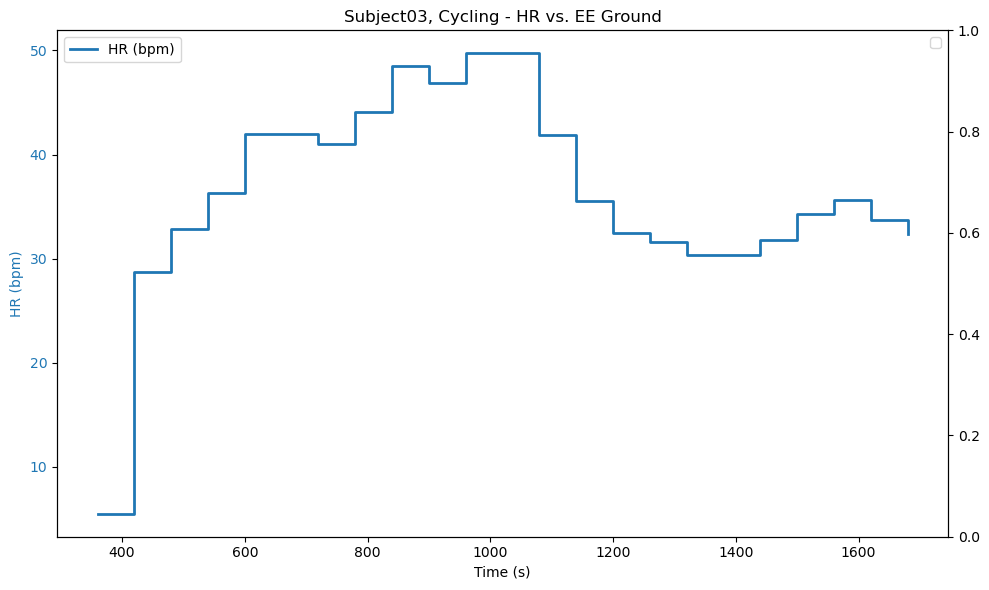

Subject03 Incline
-----------
Standing Average HR: 101.61016949152543
HR Points: 25 values
Final dataframe shape: (25, 5)
       HR  Index    Subject Activity  Time
0  6.6398      0  Subject03  Incline   360
1  7.6698      1  Subject03  Incline   420
2  5.5498      2  Subject03  Incline   480
3  7.9985      3  Subject03  Incline   540
4  5.4315      4  Subject03  Incline   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


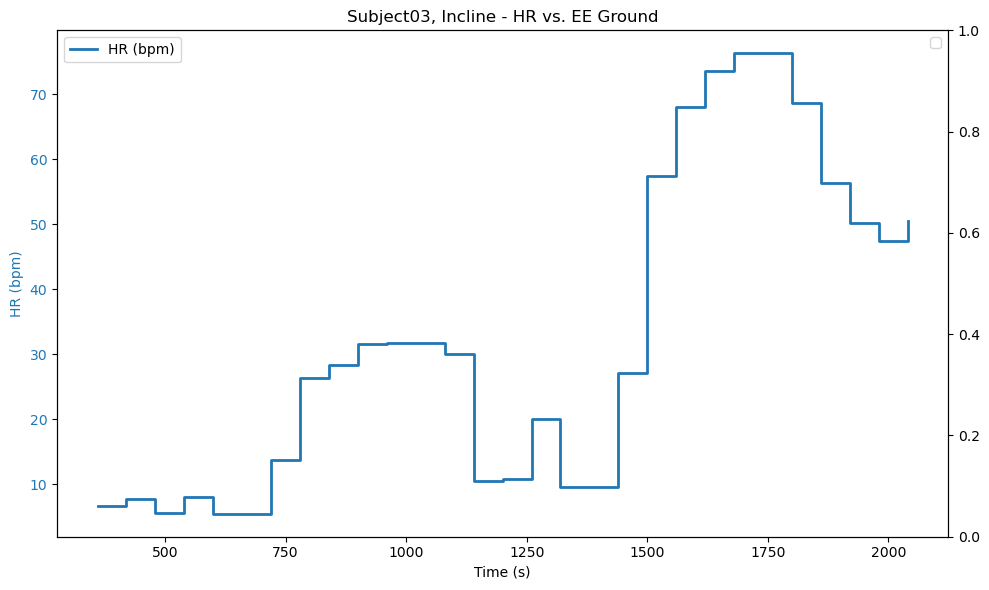

Subject03 Running
-----------
Standing Average HR: 103.22222222222223
HR Points: 20 values
Final dataframe shape: (20, 5)
       HR  Index    Subject Activity  Time
0  2.0635      0  Subject03  Running   360
1  2.9778      1  Subject03  Running   420
2 -0.8586      2  Subject03  Running   480
3 -2.9040      3  Subject03  Running   540
4 -2.6032      4  Subject03  Running   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


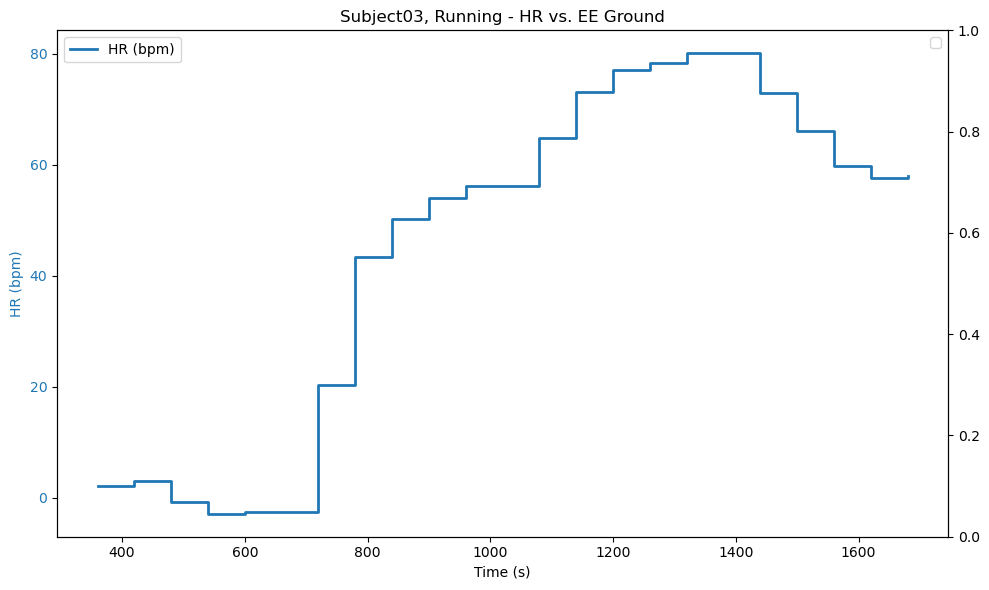

/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


Subject03 Stairs
-----------
Standing Average HR: 114.63076923076923
HR Points: 15 values
Final dataframe shape: (15, 5)
       HR  Index    Subject Activity  Time
0 -1.0808      0  Subject03   Stairs   360
1 -1.7612      1  Subject03   Stairs   420
2  2.5965      2  Subject03   Stairs   480
3  0.1311      3  Subject03   Stairs   540
4  3.6609      4  Subject03   Stairs   600


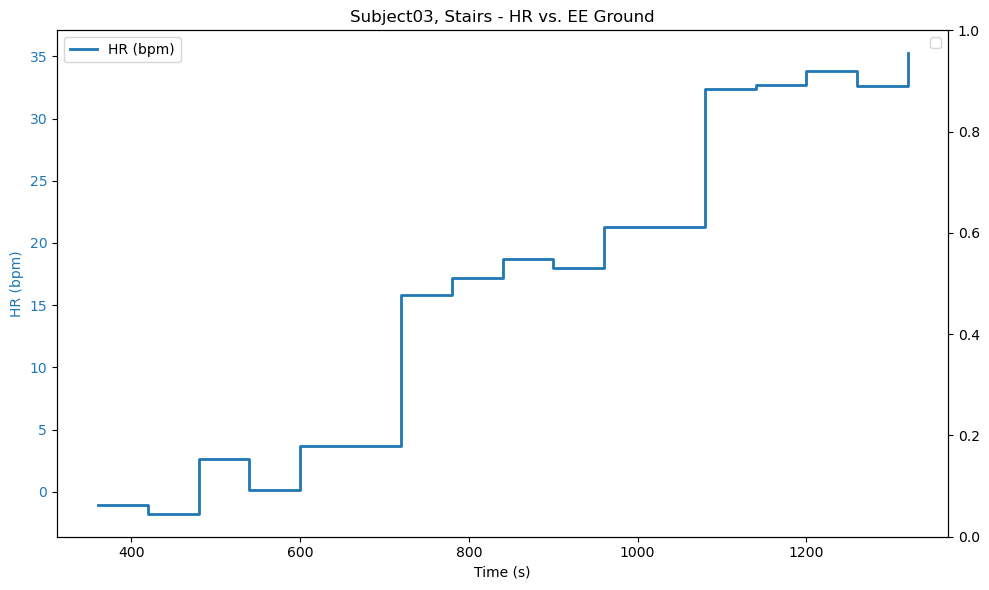

Subject03 Walking
-----------
Standing Average HR: 116.22033898305085
HR Points: 15 values
Final dataframe shape: (15, 5)
        HR  Index    Subject Activity  Time
0 -10.3943      0  Subject03  Walking   360
1 -11.3037      1  Subject03  Walking   420
2 -13.7620      2  Subject03  Walking   480
3 -11.8290      3  Subject03  Walking   540
4 -14.8290      4  Subject03  Walking   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


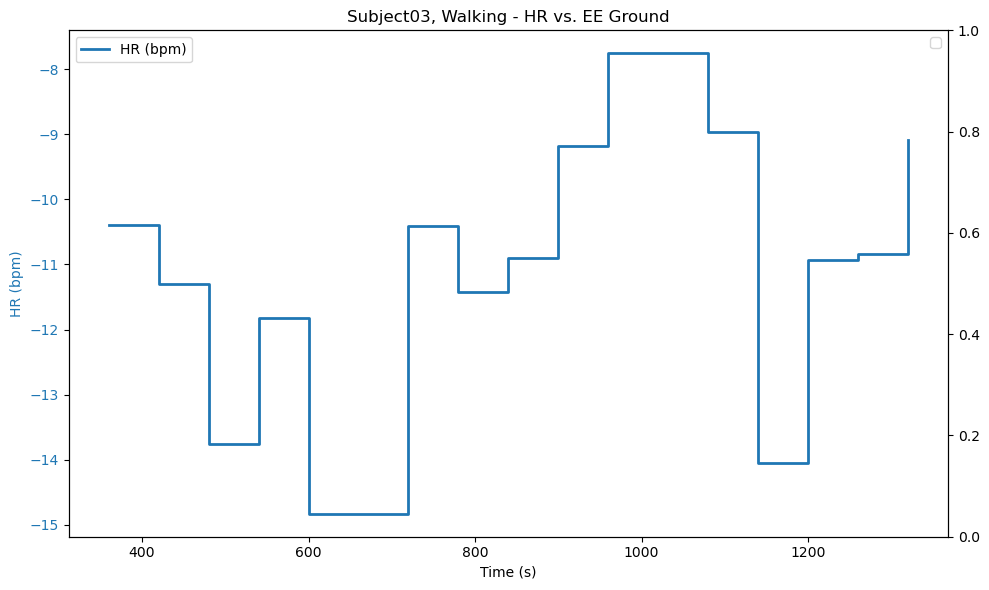

Subject04 Backwards
-----------
Standing Average HR: 90.09302325581395
HR Points: 10 values
Final dataframe shape: (10, 5)
        HR  Index    Subject   Activity  Time
0   5.0122      0  Subject04  Backwards   360
1  11.4333      1  Subject04  Backwards   420
2   7.5386      2  Subject04  Backwards   480
3   7.2599      3  Subject04  Backwards   540
4  12.1736      4  Subject04  Backwards   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


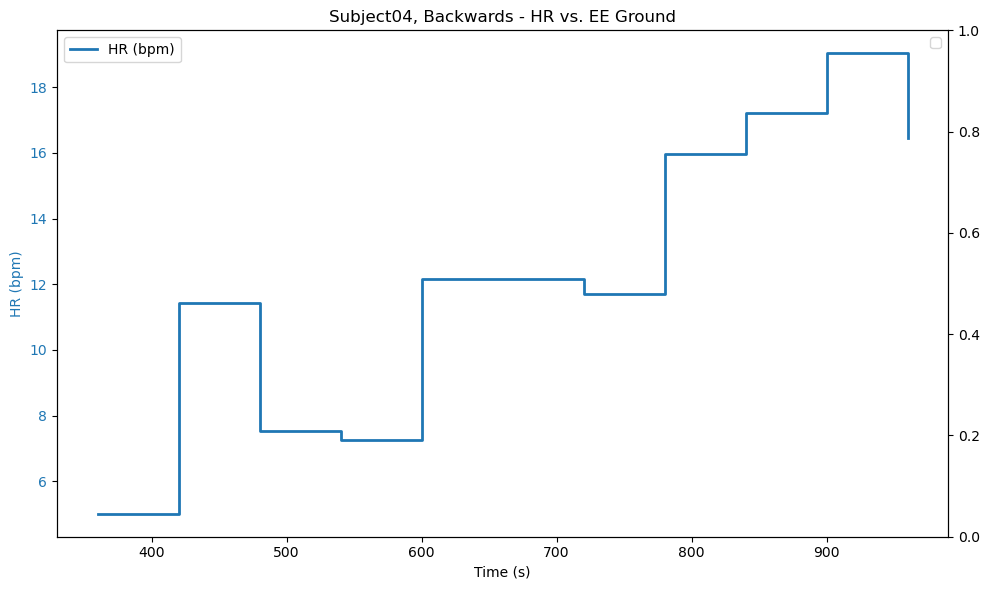

Subject04 Cycling
-----------
Standing Average HR: 104.12244897959184
HR Points: 20 values
Final dataframe shape: (20, 5)
        HR  Index    Subject Activity  Time
0   7.2986      0  Subject04  Cycling   360
1  23.4658      1  Subject04  Cycling   420
2  29.7723      2  Subject04  Cycling   480
3  29.9364      3  Subject04  Cycling   540
4  32.5246      4  Subject04  Cycling   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


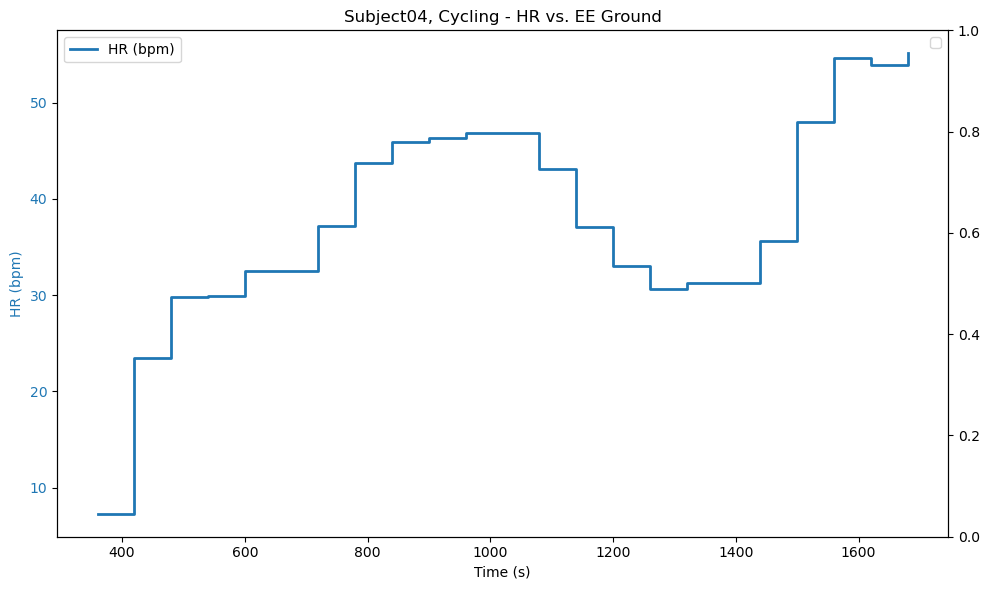

Subject04 Incline
-----------
Standing Average HR: 80.36363636363636
HR Points: 25 values
Final dataframe shape: (25, 5)
        HR  Index    Subject Activity  Time
0   3.6952      0  Subject04  Incline   360
1  13.4489      1  Subject04  Incline   420
2  12.7697      2  Subject04  Incline   480
3  10.1070      3  Subject04  Incline   540
4  12.8864      4  Subject04  Incline   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


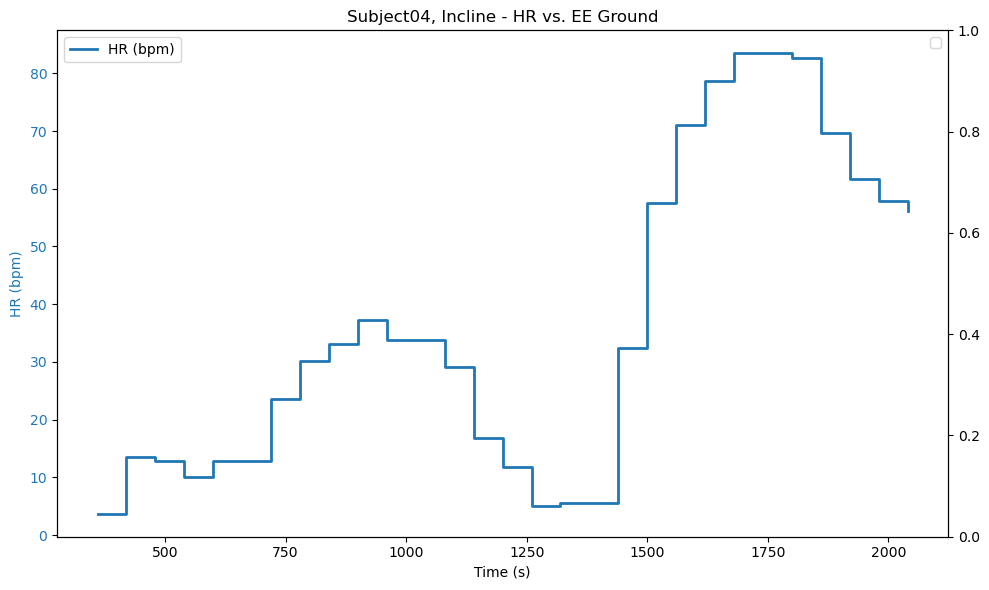

Subject04 Running
-----------
Standing Average HR: 92.02127659574468
HR Points: 20 values
Final dataframe shape: (20, 5)
        HR  Index    Subject Activity  Time
0   5.4493      0  Subject04  Running   360
1   8.8611      1  Subject04  Running   420
2   6.1037      2  Subject04  Running   480
3   7.3359      3  Subject04  Running   540
4  10.6216      4  Subject04  Running   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


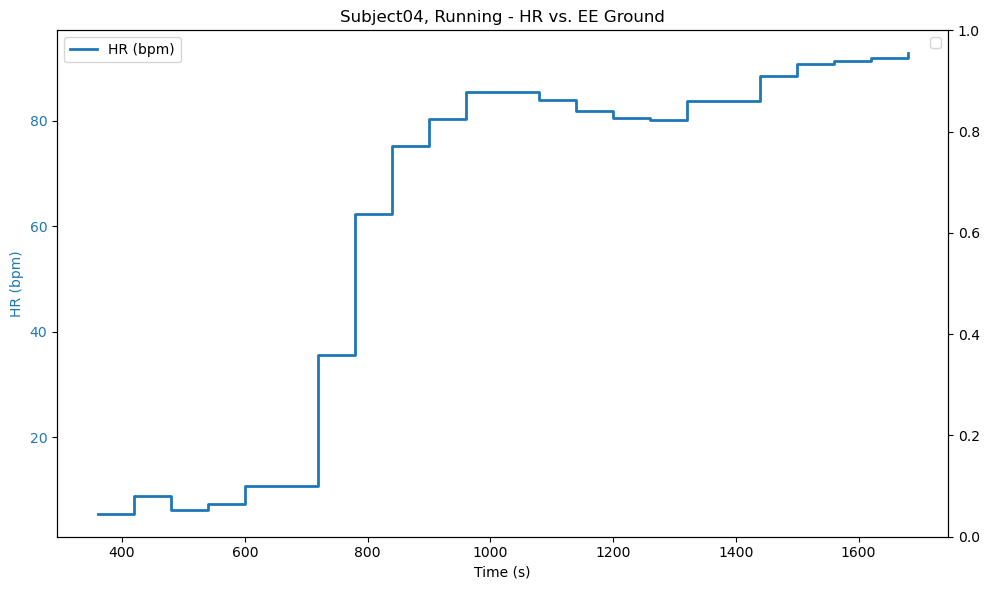

Subject04 Stairs
-----------
Standing Average HR: 120.11627906976744
HR Points: 15 values
Final dataframe shape: (15, 5)
        HR  Index    Subject Activity  Time
0   6.0337      0  Subject04   Stairs   360
1  25.8837      1  Subject04   Stairs   420
2  32.6337      2  Subject04   Stairs   480
3  34.1637      3  Subject04   Stairs   540
4  36.4337      4  Subject04   Stairs   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


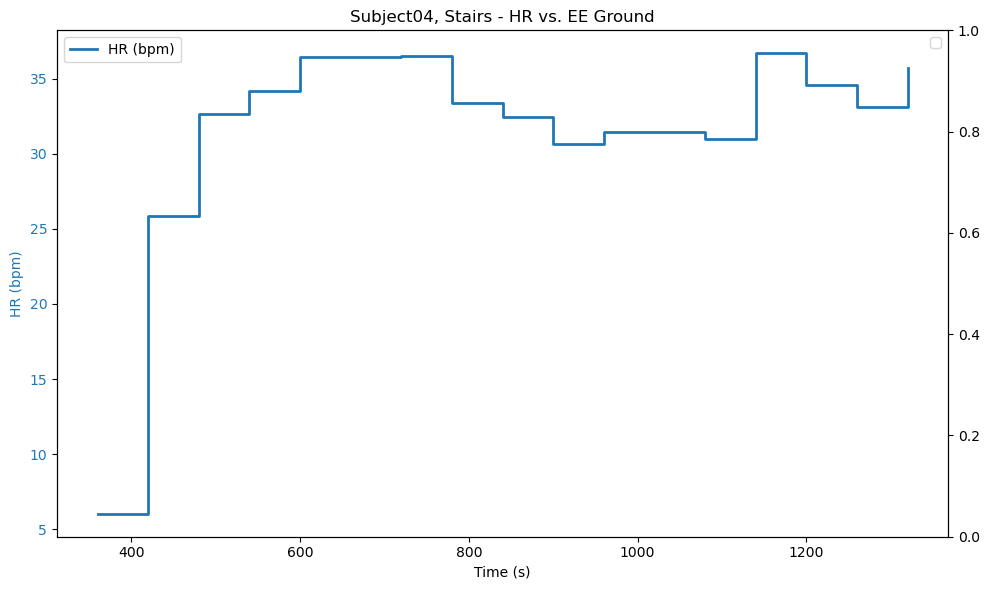

Subject04 Walking
-----------
Standing Average HR: 82.71428571428571
HR Points: 10 values
Final dataframe shape: (10, 5)
       HR  Index    Subject Activity  Time
0 -0.2976      0  Subject04  Walking   360
1 -2.7143      1  Subject04  Walking   420
2 -0.3143      2  Subject04  Walking   480
3 -0.5893      3  Subject04  Walking   540
4 -1.0893      4  Subject04  Walking   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


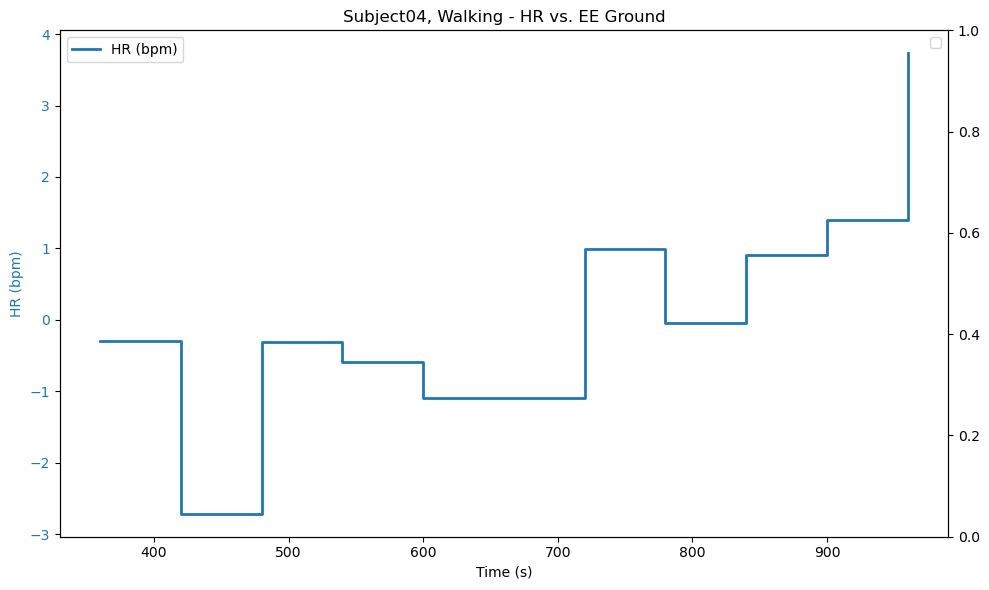

Subject05 Backwards
-----------
Standing Average HR: 107.45901639344262
HR Points: 15 values
Final dataframe shape: (15, 5)
        HR  Index    Subject   Activity  Time
0  13.4210      0  Subject05  Backwards   360
1   6.7410      1  Subject05  Backwards   420
2   6.9810      2  Subject05  Backwards   480
3   8.6362      3  Subject05  Backwards   540
4  12.0827      4  Subject05  Backwards   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


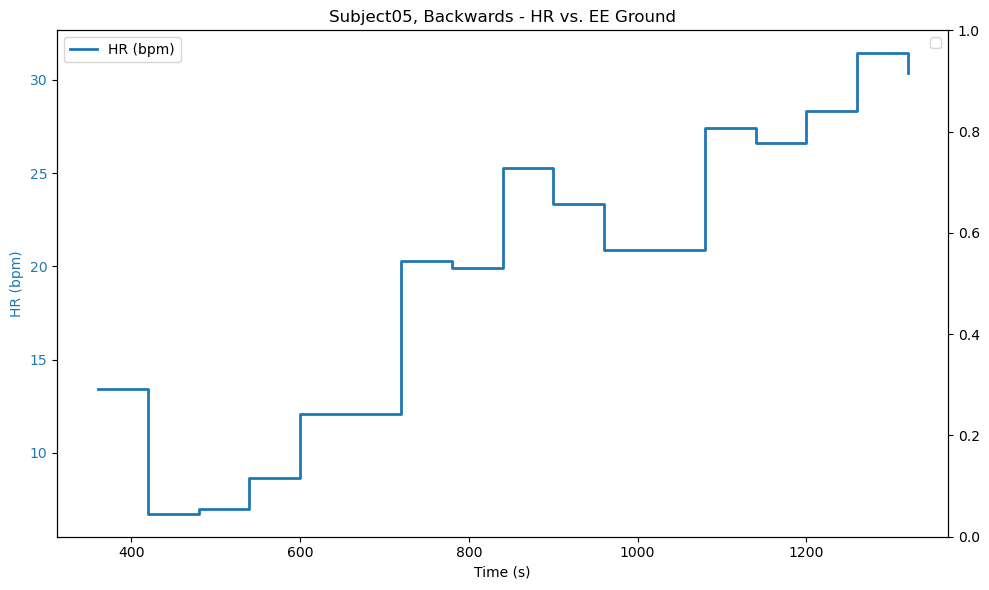

Subject05 Incline
-----------
Standing Average HR: 92.76190476190476
HR Points: 25 values
Final dataframe shape: (25, 5)
        HR  Index    Subject Activity  Time
0  17.1714      0  Subject05  Incline   360
1  23.9881      1  Subject05  Incline   420
2  28.5458      2  Subject05  Incline   480
3  27.6996      3  Subject05  Incline   540
4  29.6996      4  Subject05  Incline   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


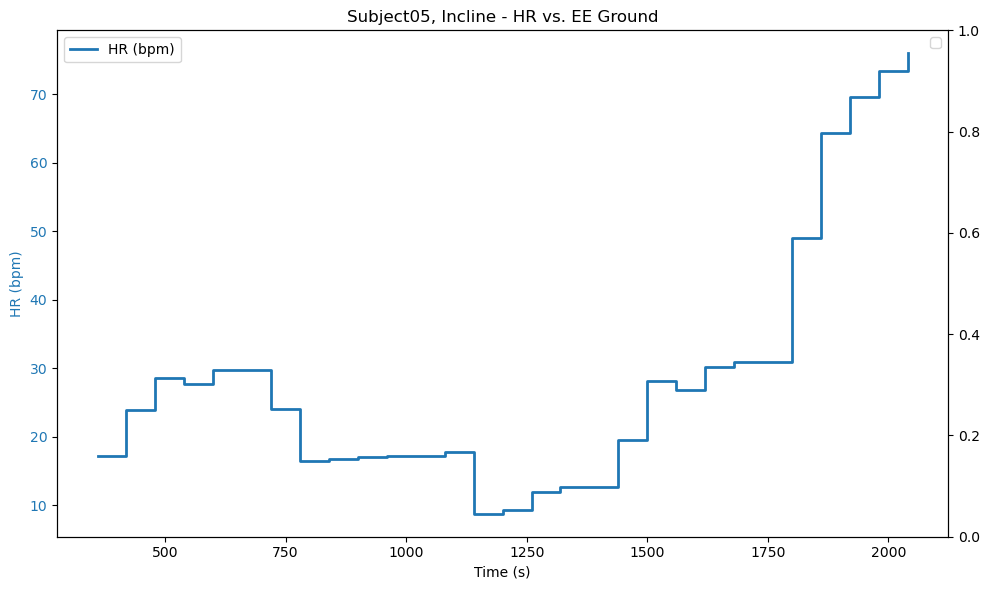

Subject05 Running
-----------
Standing Average HR: 92.41818181818182
HR Points: 20 values
Final dataframe shape: (20, 5)
       HR  Index    Subject Activity  Time
0  5.8818      0  Subject05  Running   360
1  6.3818      1  Subject05  Running   420
2  5.9818      2  Subject05  Running   480
3  5.4152      3  Subject05  Running   540
4  4.5818      4  Subject05  Running   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


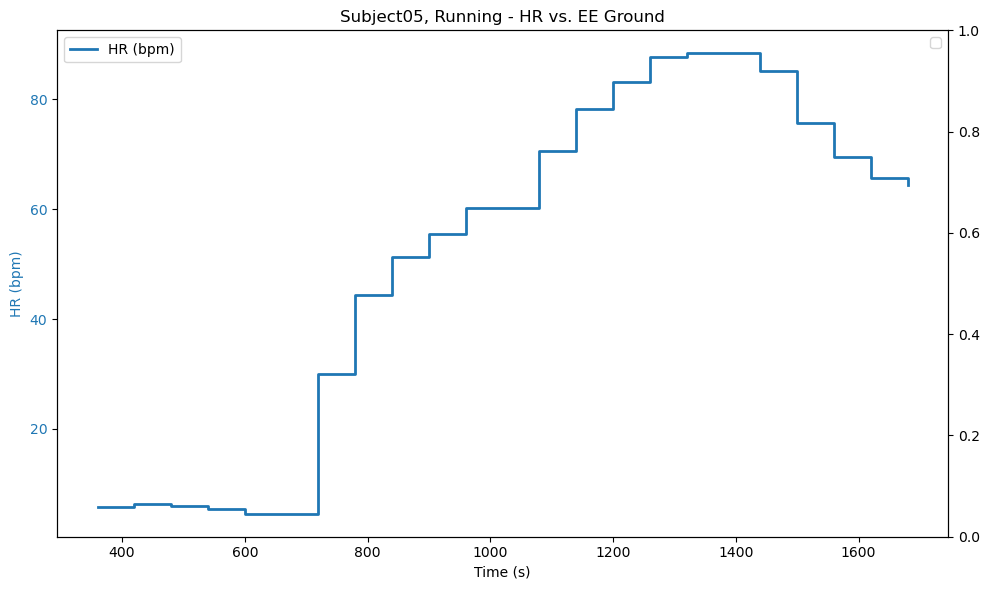

Subject05 Stairs
-----------
Standing Average HR: 119.03636363636363
HR Points: 15 values
Final dataframe shape: (15, 5)
        HR  Index    Subject Activity  Time
0  16.0747      0  Subject05   Stairs   360
1  31.0506      1  Subject05   Stairs   420
2  35.1541      2  Subject05   Stairs   480
3  38.4136      3  Subject05   Stairs   540
4  40.6303      4  Subject05   Stairs   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


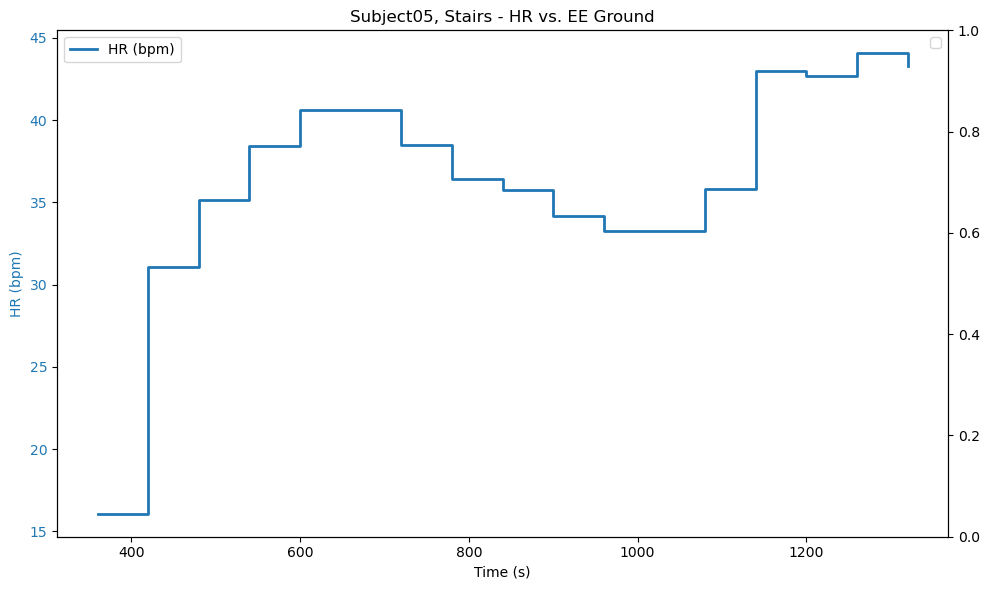

Subject05 Walking
-----------
Standing Average HR: 98.0
HR Points: 15 values
Final dataframe shape: (15, 5)
       HR  Index    Subject Activity  Time
0  3.9091      0  Subject05  Walking   360
1  0.1111      1  Subject05  Walking   420
2 -2.8333      2  Subject05  Walking   480
3  1.0000      3  Subject05  Walking   540
4  0.5000      4  Subject05  Walking   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


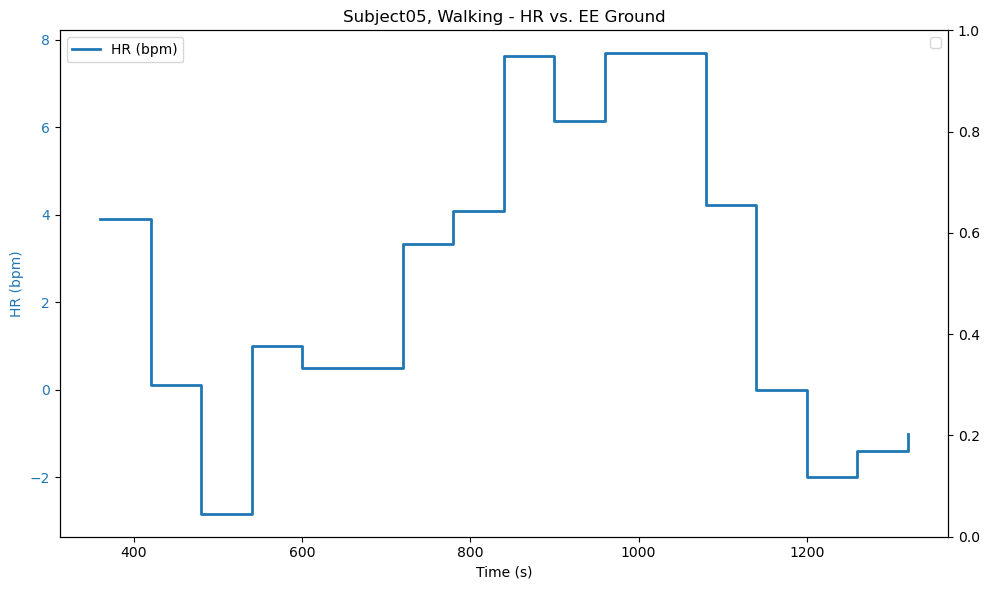

Subject06 Backwards
-----------
Standing Average HR: 93.18518518518519
HR Points: 10 values
Final dataframe shape: (10, 5)
       HR  Index    Subject   Activity  Time
0  8.6330      0  Subject06  Backwards   360
1  8.1898      1  Subject06  Backwards   420
2  6.9452      2  Subject06  Backwards   480
3  6.0421      3  Subject06  Backwards   540
4  5.7315      4  Subject06  Backwards   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


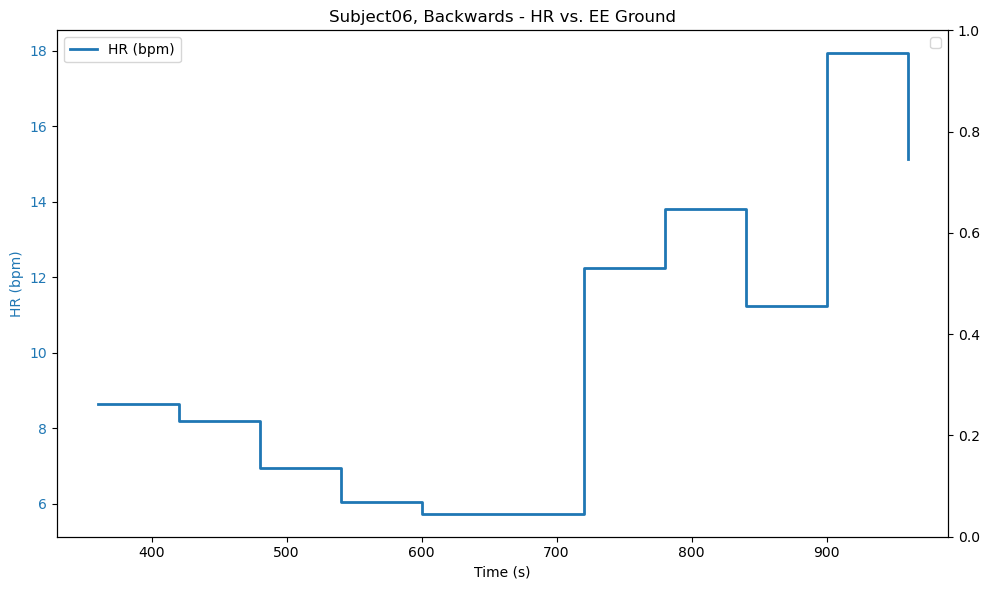

Subject06 Cycling
-----------
Standing Average HR: 91.26530612244898
HR Points: 20 values
Final dataframe shape: (20, 5)
        HR  Index    Subject Activity  Time
0  15.1514      0  Subject06  Cycling   360
1  21.4847      1  Subject06  Cycling   420
2  22.6947      2  Subject06  Cycling   480
3  22.2547      3  Subject06  Cycling   540
4  23.3501      4  Subject06  Cycling   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


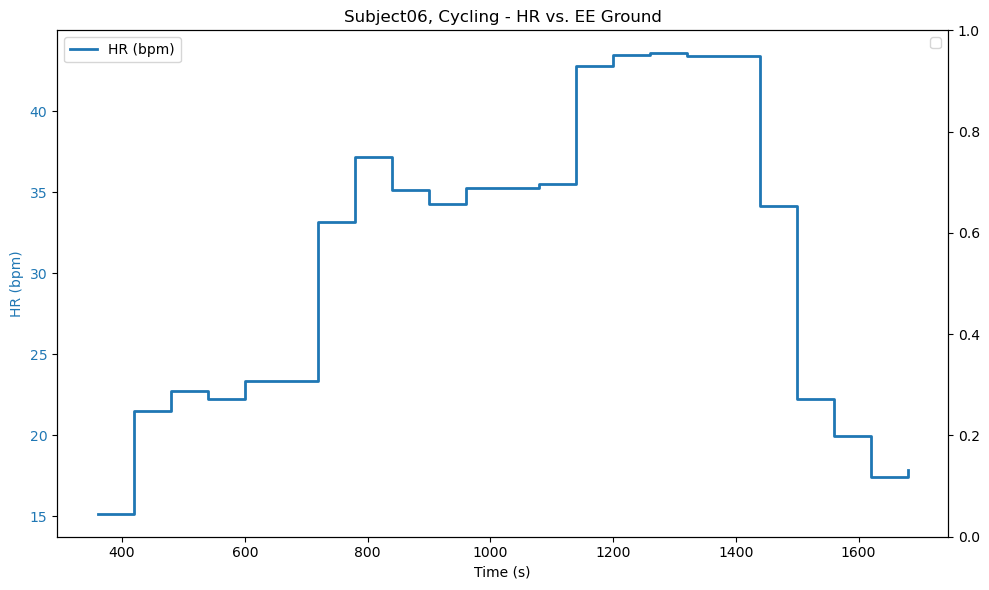

Subject06 Incline
-----------
Standing Average HR: 81.13461538461539
HR Points: 25 values
Final dataframe shape: (25, 5)
        HR  Index    Subject Activity  Time
0  13.0082      0  Subject06  Incline   360
1  22.7404      1  Subject06  Incline   420
2  18.6571      2  Subject06  Incline   480
3  17.6480      3  Subject06  Incline   540
4  17.1263      4  Subject06  Incline   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


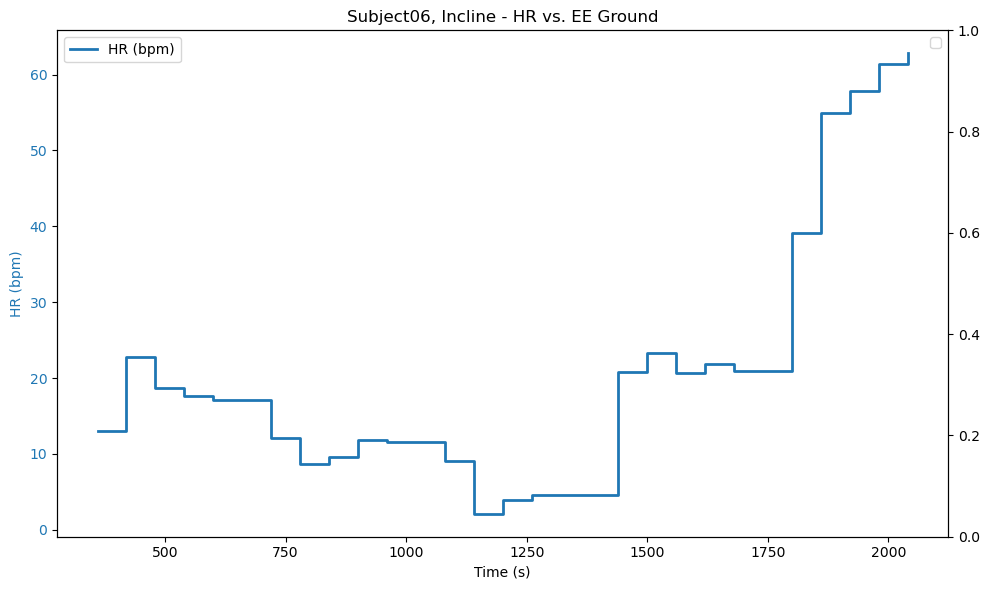

Subject06 Running
-----------
Standing Average HR: 86.1875
HR Points: 20 values
Final dataframe shape: (20, 5)
       HR  Index    Subject Activity  Time
0  5.4315      0  Subject06  Running   360
1 -0.8875      1  Subject06  Running   420
2 -3.8125      2  Subject06  Running   480
3 -4.3614      3  Subject06  Running   540
4 -3.2784      4  Subject06  Running   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


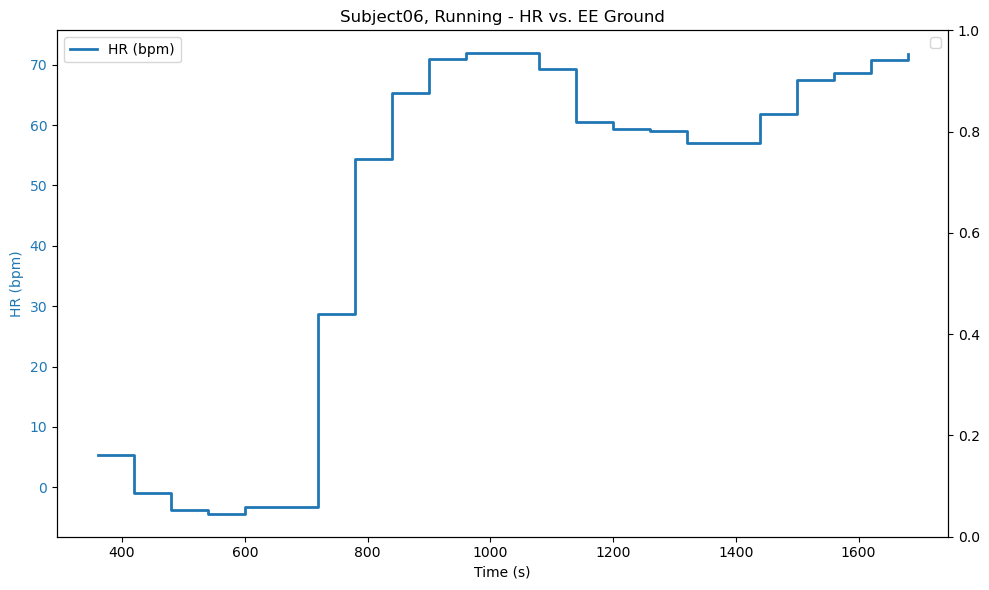

Subject06 Stairs
-----------
Standing Average HR: 109.03389830508475
HR Points: 15 values
Final dataframe shape: (15, 5)
        HR  Index    Subject Activity  Time
0   9.7661      0  Subject06   Stairs   360
1  25.7937      1  Subject06   Stairs   420
2  24.9994      2  Subject06   Stairs   480
3  25.0732      3  Subject06   Stairs   540
4  25.1385      4  Subject06   Stairs   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


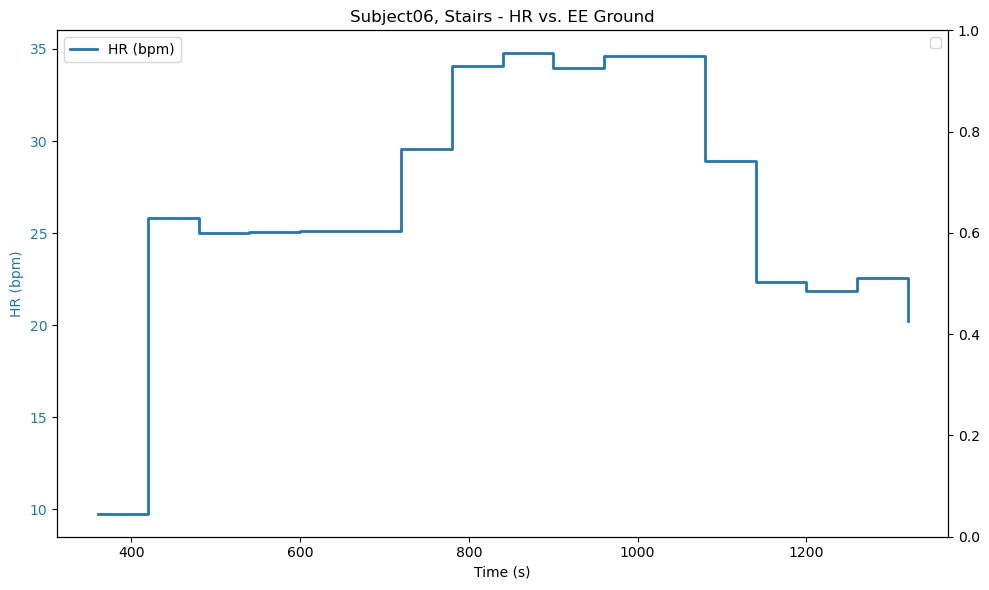

Subject06 Walking
-----------
Standing Average HR: 87.74509803921569
HR Points: 15 values
Final dataframe shape: (15, 5)
        HR  Index    Subject Activity  Time
0   1.4367      0  Subject06  Walking   360
1  -5.3815      1  Subject06  Walking   420
2 -10.9451      2  Subject06  Walking   480
3 -11.9030      3  Subject06  Walking   540
4 -11.1451      4  Subject06  Walking   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


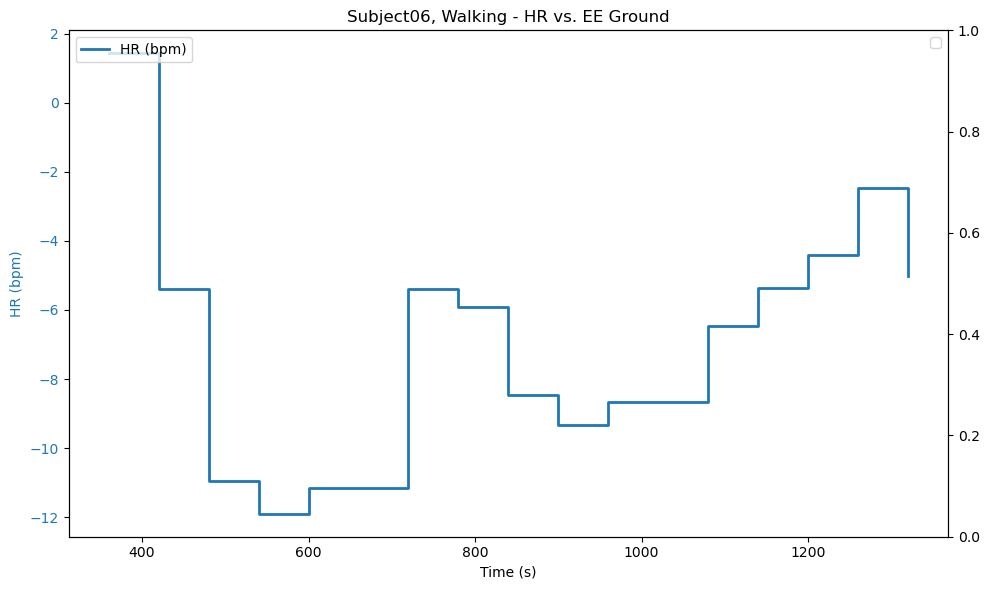

Subject07 Backwards
-----------
Standing Average HR: 73.32692307692308
HR Points: 10 values
Final dataframe shape: (10, 5)
        HR  Index    Subject   Activity  Time
0  17.5367      0  Subject07  Backwards   360
1  12.8094      1  Subject07  Backwards   420
2  11.4731      2  Subject07  Backwards   480
3  12.5302      3  Subject07  Backwards   540
4   9.5426      4  Subject07  Backwards   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


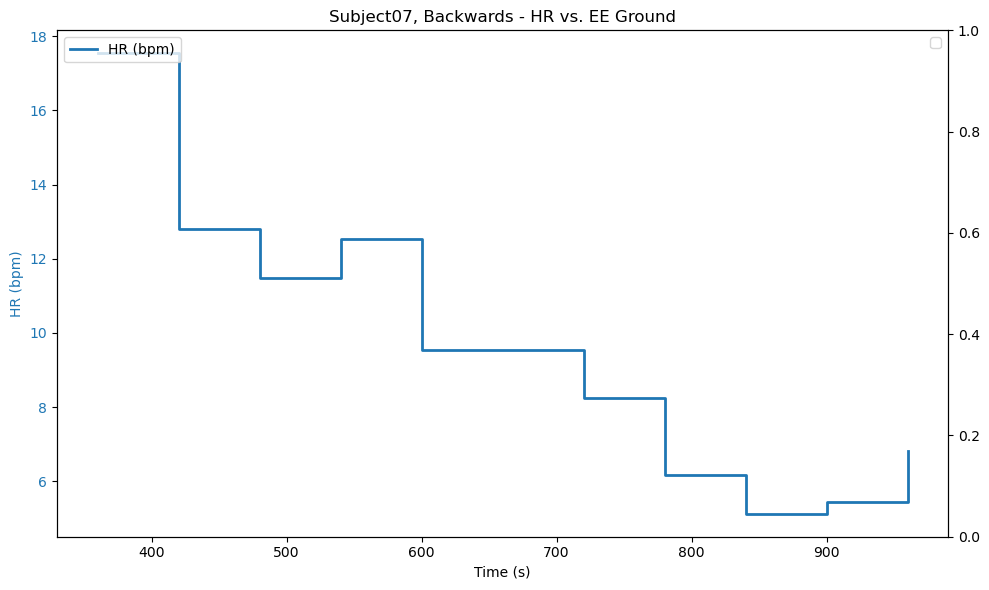

Subject07 Cycling
-----------
Standing Average HR: 70.9090909090909
HR Points: 20 values
Final dataframe shape: (20, 5)
        HR  Index    Subject Activity  Time
0  14.0354      0  Subject07  Cycling   360
1  14.2576      1  Subject07  Cycling   420
2  11.7159      2  Subject07  Cycling   480
3  12.9856      3  Subject07  Cycling   540
4  12.8556      4  Subject07  Cycling   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


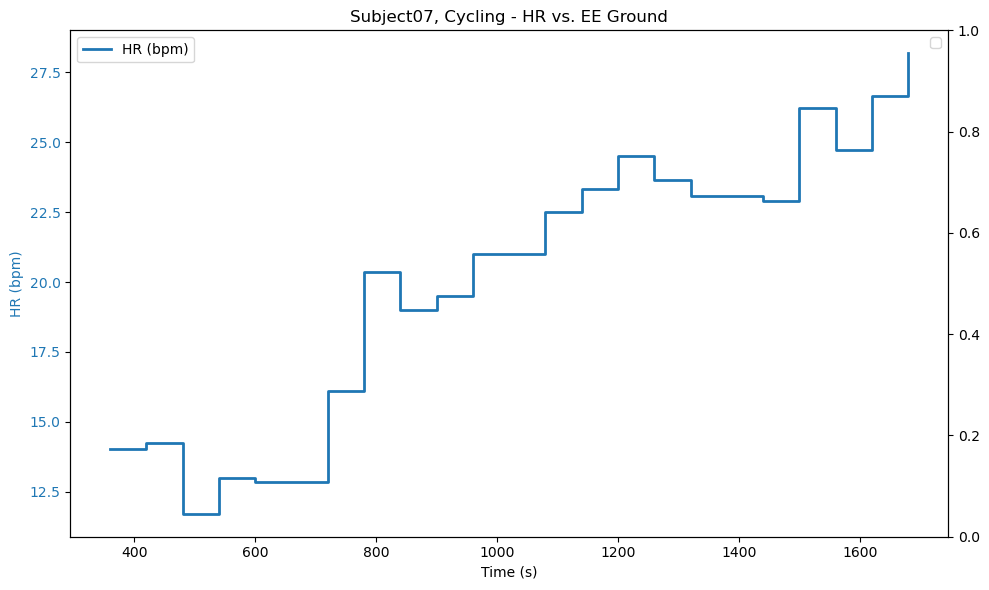

Subject07 Incline
-----------
Standing Average HR: 74.6
HR Points: 25 values
Final dataframe shape: (25, 5)
        HR  Index    Subject Activity  Time
0  20.2000      0  Subject07  Incline   360
1  30.3583      1  Subject07  Incline   420
2  26.4476      2  Subject07  Incline   480
3  24.6727      3  Subject07  Incline   540
4  27.3048      4  Subject07  Incline   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


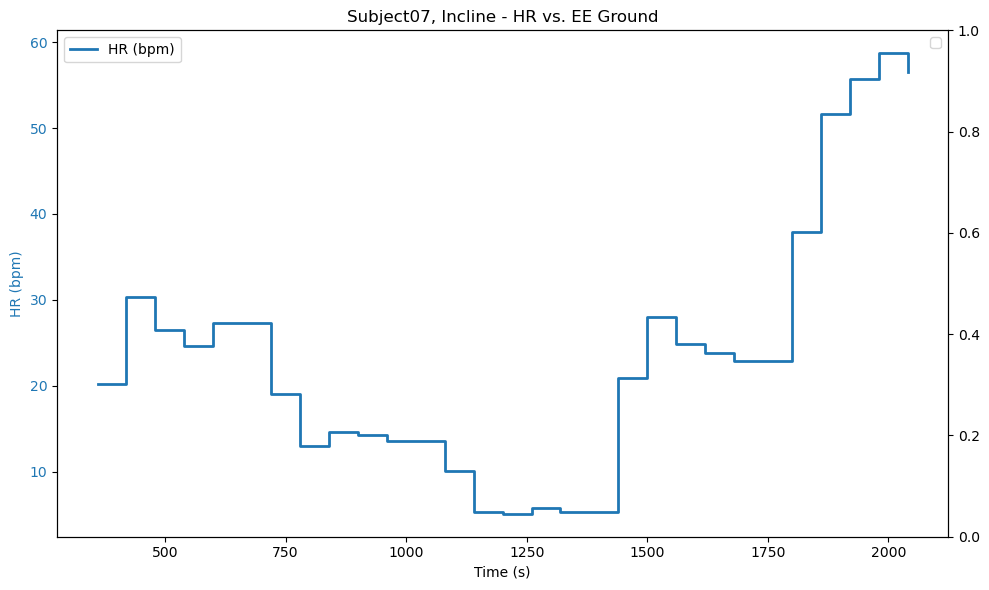

Subject07 Running
-----------
Standing Average HR: 66.2127659574468
HR Points: 20 values
Final dataframe shape: (20, 5)
        HR  Index    Subject Activity  Time
0  17.4691      0  Subject07  Running   360
1  15.0372      1  Subject07  Running   420
2  13.3587      2  Subject07  Running   480
3  13.2872      3  Subject07  Running   540
4  15.3110      4  Subject07  Running   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


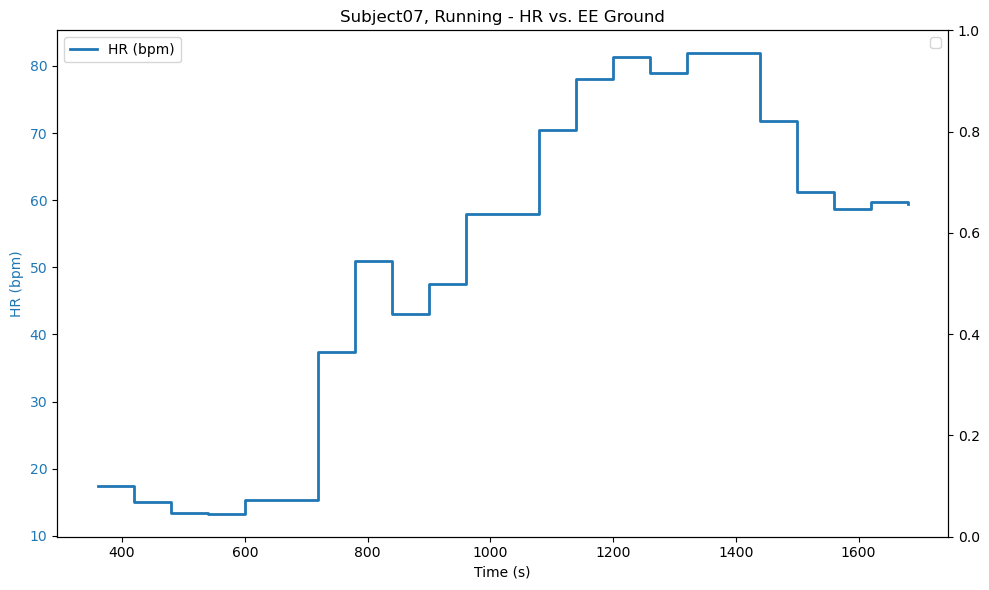

Subject07 Stairs
-----------
Standing Average HR: 74.02083333333333
HR Points: 15 values
Final dataframe shape: (15, 5)
        HR  Index    Subject Activity  Time
0  14.4554      0  Subject07   Stairs   360
1  23.5030      1  Subject07   Stairs   420
2  20.9792      2  Subject07   Stairs   480
3  22.7519      3  Subject07   Stairs   540
4  22.7973      4  Subject07   Stairs   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


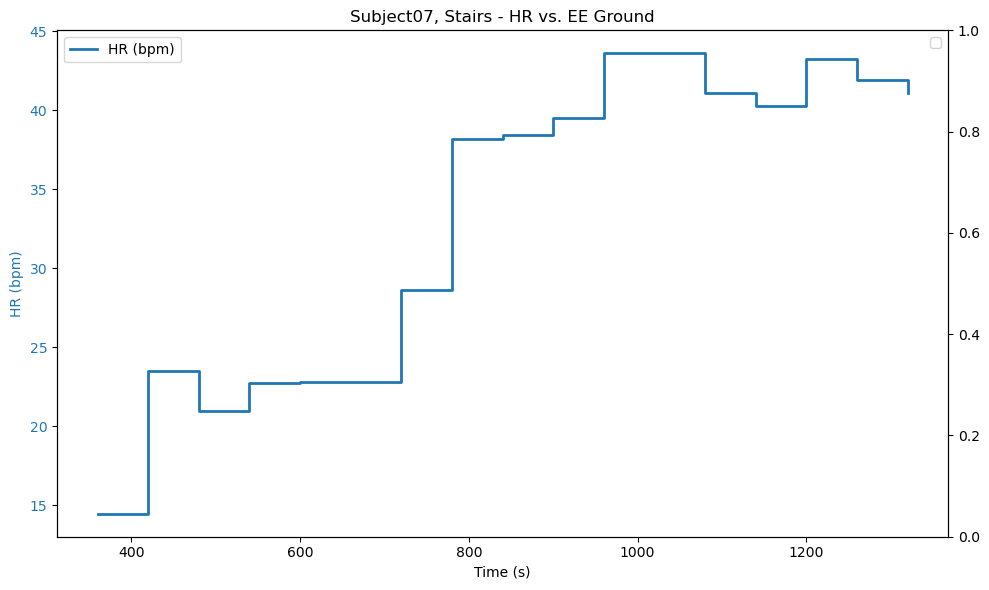

Subject07 Walking
-----------
Standing Average HR: 80.0
HR Points: 15 values
Final dataframe shape: (15, 5)
        HR  Index    Subject Activity  Time
0   8.6842      0  Subject07  Walking   360
1  10.2632      1  Subject07  Walking   420
2   7.5789      2  Subject07  Walking   480
3   5.3158      3  Subject07  Walking   540
4   5.0000      4  Subject07  Walking   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


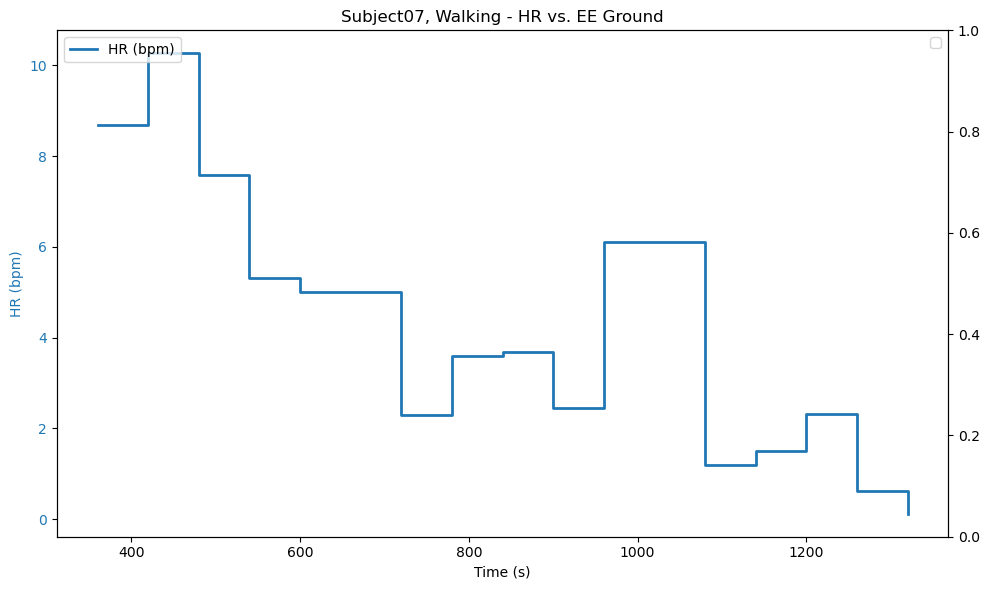

Subject08 Backwards
-----------
Standing Average HR: 90.84444444444445
HR Points: 10 values
Final dataframe shape: (10, 5)
        HR  Index    Subject   Activity  Time
0  14.3374      0  Subject08  Backwards   360
1  12.4556      1  Subject08  Backwards   420
2  11.3460      2  Subject08  Backwards   480
3  11.4737      3  Subject08  Backwards   540
4  14.7746      4  Subject08  Backwards   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


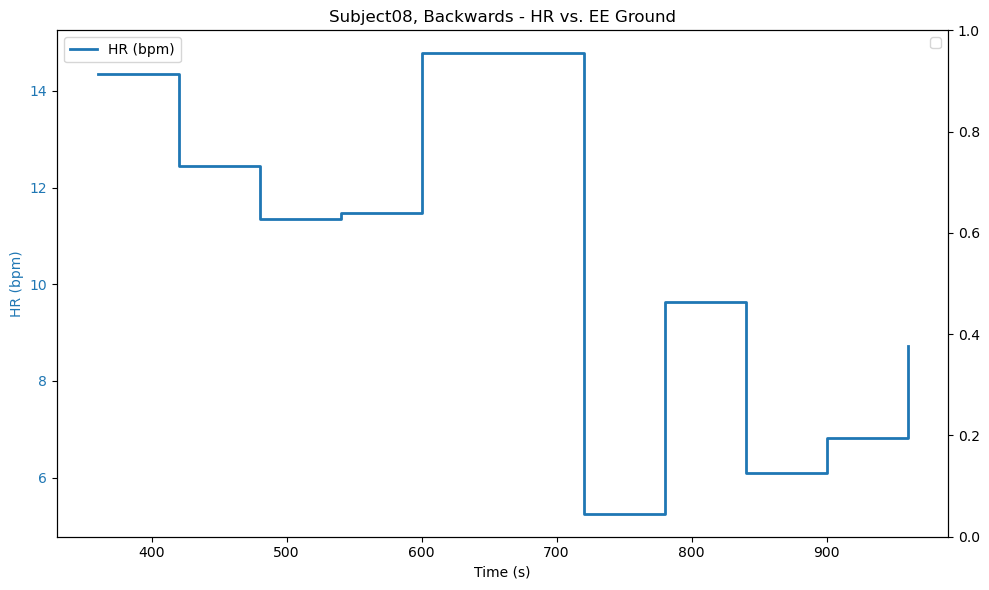

Subject08 Cycling
-----------
Standing Average HR: 101.30909090909091
HR Points: 20 values
Final dataframe shape: (20, 5)
        HR  Index    Subject Activity  Time
0  18.0593      0  Subject08  Cycling   360
1  24.5091      1  Subject08  Cycling   420
2  28.6909      2  Subject08  Cycling   480
3  31.5170      3  Subject08  Cycling   540
4  30.9309      4  Subject08  Cycling   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


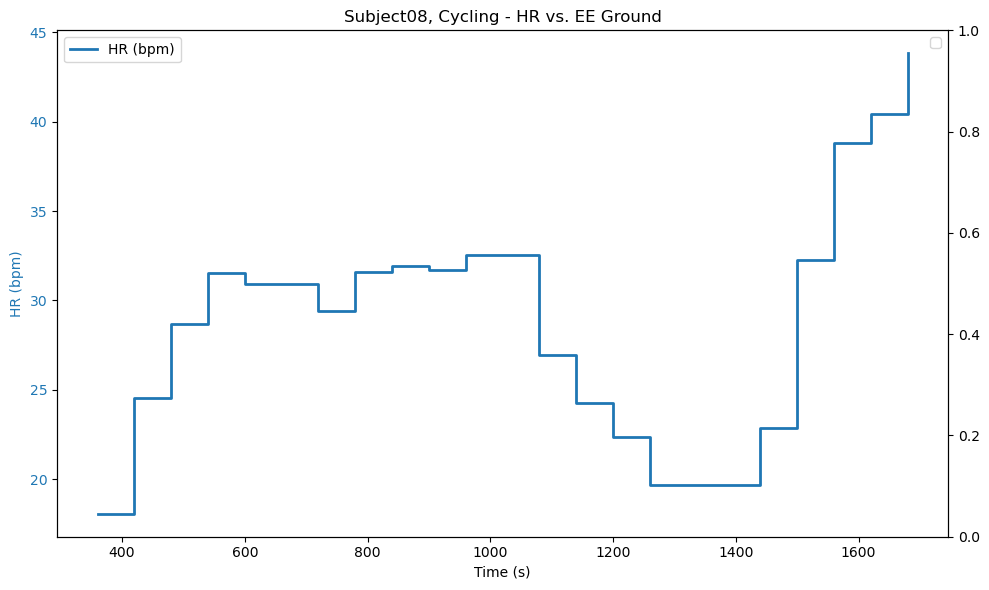

Subject08 Incline
-----------
Standing Average HR: 75.08695652173913
HR Points: 25 values
Final dataframe shape: (25, 5)
        HR  Index    Subject Activity  Time
0  25.3892      0  Subject08  Incline   360
1  32.1908      1  Subject08  Incline   420
2  31.8221      2  Subject08  Incline   480
3  36.2609      3  Subject08  Incline   540
4  36.4348      4  Subject08  Incline   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


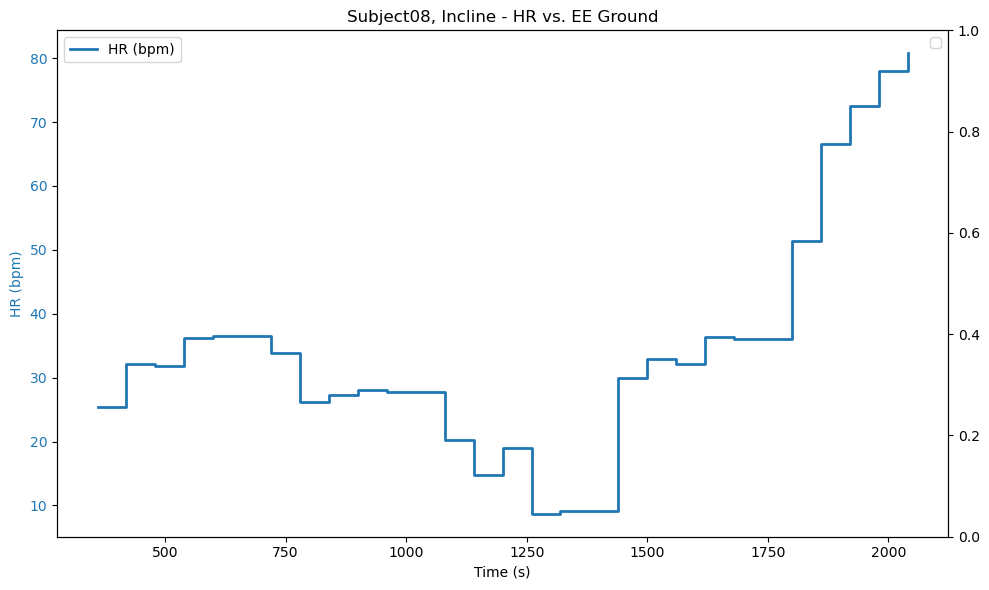

Subject08 Running
-----------
Standing Average HR: 86.12820512820512
HR Points: 20 values
Final dataframe shape: (20, 5)
        HR  Index    Subject Activity  Time
0  18.2402      0  Subject08  Running   360
1   9.9627      1  Subject08  Running   420
2   6.2928      2  Subject08  Running   480
3   7.9829      3  Subject08  Running   540
4  10.7718      4  Subject08  Running   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


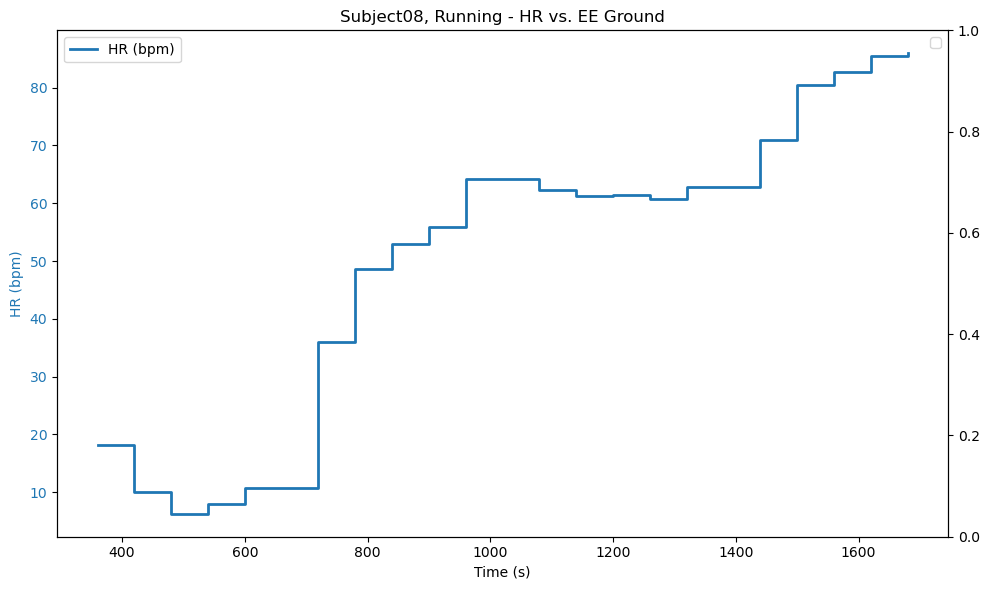

Subject08 Stairs
-----------
Standing Average HR: 106.64814814814815
HR Points: 15 values
Final dataframe shape: (15, 5)
        HR  Index    Subject Activity  Time
0  10.1700      0  Subject08   Stairs   360
1  24.7919      1  Subject08   Stairs   420
2  25.8519      2  Subject08   Stairs   480
3  28.6595      3  Subject08   Stairs   540
4  30.2407      4  Subject08   Stairs   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


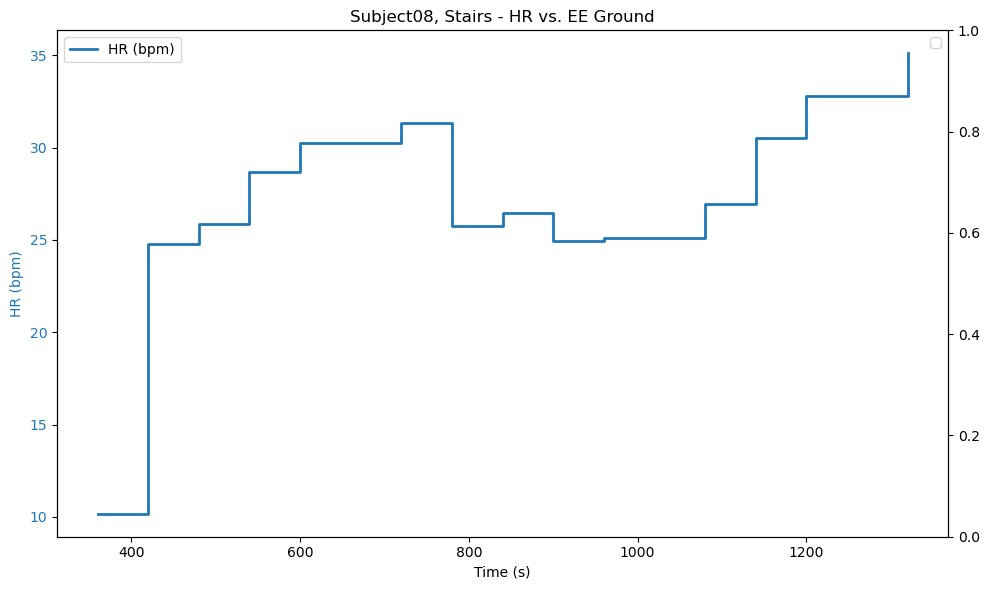

Subject08 Walking
-----------
Standing Average HR: 81.0
HR Points: 15 values
Final dataframe shape: (15, 5)
       HR  Index    Subject Activity  Time
0  6.6000      0  Subject08  Walking   360
1 -0.6842      1  Subject08  Walking   420
2 -0.6667      2  Subject08  Walking   480
3 -1.2273      3  Subject08  Walking   540
4 -1.2500      4  Subject08  Walking   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


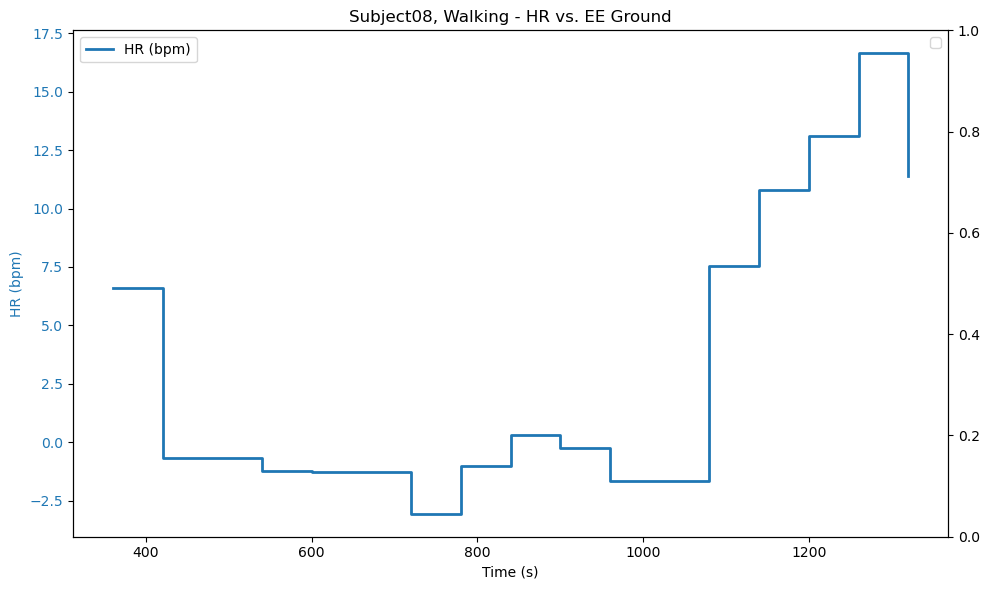

/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


Subject09 Backwards
-----------
Standing Average HR: 73.52
HR Points: 10 values
Final dataframe shape: (10, 5)
       HR  Index    Subject   Activity  Time
0  6.3035      0  Subject09  Backwards   360
1  4.1723      1  Subject09  Backwards   420
2  4.0954      2  Subject09  Backwards   480
3  3.3262      3  Subject09  Backwards   540
4  4.0133      4  Subject09  Backwards   600


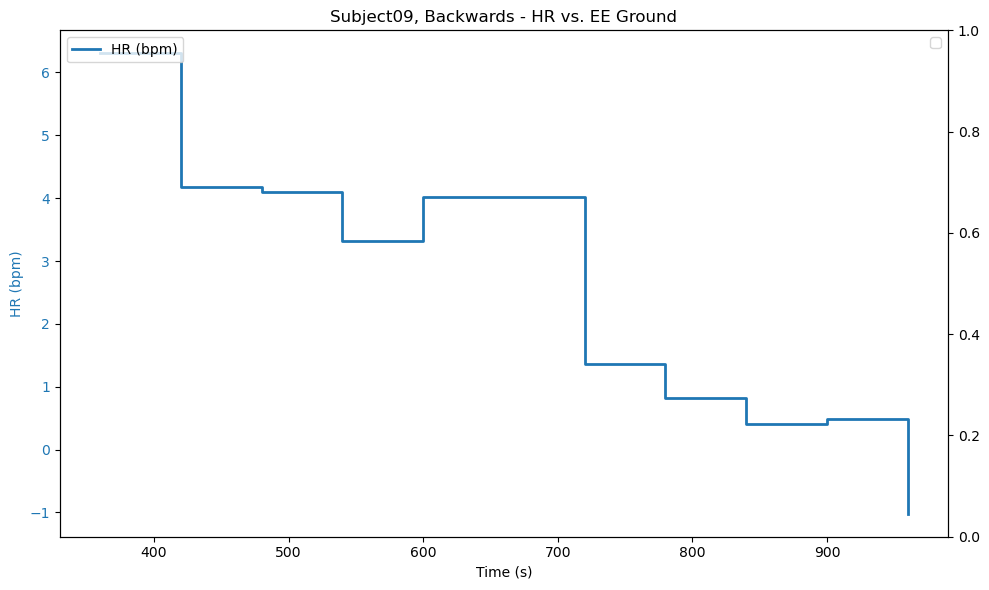

Subject09 Cycling
-----------
Standing Average HR: 73.16666666666667
HR Points: 20 values
Final dataframe shape: (20, 5)
       HR  Index    Subject Activity  Time
0  8.1377      0  Subject09  Cycling   360
1  8.3889      1  Subject09  Cycling   420
2  7.8922      2  Subject09  Cycling   480
3  7.8922      3  Subject09  Cycling   540
4  7.1111      4  Subject09  Cycling   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


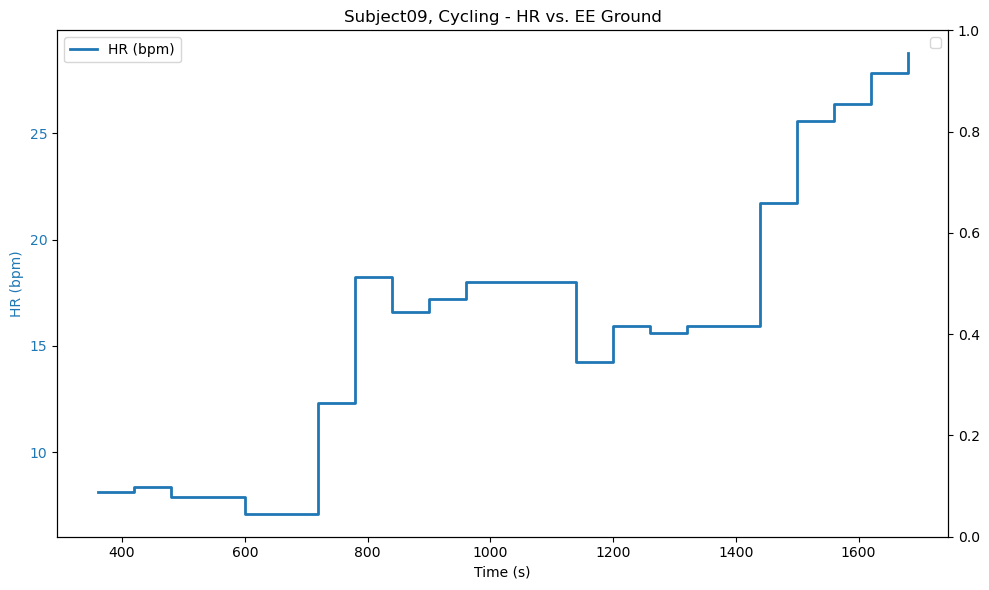

Subject09 Incline
-----------
Standing Average HR: 67.96
HR Points: 25 values
Final dataframe shape: (25, 5)
       HR  Index    Subject Activity  Time
0  3.2218      0  Subject09  Incline   360
1  5.2900      1  Subject09  Incline   420
2  6.0400      2  Subject09  Incline   480
3  5.6233      3  Subject09  Incline   540
4  4.8257      4  Subject09  Incline   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


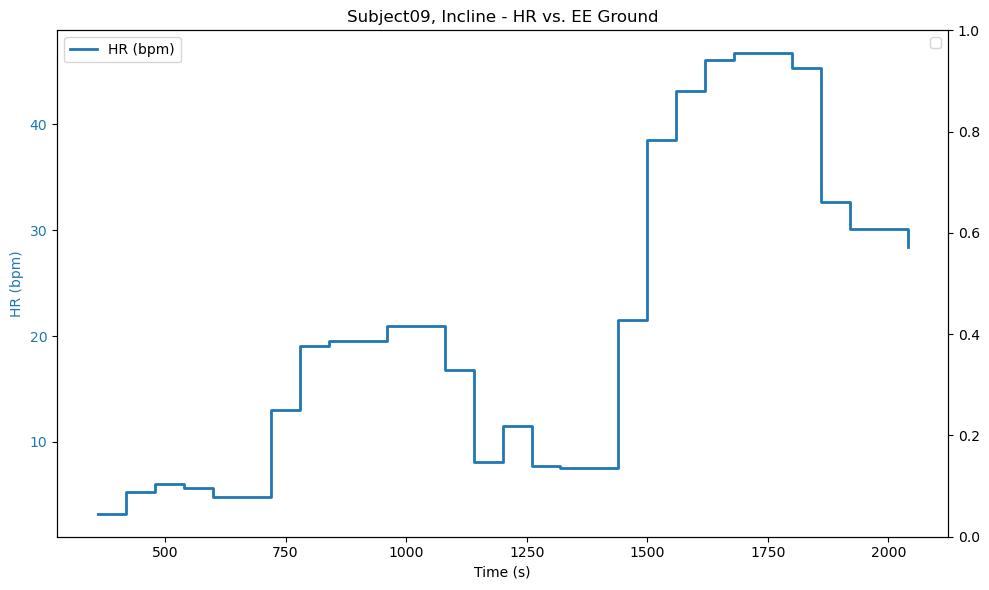

Subject09 Running
-----------
Standing Average HR: 66.45945945945945
HR Points: 20 values
Final dataframe shape: (20, 5)
        HR  Index    Subject Activity  Time
0  11.2224      0  Subject09  Running   360
1   8.6834      1  Subject09  Running   420
2   8.7905      2  Subject09  Running   480
3   8.1876      3  Subject09  Running   540
4  10.9155      4  Subject09  Running   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


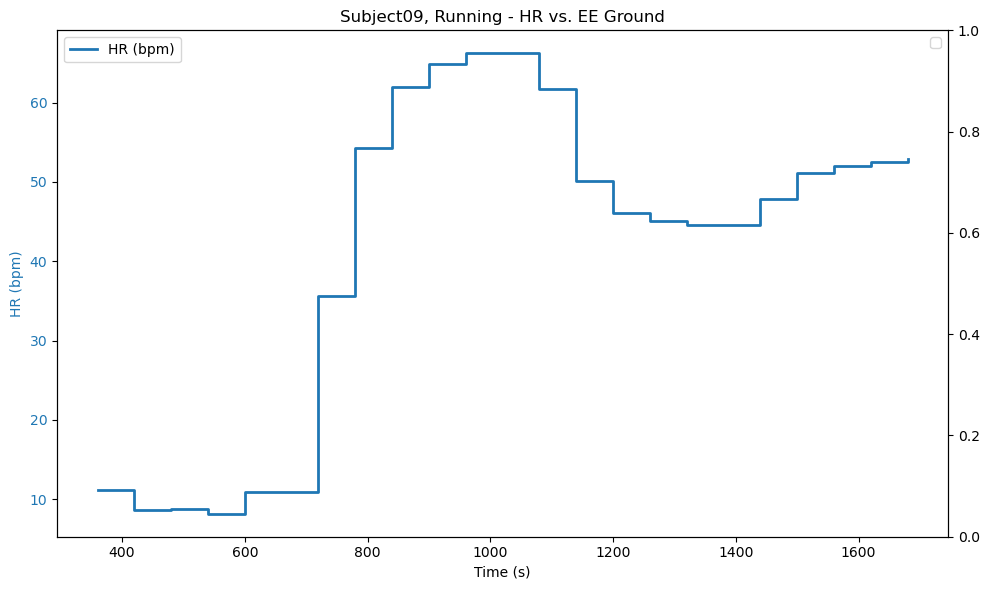

Subject09 Stairs
-----------
Standing Average HR: 76.85416666666667
HR Points: 15 values
Final dataframe shape: (15, 5)
        HR  Index    Subject Activity  Time
0   8.5625      0  Subject09   Stairs   360
1  15.9958      1  Subject09   Stairs   420
2  14.4616      2  Subject09   Stairs   480
3  13.5958      3  Subject09   Stairs   540
4  14.5458      4  Subject09   Stairs   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


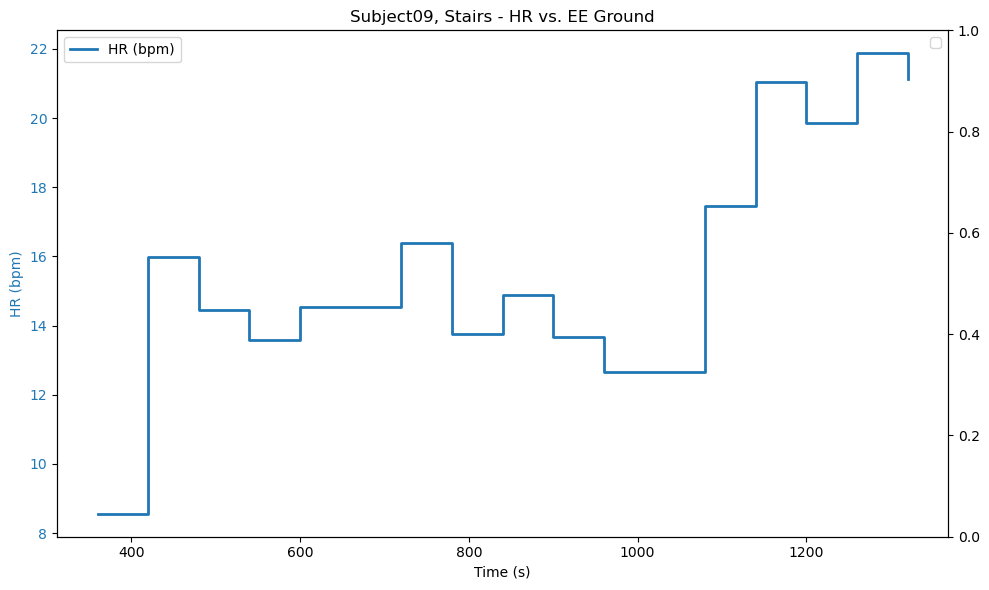

Subject09 Walking
-----------
Standing Average HR: 72.4090909090909
HR Points: 15 values
Final dataframe shape: (15, 5)
       HR  Index    Subject Activity  Time
0  5.4856      0  Subject09  Walking   360
1  5.5909      1  Subject09  Walking   420
2  4.4242      2  Subject09  Walking   480
3  3.6534      3  Subject09  Walking   540
4  4.4034      4  Subject09  Walking   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


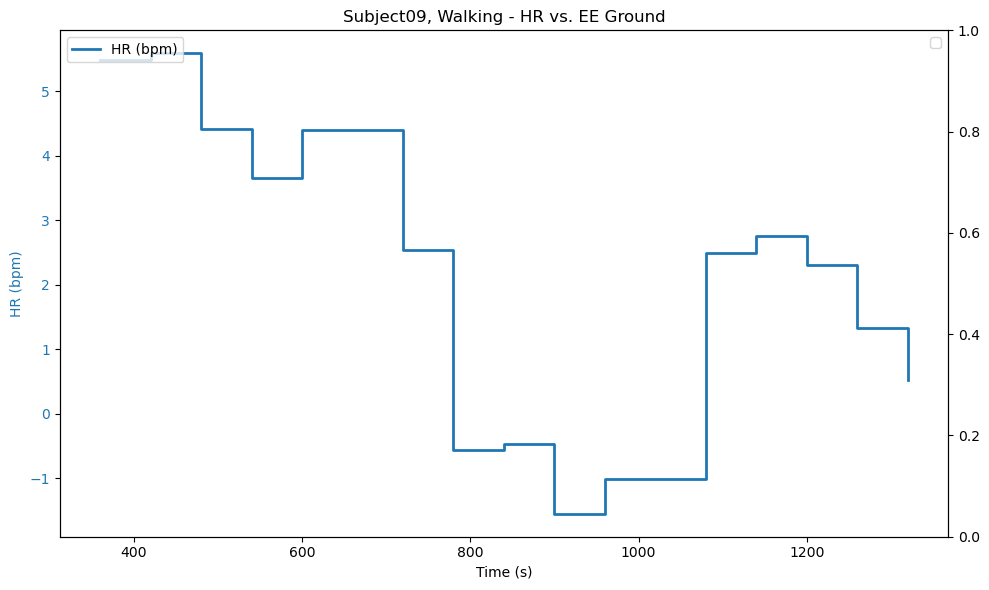

Subject10 Backwards
-----------
Standing Average HR: 92.0909090909091
HR Points: 10 values
Final dataframe shape: (10, 5)
       HR  Index    Subject   Activity  Time
0  5.9091      0  Subject10  Backwards   360
1  3.0519      1  Subject10  Backwards   420
2 -0.1279      2  Subject10  Backwards   480
3  1.3322      3  Subject10  Backwards   540
4  0.5758      4  Subject10  Backwards   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


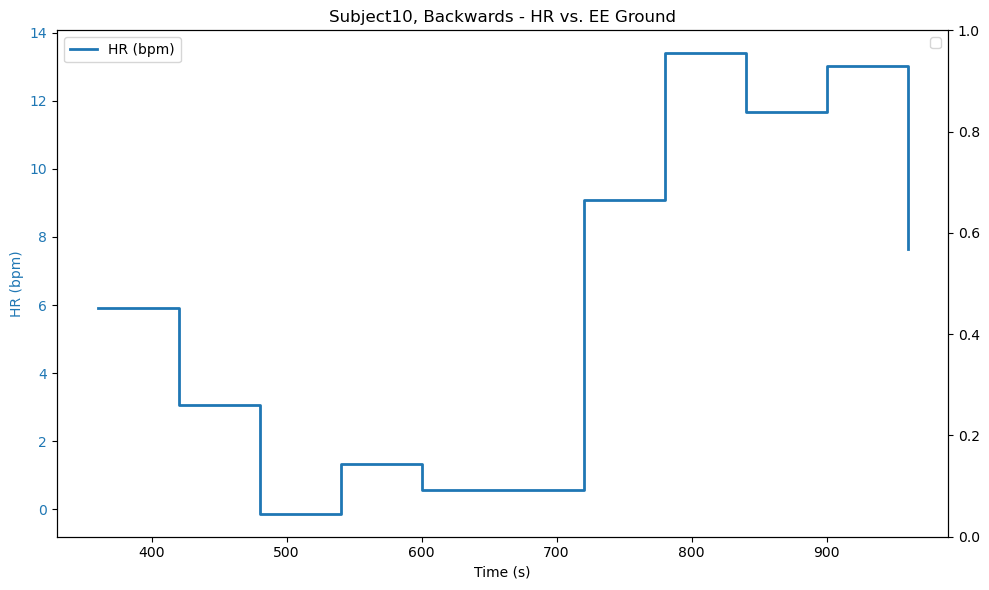

Subject10 Cycling
-----------
Standing Average HR: 94.88135593220339
HR Points: 20 values
Final dataframe shape: (20, 5)
        HR  Index    Subject Activity  Time
0  18.0816      0  Subject10  Cycling   360
1  25.9705      1  Subject10  Cycling   420
2  26.8329      2  Subject10  Cycling   480
3  24.2725      3  Subject10  Cycling   540
4  24.6571      4  Subject10  Cycling   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


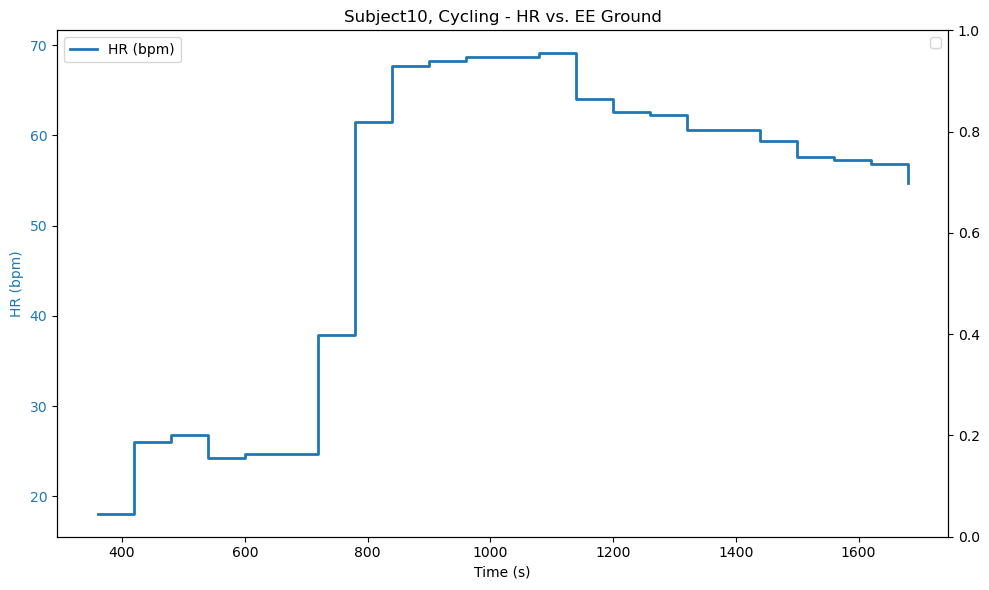

Subject10 Incline
-----------
Standing Average HR: 74.18032786885246
HR Points: 25 values
Final dataframe shape: (25, 5)
        HR  Index    Subject Activity  Time
0  14.8632      0  Subject10  Incline   360
1  18.3752      1  Subject10  Incline   420
2  15.0889      2  Subject10  Incline   480
3  15.7507      3  Subject10  Incline   540
4  14.1658      4  Subject10  Incline   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


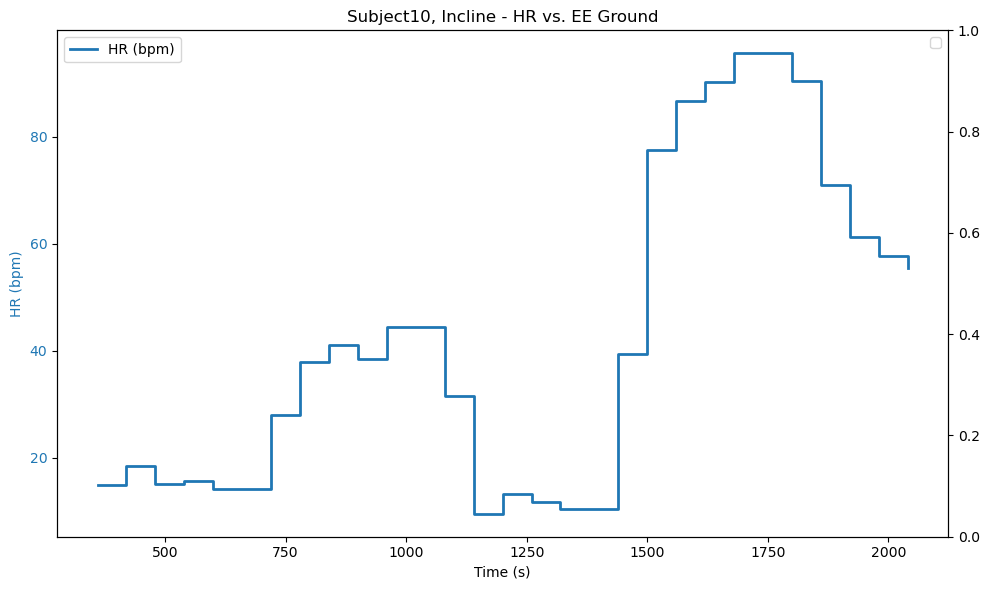

/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


Subject10 Running
-----------
Standing Average HR: 85.38095238095238
HR Points: 5 values
Final dataframe shape: (5, 5)
       HR  Index    Subject Activity  Time
0  7.1575      0  Subject10  Running   360
1  8.7344      1  Subject10  Running   420
2  9.8990      2  Subject10  Running   480
3  5.0990      3  Subject10  Running   540
4  7.8783      4  Subject10  Running   600


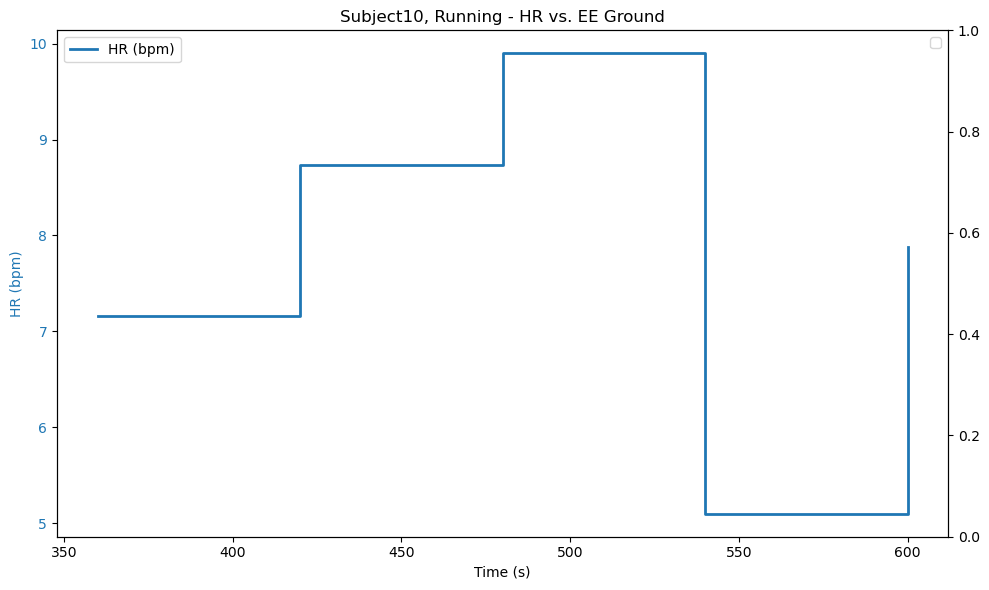

Subject10 Stairs
-----------
Standing Average HR: 105.45454545454545
HR Points: 15 values
Final dataframe shape: (15, 5)
        HR  Index    Subject Activity  Time
0  20.2121      0  Subject10   Stairs   360
1  36.5084      1  Subject10   Stairs   420
2  31.9740      2  Subject10   Stairs   480
3  31.2351      3  Subject10   Stairs   540
4  35.2788      4  Subject10   Stairs   600


/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


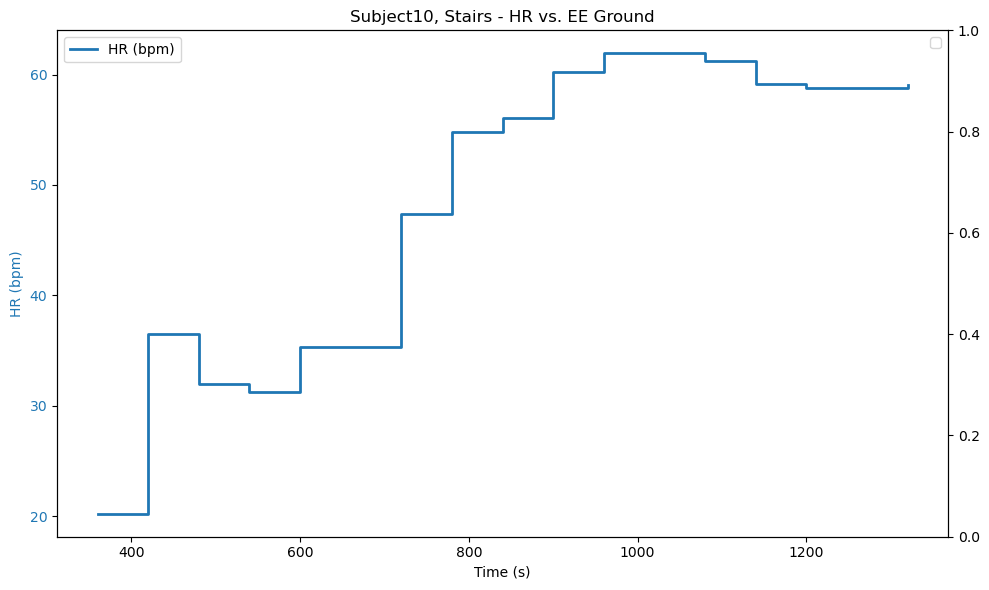

/var/folders/nt/kl5prt3s1z3dddnktbk561f00000gn/T/ipykernel_1115/4147969646.py:169: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


Subject10 Walking
-----------
Standing Average HR: 70.63934426229508
HR Points: 15 values
Final dataframe shape: (15, 5)
        HR  Index    Subject Activity  Time
0  11.9023      0  Subject10  Walking   360
1  11.4807      1  Subject10  Walking   420
2   8.2068      2  Subject10  Walking   480
3  10.9857      3  Subject10  Walking   540
4   7.6940      4  Subject10  Walking   600


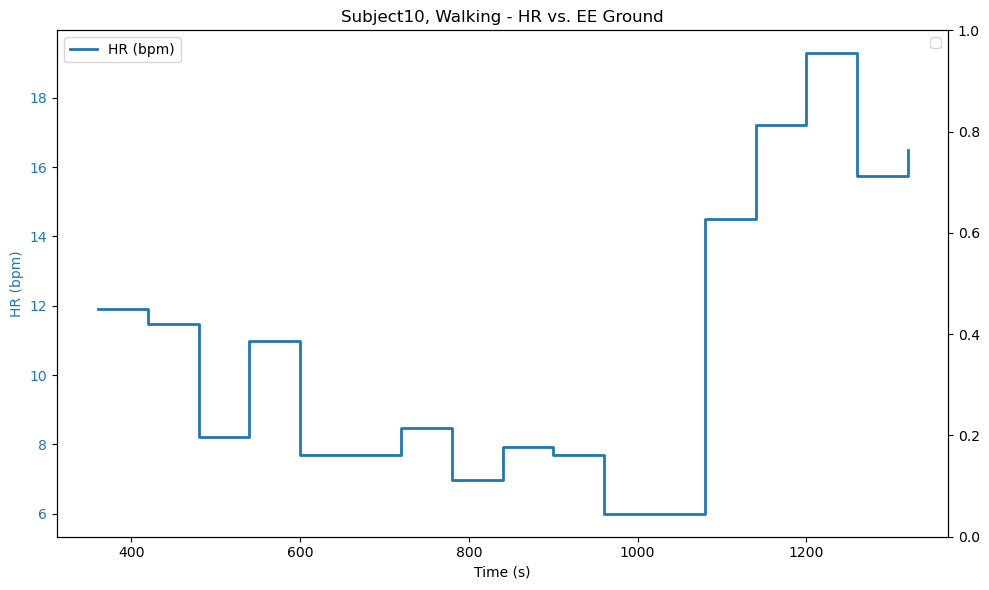


Final combined dataframe shape: (995, 5)
        HR  Index    Subject   Activity  Time
0  10.5962      0  Subject01  Backwards   360
1   9.0409      1  Subject01  Backwards   420
2   6.2528      2  Subject01  Backwards   480
3   5.7909      3  Subject01  Backwards   540
4   5.4433      4  Subject01  Backwards   600


In [46]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df_list = []

for subject in result.keys():
    hrPoints = []
    eePoints = []
    
    # Get subject dataframe - handle potential missing subjects
    try:
        indDF = globals()[subject[0]].astype(int)
    except KeyError:
        print(f"Warning: {subject[0]} not found in globals, skipping...")
        continue

    # Skip irrelevant activities
    if subject[1] in ['Backwards'] and subject[0] == 'Subject02':
        continue
    if subject[1] in ['Cycling'] and subject[0] == 'Subject05':
        continue
    if subject[1] in ['Backwards2', 'Cycling2']:
        continue

    print(f"{subject[0]} {subject[1]}\n-----------")

    # Extract HR data
    hr = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, 8]
    time_col = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, 0]
    hr_df = pd.DataFrame(hr, columns=['HR']).fillna(0)

    # Compute standing average HR from minute 3 to 6
    standing_mask = (time_col >= 3 * 60) & (time_col <= 6 * 60)
    standing_avg_hr = hr_df['HR'][standing_mask].mean()
    print("Standing Average HR:", standing_avg_hr)
    
    # Process HR data in 1-minute bins
    for i in range(len(indDF[subject[1]]) - 1):
        time_start = int(indDF[subject[1]][i])
        # time_start = result[subject[0]][subject[1]]['Metabolics_System']['Data'][interval_start, 0]
        time_end = int(indDF[subject[1]][i + 1])
        # time_end = result[subject[0]][subject[1]]['Metabolics_System']['Data'][interval_end, 0]
        data = result[subject[0]][subject[1]]['Metabolics_System']['Data']

        for minute in range(5):
            bin_start = int(time_start + minute * 60)
            bin_end = int(bin_start + 60)
            
            # Check if bin is within interval
            if bin_end <= time_end:
                # Find indices for time range
                start_mask = data[:, 0] >= bin_start
                end_mask = data[:, 0] < bin_end
                bin_mask = start_mask & end_mask
                
                if np.any(bin_mask):
                    mean_val = round(np.mean(data[bin_mask, 8]) - standing_avg_hr, 4)
                    hrPoints.append(mean_val)
            else:
                break
                
    # Remove NaN values
    hrPoints = [x for x in hrPoints if not np.isnan(x)]
    print(f"HR Points: {len(hrPoints)} values")

    # # EE calculation
    # try:
        
    #     VO2 = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, vo2_col]
    #     VCO2 = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, vco2_col]
    #     EE = (16.58 * VO2 + 4.15 * VCO2) / mass_val
        
    #     ind = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, code_col]
    #     ind_diff = ind[:-1] - ind[1:]
    #     bool_ind = ind_diff != 0.0
    #     indShift = np.where(bool_ind)[0]
    #     indShift = np.concatenate((indShift, [len(ind_diff)]))

    #     # Calculate baseline EE
    #     T_first_phase = result[subject[0]][subject[1]]['Metabolics_System']['Data'][indShift[0], 0]
    #     timeM3_first = T_first_phase - (3 * 60)
    #     bool_time_first = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, 0] < timeM3_first
        
    #     if np.any(bool_time_first):
    #         threeMin_first = indShift[0] - np.max(np.where(bool_time_first)[0])
    #         EE_avg_first = np.mean(EE[indShift[0] - threeMin_first:indShift[0]])
    #     else:
    #         EE_avg_first = np.mean(EE[:indShift[0]])

    #     # Calculate EE for each phase
    #     for i in range(len(indShift)):
    #         T = result[subject[0]][subject[1]]['Metabolics_System']['Data'][indShift[i], 0]
    #         timeM3 = T - (3 * 60)
    #         bool_time = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, 0] < timeM3
            
    #         if np.any(bool_time):
    #             threeMin = indShift[i] - np.max(np.where(bool_time)[0])
    #         else:
    #             threeMin = 180  # Default 3 minutes worth of data points

    #         if i == 0:
    #             ee_val = np.mean(EE[max(0, indShift[i] - threeMin):indShift[i]]) - EE_avg_first
    #             eePoints.append(round(ee_val, 4))
    #         elif i == len(indShift) - 1:
    #             ee_val = np.mean(EE[max(0, -threeMin):]) - EE_avg_first
    #             eePoints.append(round(ee_val, 4))
    #         else:
    #             ee_val = np.mean(EE[max(0, indShift[i] - threeMin):indShift[i]]) - EE_avg_first
    #             eePoints.append(round(ee_val, 4))

    # except (KeyError, IndexError) as e:
    #     print(f"Error processing EE data for {subject[0]} {subject[1]}: {e}")
    #     # Create dummy EE data if calculation fails
    #     eePoints = [0.0] * ((len(hrPoints) + 4) // 5)

    # print(f"EE Points: {len(eePoints)} values")

    # Ensure data alignment
    if len(hrPoints) == 0:
        print(f"No HR data for {subject[0]} {subject[1]}, skipping...")
        continue

    # Create aligned dataframe
    min_length = (len(hrPoints))
    hrPoints = hrPoints[:min_length]
    # ee_repeated = np.repeat(eePoints, 5)[:min_length]

    hr_eeDF = pd.DataFrame({
        'HR': hrPoints,
        # 'EE': ee_repeated,
        'Index': list(range(min_length)),
        'Subject': [subject[0]] * min_length,
        'Activity': [subject[1]] * min_length,
        'Time': [360 + 60 * i + 60 * ((i) // 5) for i in range(min_length)]
    })
        
    print(f"Final dataframe shape: {hr_eeDF.shape}")
    print(hr_eeDF.head())
    # if subject[1] == 'Incline':
    #     hr_eeDF = hr_eeDF[:-1]
    df_list.append(hr_eeDF)
    
    # Create visualization
    x = hr_eeDF['Time'].to_list()
    y_hr = hr_eeDF['HR'].to_list()
    # y_ee = hr_eeDF['EE'].to_list()

    fig, ax1 = plt.subplots(figsize=(10, 6))

    color = 'tab:blue'
    ax1.set_xlabel('Time (s)')
    ax1.set_ylabel('HR (bpm)', color=color)
    ax1.step(x, y_hr, where='post', color=color, label='HR (bpm)', linewidth=2)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()

    # color = 'tab:orange'
    # ax2.set_ylabel('EE Ground (W/kg)', color=color)
    # ax2.step(x, y_ee, where='post', color=color, label='EE Ground', linewidth=2)
    # ax2.tick_params(axis='y', labelcolor=color)

    title = f"{subject[0]}, {subject[1]} - HR vs. EE Ground"
    plt.title(title)

    # Add legends
    ax1.legend(loc='upper left')
    ax2.legend(loc='upper right')

    fig.tight_layout()
    plt.show()

# Combine all dataframes
if df_list:
    final_df = pd.concat(df_list, ignore_index=True)
    print(f"\nFinal combined dataframe shape: {final_df.shape}")
    print(final_df.head())
else:
    print("No data processed successfully.")

In [47]:
pd.set_option('display.max_rows', 2000)
final_df_r = pd.concat(df_list, ignore_index=True)
print(final_df_r)

          HR  Index    Subject   Activity  Time
0    10.5962      0  Subject01  Backwards   360
1     9.0409      1  Subject01  Backwards   420
2     6.2528      2  Subject01  Backwards   480
3     5.7909      3  Subject01  Backwards   540
4     5.4433      4  Subject01  Backwards   600
5    14.1909      5  Subject01  Backwards   720
6    12.3909      6  Subject01  Backwards   780
7    11.6273      7  Subject01  Backwards   840
8    13.9909      8  Subject01  Backwards   900
9    14.4433      9  Subject01  Backwards   960
10   23.2909     10  Subject01  Backwards  1080
11   23.2182     11  Subject01  Backwards  1140
12   20.4000     12  Subject01  Backwards  1200
13   20.3481     13  Subject01  Backwards  1260
14   19.6338     14  Subject01  Backwards  1320
15   19.9783      0  Subject01    Cycling   360
16   32.2640      1  Subject01    Cycling   420
17   34.5497      2  Subject01    Cycling   480
18   36.9783      3  Subject01    Cycling   540
19   38.0259      4  Subject01    Cyclin

Subject01 Backwards
-----------
Standing Average HR: 80.50909090909092
HR Points: 60 values
Final dataframe shape: (60, 5)
        HR  Index    Subject   Activity  Time
0   4.2409      0  Subject01  Backwards   360
1  11.4909      1  Subject01  Backwards   375
2  12.8909      2  Subject01  Backwards   390
3  12.4909      3  Subject01  Backwards   405
4  11.4909      4  Subject01  Backwards   420


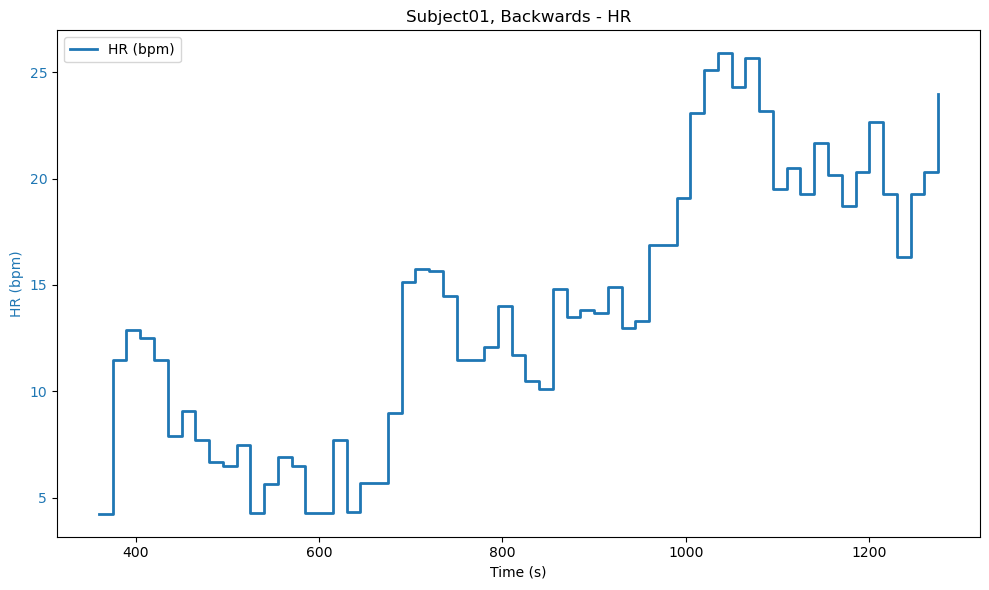

Subject01 Cycling
-----------
Standing Average HR: 87.02173913043478
HR Points: 80 values
Final dataframe shape: (80, 5)
        HR  Index    Subject Activity  Time
0   6.8116      0  Subject01  Cycling   360
1  22.7283      1  Subject01  Cycling   375
2  27.7783      2  Subject01  Cycling   390
3  25.7783      3  Subject01  Cycling   405
4  30.9783      4  Subject01  Cycling   420


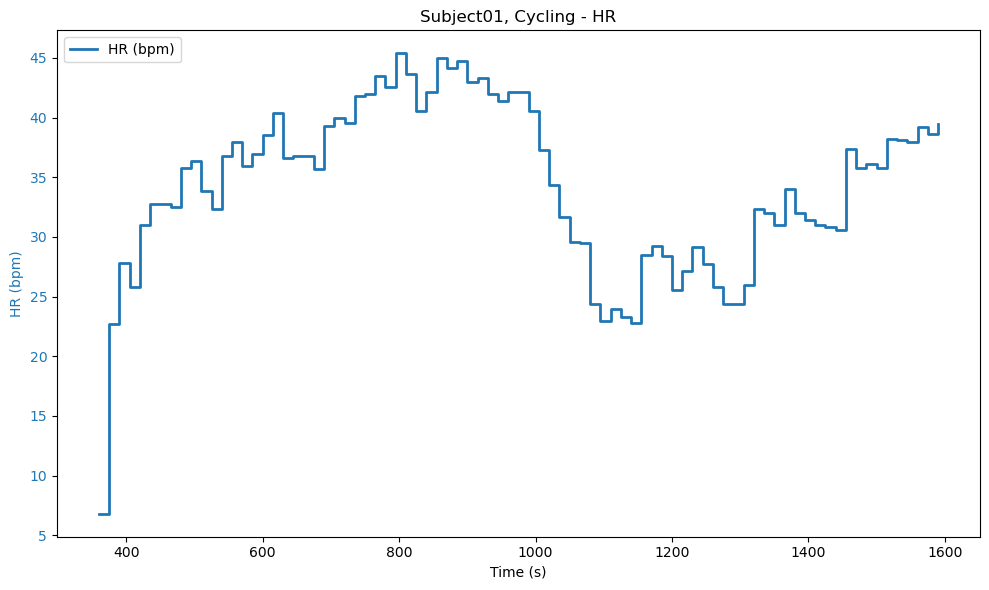

Subject01 Incline
-----------
Standing Average HR: 75.18867924528301
HR Points: 100 values
Final dataframe shape: (100, 5)
        HR  Index    Subject Activity  Time
0   5.3113      0  Subject01  Incline   360
1  25.8113      1  Subject01  Incline   375
2  27.4113      2  Subject01  Incline   390
3  27.0113      3  Subject01  Incline   405
4  28.8113      4  Subject01  Incline   420


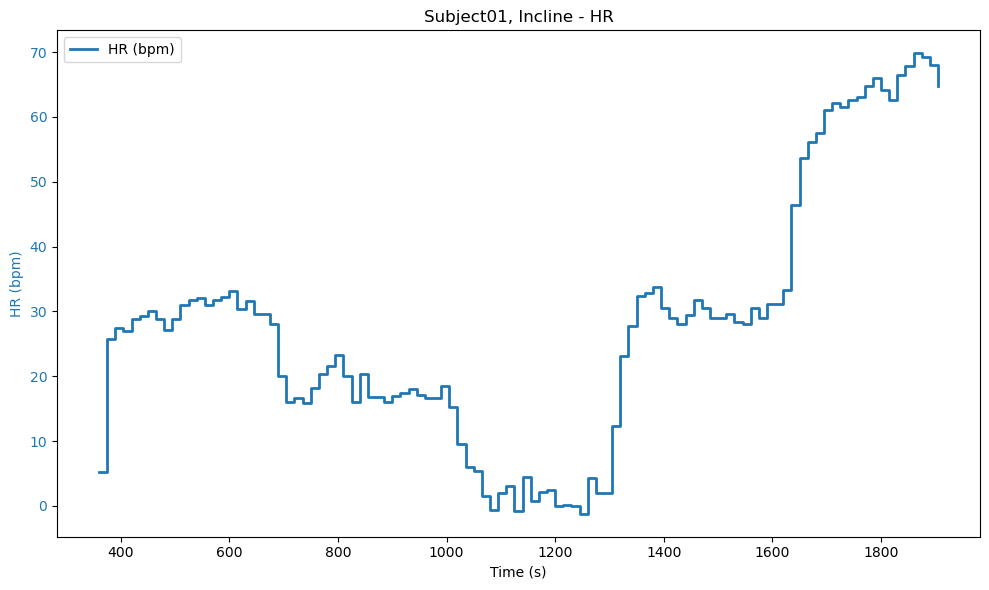

Subject01 Running
-----------
Standing Average HR: 73.61702127659575
HR Points: 60 values
Final dataframe shape: (60, 5)
        HR  Index    Subject Activity  Time
0  12.7163      0  Subject01  Running   360
1  22.7163      1  Subject01  Running   375
2  14.3830      2  Subject01  Running   390
3  17.1330      3  Subject01  Running   405
4  17.5830      4  Subject01  Running   420


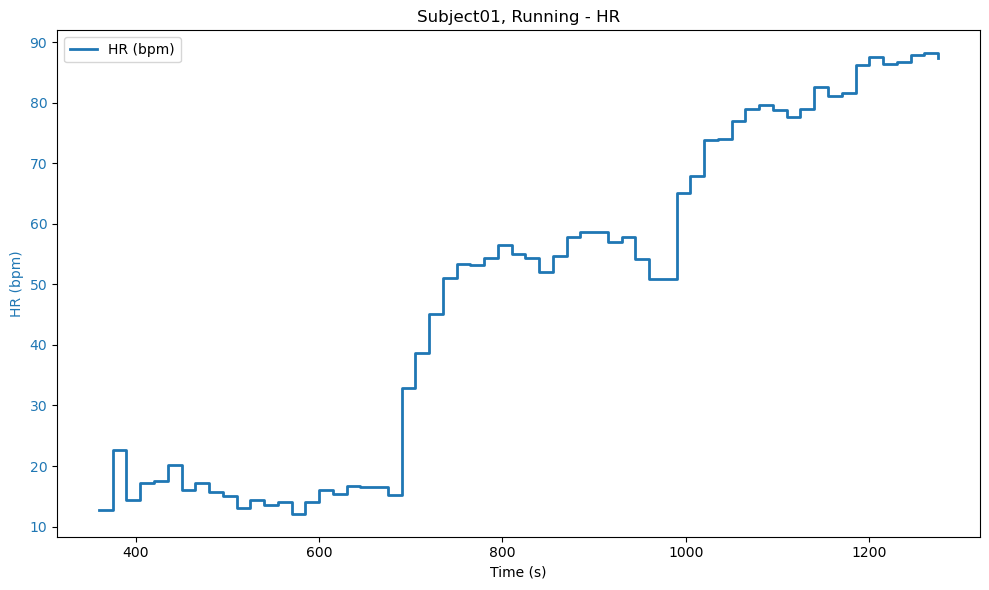

Subject01 Walking
-----------
Standing Average HR: 81.4
HR Points: 60 values
Final dataframe shape: (60, 5)
        HR  Index    Subject Activity  Time
0   2.7667      0  Subject01  Walking   360
1  12.4000      1  Subject01  Walking   375
2  11.8000      2  Subject01  Walking   390
3  13.1000      3  Subject01  Walking   405
4  13.6000      4  Subject01  Walking   420


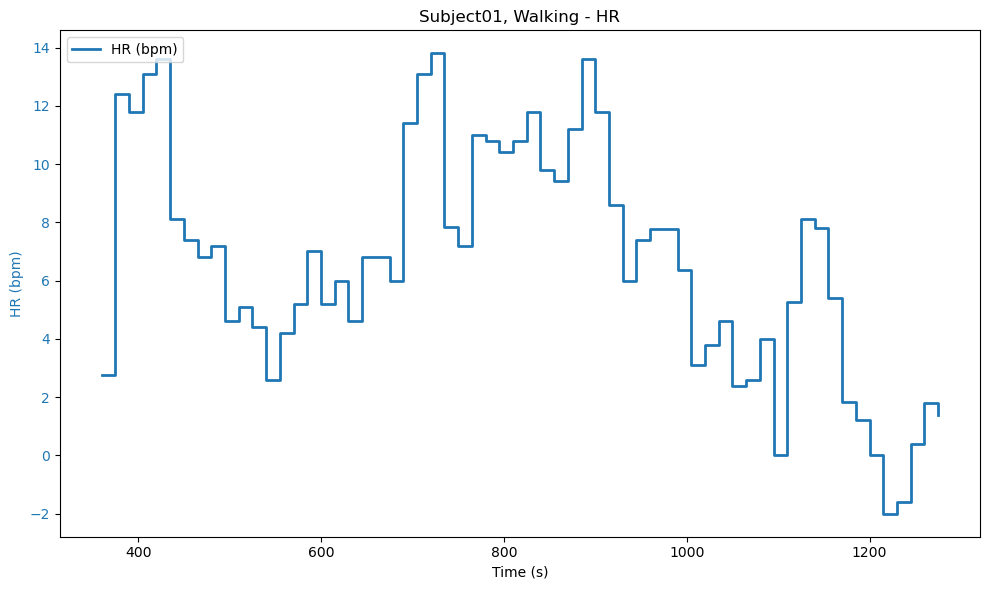

Subject02 Cycling
-----------
Standing Average HR: 68.67857142857143
HR Points: 80 values
Final dataframe shape: (80, 5)
        HR  Index    Subject Activity  Time
0   5.1214      0  Subject02  Cycling   360
1  28.5714      1  Subject02  Cycling   375
2  39.6548      2  Subject02  Cycling   390
3  40.9881      3  Subject02  Cycling   405
4  40.9881      4  Subject02  Cycling   420


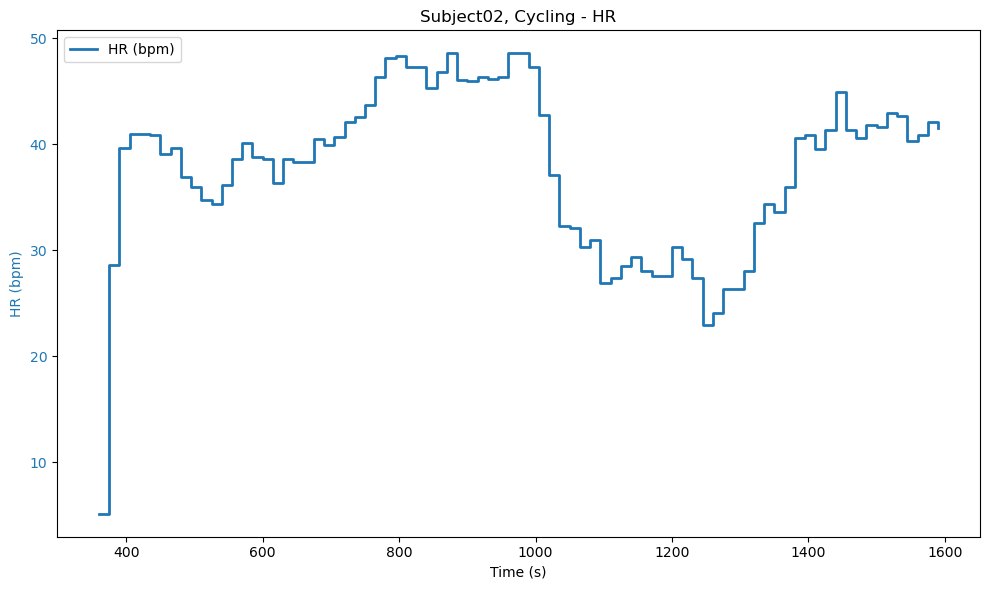

Subject02 Incline
-----------
Standing Average HR: 63.10526315789474
HR Points: 100 values
Final dataframe shape: (100, 5)
        HR  Index    Subject Activity  Time
0  12.2281      0  Subject02  Incline   360
1  30.8947      1  Subject02  Incline   375
2  35.8947      2  Subject02  Incline   390
3  35.3947      3  Subject02  Incline   405
4  36.8947      4  Subject02  Incline   420


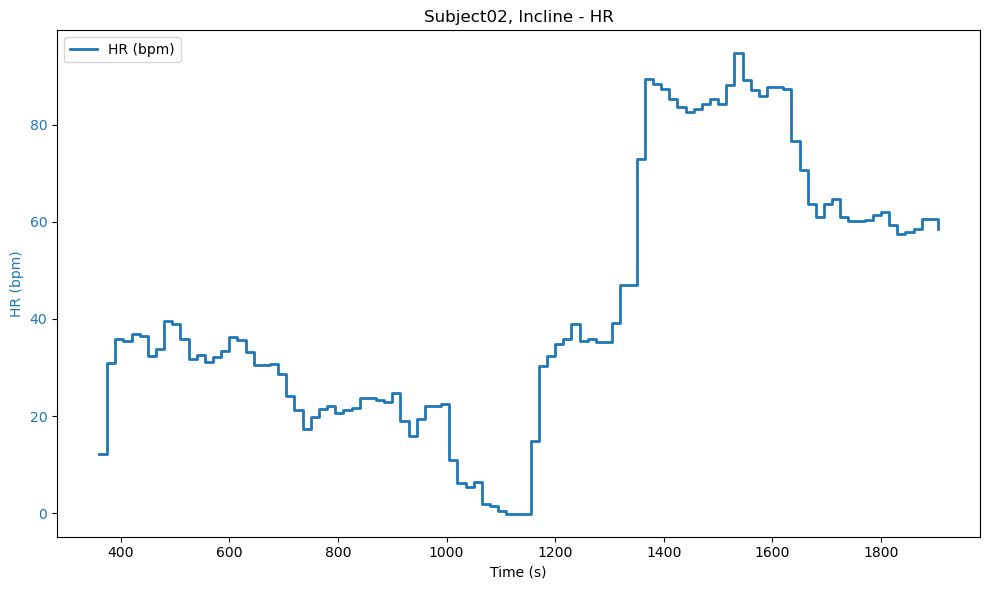

Subject02 Running
-----------
Standing Average HR: 58.94736842105263
HR Points: 80 values
Final dataframe shape: (80, 5)
        HR  Index    Subject Activity  Time
0  10.8026      0  Subject02  Running   360
1  27.3860      1  Subject02  Running   375
2  35.0526      2  Subject02  Running   390
3  39.7193      3  Subject02  Running   405
4  37.8526      4  Subject02  Running   420


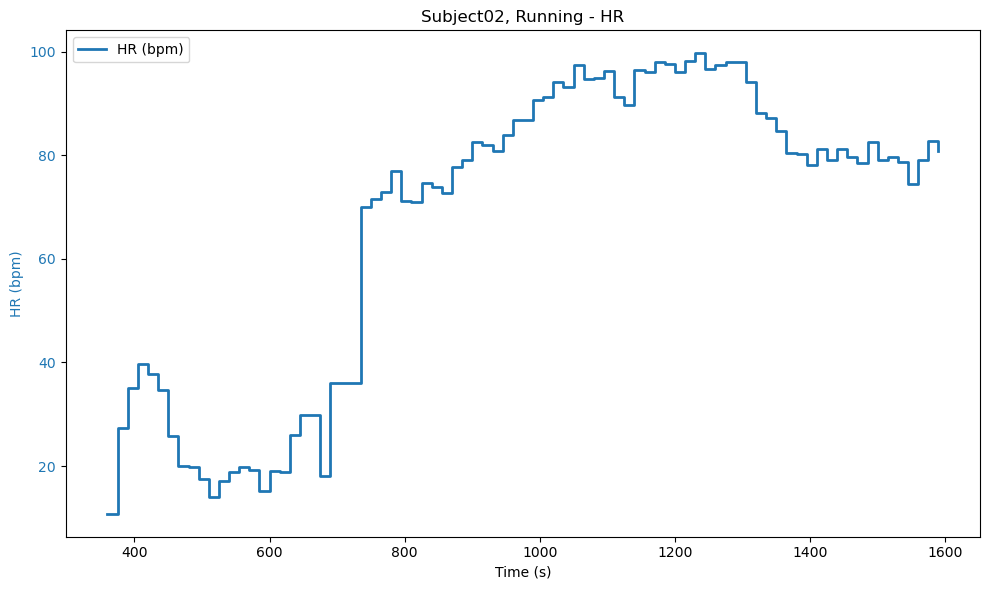

Subject02 Stairs
-----------
Standing Average HR: 76.78378378378379
HR Points: 60 values
Final dataframe shape: (60, 5)
        HR  Index    Subject Activity  Time
0   8.8162      0  Subject02   Stairs   360
1  20.0162      1  Subject02   Stairs   375
2  27.2162      2  Subject02   Stairs   390
3  33.2162      3  Subject02   Stairs   405
4  31.8162      4  Subject02   Stairs   420


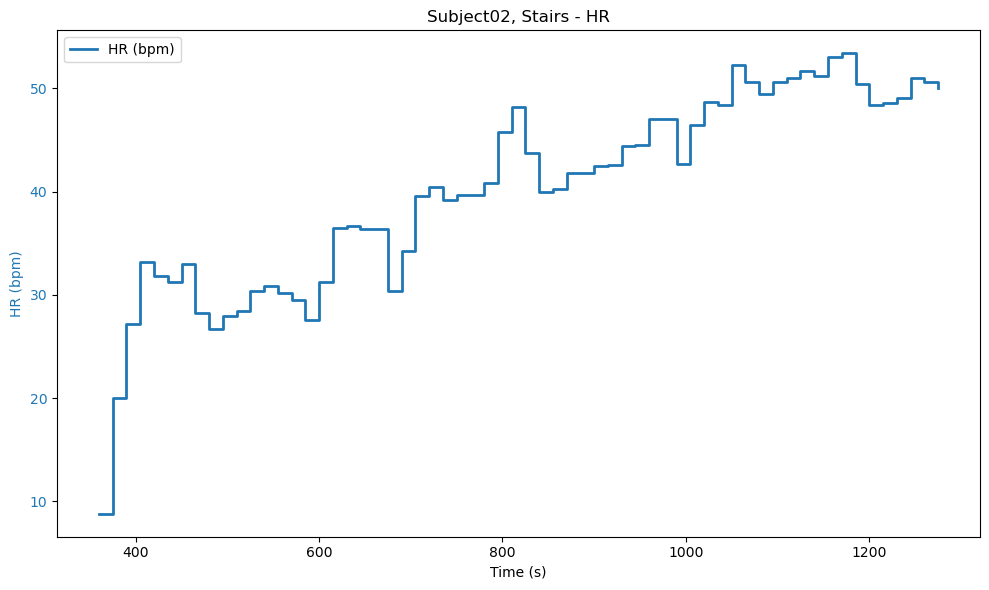

Subject02 Walking
-----------
Standing Average HR: 61.470588235294116
HR Points: 80 values
Final dataframe shape: (80, 5)
        HR  Index    Subject Activity  Time
0   3.5294      0  Subject02  Walking   360
1  17.0294      1  Subject02  Walking   375
2  24.5294      2  Subject02  Walking   390
3  25.5294      3  Subject02  Walking   405
4  26.0294      4  Subject02  Walking   420


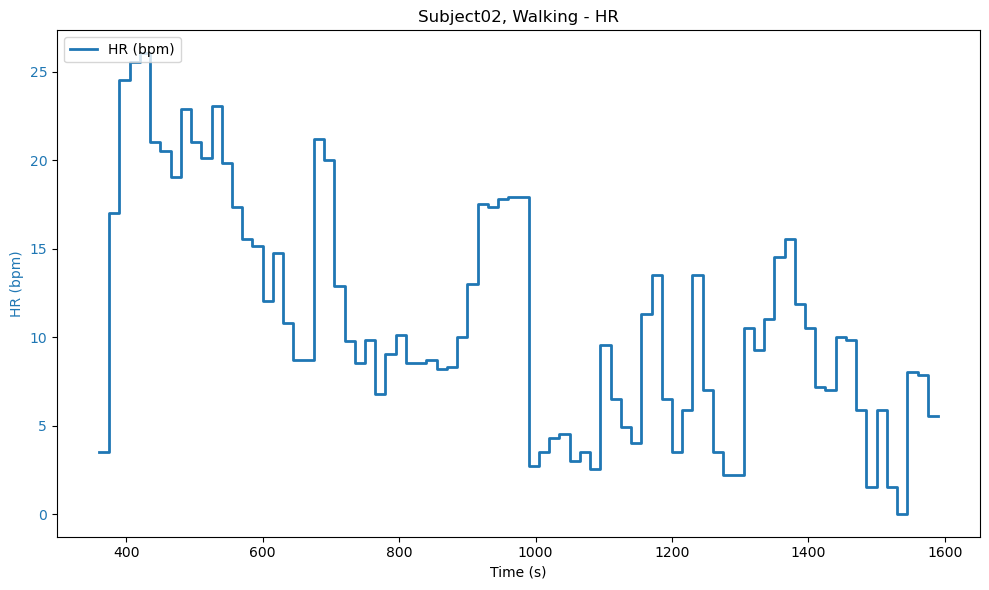

Subject03 Backwards
-----------
Standing Average HR: 124.44615384615385
HR Points: 40 values
Final dataframe shape: (40, 5)
       HR  Index    Subject   Activity  Time
0 -5.4462      0  Subject03  Backwards   360
1  2.2205      1  Subject03  Backwards   375
2  6.8872      2  Subject03  Backwards   390
3  7.1538      3  Subject03  Backwards   405
4  7.7205      4  Subject03  Backwards   420


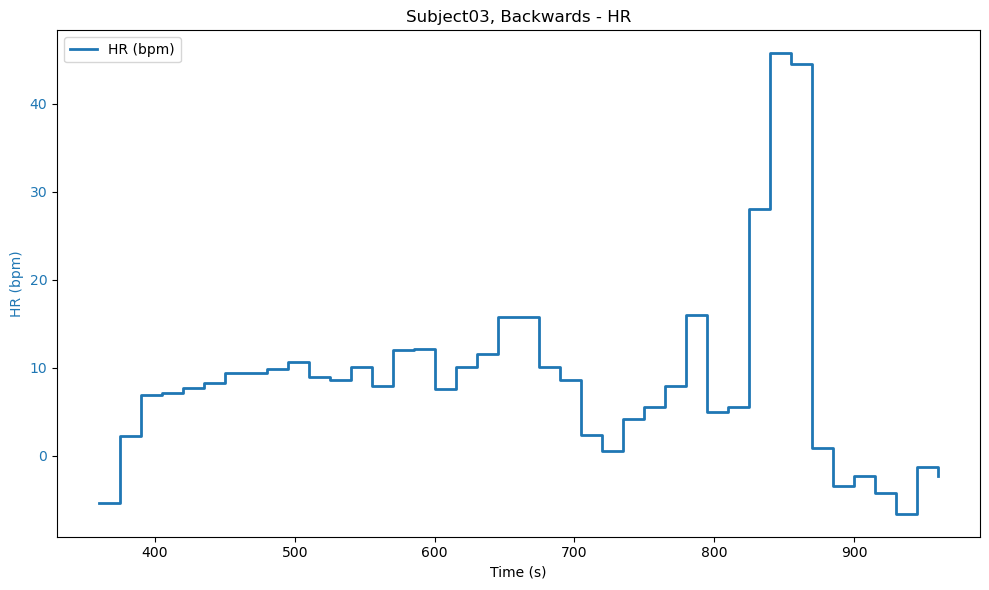

Subject03 Cycling
-----------
Standing Average HR: 109.43103448275862
HR Points: 80 values
Final dataframe shape: (80, 5)
        HR  Index    Subject Activity  Time
0  -4.4310      0  Subject03  Cycling   360
1   0.9690      1  Subject03  Cycling   375
2  10.1690      2  Subject03  Cycling   390
3  21.9023      3  Subject03  Cycling   405
4  25.9023      4  Subject03  Cycling   420


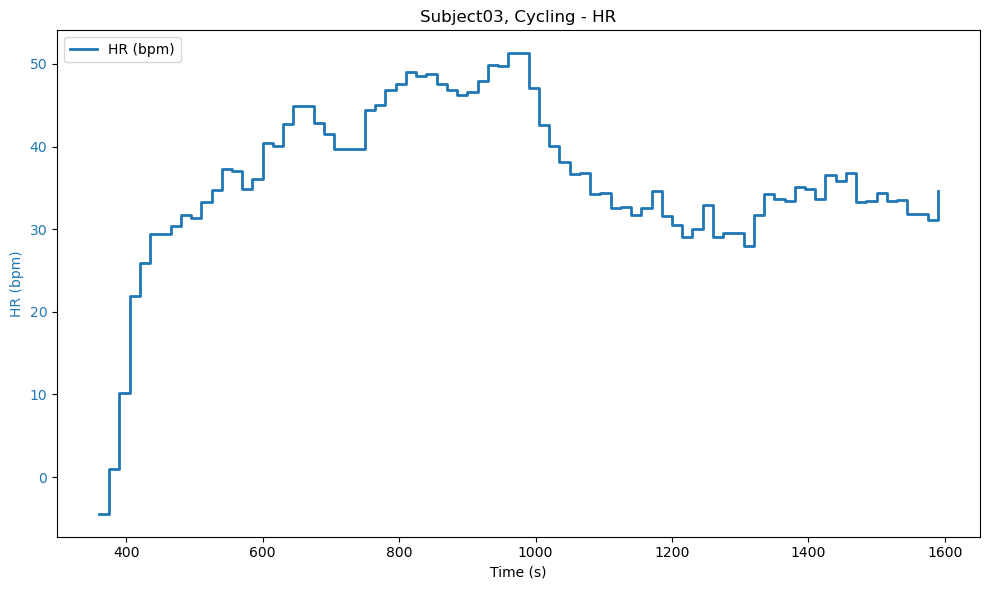

Subject03 Incline
-----------
Standing Average HR: 101.61016949152543
HR Points: 100 values
Final dataframe shape: (100, 5)
        HR  Index    Subject Activity  Time
0  -2.4435      0  Subject03  Incline   360
1   7.8898      1  Subject03  Incline   375
2  13.7232      2  Subject03  Incline   390
3   7.3898      3  Subject03  Incline   405
4   7.3898      4  Subject03  Incline   420


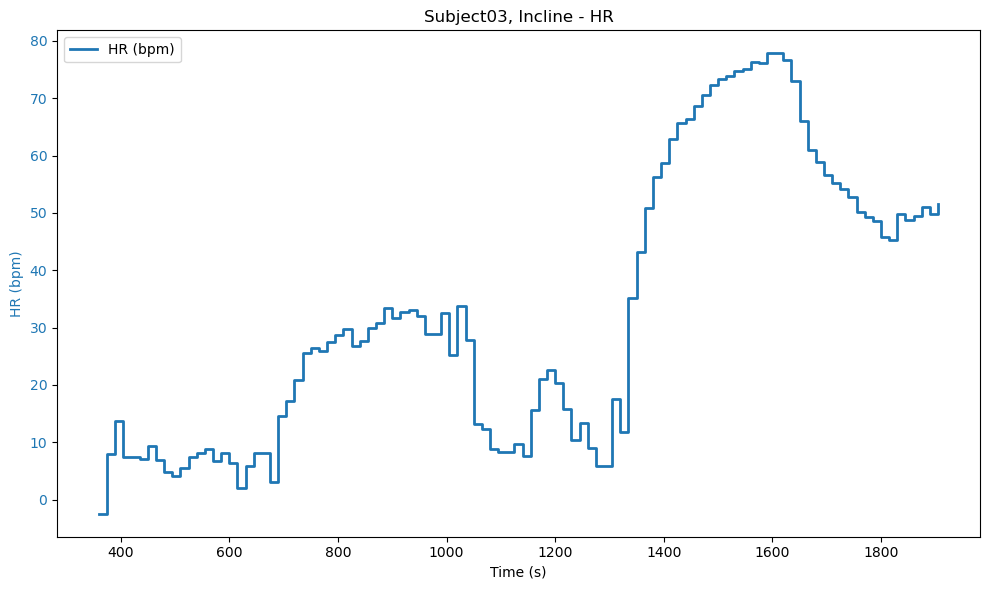

Subject03 Running
-----------
Standing Average HR: 103.22222222222223
HR Points: 80 values
Final dataframe shape: (80, 5)
       HR  Index    Subject Activity  Time
0 -3.2222      0  Subject03  Running   360
1 -1.4722      1  Subject03  Running   375
2  7.5778      2  Subject03  Running   390
3  5.1111      3  Subject03  Running   405
4  5.1778      4  Subject03  Running   420


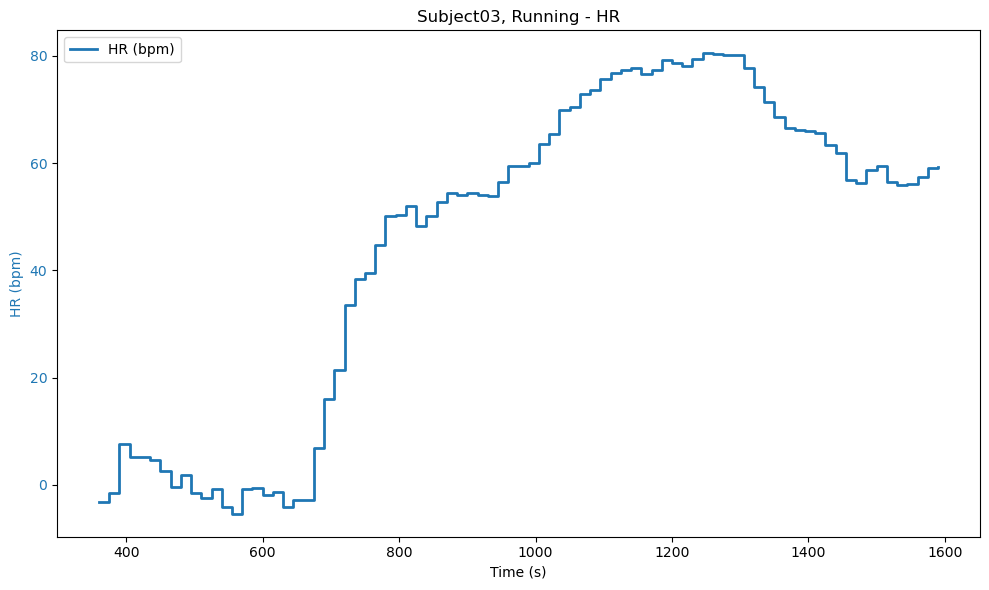

Subject03 Stairs
-----------
Standing Average HR: 114.63076923076923
HR Points: 60 values
Final dataframe shape: (60, 5)
       HR  Index    Subject Activity  Time
0 -2.4308      0  Subject03   Stairs   360
1  1.3692      1  Subject03   Stairs   375
2 -2.6308      2  Subject03   Stairs   390
3 -0.6308      3  Subject03   Stairs   405
4 -2.1308      4  Subject03   Stairs   420


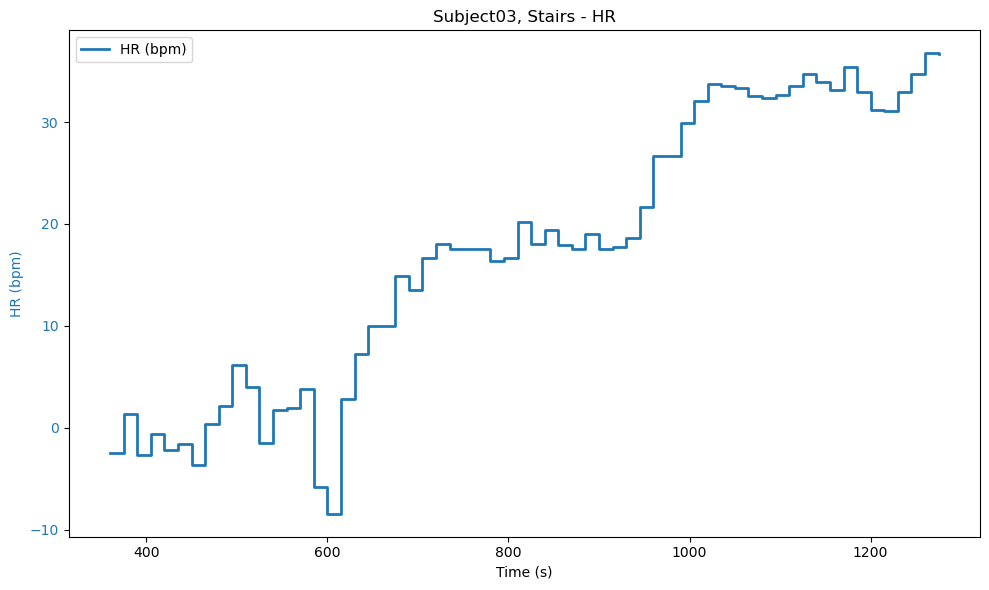

Subject03 Walking
-----------
Standing Average HR: 116.22033898305085
HR Points: 60 values
Final dataframe shape: (60, 5)
        HR  Index    Subject Activity  Time
0  -9.0203      0  Subject03  Walking   360
1 -10.3870      1  Subject03  Walking   375
2  -9.7203      2  Subject03  Walking   390
3 -12.2203      3  Subject03  Walking   405
4 -12.2203      4  Subject03  Walking   420


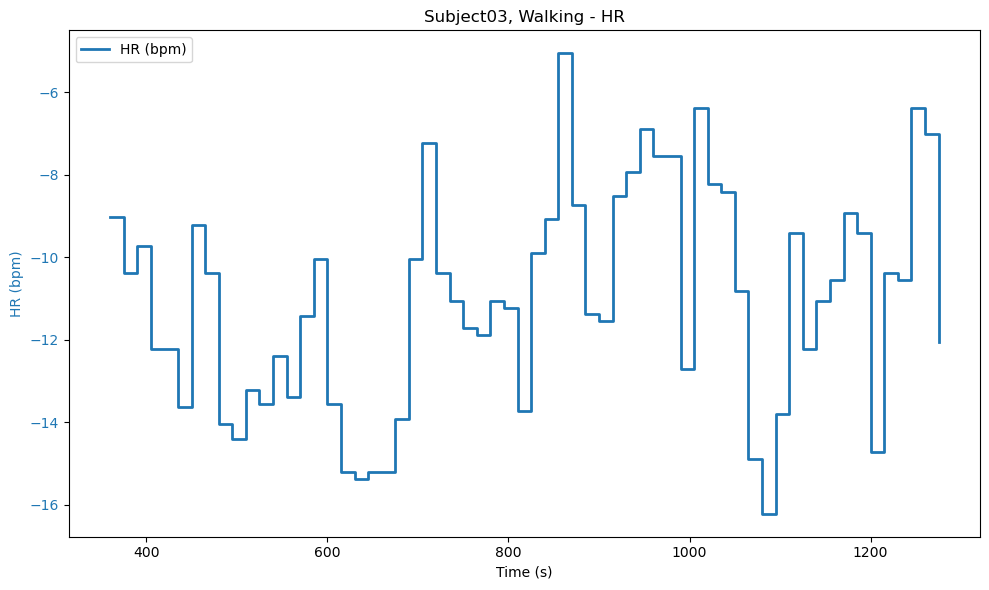

Subject04 Backwards
-----------
Standing Average HR: 90.09302325581395
HR Points: 40 values
Final dataframe shape: (40, 5)
       HR  Index    Subject   Activity  Time
0   0.907      0  Subject04  Backwards   360
1   2.107      1  Subject04  Backwards   375
2   8.707      2  Subject04  Backwards   390
3   7.507      3  Subject04  Backwards   405
4  12.907      4  Subject04  Backwards   420


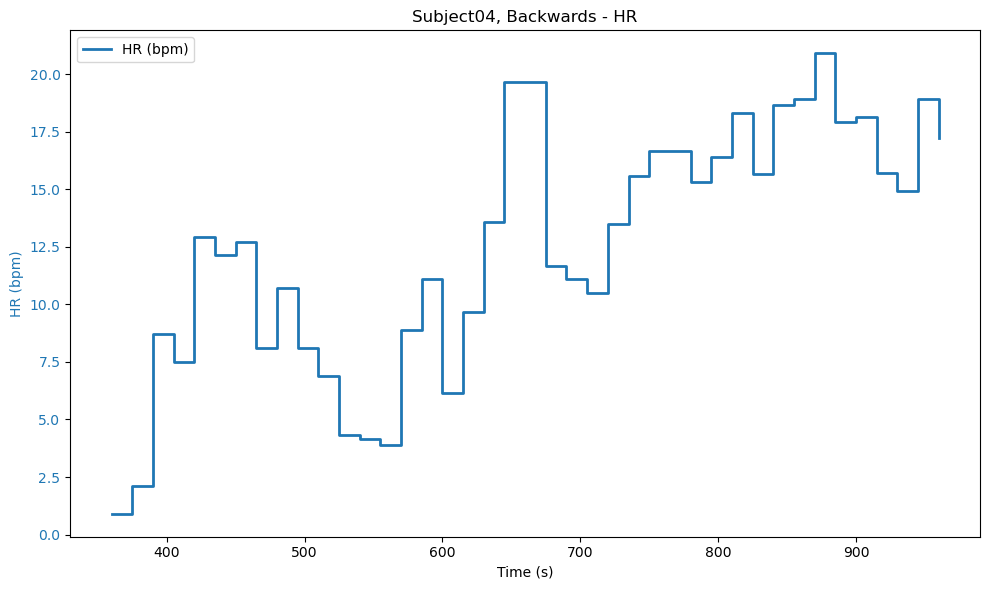

Subject04 Cycling
-----------
Standing Average HR: 104.12244897959184
HR Points: 80 values
Final dataframe shape: (80, 5)
        HR  Index    Subject Activity  Time
0  -7.6224      0  Subject04  Cycling   360
1   8.3776      1  Subject04  Cycling   375
2  14.6276      2  Subject04  Cycling   390
3  18.4776      3  Subject04  Cycling   405
4  20.1276      4  Subject04  Cycling   420


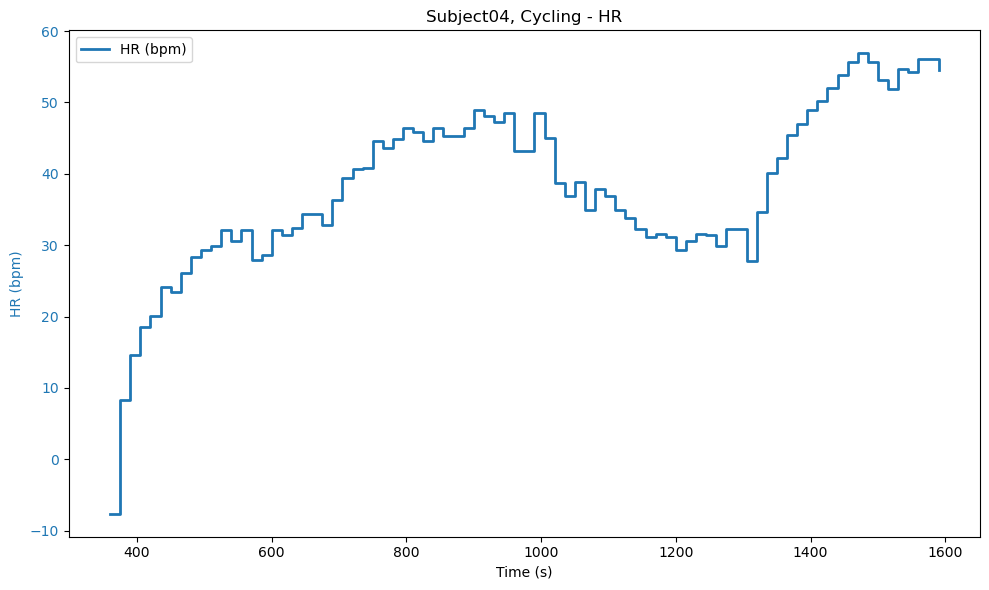

Subject04 Incline
-----------
Standing Average HR: 80.36363636363636
HR Points: 100 values
Final dataframe shape: (100, 5)
        HR  Index    Subject Activity  Time
0  -1.3636      0  Subject04  Incline   360
1   0.6364      1  Subject04  Incline   375
2   6.2364      2  Subject04  Incline   390
3   8.6364      3  Subject04  Incline   405
4  15.3864      4  Subject04  Incline   420


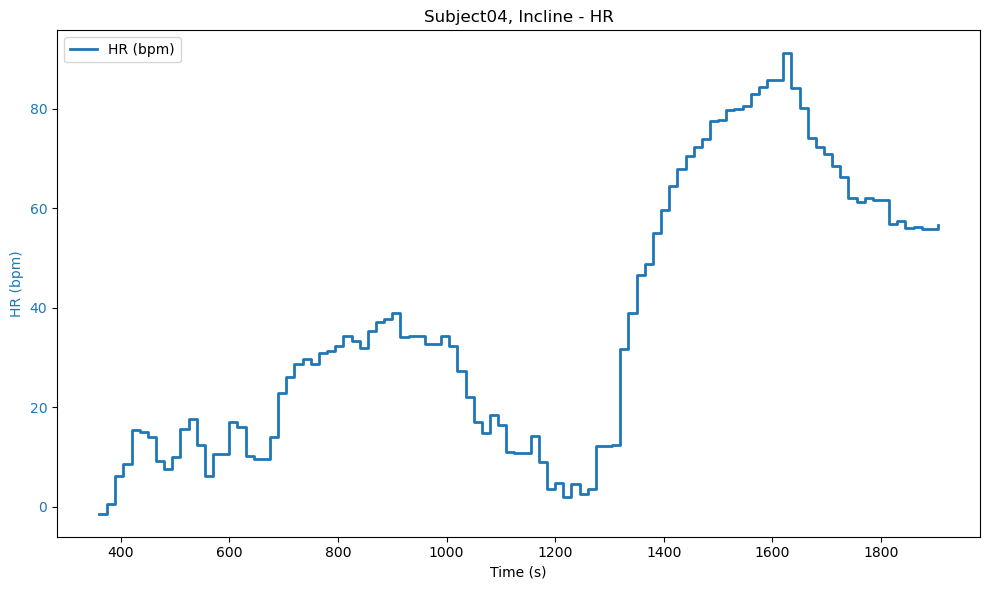

Subject04 Running
-----------
Standing Average HR: 92.02127659574468
HR Points: 80 values
Final dataframe shape: (80, 5)
       HR  Index    Subject Activity  Time
0 -1.7713      0  Subject04  Running   360
1  6.9787      1  Subject04  Running   375
2  8.7287      2  Subject04  Running   390
3  7.4787      3  Subject04  Running   405
4  9.7787      4  Subject04  Running   420


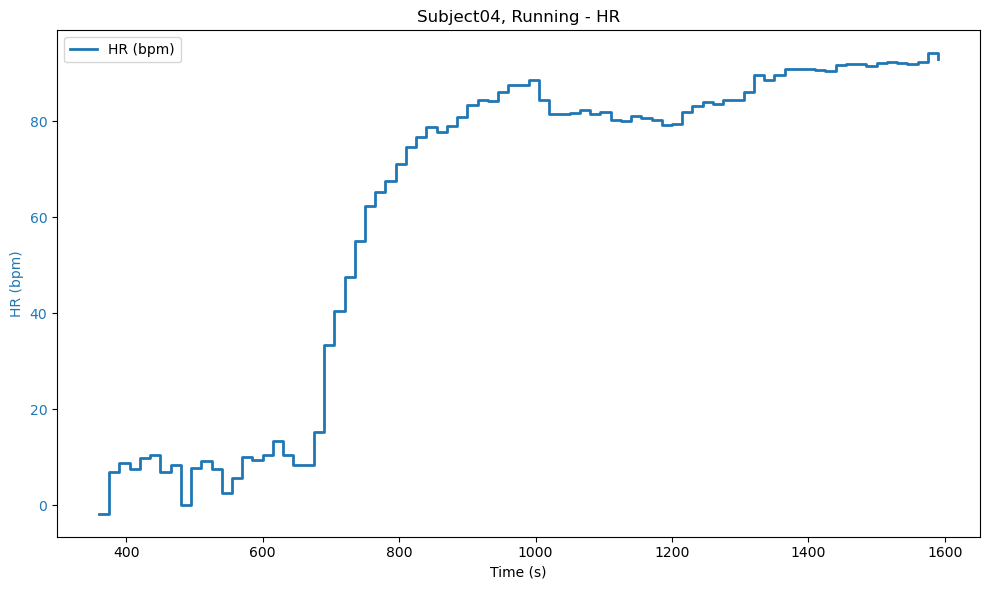

Subject04 Stairs
-----------
Standing Average HR: 120.11627906976744
HR Points: 60 values
Final dataframe shape: (60, 5)
        HR  Index    Subject Activity  Time
0  -4.6163      0  Subject04   Stairs   360
1   6.5504      1  Subject04   Stairs   375
2  12.0837      2  Subject04   Stairs   390
3  16.2171      3  Subject04   Stairs   405
4  20.3837      4  Subject04   Stairs   420


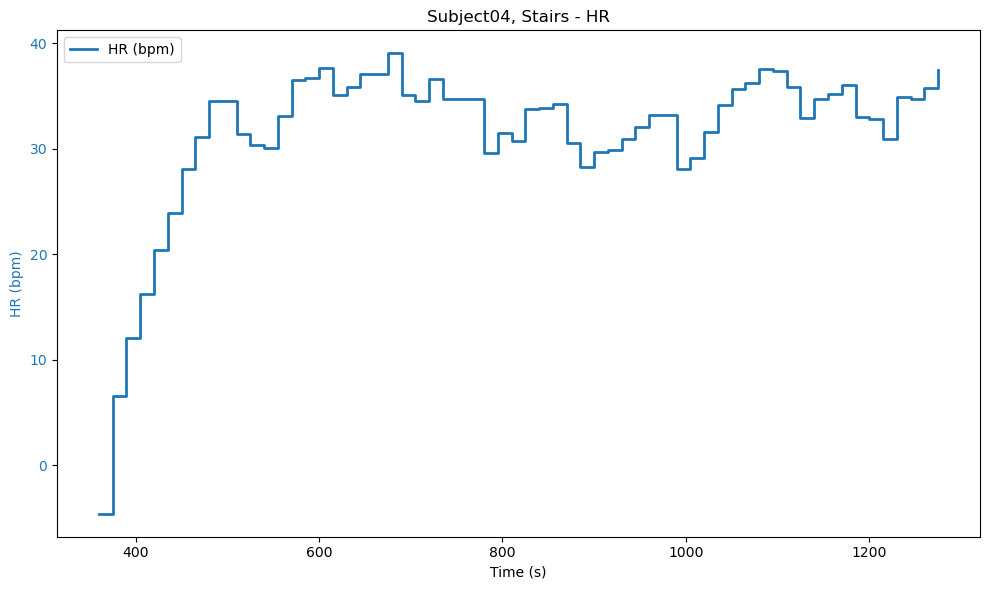

Subject04 Walking
-----------
Standing Average HR: 82.71428571428571
HR Points: 40 values
Final dataframe shape: (40, 5)
       HR  Index    Subject Activity  Time
0 -4.2143      0  Subject04  Walking   360
1  0.7857      1  Subject04  Walking   375
2 -1.7143      2  Subject04  Walking   390
3  5.6190      3  Subject04  Walking   405
4  0.7857      4  Subject04  Walking   420


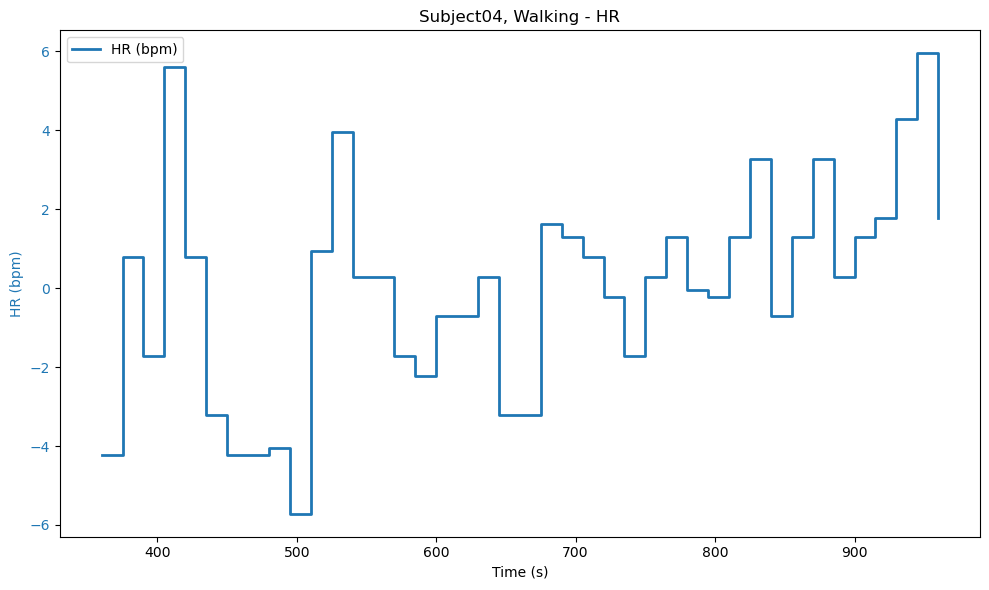

Subject05 Backwards
-----------
Standing Average HR: 107.45901639344262
HR Points: 60 values
Final dataframe shape: (60, 5)
        HR  Index    Subject   Activity  Time
0   9.5410      0  Subject05  Backwards   360
1  16.0410      1  Subject05  Backwards   375
2  17.0410      2  Subject05  Backwards   390
3  11.3981      3  Subject05  Backwards   405
4   6.3743      4  Subject05  Backwards   420


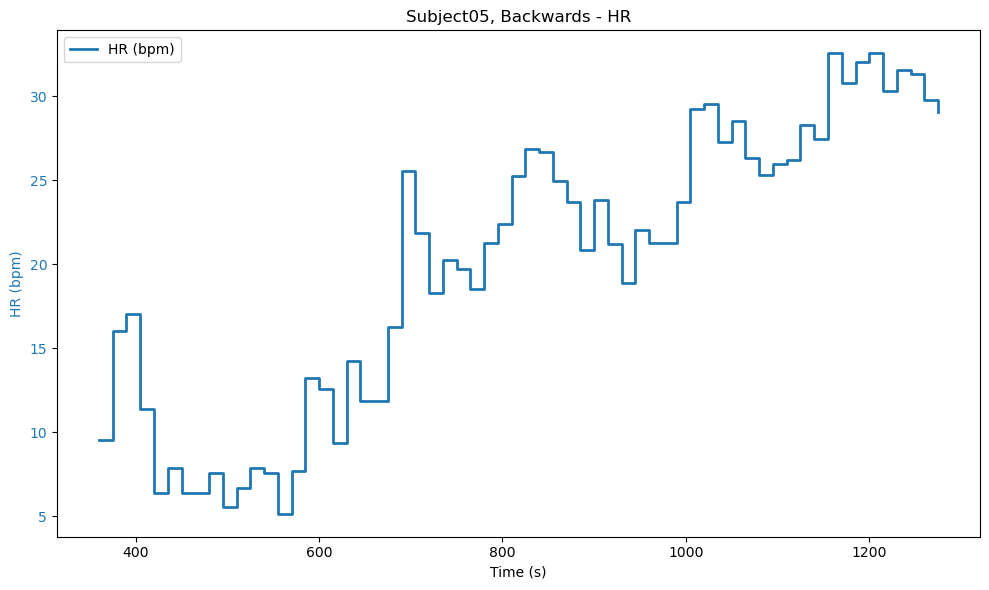

Subject05 Incline
-----------
Standing Average HR: 92.76190476190476
HR Points: 100 values
Final dataframe shape: (100, 5)
        HR  Index    Subject Activity  Time
0   7.2381      0  Subject05  Incline   360
1  22.2381      1  Subject05  Incline   375
2  22.5714      2  Subject05  Incline   390
3  21.7381      3  Subject05  Incline   405
4  21.9048      4  Subject05  Incline   420


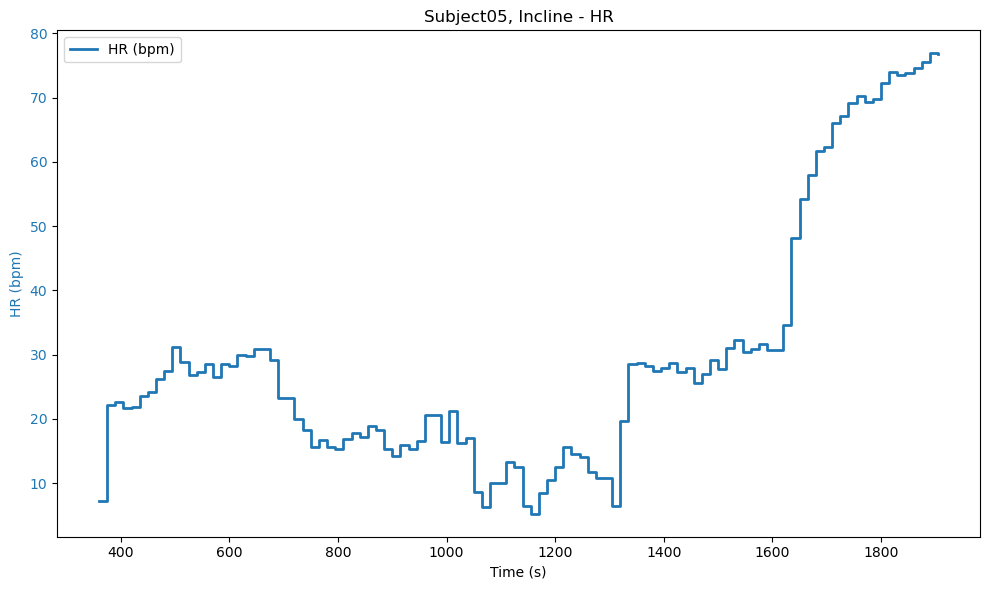

Subject05 Running
-----------
Standing Average HR: 92.41818181818182
HR Points: 80 values
Final dataframe shape: (80, 5)
        HR  Index    Subject Activity  Time
0  -2.2515      0  Subject05  Running   360
1   6.0818      1  Subject05  Running   375
2  12.7818      2  Subject05  Running   390
3  10.2485      3  Subject05  Running   405
4   7.5818      4  Subject05  Running   420


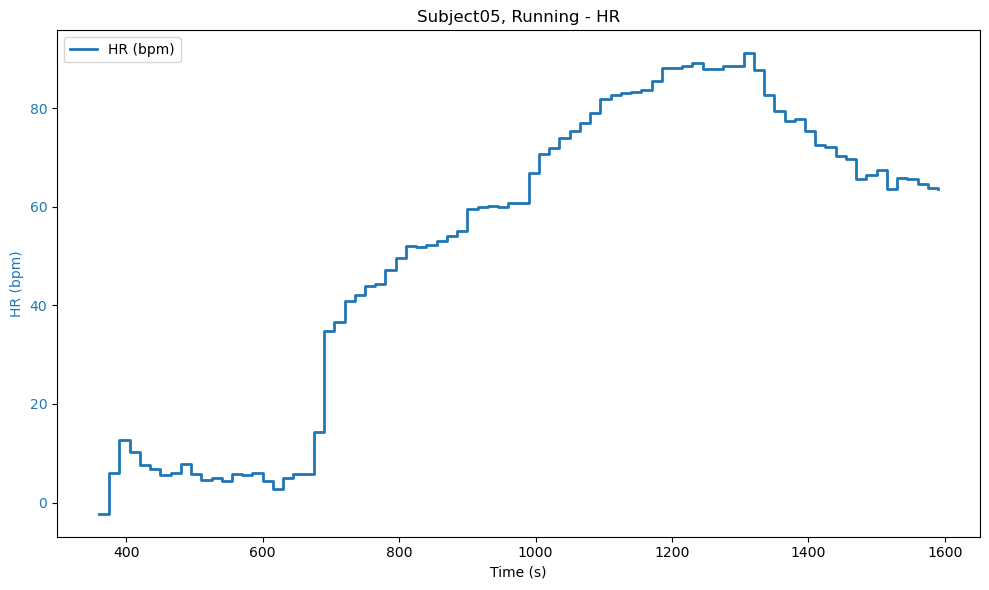

Subject05 Stairs
-----------
Standing Average HR: 119.03636363636363
HR Points: 60 values
Final dataframe shape: (60, 5)
        HR  Index    Subject Activity  Time
0   2.8208      0  Subject05   Stairs   360
1  13.7970      1  Subject05   Stairs   375
2  21.8208      2  Subject05   Stairs   390
3  25.5351      3  Subject05   Stairs   405
4  27.1303      4  Subject05   Stairs   420


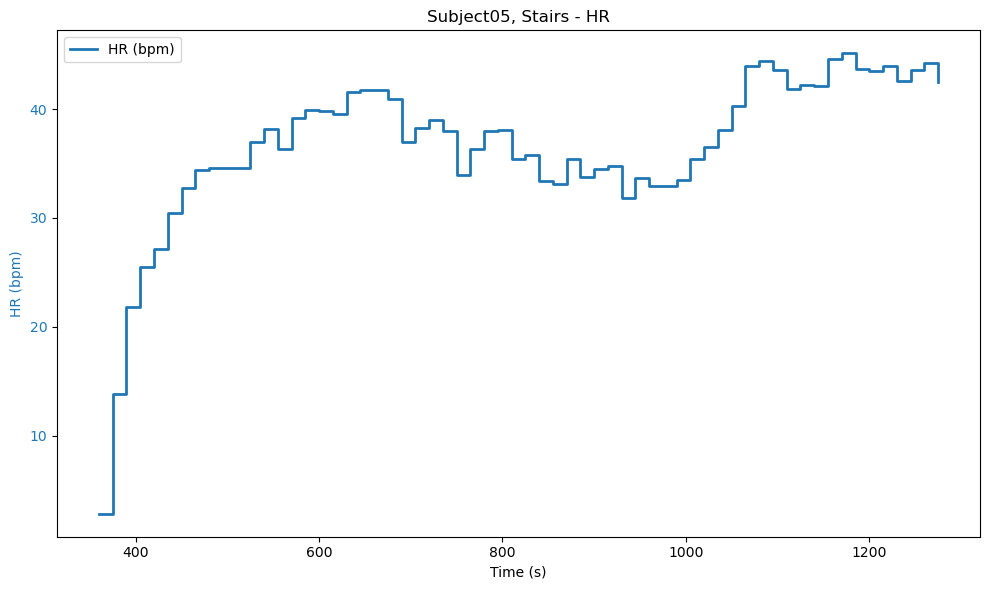

Subject05 Walking
-----------
Standing Average HR: 98.0
HR Points: 60 values
Final dataframe shape: (60, 5)
       HR  Index    Subject Activity  Time
0 -2.1667      0  Subject05  Walking   360
1  8.2000      1  Subject05  Walking   375
2  5.3333      2  Subject05  Walking   390
3  5.2000      3  Subject05  Walking   405
4  0.8000      4  Subject05  Walking   420


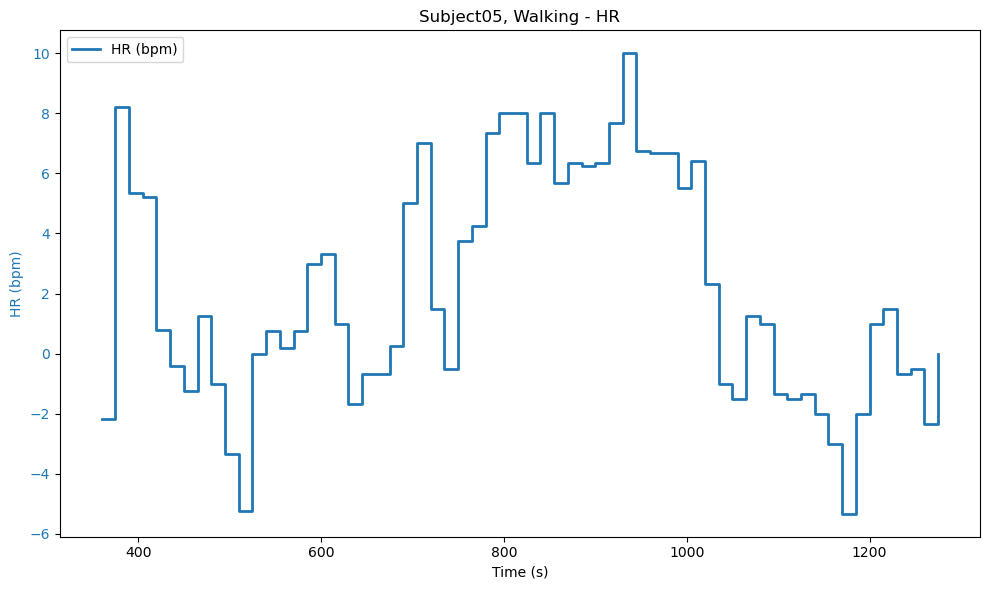

Subject06 Backwards
-----------
Standing Average HR: 93.18518518518519
HR Points: 40 values
Final dataframe shape: (40, 5)
        HR  Index    Subject   Activity  Time
0   3.6481      0  Subject06  Backwards   360
1   9.8148      1  Subject06  Backwards   375
2  10.8148      2  Subject06  Backwards   390
3  11.0648      3  Subject06  Backwards   405
4  13.8148      4  Subject06  Backwards   420


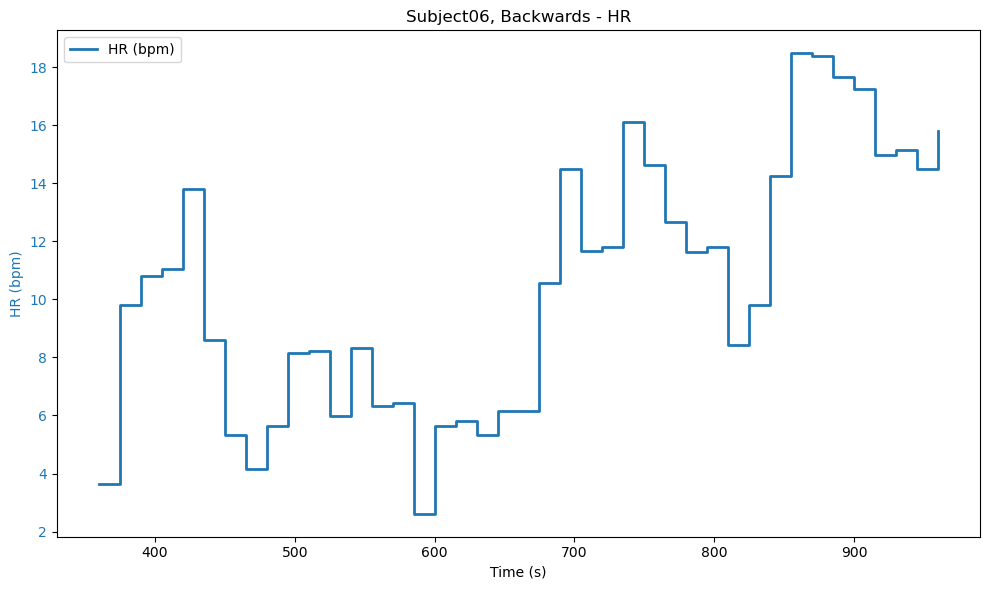

Subject06 Cycling
-----------
Standing Average HR: 91.26530612244898
HR Points: 80 values
Final dataframe shape: (80, 5)
        HR  Index    Subject Activity  Time
0   2.3347      0  Subject06  Cycling   360
1  12.9014      1  Subject06  Cycling   375
2  20.5680      2  Subject06  Cycling   390
3  21.5918      3  Subject06  Cycling   405
4  22.2347      4  Subject06  Cycling   420


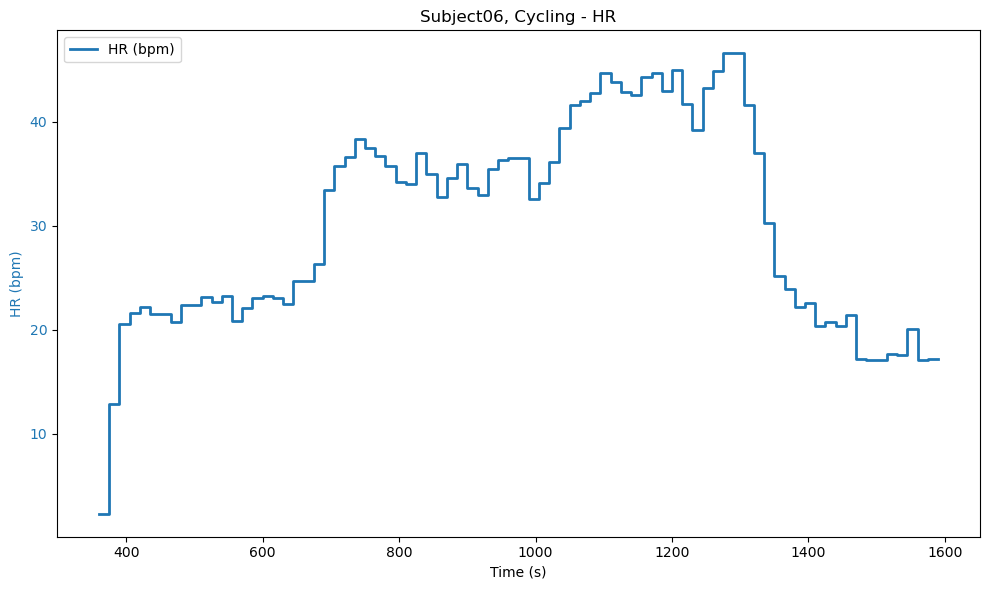

Subject06 Incline
-----------
Standing Average HR: 81.13461538461539
HR Points: 100 values
Final dataframe shape: (100, 5)
        HR  Index    Subject Activity  Time
0  -1.7346      0  Subject06  Incline   360
1   3.8654      1  Subject06  Incline   375
2  17.1987      2  Subject06  Incline   390
3  27.1987      3  Subject06  Incline   405
4  23.1987      4  Subject06  Incline   420


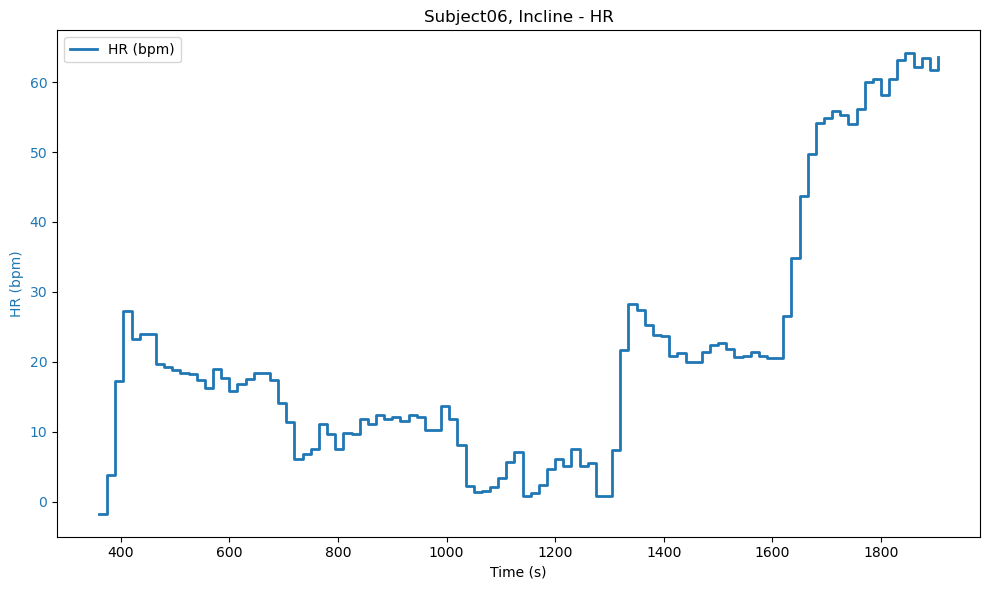

Subject06 Running
-----------
Standing Average HR: 86.1875
HR Points: 80 values
Final dataframe shape: (80, 5)
       HR  Index    Subject Activity  Time
0  2.8125      0  Subject06  Running   360
1  9.2125      1  Subject06  Running   375
2  8.6125      2  Subject06  Running   390
3  1.8125      3  Subject06  Running   405
4  0.6125      4  Subject06  Running   420


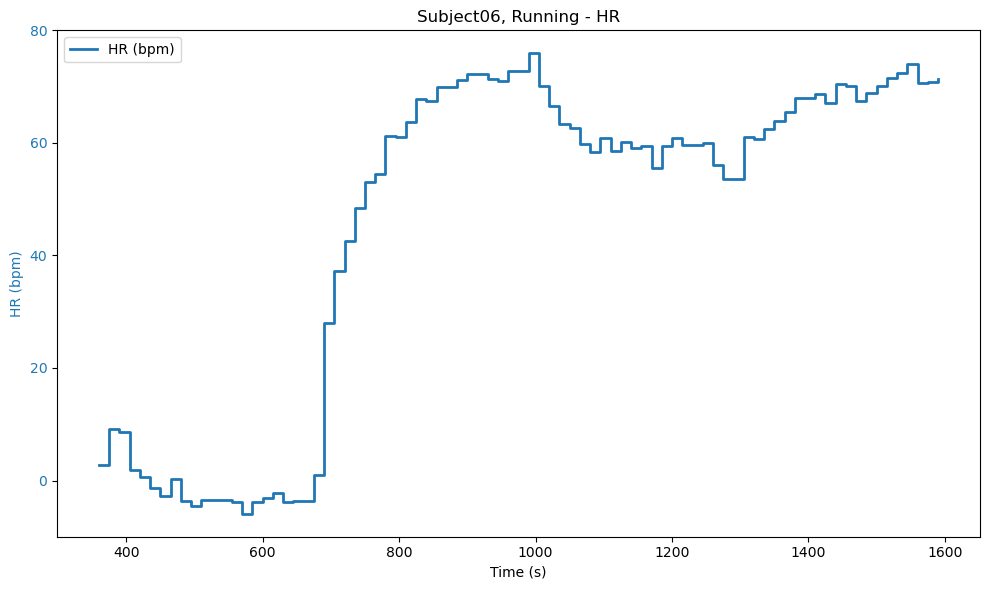

Subject06 Stairs
-----------
Standing Average HR: 109.03389830508475
HR Points: 60 values
Final dataframe shape: (60, 5)
        HR  Index    Subject Activity  Time
0   2.7994      0  Subject06   Stairs   360
1  -0.2006      1  Subject06   Stairs   375
2  13.7994      2  Subject06   Stairs   390
3  20.8232      3  Subject06   Stairs   405
4  24.2518      4  Subject06   Stairs   420


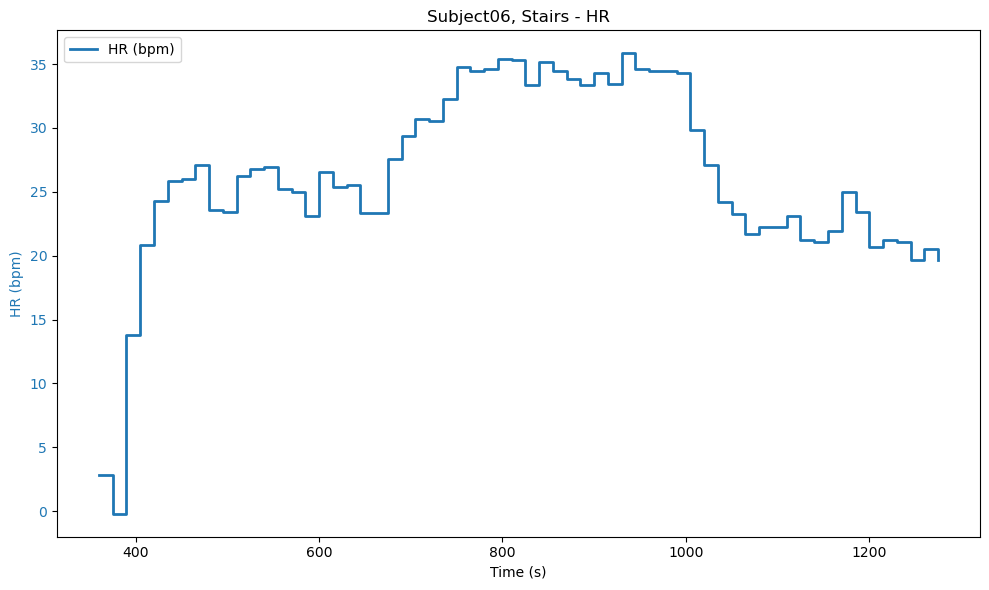

Subject06 Walking
-----------
Standing Average HR: 87.74509803921569
HR Points: 60 values
Final dataframe shape: (60, 5)
       HR  Index    Subject Activity  Time
0  2.7549      0  Subject06  Walking   360
1  2.0549      1  Subject06  Walking   375
2  2.4549      2  Subject06  Walking   390
3 -1.2451      3  Subject06  Walking   405
4 -2.3451      4  Subject06  Walking   420


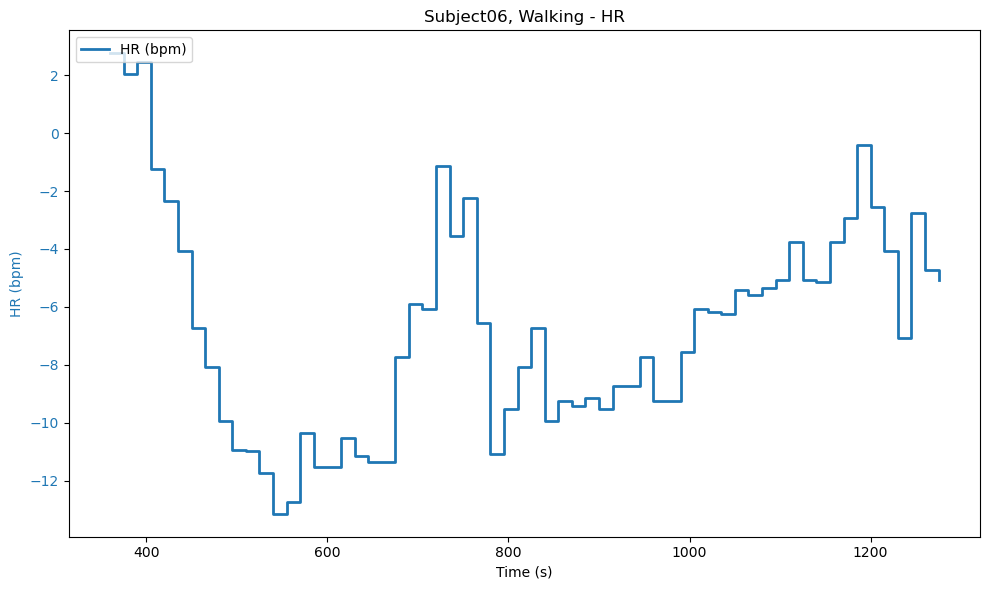

Subject07 Backwards
-----------
Standing Average HR: 73.32692307692308
HR Points: 40 values
Final dataframe shape: (40, 5)
        HR  Index    Subject   Activity  Time
0   8.3397      0  Subject07  Backwards   360
1  20.2731      1  Subject07  Backwards   375
2  22.8397      2  Subject07  Backwards   390
3  19.4731      3  Subject07  Backwards   405
4  15.8731      4  Subject07  Backwards   420


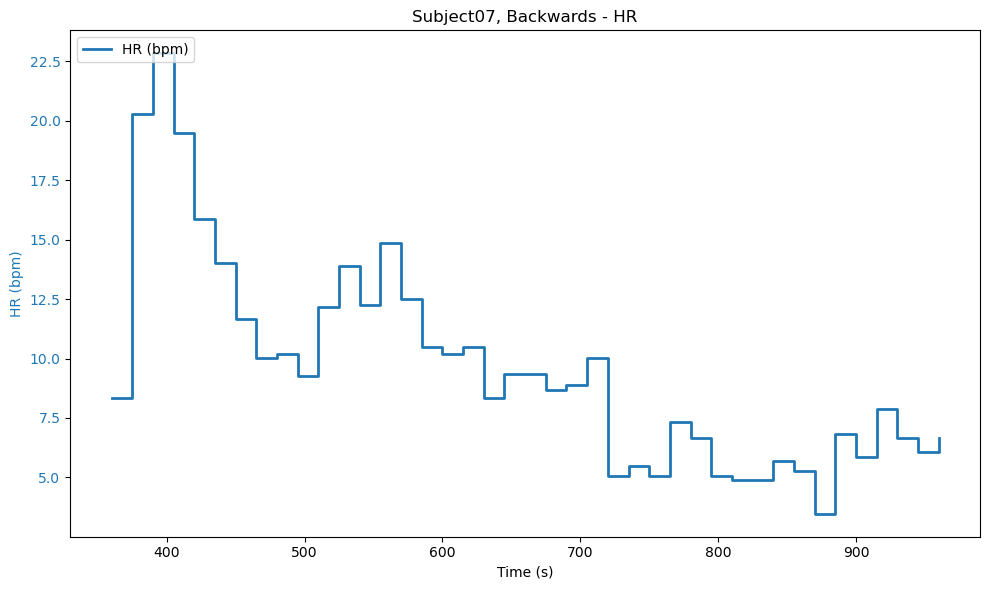

Subject07 Cycling
-----------
Standing Average HR: 70.9090909090909
HR Points: 80 values
Final dataframe shape: (80, 5)
        HR  Index    Subject Activity  Time
0   8.4909      0  Subject07  Cycling   360
1  15.3409      1  Subject07  Cycling   375
2  16.0909      2  Subject07  Cycling   390
3  17.0909      3  Subject07  Cycling   405
4  16.0909      4  Subject07  Cycling   420


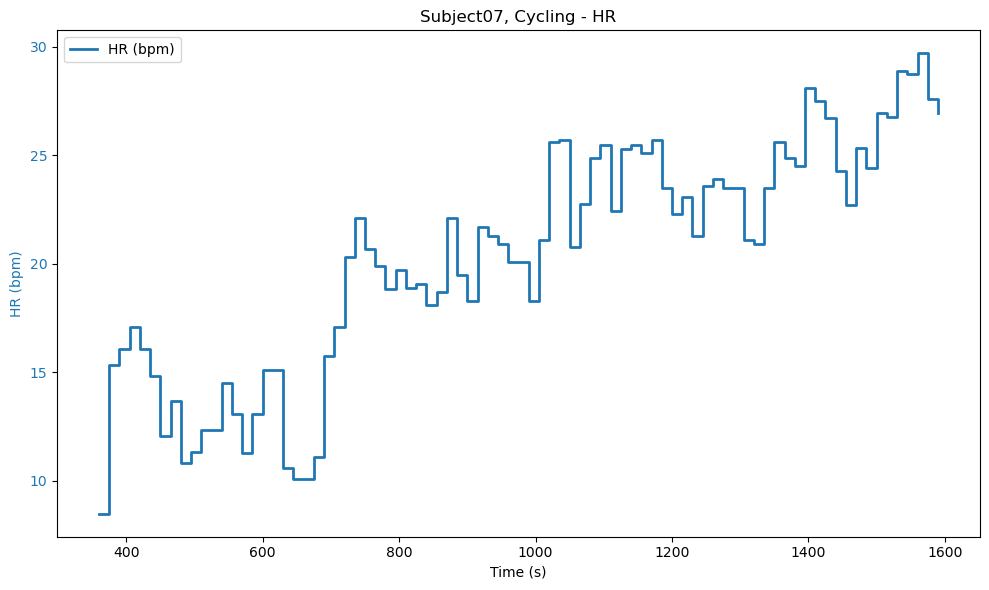

Subject07 Incline
-----------
Standing Average HR: 74.6
HR Points: 100 values
Final dataframe shape: (100, 5)
     HR  Index    Subject Activity  Time
0   2.9      0  Subject07  Incline   360
1  16.6      1  Subject07  Incline   375
2  26.0      2  Subject07  Incline   390
3  29.9      3  Subject07  Incline   405
4  32.9      4  Subject07  Incline   420


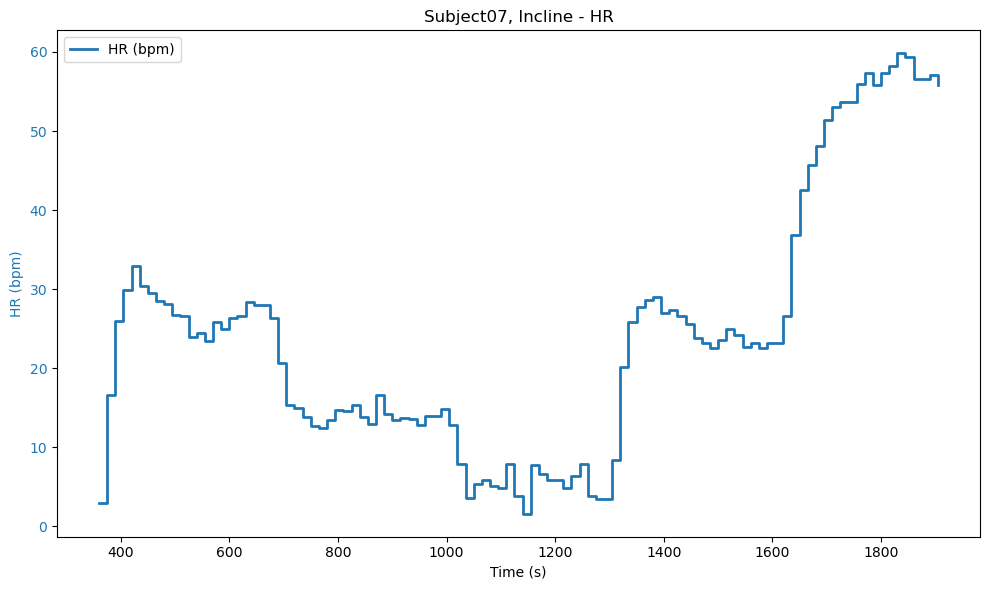

Subject07 Running
-----------
Standing Average HR: 66.2127659574468
HR Points: 80 values
Final dataframe shape: (80, 5)
        HR  Index    Subject Activity  Time
0   4.7872      0  Subject07  Running   360
1  19.5872      1  Subject07  Running   375
2  23.4539      2  Subject07  Running   390
3  20.2872      3  Subject07  Running   405
4  17.7872      4  Subject07  Running   420


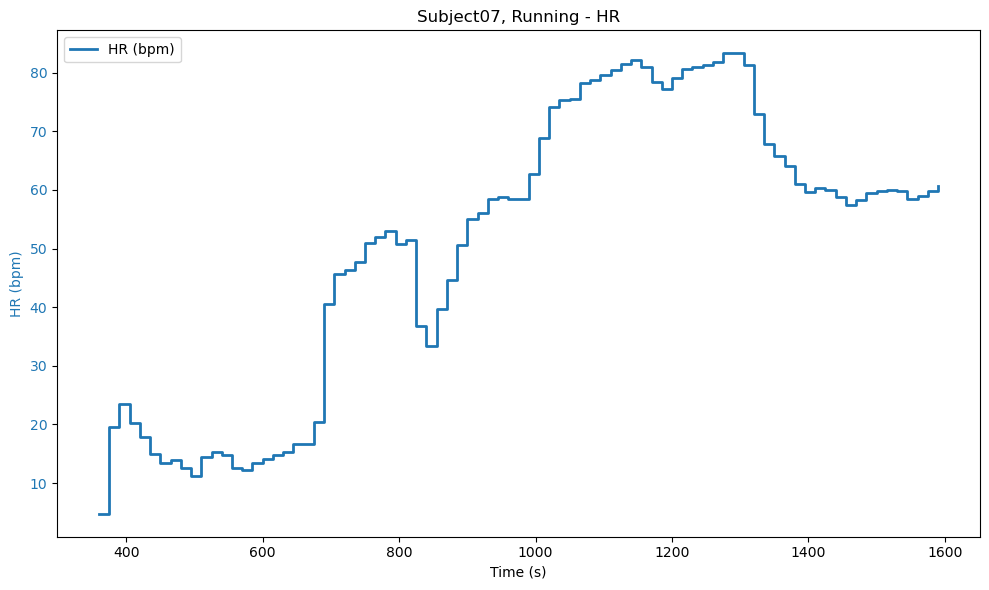

Subject07 Stairs
-----------
Standing Average HR: 74.02083333333333
HR Points: 60 values
Final dataframe shape: (60, 5)
        HR  Index    Subject Activity  Time
0   9.8125      0  Subject07   Stairs   360
1   9.6458      1  Subject07   Stairs   375
2  19.9792      2  Subject07   Stairs   390
3  21.3792      3  Subject07   Stairs   405
4  22.9792      4  Subject07   Stairs   420


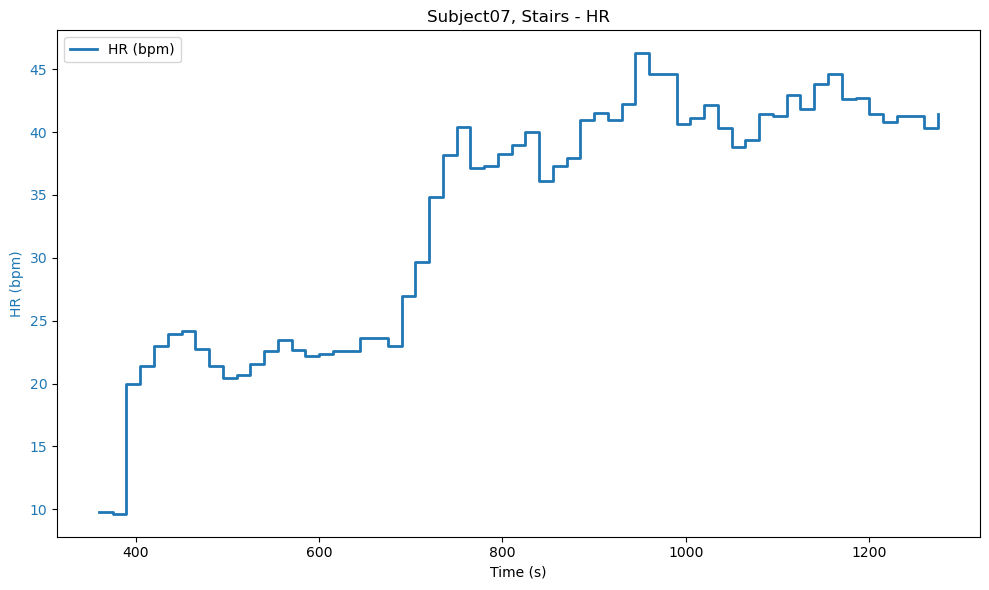

Subject07 Walking
-----------
Standing Average HR: 80.0
HR Points: 60 values
Final dataframe shape: (60, 5)
      HR  Index    Subject Activity  Time
0   0.00      0  Subject07  Walking   360
1   8.75      1  Subject07  Walking   375
2  13.80      2  Subject07  Walking   390
3  12.20      3  Subject07  Walking   405
4  12.00      4  Subject07  Walking   420


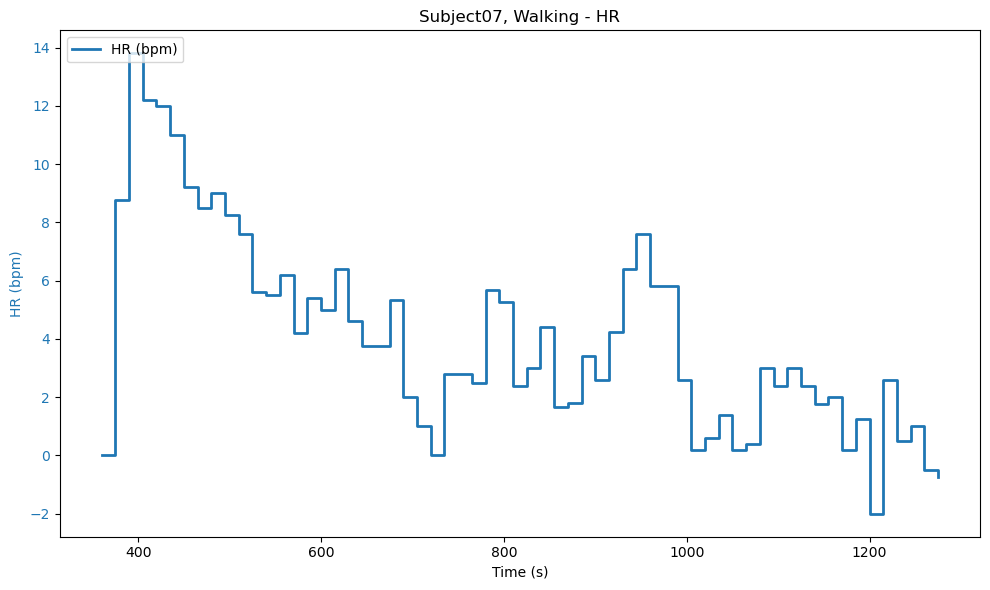

Subject08 Backwards
-----------
Standing Average HR: 90.84444444444445
HR Points: 40 values
Final dataframe shape: (40, 5)
        HR  Index    Subject   Activity  Time
0   8.7270      0  Subject08  Backwards   360
1  17.7556      1  Subject08  Backwards   375
2  17.7556      2  Subject08  Backwards   390
3  15.3556      3  Subject08  Backwards   405
4  12.5556      4  Subject08  Backwards   420


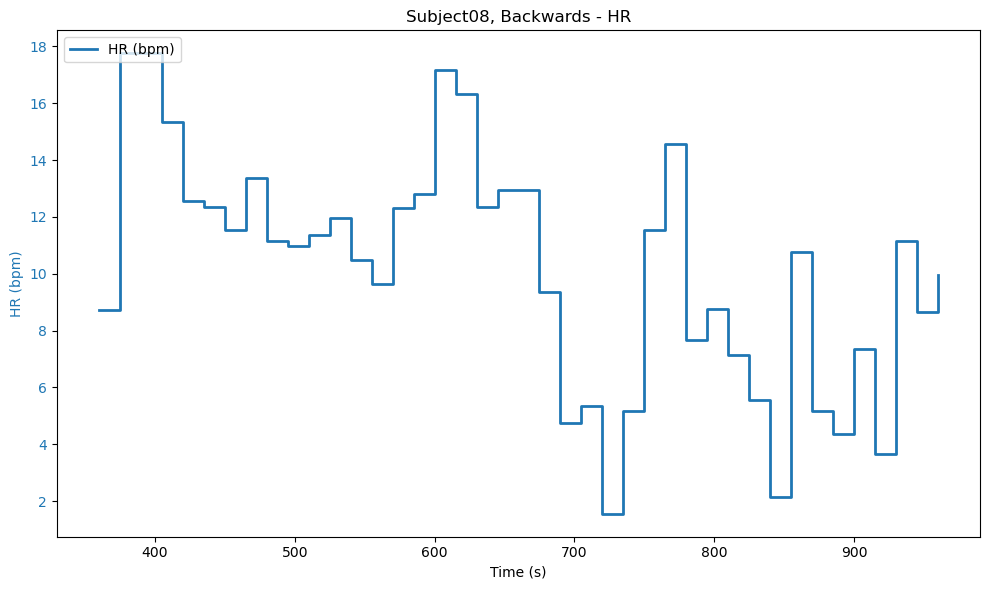

Subject08 Cycling
-----------
Standing Average HR: 101.30909090909091
HR Points: 80 values
Final dataframe shape: (80, 5)
        HR  Index    Subject Activity  Time
0   6.6909      0  Subject08  Cycling   360
1  19.2909      1  Subject08  Cycling   375
2  21.3576      2  Subject08  Cycling   390
3  19.6909      3  Subject08  Cycling   405
4  23.0242      4  Subject08  Cycling   420


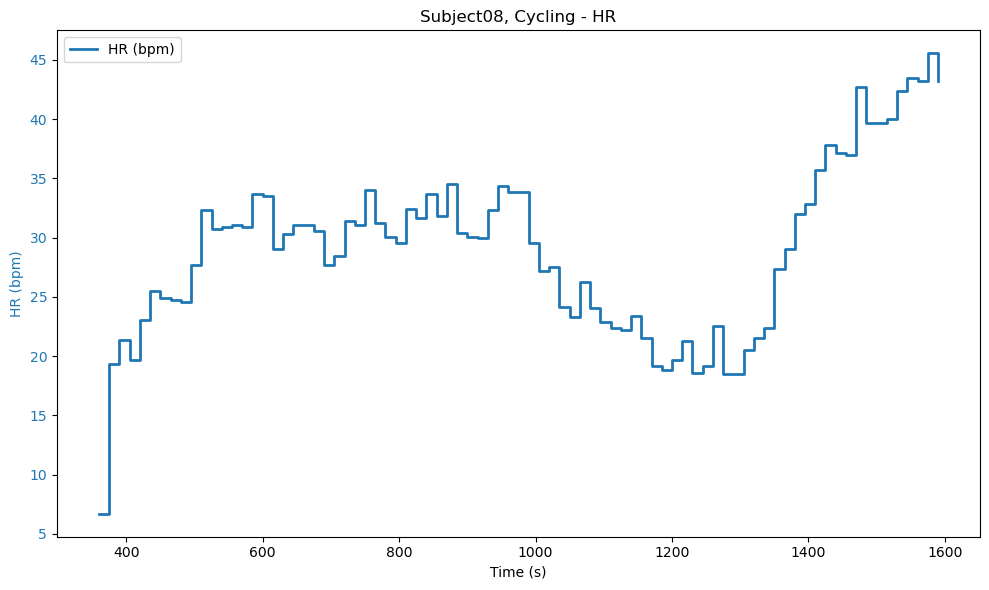

Subject08 Incline
-----------
Standing Average HR: 75.08695652173913
HR Points: 100 values
Final dataframe shape: (100, 5)
        HR  Index    Subject Activity  Time
0  12.5130      0  Subject08  Incline   360
1  27.5130      1  Subject08  Incline   375
2  30.5797      2  Subject08  Incline   390
3  29.9130      3  Subject08  Incline   405
4  28.7130      4  Subject08  Incline   420


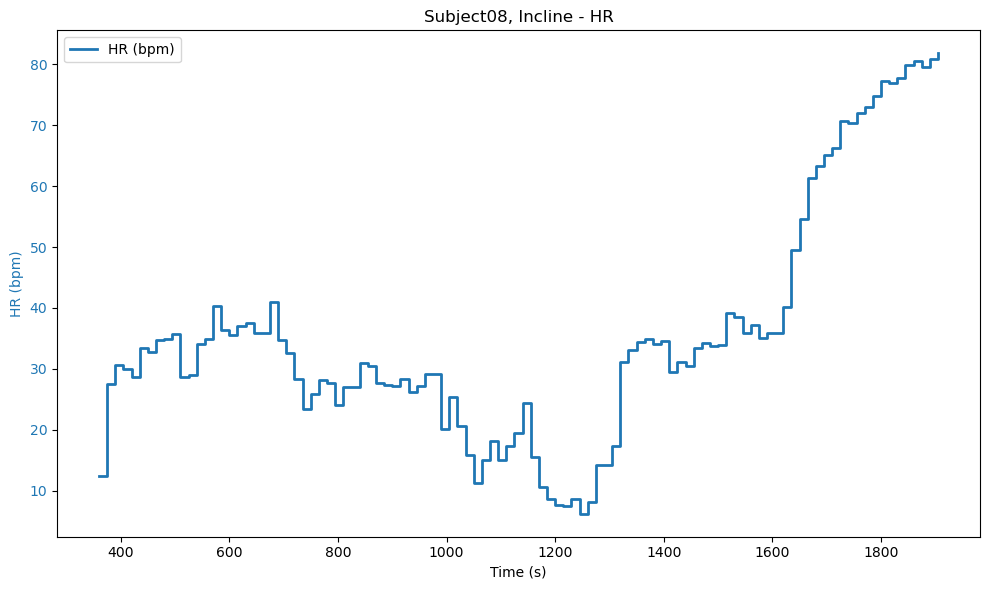

Subject08 Running
-----------
Standing Average HR: 86.12820512820512
HR Points: 80 values
Final dataframe shape: (80, 5)
        HR  Index    Subject Activity  Time
0   5.1218      0  Subject08  Running   360
1  24.0718      1  Subject08  Running   375
2  23.6718      2  Subject08  Running   390
3  17.4718      3  Subject08  Running   405
4   9.0385      4  Subject08  Running   420


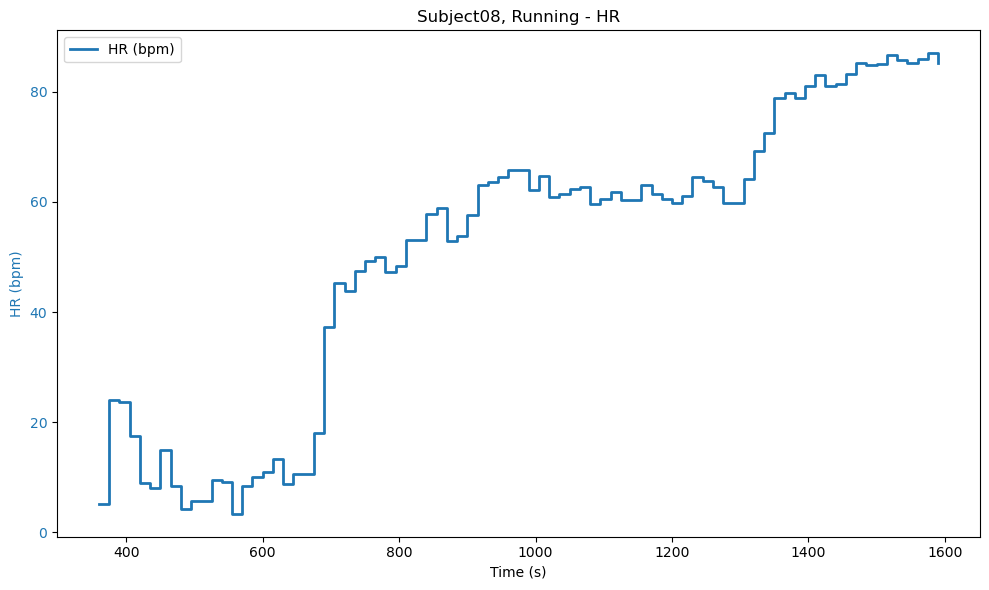

Subject08 Stairs
-----------
Standing Average HR: 106.64814814814815
HR Points: 60 values
Final dataframe shape: (60, 5)
        HR  Index    Subject Activity  Time
0   4.0185      0  Subject08   Stairs   360
1   5.1019      1  Subject08   Stairs   375
2  14.0661      2  Subject08   Stairs   390
3  16.1519      3  Subject08   Stairs   405
4  26.0185      4  Subject08   Stairs   420


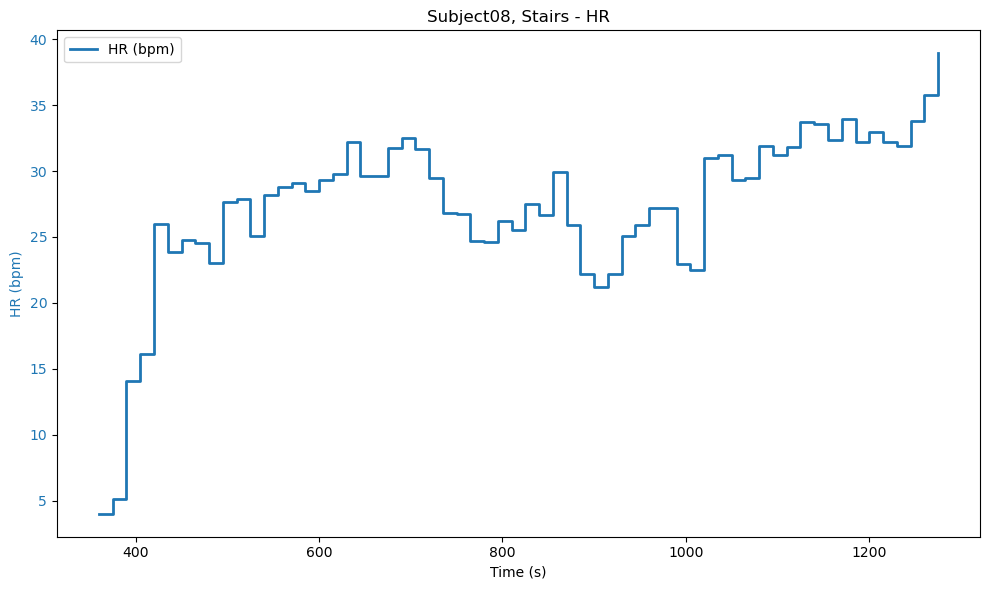

Subject08 Walking
-----------
Standing Average HR: 81.0
HR Points: 60 values
Final dataframe shape: (60, 5)
     HR  Index    Subject Activity  Time
0   4.2      0  Subject08  Walking   360
1  15.2      1  Subject08  Walking   375
2   5.6      2  Subject08  Walking   390
3   1.4      3  Subject08  Walking   405
4  -0.2      4  Subject08  Walking   420


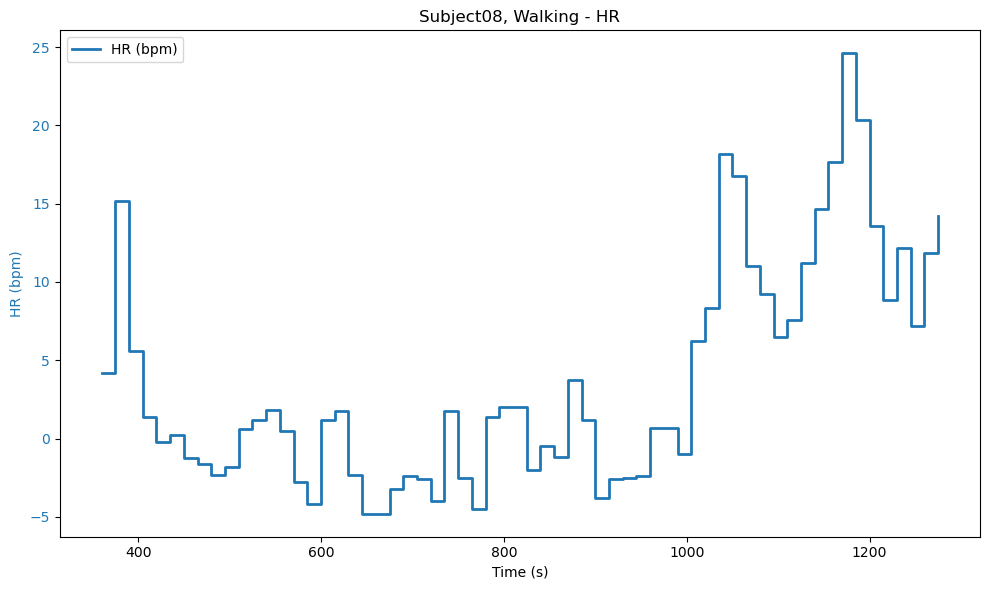

Subject09 Backwards
-----------
Standing Average HR: 73.52
HR Points: 40 values
Final dataframe shape: (40, 5)
       HR  Index    Subject   Activity  Time
0  1.2800      0  Subject09  Backwards   360
1  9.7300      1  Subject09  Backwards   375
2  8.8133      2  Subject09  Backwards   390
3  7.0800      3  Subject09  Backwards   405
4  5.1467      4  Subject09  Backwards   420


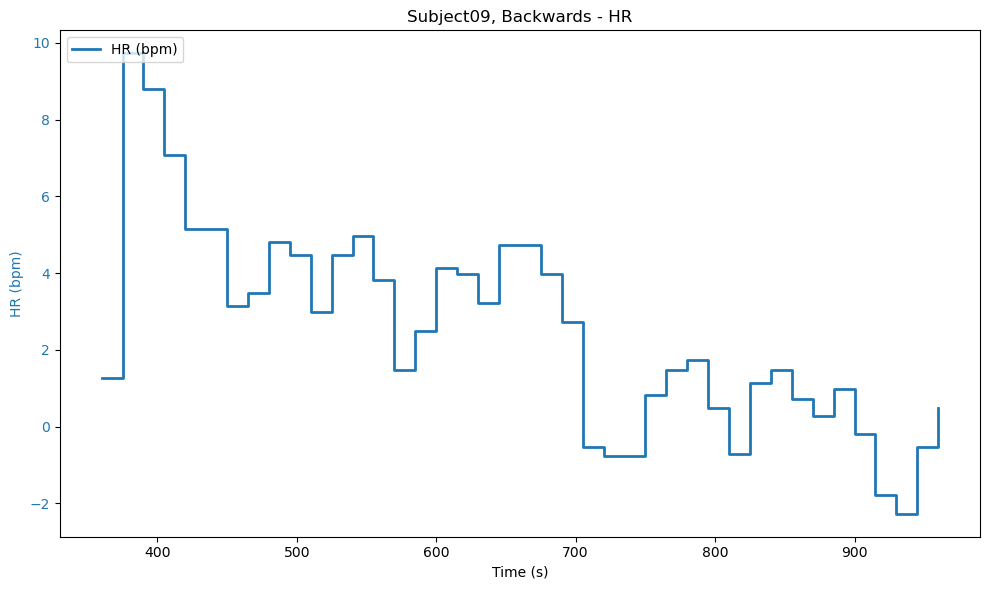

Subject09 Cycling
-----------
Standing Average HR: 73.16666666666667
HR Points: 80 values
Final dataframe shape: (80, 5)
        HR  Index    Subject Activity  Time
0   1.2083      0  Subject09  Cycling   360
1  10.5000      1  Subject09  Cycling   375
2  13.6333      2  Subject09  Cycling   390
3  11.5833      3  Subject09  Cycling   405
4   9.4333      4  Subject09  Cycling   420


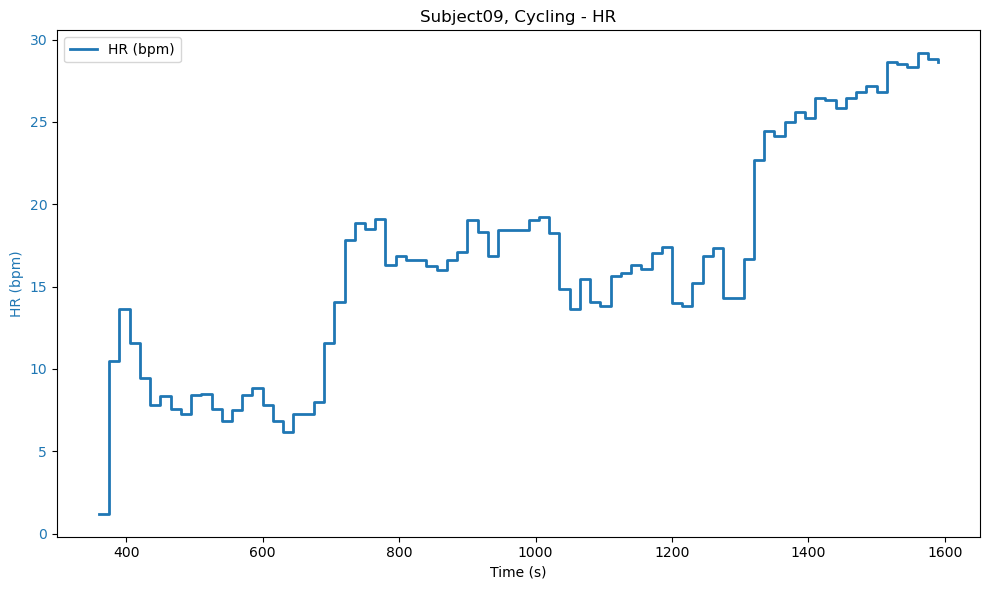

Subject09 Incline
-----------
Standing Average HR: 67.96
HR Points: 100 values
Final dataframe shape: (100, 5)
       HR  Index    Subject Activity  Time
0 -2.9600      0  Subject09  Incline   360
1  0.2400      1  Subject09  Incline   375
2  6.3733      2  Subject09  Incline   390
3  9.0400      3  Subject09  Incline   405
4  5.3733      4  Subject09  Incline   420


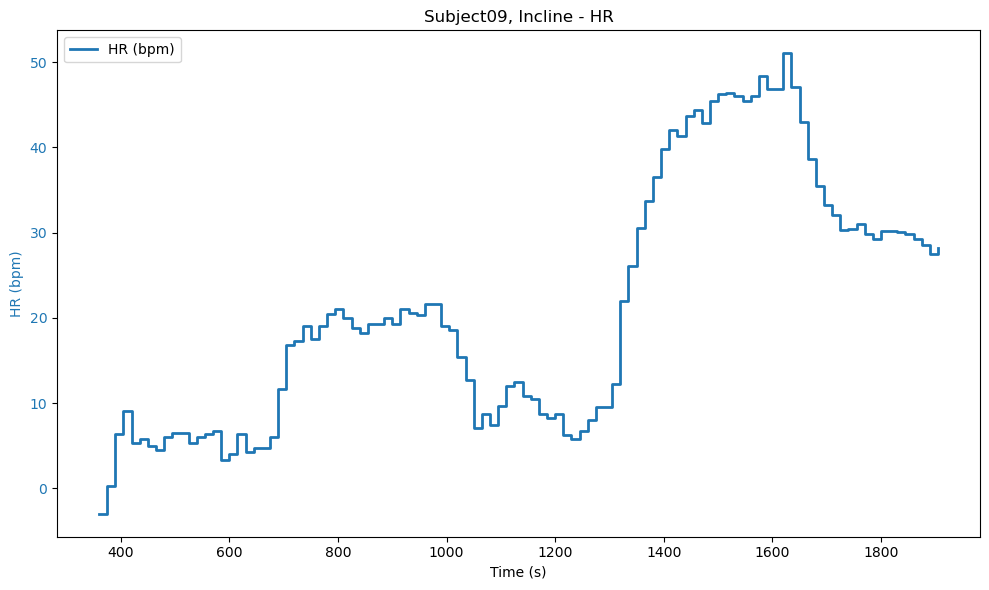

Subject09 Running
-----------
Standing Average HR: 66.45945945945945
HR Points: 80 values
Final dataframe shape: (80, 5)
        HR  Index    Subject Activity  Time
0   5.2548      0  Subject09  Running   360
1  15.3739      1  Subject09  Running   375
2  14.7905      2  Subject09  Running   390
3  11.7405      3  Subject09  Running   405
4   9.5405      4  Subject09  Running   420


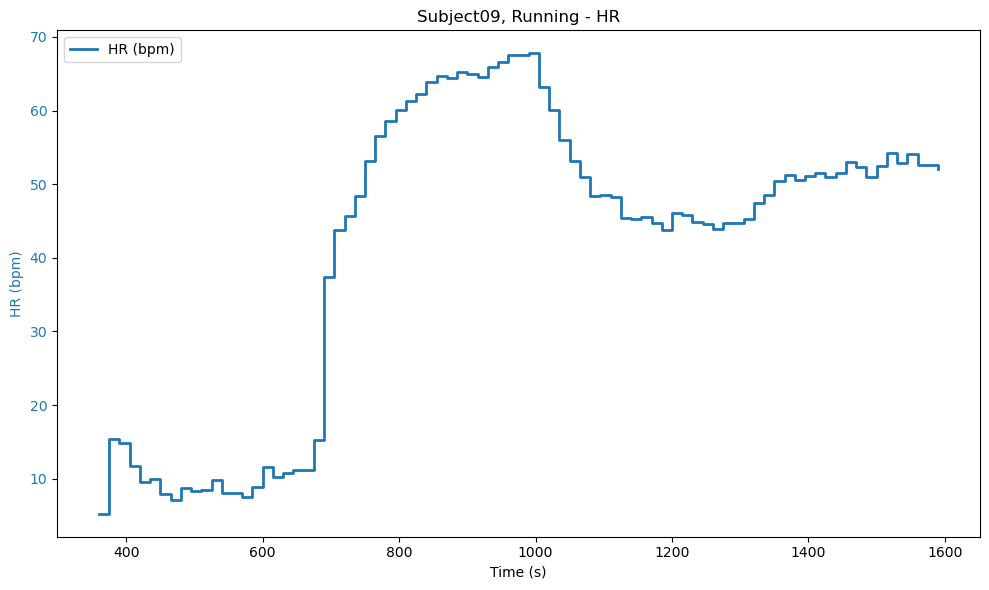

Subject09 Stairs
-----------
Standing Average HR: 76.85416666666667
HR Points: 60 values
Final dataframe shape: (60, 5)
        HR  Index    Subject Activity  Time
0   6.7173      0  Subject09   Stairs   360
1   6.6458      1  Subject09   Stairs   375
2   9.3125      2  Subject09   Stairs   390
3  12.5458      3  Subject09   Stairs   405
4  15.5458      4  Subject09   Stairs   420


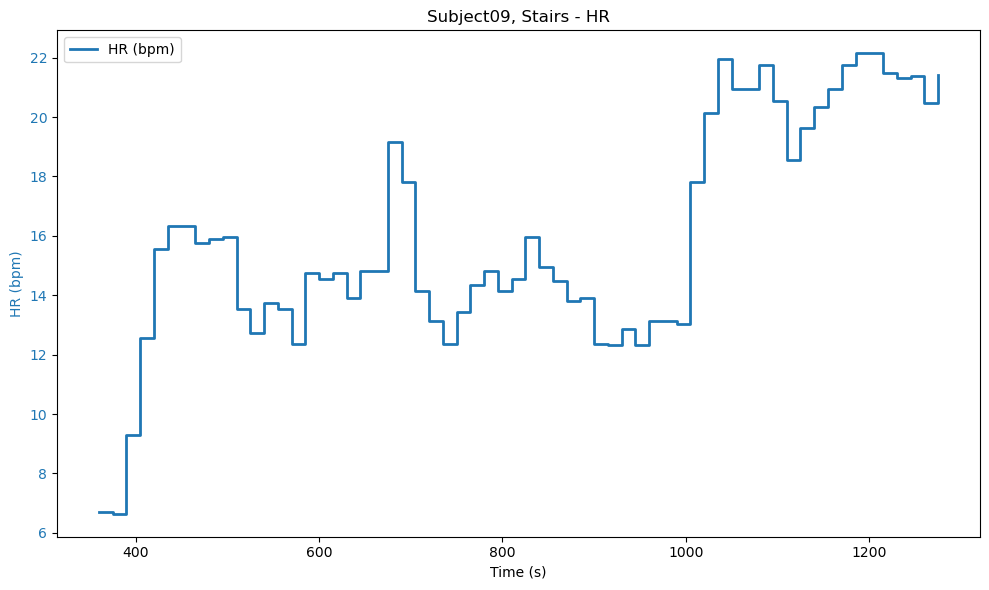

Subject09 Walking
-----------
Standing Average HR: 72.4090909090909
HR Points: 60 values
Final dataframe shape: (60, 5)
       HR  Index    Subject Activity  Time
0  0.7909      0  Subject09  Walking   360
1  8.0909      1  Subject09  Walking   375
2  6.9242      2  Subject09  Walking   390
3  6.1909      3  Subject09  Walking   405
4  6.0909      4  Subject09  Walking   420


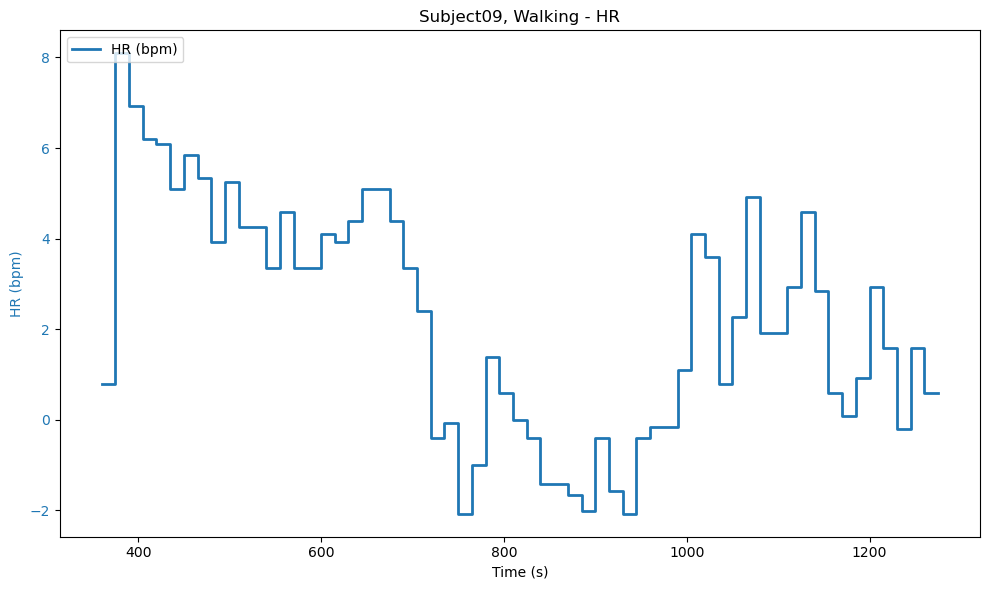

Subject10 Backwards
-----------
Standing Average HR: 92.0909090909091
HR Points: 40 values
Final dataframe shape: (40, 5)
       HR  Index    Subject   Activity  Time
0  1.3377      0  Subject10  Backwards   360
1  6.4805      1  Subject10  Backwards   375
2  9.3377      2  Subject10  Backwards   390
3  6.4805      3  Subject10  Backwards   405
4  5.3377      4  Subject10  Backwards   420


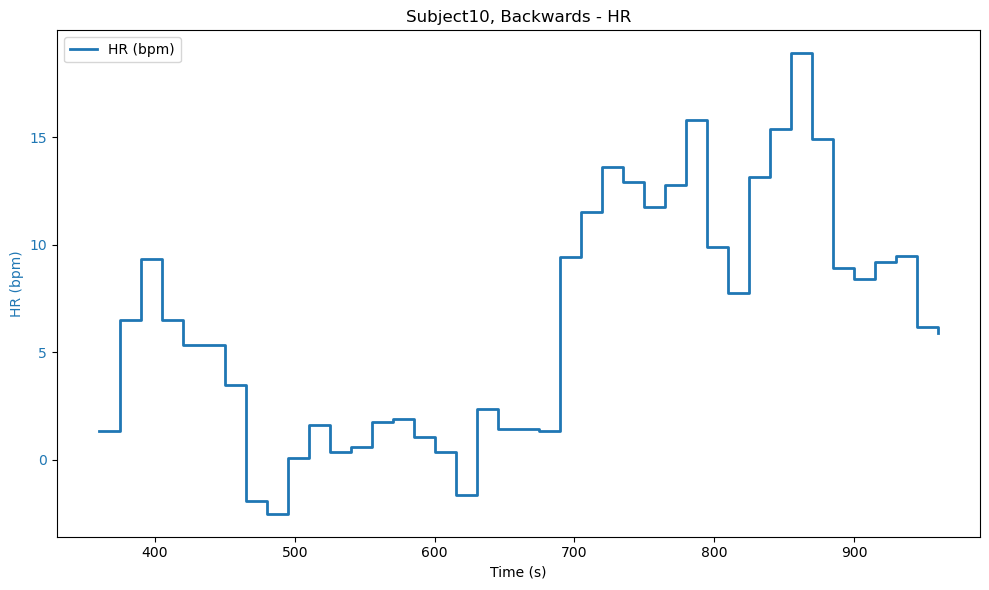

Subject10 Cycling
-----------
Standing Average HR: 94.88135593220339
HR Points: 80 values
Final dataframe shape: (80, 5)
        HR  Index    Subject Activity  Time
0   7.9758      0  Subject10  Cycling   360
1  13.7853      1  Subject10  Cycling   375
2  23.9758      2  Subject10  Cycling   390
3  25.9758      3  Subject10  Cycling   405
4  24.9758      4  Subject10  Cycling   420


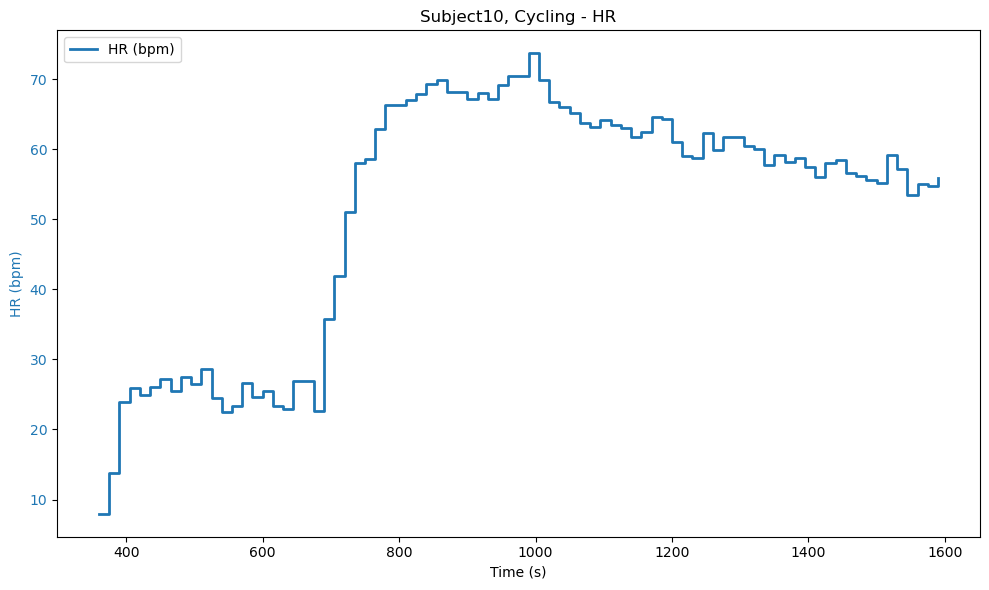

Subject10 Incline
-----------
Standing Average HR: 74.18032786885246
HR Points: 100 values
Final dataframe shape: (100, 5)
        HR  Index    Subject Activity  Time
0   3.4197      0  Subject10  Incline   360
1  16.1530      1  Subject10  Incline   375
2  20.3911      2  Subject10  Incline   390
3  17.0197      3  Subject10  Incline   405
4  18.5340      4  Subject10  Incline   420


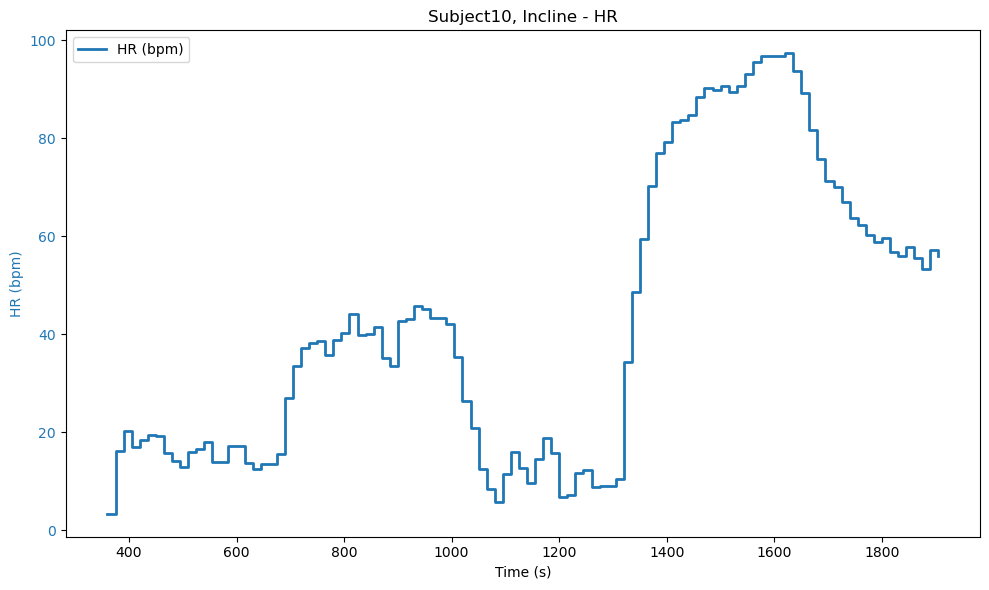

Subject10 Running
-----------
Standing Average HR: 85.38095238095238
HR Points: 20 values
Final dataframe shape: (20, 5)
       HR  Index    Subject Activity  Time
0  4.4524      0  Subject10  Running   360
1  8.4762      1  Subject10  Running   375
2  7.1190      2  Subject10  Running   390
3  8.1905      3  Subject10  Running   405
4  9.9524      4  Subject10  Running   420


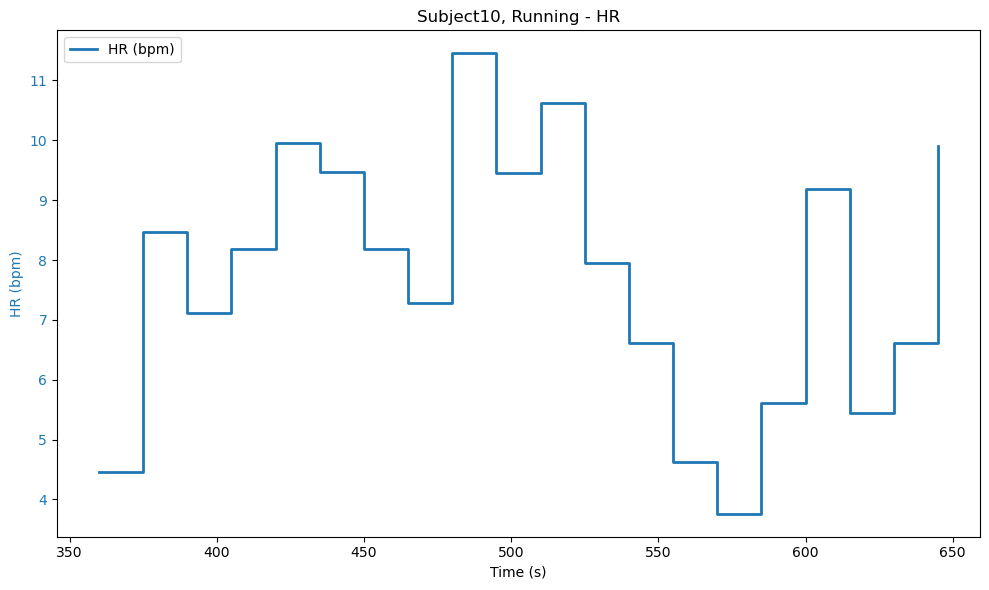

Subject10 Stairs
-----------
Standing Average HR: 105.45454545454545
HR Points: 60 values
Final dataframe shape: (60, 5)
        HR  Index    Subject Activity  Time
0  12.0455      0  Subject10   Stairs   360
1   6.1169      1  Subject10   Stairs   375
2  25.1169      2  Subject10   Stairs   390
3  36.4026      3  Subject10   Stairs   405
4  36.3788      4  Subject10   Stairs   420


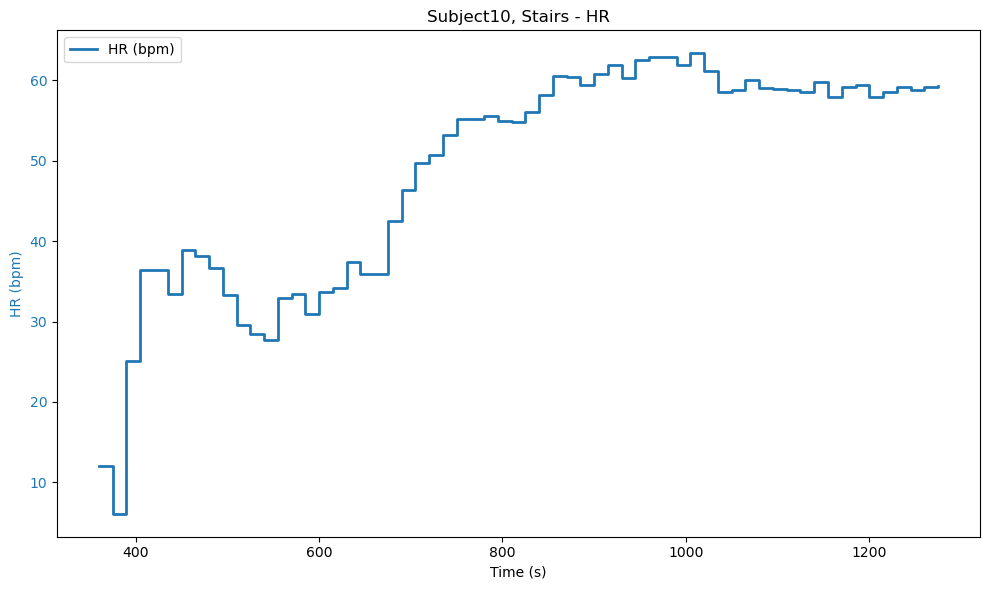

Subject10 Walking
-----------
Standing Average HR: 70.63934426229508
HR Points: 60 values
Final dataframe shape: (60, 5)
        HR  Index    Subject Activity  Time
0   4.3607      0  Subject10  Walking   360
1  11.8607      1  Subject10  Walking   375
2  15.5035      2  Subject10  Walking   390
3  14.0273      3  Subject10  Walking   405
4  12.9321      4  Subject10  Walking   420


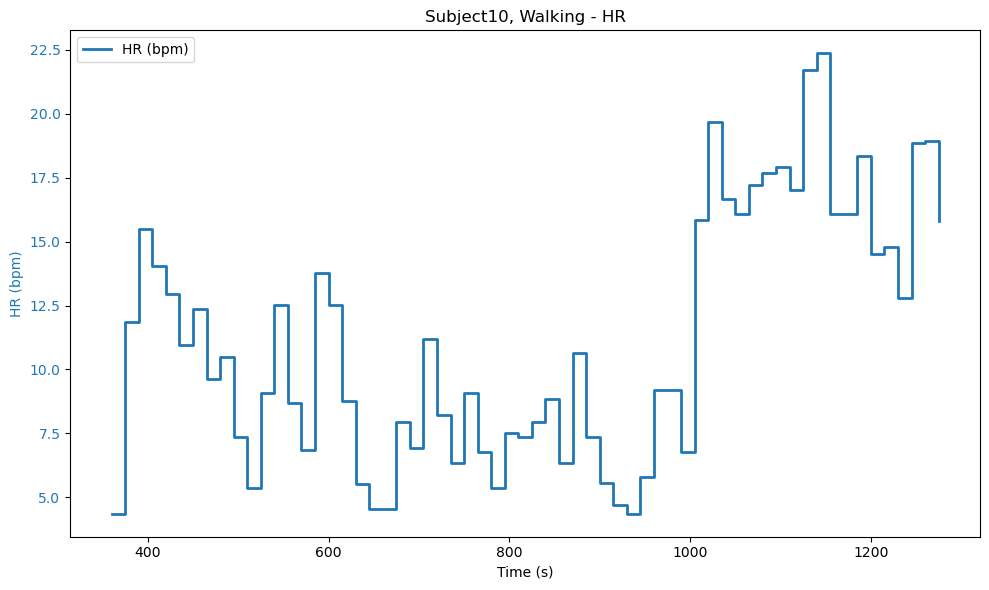


Final combined dataframe shape: (3980, 5)
        HR  Index    Subject   Activity  Time
0   4.2409      0  Subject01  Backwards   360
1  11.4909      1  Subject01  Backwards   375
2  12.8909      2  Subject01  Backwards   390
3  12.4909      3  Subject01  Backwards   405
4  11.4909      4  Subject01  Backwards   420


In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df_list = []

for subject in result.keys():
    hrPoints = []
    eePoints = []
    
    # Get subject dataframe - handle potential missing subjects
    try:
        indDF = globals()[subject[0]].astype(int)
    except KeyError:
        print(f"Warning: {subject[0]} not found in globals, skipping...")
        continue

    # Skip irrelevant activities
    if subject[1] in ['Backwards'] and subject[0] == 'Subject02':
        continue
    if subject[1] in ['Cycling'] and subject[0] == 'Subject05':
        continue
    if subject[1] in ['Backwards2', 'Cycling2']:
        continue

    print(f"{subject[0]} {subject[1]}\n-----------")

    # Extract HR data
    hr = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, 8]
    time_col = result[subject[0]][subject[1]]['Metabolics_System']['Data'][:, 0]
    hr_df = pd.DataFrame(hr, columns=['HR']).fillna(0)

    # Compute standing average HR from minute 3 to 6
    standing_mask = (time_col >= 3 * 60) & (time_col <= 6 * 60)
    standing_avg_hr = hr_df['HR'][standing_mask].mean()
    print("Standing Average HR:", standing_avg_hr)
    
    # Process HR data in 15-second bins
    for i in range(len(indDF[subject[1]]) - 1):
        time_start = int(indDF[subject[1]][i])
        time_end = int(indDF[subject[1]][i + 1])
        data = result[subject[0]][subject[1]]['Metabolics_System']['Data']

        # Each 5-min interval → 20 bins of 15s
        for k in range(20):
            bin_start = int(time_start + k * 15)
            bin_end = int(bin_start + 15)
            
            if bin_end <= time_end:
                # Find indices for time range
                start_mask = data[:, 0] >= bin_start
                end_mask = data[:, 0] < bin_end
                bin_mask = start_mask & end_mask
                
                if np.any(bin_mask):
                    mean_val = round(np.mean(data[bin_mask, 8]) - standing_avg_hr, 4)
                    hrPoints.append(mean_val)
            else:
                break
                
    # Remove NaN values
    hrPoints = [x for x in hrPoints if not np.isnan(x)]
    print(f"HR Points: {len(hrPoints)} values")

    if len(hrPoints) == 0:
        print(f"No HR data for {subject[0]} {subject[1]}, skipping...")
        continue

    # Create aligned dataframe
    min_length = len(hrPoints)
    hrPoints = hrPoints[:min_length]

    hr_eeDF = pd.DataFrame({
        'HR': hrPoints,
        'Index': list(range(min_length)),
        'Subject': [subject[0]] * min_length,
        'Activity': [subject[1]] * min_length,
        # time starts at 360s, then add 15s for each bin
        'Time': [360 + 15 * i + 15 * ((i) // 20) for i in range(min_length)]
    })
        
    print(f"Final dataframe shape: {hr_eeDF.shape}")
    print(hr_eeDF.head())
    df_list.append(hr_eeDF)
    
    # Create visualization
    x = hr_eeDF['Time'].to_list()
    y_hr = hr_eeDF['HR'].to_list()

    fig, ax1 = plt.subplots(figsize=(10, 6))

    color = 'tab:blue'
    ax1.set_xlabel('Time (s)')
    ax1.set_ylabel('HR (bpm)', color=color)
    ax1.step(x, y_hr, where='post', color=color, label='HR (bpm)', linewidth=2)
    ax1.tick_params(axis='y', labelcolor=color)

    title = f"{subject[0]}, {subject[1]} - HR"
    plt.title(title)

    ax1.legend(loc='upper left')

    fig.tight_layout()
    plt.show()

# Combine all dataframes
if df_list:
    final_df = pd.concat(df_list, ignore_index=True)
    print(f"\nFinal combined dataframe shape: {final_df.shape}")
    print(final_df.head())
else:
    print("No data processed successfully.")


In [13]:
pd.set_option('display.max_rows', None)
final_df_r = pd.concat(df_list, ignore_index=True)
print(final_df_r)

           HR  Index    Subject   Activity  Time
0      4.2409      0  Subject01  Backwards   360
1     11.4909      1  Subject01  Backwards   375
2     12.8909      2  Subject01  Backwards   390
3     12.4909      3  Subject01  Backwards   405
4     11.4909      4  Subject01  Backwards   420
5      7.8909      5  Subject01  Backwards   435
6      9.0909      6  Subject01  Backwards   450
7      7.6909      7  Subject01  Backwards   465
8      6.6576      8  Subject01  Backwards   480
9      6.4909      9  Subject01  Backwards   495
10     7.4909     10  Subject01  Backwards   510
11     4.2909     11  Subject01  Backwards   525
12     5.6576     12  Subject01  Backwards   540
13     6.8909     13  Subject01  Backwards   555
14     6.4909     14  Subject01  Backwards   570
15     4.2909     15  Subject01  Backwards   585
16     4.2909     16  Subject01  Backwards   600
17     7.6909     17  Subject01  Backwards   615
18     4.3242     18  Subject01  Backwards   630
19     5.6909     19